In [1]:
import numpy as np

import numpy.fft as npf

import matplotlib

import matplotlib.pyplot as plt

import time

import imagetools.provided as im

%matplotlib notebook

ModuleNotFoundError: No module named 'imagetools'

# Q1

In [68]:
def average_power_spectral_density(x):
    '''
        x is a list of K images (color or grayscale)
    '''
    
    x_hat = [np.abs(npf.fft2(element,axes=(0,1)))**2 for element in x]
    
    # sum over the third dimension if rgb image
    x_hat = [np.sum(element,axis=2) for element in x_hat if element.ndim==3]
    
    # take the average as described in Q1
    average_S = sum(x_hat) / len(x)

    return average_S

# Q2

In [69]:
eagle, plane, sheeps = plt.imread('assets/eagle.png'),plt.imread('assets/plane.png'),plt.imread('assets/sheeps.png')

In [70]:
apsd = average_power_spectral_density([eagle, plane, sheeps])

<IPython.core.display.Javascript object>


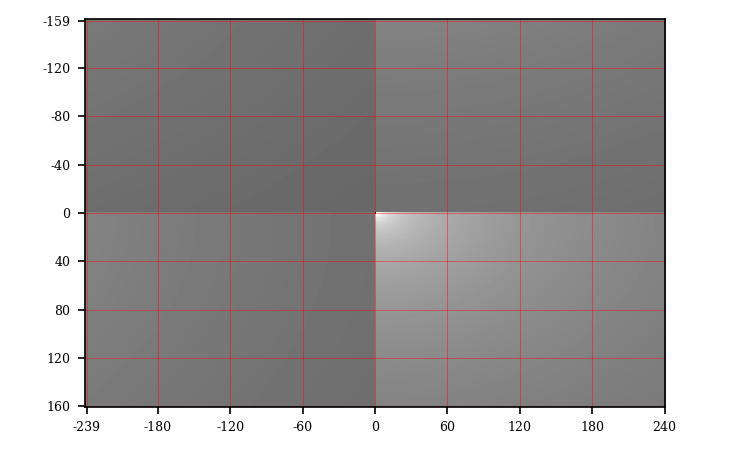

In [71]:
im.showfft(apsd, apply_log=True, vmin=-10, vmax=5)

# Q3

$S_{u,v} = n_{1}n_{2}e^{\beta}\omega^{\alpha}$

$\log{S_{u,v}} = \log{n_{1}} + \log{n_{2}} + \log{e^{\beta}} + \log{\omega^{\alpha}}$

$\log{S_{u,v}} = \log{n_{1}} + \log{n_{2}} + \beta + \alpha \log{\omega}$

$\log{S_{u,v}} - \log{n_{1}} - \log{n_{2}}  =  \alpha \log{\omega} + \beta$

$\text{Let } s_{u,v} = \text{LHS}, t_{u,v} = \log{\omega_{u,v}}$

$\text{then, we have } s_{u,v}  =  \alpha t_{u,v} + \beta$


# Q4

$$\text{Setting } \frac{\partial SSE(\alpha,\beta)}{\partial \alpha} = 0$$

$$
0 = \sum_{u,v} t_{u,v} (\alpha t_{u,v} + \beta - s_{u,v}) \text{     (1) }
$$

$$
0 = \alpha \sum_{u,v} t_{u,v}^2 + \beta \sum_{u,v} t_{u,v} - \sum_{u,v} s_{u,v} t_{u,v} \text{     (1.1) }
$$

$$
\sum_{u,v} s_{u,v} t_{u,v} = \alpha \sum_{u,v} t_{u,v}^2 + \beta \sum_{u,v} t_{u,v} \text{     (1.2) }
$$


$$\text{Setting } \frac{\partial SSE(\alpha,\beta)}{\partial \beta} = 0$$

$$
0 = \sum_{u,v} (\alpha t_{u,v} + \beta - s_{u,v}) \text{     (2) }
$$

$$\text{distributing the sum for equation 2 gives }$$


$$
0 = \alpha \sum_{u,v} t_{u,v} + n_{1} n_{2} \beta - \sum_{u,v} s_{u,v} \text{     (2.1) }
$$

$$
\sum_{u,v} s_{u,v} = \alpha \sum_{u,v} t_{u,v} + n_{1} n_{2} \beta \text{     (2.2) }
$$

We have,

$$\begin{pmatrix} \sum_{u,v} t_{u,v}^2 & \sum_{u,v} t_{u,v}\\\ \sum_{u,v} t_{u,v} & n_{1} n_{2}\end{pmatrix} \begin{pmatrix} \alpha \\ \beta \end{pmatrix} = \begin{pmatrix} \sum_{u,v} s_{u,v} t_{u,v} \\ \sum_{u,v} s_{u,v} \end{pmatrix}$$

$$ \text{Invertible since clearly the determinant is not 0 (since } \omega_{u,v} \text{ is not 0)} $$
$$\begin{pmatrix} \alpha \\ \beta \end{pmatrix} = \frac{1}{n_{1} n_{2} \sum_{u,v} t_{u,v}^2 - (\sum_{u,v} t_{u,v})^2} \begin{pmatrix} n_{1} n_{2} \sum_{u,v} s_{u,v} t_{u,v} - \sum_{u,v} t_{u,v} \sum_{u,v} s_{u,v} \\ \sum_{u,v} t_{u,v}^2 \sum_{u,v} s_{u,v} t_{u,v} - \sum_{u,v} t_{u,v} \sum_{u,v} s_{u,v} \end{pmatrix}$$

## Expressions for alpha and beta

$$ \text{Finally, we have } \alpha \text{ and } \beta \text{ which are kept have many common terms that simplify calculation in the next question} $$
$$ \alpha = \frac{1}{n_{1} n_{2} \sum_{u,v} t_{u,v}^2 - (\sum_{u,v} t_{u,v})^2} (n_{1} n_{2} \sum_{u,v} s_{u,v} t_{u,v} - \sum_{u,v} t_{u,v} \sum_{u,v} s_{u,v}) $$

$$ \beta = \frac{1}{n_{1} n_{2} \sum_{u,v} t_{u,v}^2 - (\sum_{u,v} t_{u,v})^2} (\sum_{u,v} t_{u,v}^2 \sum_{u,v} s_{u,v} t_{u,v} - \sum_{u,v} t_{u,v} \sum_{u,v} s_{u,v})$$

$$ \text{Where } s_{u,v} = \log{S_{u,v}} - \log{n_{1}} - \log{n_{2}} \text{ and } t_{u,v} = \log{\omega_{u,v}} $$

# Q5

In [118]:
def mean_power_spectrum_density(apsd):
    @np.vectorize
    def tuv(u,v):
        if u==0 and v==0:
            return 0
        omega = np.sqrt((u/n1)**2 + (v/n2)**2)
        return np.log(omega)

    @np.vectorize
    def tuv_squared(u,v):
        if u==0 and v==0:
            return 0
        omega = np.sqrt((u/n1)**2 + (v/n2)**2)
        return np.log(omega)**2
    
    @np.vectorize
    def suv(u,v):
        if u==0 and v==0:
            return 0
        print(np.log(apsd[u,v]) - np.log(n1)- np.log(n1))
        print((np.log(apsd[u,v]) - np.log(n1)- np.log(n1)).shape)
        return np.log(apsd[u,v]) - np.log(n1)- np.log(n1)
    
    @np.vectorize
    def create_omegas(u,v):
        if u==0 and v==0:
            return np.inf
        return np.sqrt((u/n1)**2 + (v/n2)**2)
    
    n1,n2 = apsd.shape
    us,vs = np.mgrid[0:n1, 0:n2]

    print(us.shape,vs.shape)
    #calculate omegas array (for multiplying to the end result, mpsd) according to eqn 2 (pg.1) of assignment6
    omegas = create_omegas(us,vs)
                   
    print(omegas.shape)
    denom = n1*n2*np.sum(tuv(us,vs)**2) - np.sum(tuv(us,vs))**2
                          
    sum_sv = np.sum(suv(us,vs))                
    def solve_parameters(lhs_term):
        # helper function due to symmetry between alpha and beta. 
        # returns alpha/beta (i.e. lhs_term should be n1*n2 for alpha)
                          
        lhs = lhs_term
        rhs = np.sum(tuv(us,vs) * sum_sv)
        return (lhs - rhs)

    # calculate alpha,beta according to Q4
    common_term = np.sum(suv(us,vs)*tuv(us,vs))
    alpha = solve_parameters(n1*n2*common_term) / denom
                        
    beta = solve_parameters(np.sum(tuv_squared(us,vs)*common_term) / denom

    mpsd = n1 * n2 * np.exp(beta) * (omegas ** alpha)
    return mpsd, alpha, beta,denom

SyntaxError: invalid syntax (<ipython-input-118-70e0c8bb555c>, line 55)

# Q6
## 

In [119]:
mpsd, alpha, beta,denom = mean_power_spectrum_density(apsd)

(321, 481) (321, 481)
(321, 481)
6.082814737918426
()
6.349103262254147
()
5.3300377432358665
()
4.468472918355676
()
3.560675439614764
()
3.661566208790365
()
4.258644438057791
()
4.329876464290214
()
2.9675594723162444
()
2.9090023414736663
()
3.328937956281994
()
1.5864294726332169
()
2.265461965746649
()
0.884559772551885
()
1.741131389053221
()
0.14213580453439612
()
0.07878764189419307
()
0.8982605044505423
()
0.605904650418081
()
0.673617943641089
()
-0.30481126268954917
()
-1.2932231982247302
()
-0.159593988222257
()
-0.04152055272042787
()
-0.6463998705074232
()
0.007763299221947406
()
-0.8895198802655244
()
-0.6433205480810127
()
0.11131976210527661
()
-1.406572856226143
()
-0.4641218285363369
()
-2.0941996270792096
()
-0.08195181052850842
()
0.25809132315227856
()
-1.9514936960537153
()
-0.4671309276220139
()
-1.7594524825502038
()
-0.5384877390579703
()
-0.4098388713634833
()
-1.3001398686914118
()
-1.2255991076541637
()
-1.899706649919434
()
-2.353394404138758
()
-1.125243

-2.232880418660743
()
-0.8528929753805006
()
-1.8661117331845816
()
-2.673480292016528
()
-3.4145978852255485
()
-2.2190621444713763
()
-1.3245031335856439
()
-2.4605077374548543
()
-2.6939351558309834
()
-2.643792003583238
()
-0.809567468843996
()
-0.9501129810759519
()
-1.6854380497921913
()
-1.7162985526583032
()
-2.638242265318162
()
-0.5275275774269623
()
-0.8309035461692442
()
-1.2528962293409922
()
-0.3182870906189823
()
-0.766714211295433
()
-0.8895775814712668
()
-0.842676847486711
()
-1.5691295840091435
()
0.5861798520447543
()
-0.6165552632483724
()
0.5872458344900195
()
-1.8971521082969467
()
-0.9603822939447131
()
0.12437818483749119
()
1.0079951124147062
()
-0.1962487862728537
()
-0.06611595849201457
()
0.137865735420867
()
1.317429528017275
()
0.2678788138968873
()
1.4503869044445494
()
0.31445529766058655
()
0.6977703367172197
()
1.7450692462044923
()
2.2403490826572696
()
1.7947630517992774
()
2.8260194274584336
()
3.6080690521860213
()
2.9911899810089437
()
2.93929804

()
-3.953788501854995
()
-4.296867148624355
()
-4.374133471808791
()
-4.0748219707031685
()
-4.09625569628547
()
-5.385726441576011
()
-4.321818102290407
()
-3.7803713427951298
()
-3.9845437012374223
()
-4.070284820280897
()
-4.795925628843807
()
-5.649385846978725
()
-3.8515587057338685
()
-5.8109250664567575
()
-4.401095672453117
()
-5.257656060777474
()
-4.33059328950723
()
-4.546013733295609
()
-4.091990217130929
()
-3.9994048755545775
()
-4.690785855873825
()
-5.089924592267282
()
-5.090908029680163
()
-4.492114046002074
()
-4.21740080246907
()
-3.5483852522399584
()
-3.354154900573409
()
-3.5315669421633498
()
-4.697696526966747
()
-4.305306979047499
()
-4.433842251293961
()
-3.1573671573062825
()
-3.219392164898716
()
-4.788920562855959
()
-4.0665964470780365
()
-4.117055567181163
()
-3.8532430675421434
()
-4.591393801739701
()
-3.960591027685094
()
-5.180958648231183
()
-3.5699226039427385
()
-5.174151627343192
()
-5.296390250833119
()
-4.024243540287526
()
-4.116671347014696
(

-2.704057873110287
()
-3.353805024457637
()
-5.067400771924739
()
-3.7664697786493972
()
-2.5754615795077154
()
-2.6804279341903996
()
-2.8593443759487354
()
-3.559956341936304
()
-2.5826579357163517
()
-2.968644867085205
()
-2.9595385083224404
()
-2.1067229177621236
()
-3.310118113338053
()
-2.790308256649711
()
-2.598461443895088
()
-3.54500486804755
()
-1.5265813193041708
()
-2.229537549880334
()
-1.6777252582765616
()
-1.8001101344150872
()
-2.26430839443462
()
-1.1549838239262549
()
-1.5226955762412668
()
-1.8723633851343493
()
-1.2857229615950487
()
-3.3555498265624433
()
-2.8336199097223105
()
-2.5753767250159907
()
-2.3832552075834403
()
-1.855440396846852
()
-2.030588126544986
()
-2.199538702046153
()
-1.8911610920799138
()
-2.5593589734347493
()
-1.932049312770232
()
-1.3165682985804459
()
-2.3491707941974926
()
-1.0914168927488195
()
-2.040709632193833
()
-2.8383849324721595
()
-0.8759608219267783
()
-1.8876814989625572
()
-1.3248326699869732
()
-1.9757962065862653
()
-1.305

-7.72126233454572
()
-6.841018702726966
()
-5.694294443772676
()
-7.025260700582977
()
-6.923310985524643
()
-7.029229255067415
()
-4.913475915312928
()
-5.936244315203591
()
-6.120600296827493
()
-5.906086515761782
()
-6.496675978630617
()
-6.5788996825606505
()
-7.719124766065848
()
-5.675249948512687
()
-6.212962017895169
()
-6.6356068895272795
()
-5.775349725397394
()
-6.147269065220397
()
-5.176703786492123
()
-5.864118270368933
()
-5.956887459067433
()
-6.15357200039362
()
-6.640038799437139
()
-5.569228297727221
()
-6.0921615078662805
()
-5.887086091366256
()
-7.205172190626164
()
-6.455617547376927
()
-5.534162413029445
()
-5.699414548235927
()
-6.0482970208776665
()
-5.805112525780806
()
-5.493034717524423
()
-6.892197038830757
()
-5.54615796246052
()
-5.736240585330102
()
-7.668017811696114
()
-6.44530126210516
()
-6.093527150406954
()
-7.105474488985908
()
-6.619839644216037
()
-5.768966010939424
()
-6.222973402088576
()
-6.472328747633916
()
-6.187771908018257
()
-5.4424730

()
-2.9292797798430783
()
-3.5641683058064935
()
-3.743051632313275
()
-2.7237591299148978
()
-4.034592942307009
()
-3.1829580111938327
()
-3.755246666562262
()
-3.832163678284057
()
-4.11151825004451
()
-3.9752913988936713
()
-4.260058311417182
()
-4.05492089836118
()
-3.411421102376666
()
-3.6352234081880264
()
-4.744180181803362
()
-3.9103605368027186
()
-3.1389308977640464
()
-3.5553663936233404
()
-4.572299904669677
()
-4.728283883386443
()
-4.033658150875613
()
-4.154408225685765
()
-3.683461962113576
()
-4.386475463129757
()
-3.744728054456032
()
-4.954208726737671
()
-4.594608809381433
()
-4.485250340405745
()
-5.108663615526081
()
-4.840110201875282
()
-4.1400524682869735
()
-4.170329390410129
()
-4.41320405346617
()
-4.120788314564042
()
-4.213006842526726
()
-4.353760123063981
()
-4.05184570111347
()
-4.648581522130772
()
-4.807085368263762
()
-4.306838792269073
()
-4.052160030098238
()
-4.335561308732525
()
-4.230039275882873
()
-4.581898552043534
()
-4.651806578014831
()
-

-3.926359725302584
()
-5.817671719290045
()
-4.409081580170169
()
-5.084058913021831
()
-4.101095561911043
()
-5.486370535018108
()
-4.870894856843717
()
-5.127638514473616
()
-5.007020130977204
()
-4.400223729005262
()
-4.650714862863679
()
-3.8092800417946915
()
-5.247945817991439
()
-3.948795795485152
()
-3.4222939581370753
()
-4.146407150917354
()
-5.774035896057616
()
-3.6624799532410597
()
-4.712404798547646
()
-3.4844134498555714
()
-4.218260211855014
()
-4.287888288276402
()
-4.479449972899244
()
-4.516600469239522
()
-4.564663549659066
()
-4.250034978241783
()
-4.099060007191987
()
-4.015549863213585
()
-4.071859829200072
()
-4.921454301960154
()
-4.530721363301148
()
-4.69247848737006
()
-3.777819190430381
()
-3.678320763626883
()
-4.573809610514347
()
-3.882658888424783
()
-5.483377299222471
()
-4.354878227333141
()
-3.3866825277558092
()
-4.081532707869493
()
-3.830600005052135
()
-3.515942697929548
()
-4.358004747075316
()
-4.619101691719763
()
-2.8923538290578
()
-3.73105

1.4350062721407681
()
-1.1206289247128307
()
0.4197710178809153
()
-1.3073720558045423
()
0.03945649744221669
()
-1.2900547250993846
()
1.0698200253525751
()
0.3899652577021513
()
0.28357632072212446
()
1.040434470066252
()
0.6015225953573697
()
1.6236171090153988
()
0.7516171317661513
()
0.5287531852193492
()
-1.0998927817615822
()
0.7999922791642113
()
0.431148009350224
()
1.031579935806736
()
0.20225561400951975
()
-0.6557311553596339
()
-0.33258919639951756
()
0.24436234847644478
()
0.6696288297231838
()
-0.0880698224434262
()
-0.38517114125912677
()
-0.08420996485581256
()
0.10238271334852023
()
0.19409850930480133
()
-0.8508153144511024
()
-0.1641889049050853
()
-0.5269416414587216
()
-1.9281789744384898
()
-0.7706841538828133
()
-1.1350285514761271
()
-1.763783923635609
()
-1.0778681540083088
()
-1.038219318591107
()
-0.9185576486420324
()
-0.9361495661553914
()
0.2415309617947905
()
-0.6392301547005719
()
-1.2762562973916776
()
-1.3789100279844106
()
-1.3369981276488083
()
-0.6

()
-5.011671359199107
()
-4.476927010845039
()
-5.699466187858778
()
-3.901938049508983
()
-4.400062466163245
()
-6.339504989943936
()
-4.9065408752858355
()
-5.089192011029729
()
-4.242067849968266
()
-4.523801387359168
()
-5.832922274532159
()
-4.595574608111157
()
-6.098130908144664
()
-4.4783921229339425
()
-4.906149128713653
()
-6.864962910597815
()
-4.586754711759945
()
-6.511053053625374
()
-5.0487447155346095
()
-5.161371479963498
()
-5.912059410140356
()
-7.020967345290973
()
-5.5713213685015575
()
-5.925313798020178
()
-6.12271528034414
()
-4.4875527094012
()
-6.491988128786415
()
-4.914871453087474
()
-6.2714077579486025
()
-4.811959404876743
()
-5.77660307520955
()
-4.947881018100761
()
-6.503448085260278
()
-6.053845097046441
()
-7.496847513783917
()
-5.418407135942183
()
-4.93267079283584
()
-6.326571751220117
()
-5.5882562956313135
()
-6.360394356306419
()
-5.50034937235279
()
-5.622769326949524
()
-6.151455170906942
()
-5.551036943533258
()
-5.42062848239004
()
-5.21022

-4.222382389761005
()
-3.9223569493196155
()
-3.0591798109895763
()
-5.077638518209186
()
-2.3011200910467
()
-3.402970401904115
()
-3.027652430359275
()
-2.3225040253346947
()
-3.2556756068574764
()
-1.998788296449911
()
-3.1997563549760635
()
-2.7708359819103947
()
-2.9718745898043046
()
-2.2179601800527458
()
-2.0811776806271975
()
-2.6809416902613137
()
-2.320474675503604
()
-3.4589814349869332
()
-2.220182751738749
()
-2.6881879115632312
()
-3.338423069118882
()
-2.489972522614547
()
-3.3156855423909235
()
-1.9749397066504724
()
-2.9792080036866704
()
-2.419788708617901
()
-2.594295985171371
()
-2.156552400431405
()
-1.7537743694861998
()
-2.2003669522479896
()
-1.8204856652573476
()
-2.293192597213352
()
-2.731846183979032
()
-2.15134857084451
()
-2.19373485408326
()
-2.00704579433477
()
-2.471940606480949
()
-1.3757993442863246
()
-1.904876276708885
()
-2.2431238334005457
()
-1.0896169909548092
()
-2.5650079962965098
()
-2.019042995102714
()
-3.2520073233251896
()
-1.97687536850

-4.92149569865212
()
-5.472788496289656
()
-4.164777299200997
()
-4.2478187487487755
()
-3.704333864538299
()
-4.342635901130719
()
-4.693684476877273
()
-5.467792607120944
()
-5.686958378038874
()
-5.662056623484691
()
-4.3624518157853025
()
-5.54205889974998
()
-4.411169503337206
()
-4.734127507556546
()
-6.614564647374587
()
-4.151195016551201
()
-4.15434182618098
()
-5.355242987270594
()
-6.209672318602792
()
-4.876576556288181
()
-5.3935294188115215
()
-4.865597865893712
()
-5.61180541418899
()
-6.26382943551062
()
-5.600894061169099
()
-5.9131220094187364
()
-5.552272413929015
()
-5.315867142445024
()
-5.1555900274877295
()
-4.9425036881028435
()
-5.194882999912108
()
-4.445211074782492
()
-6.407607917155872
()
-5.23342231473562
()
-4.8111338814006155
()
-5.410791626064417
()
-5.109136394239569
()
-4.493012232883186
()
-4.818635170962111
()
-4.986187094442866
()
-5.060898751494519
()
-5.807044232816088
()
-5.259744543383325
()
-6.919036433575345
()
-6.678174286619118
()
-6.334629

()
-6.254526306936547
()
-5.165399426647322
()
-7.0349785798750055
()
-7.18070681910827
()
-6.8490600006294695
()
-5.139571590961445
()
-5.826447122143145
()
-6.602307928535939
()
-5.137642034385006
()
-5.931991468372943
()
-5.940833819431605
()
-5.006320718242454
()
-5.468914487696972
()
-6.808994944507949
()
-5.537035884178916
()
-5.576752038556206
()
-4.59056097494275
()
-5.045191482616219
()
-5.004896597643487
()
-5.563562021278622
()
-4.536377670477636
()
-4.519202010714728
()
-6.642203085602631
()
-6.109885569815689
()
-5.735878148841664
()
-5.182082461206927
()
-5.244674412456325
()
-5.661764238268638
()
-4.553163618515077
()
-5.752946197428571
()
-6.031431715542737
()
-5.364337092615283
()
-4.9460935795395455
()
-5.302939260387932
()
-5.342093061789463
()
-5.280418291377812
()
-5.323112895181326
()
-5.159455232433532
()
-4.874653346915907
()
-5.481586944646043
()
-5.682859542648324
()
-4.998999255652552
()
-5.159407486928447
()
-4.4112130959974
()
-4.48024264091369
()
-5.315889

()
-5.97078032474975
()
-5.419749863702634
()
-5.630327814382889
()
-5.904419562589201
()
-7.236637343466977
()
-5.8665798224274655
()
-6.243604417144218
()
-6.115031340136476
()
-5.497853873631045
()
-4.918182312122218
()
-5.988137338339984
()
-5.115360966610088
()
-6.34921157332794
()
-5.477491180953752
()
-4.78382067280803
()
-6.052041225560891
()
-5.072238737667383
()
-5.473550553911152
()
-5.830494649237617
()
-5.313432560373272
()
-6.4227774250926295
()
-5.652265432393962
()
-7.564145991526821
()
-5.61439426665344
()
-4.862761428194647
()
-6.134705737855929
()
-5.6593761759760435
()
-5.276071525207196
()
-5.197972790158616
()
-4.832684733738253
()
-5.126932373241066
()
-5.7572127195923395
()
-5.602395275055473
()
-6.294431396723541
()
-4.853695455397576
()
-5.845449599694762
()
-6.067257883721916
()
-5.369730377831769
()
-4.741517345408327
()
-4.926861357966339
()
-4.425688158137449
()
-5.975373850192873
()
-4.52001164070022
()
-4.866702043430938
()
-4.801668688559645
()
-5.21735

()
-2.2900951775400884
()
-3.635052349470782
()
-3.3035405402837164
()
-3.305268350668973
()
-2.9333533258482234
()
-3.4583784172965064
()
-2.581069577845577
()
-3.134948535301019
()
-2.723782635582598
()
-2.5693397619458764
()
-4.181690114007267
()
-2.6830686866853757
()
-2.8585349234850046
()
-2.271697553355036
()
-1.9494595918890028
()
-2.527565615430948
()
-2.7236103749192857
()
-2.1385316065039692
()
-2.2809476647032163
()
-1.5252461322921107
()
-1.6175789728074204
()
-0.9930981921347364
()
-1.9340578779754019
()
-1.4271667624188336
()
-1.7271371792680803
()
-1.80217677219499
()
-1.2248337128808178
()
-2.023170490136481
()
-1.4719857798957907
()
-2.8197204067048744
()
-1.5110482816629514
()
-0.5239587970870669
()
-1.8495837152811312
()
-1.1301156827742407
()
-1.0809265335077392
()
-1.087665681728888
()
-2.0781118792670927
()
-1.8578586651393465
()
-0.5287848942136453
()
-0.7543180317413274
()
-0.644992931904314
()
-2.2094584637784997
()
-0.4932984415441286
()
-2.366596765736473
()

()
-1.3502801895752174
()
-1.7045075971114603
()
-2.0626977946707505
()
-1.5691787923558458
()
-2.137486709093446
()
-1.405558817892171
()
-0.9018360047902974
()
-2.1064656729824467
()
-2.9907489754502734
()
-3.690913571703959
()
-1.5117369991145004
()
-3.3529514765650568
()
-1.8967940523720817
()
-2.255021579107586
()
-2.0807014773081356
()
-4.23617356333367
()
-2.174981780255136
()
-2.5163489898612585
()
-2.2840193369018245
()
-1.807036219756803
()
-2.4158385675410656
()
-1.4331917117120287
()
-3.079000405406873
()
-2.4592377899710165
()
-3.322496859917786
()
-2.3321679055172986
()
-2.2535041381436667
()
-1.8422394681626955
()
-3.0339256310040366
()
-2.4646266834499198
()
-2.4187591932003603
()
-4.233320730586262
()
-2.549862205296588
()
-3.368618269614487
()
-2.5422666799320854
()
-1.5200690422182905
()
-2.458705141850812
()
-1.6946783308038071
()
-1.7490833306505316
()
-1.5702065090189876
()
-2.922256772333922
()
-2.95636123215775
()
-2.1655988955034804
()
-1.802398594964549
()
-3.

()
-5.642161686755044
()
-5.593755225629862
()
-6.1418911210372436
()
-4.3996001427905185
()
-5.177037598552872
()
-5.327660418957169
()
-5.942574214935445
()
-5.622503990808298
()
-4.362233031480771
()
-5.374788532892825
()
-5.111571068621687
()
-5.312006676371605
()
-4.82046200871591
()
-6.306892851493339
()
-4.518353913666073
()
-5.362388545420832
()
-5.668645882537481
()
-5.1813291276468405
()
-5.0342118180031665
()
-5.186889735819141
()
-5.179008586073597
()
-5.116461155237587
()
-4.487401286647602
()
-5.350406497014274
()
-5.994776263614461
()
-5.302358160283019
()
-4.500417397748157
()
-6.339586246065413
()
-5.213193584669119
()
-5.500970827379241
()
-4.424622728641447
()
-5.145256918562353
()
-4.359384557639295
()
-4.464295356304457
()
-5.541186085244762
()
-5.027836262251207
()
-5.954431641954398
()
-5.049966402190451
()
-4.733710655546769
()
-4.273959490618748
()
-4.682060436269889
()
-4.510501968275054
()
-4.189307607708003
()
-6.795023246530614
()
-6.014556490164021
()
-4.2

()
-4.89297198768146
()
-6.687969191594796
()
-5.817459324707649
()
-5.387981211696788
()
-5.855415432076844
()
-6.775044324417713
()
-4.647021661911173
()
-5.045193390669557
()
-5.115747524381154
()
-5.544164661048758
()
-5.215225556044387
()
-5.357557290772899
()
-4.905619525785684
()
-5.894425743417059
()
-5.1528064910363485
()
-5.096505069606075
()
-6.182656269580022
()
-6.859469263132099
()
-7.494962590794854
()
-6.582118947727005
()
-5.017867867291374
()
-5.06298801623963
()
-4.944871810713526
()
-6.012041982672792
()
-5.8328765100328175
()
-4.938201771837643
()
-5.4241307459627155
()
-4.3635243352428255
()
-5.525500044620284
()
-4.872585590020641
()
-5.093543056351554
()
-4.898621497001734
()
-4.945742962691682
()
-5.220490436706825
()
-4.8131435732435754
()
-5.040695986814476
()
-4.8341528533181926
()
-5.730126204214365
()
-5.31698371969209
()
-4.751817647684094
()
-3.8657750535218174
()
-5.125438445675106
()
-6.055375249413849
()
-4.661173928953687
()
-5.002701627187337
()
-6.

()
-5.289982541081462
()
-4.794449945354715
()
-4.937140369713499
()
-6.628237750217044
()
-4.3673832693317065
()
-5.569092579989591
()
-5.110851362242711
()
-5.469426897365125
()
-3.595310987002506
()
-5.261791022768798
()
-4.507982670369098
()
-5.306031093470971
()
-3.970352308376956
()
-4.74552765242031
()
-5.160266729185402
()
-4.526156042193172
()
-5.341896488472144
()
-5.972301064984927
()
-4.510305987368358
()
-4.118030537238919
()
-5.147193928528613
()
-4.372201633432918
()
-3.994723533955752
()
-4.954285471263012
()
-3.971707759530781
()
-5.729031049936958
()
-3.5197010983745916
()
-4.574566934926887
()
-5.215109886189362
()
-4.111753389573537
()
-3.8080679260183974
()
-5.146068755119534
()
-5.2250250174831505
()
-3.510655611774556
()
-4.473416617611364
()
-3.559852239422254
()
-4.453653679903615
()
-4.172473671361715
()
-4.243659653637181
()
-4.039075394243058
()
-3.9719687700784254
()
-3.753741180004303
()
-3.650463700006772
()
-3.2756737798150777
()
-3.362604694755463
()
-3

()
-2.6744382627541725
()
-3.322691285655484
()
-2.3481995040445174
()
-2.1133973485560613
()
-1.9905235293419548
()
-3.4933130424665144
()
-2.139823915495514
()
-2.1438954000488497
()
-2.2419865554324847
()
-2.0117764218549326
()
-3.669595030276219
()
-2.016957821751065
()
-3.5823835755020346
()
-2.2015464584545494
()
-3.8620531512800937
()
-3.6982381621548077
()
-1.5466015511619542
()
-2.49814098731917
()
-2.4789316540740955
()
-3.3483282311509406
()
-3.9116343455197446
()
-2.698419433524995
()
-3.0814280127752145
()
-3.1842840324604555
()
-2.7626823387303237
()
-2.369966026284594
()
-2.4435574576492893
()
-2.9474384398428786
()
-3.228871558750832
()
-3.8859967380505376
()
-3.026853488646097
()
-2.1781795041013012
()
-2.0938575615387673
()
-2.7974157154621366
()
-3.2129655973781652
()
-3.6872833003105514
()
-3.409378641048731
()
-3.42257507943785
()
-3.3875585217299964
()
-3.4465071142127037
()
-3.5219847547919034
()
-2.8959282774585855
()
-4.250119633162555
()
-3.286977285360674
()


()
-5.9162398833588306
()
-5.4958353216213025
()
-7.254014805148737
()
-6.096563036580076
()
-5.020599285133434
()
-5.697182632288418
()
-5.385054626956655
()
-6.002511999911602
()
-5.459033769166546
()
-6.436246899066712
()
-6.927996004950896
()
-6.172734090990163
()
-5.872710637762102
()
-4.877089231484589
()
-4.883674085279465
()
-5.843222980532754
()
-7.244752826537971
()
-6.035096370076792
()
-5.482419640709491
()
-5.158020541281305
()
-5.18318563047845
()
-6.46381835057053
()
-6.6815376362539265
()
-5.798437284809033
()
-5.9092007206810955
()
-4.894029684755088
()
-6.086650765676189
()
-6.096040347299581
()
-5.994763169637873
()
-6.083744729143463
()
-6.11955793270743
()
-5.747595221099464
()
-5.955920084923114
()
-5.887601556190828
()
-6.165638673945064
()
-7.117981803408385
()
-6.636711397059832
()
-5.991164733102594
()
-6.730083888323875
()
-5.400723079228508
()
-6.37099374397134
()
-7.0039106022803095
()
-5.927393473758282
()
-6.341441068526264
()
-5.441574112635676
()
-6.261

()
-2.0732253433539753
()
-2.276482415155689
()
-2.9776810197175774
()
-2.670626421674335
()
-2.5189184943490996
()
-3.2810569423635556
()
-3.0727655912003
()
-1.9756834143490174
()
-1.7105169305536538
()
-2.2380605674946903
()
-2.6362710160635796
()
-2.067188990466935
()
-2.3821722672936883
()
-2.261249091754724
()
-2.6844689397712074
()
-2.510015876419235
()
-1.828927737799102
()
-2.2855170074903164
()
-2.7113786816030228
()
-2.9526378596188536
()
-3.1621751638953484
()
-2.2841427282729363
()
-2.4248917428486667
()
-1.9003240841260904
()
-2.703893042625447
()
-2.2858718267347005
()
-2.354675826781298
()
-3.6412924950655574
()
-2.580234777666071
()
-2.9150304879310216
()
-1.8798211433849303
()
-1.9895689370866254
()
-2.520477097365907
()
-2.6706502305340596
()
-2.8342665262979736
()
-2.694874425429111
()
-2.3885397912557753
()
-2.3909427427778915
()
-3.397338637924829
()
-2.486077470240744
()
-3.7249507852699297
()
-2.564849148081896
()
-3.9302015119517772
()
-2.9738108231452838
()
-3

()
-3.7345741253946727
()
-4.661219311406072
()
-3.5585707284306176
()
-4.524244055029356
()
-3.4304331935529575
()
-4.333302941184211
()
-4.254733941963726
()
-4.353353096641547
()
-4.0791118489861695
()
-4.7789580394648254
()
-3.630823594519356
()
-4.3414384626927385
()
-4.117407521008199
()
-3.9745678980473462
()
-4.065781065503457
()
-4.505848803868041
()
-4.217283964200317
()
-4.0732099303523155
()
-3.831309562074102
()
-4.432658242270721
()
-4.3075339740459455
()
-3.9187079997789844
()
-3.928783517400568
()
-5.2274954100714
()
-3.1917171366909702
()
-2.9247589418264344
()
-3.0102738952911157
()
-3.36231358682633
()
-4.303895139358251
()
-3.3592638872821645
()
-4.066018863214374
()
-3.268450773714603
()
-2.9333111052762995
()
-3.121399739862996
()
-3.3748471187058477
()
-3.341625935093324
()
-4.99525637615687
()
-3.0752133673952944
()
-3.8047733608432512
()
-2.8802609072713654
()
-4.148784478531635
()
-3.1303472836865893
()
-2.4460136546801063
()
-3.5988055527032934
()
-4.16527130

-5.031051798463339
()
-4.1542851008657475
()
-4.8140247804549485
()
-4.2136384223931245
()
-3.767622489116901
()
-4.259646834690118
()
-4.442078114874559
()
-3.624454869546862
()
-3.8474846215323817
()
-4.536027056290721
()
-4.462437728280986
()
-3.0610056655390583
()
-4.850971054509925
()
-3.823047617123727
()
-4.835819008117343
()
-4.066538177642291
()
-3.285824662070274
()
-4.721301427639523
()
-3.051601217178119
()
-3.8135176806102287
()
-3.0148059990562466
()
-2.6334779408684614
()
-3.647974966201483
()
-3.0273601836243618
()
-3.2762200395497523
()
-3.360341169944334
()
-3.9017786302135082
()
-4.048136864949955
()
-3.2669803728805817
()
-3.5491121188682353
()
-2.8854068891925504
()
-3.3077452485275067
()
-2.731815160129335
()
-2.7911355531801387
()
-3.5272095148729044
()
-4.5187102586268875
()
-2.7703542433440322
()
-4.061080792702805
()
-3.522982174441516
()
-4.538807237041518
()
-3.377810541421219
()
-4.277699237401594
()
-2.519925171117583
()
-3.0514831783846468
()
-3.565207605

-2.125369874977892
()
-2.3947324215748864
()
-2.53455741146953
()
-2.9851797932739608
()
-2.8768812559564
()
-1.9390217497085445
()
-3.7520799453369635
()
-2.302656853450088
()
-4.7340535953247
()
-2.971763721659377
()
-2.145753086693386
()
-3.0050511095843415
()
-2.0888066354768196
()
-3.0899049147459134
()
-2.571740839194833
()
-2.7693484830324397
()
-1.9334073008336041
()
-2.236910775724885
()
-2.4675853485971775
()
-2.0812070924835506
()
-2.8187783773090054
()
-2.1807307626797936
()
-2.9744474291234546
()
-1.858640503991614
()
-2.3295951717439785
()
-1.8305474290540982
()
-4.297574967266255
()
-2.0074161810442703
()
-2.8189850398926595
()
-2.8492104682732897
()
-2.0625772142156737
()
-2.376207043075876
()
-3.740488746457782
()
-2.5237939514823644
()
-2.0021645716572465
()
-1.7340192577808704
()
-3.4846506663474646
()
-3.5876186452971295
()
-3.7831412005877247
()
-3.140390208925739
()
-2.6097530530382045
()
-2.8664799819495688
()
-2.3327614922275313
()
-4.573869474284069
()
-3.08168

()
-4.262975329795048
()
-4.10691864957289
()
-3.5638208877725512
()
-4.783180059980449
()
-5.2709028396632105
()
-4.911545519982473
()
-5.248529090889712
()
-4.552948297854718
()
-3.891511154906482
()
-4.323051853510252
()
-4.500561640890526
()
-3.9855721837412084
()
-4.000333442515578
()
-4.40857819116873
()
-4.130109467203815
()
-3.889474657481765
()
-3.038469147029957
()
-2.9820291384875617
()
-3.9505572720645254
()
-3.417258408675746
()
-2.6621757946209623
()
-3.206384770654319
()
-2.438126770651623
()
-3.4143232363923044
()
-4.649627687853522
()
-3.2663947598700798
()
-3.061106630690107
()
-2.962540911384778
()
-3.364211242759197
()
-3.550390728543989
()
-2.9623891181640154
()
-3.960802894327319
()
-4.274869927934211
()
-3.664927440223148
()
-4.176690178659338
()
-2.9071136564857696
()
-2.5108013054638025
()
-2.4654220021825743
()
-3.198926043184178
()
-2.3587931691086883
()
-2.1414669867029286
()
-2.1912736235742525
()
-2.8957459123956326
()
-3.656534526535533
()
-3.615738143076

()
-3.2105502069391
()
-3.5324160335406223
()
-2.689878911251334
()
-3.6734394602349045
()
-2.553626071603569
()
-2.936111430896867
()
-2.715043992455689
()
-3.3323352774877097
()
-3.827066216903755
()
-3.973174146995931
()
-4.180794580785849
()
-3.8932015502211197
()
-4.010544178039465
()
-3.7070360955242148
()
-3.335594357475255
()
-3.7421814809247023
()
-4.521895714384335
()
-3.4301042827132058
()
-3.5880060800338276
()
-3.7852173229135264
()
-3.6732851248210627
()
-3.5778089696438427
()
-4.617909689571678
()
-2.859056427374373
()
-5.338407650946147
()
-3.850951766206583
()
-5.425079558155551
()
-3.1150666249012353
()
-3.868943347154527
()
-3.71546958289595
()
-3.420801060612817
()
-5.19632028946413
()
-3.9536122769120237
()
-4.87569414861897
()
-3.555481879501148
()
-3.4282097078181977
()
-3.38881141523923
()
-3.971613922740721
()
-3.649467700362785
()
-4.006262810592041
()
-3.389484196985908
()
-5.968553708364031
()
-4.313216770789724
()
-3.8622346612155205
()
-5.546306938658738
(

-3.949706487987231
()
-4.7822826272906696
()
-4.372172609296885
()
-5.364937343277181
()
-5.951699575935624
()
-5.125265445364955
()
-5.7658449277740855
()
-3.6280524718156952
()
-4.266560056319898
()
-5.604796428663867
()
-4.272910680263168
()
-3.6675609852652586
()
-4.185419791498008
()
-5.110592619409155
()
-4.294791185810916
()
-5.204796567983427
()
-2.9046488032444486
()
-3.875132591666527
()
-5.141838218616638
()
-3.9865988379762687
()
-4.060986367817207
()
-4.345211582157735
()
-3.9906656842580093
()
-4.520634142367293
()
-3.883564679230574
()
-3.4602315247291013
()
-3.0108187011850305
()
-3.4372634534753104
()
-4.446079142116756
()
-4.286837820243918
()
-3.703582285377288
()
-4.242633714883893
()
-3.3100314106630453
()
-3.9533215126656396
()
-4.507591802360831
()
-3.600790025450012
()
-4.696228776586763
()
-3.8427887535100993
()
-4.7698590953126665
()
-3.9037192148204056
()
-3.9529562869685817
()
-4.512201838880375
()
-4.371344452408409
()
-3.994665714832709
()
-2.9930428835319

()
-5.449823668507748
()
-5.602145902854551
()
-6.040360137028623
()
-7.117209437569071
()
-5.991795573327418
()
-5.926006868262826
()
-7.376849930221213
()
-6.061615550021513
()
-6.971618676167135
()
-6.964152653158927
()
-7.5432497175191475
()
-6.833506759808223
()
-5.40898660865715
()
-6.219946710664451
()
-5.489334459194837
()
-5.436133793698459
()
-7.36172055199643
()
-6.378668240593516
()
-6.025544325947441
()
-5.814041213371076
()
-6.383099028520975
()
-6.21199409142471
()
-5.46141422329906
()
-7.0585670058963625
()
-5.360551021173685
()
-6.375485525183204
()
-4.570090966352028
()
-6.173052728390844
()
-5.760203536586856
()
-5.448129029410252
()
-6.394736760596848
()
-6.14168400564967
()
-5.311463972058576
()
-5.33200153442246
()
-6.391651941889015
()
-5.5150653236404965
()
-7.092254413722715
()
-5.8612509409293185
()
-5.879646561661529
()
-5.360916121612038
()
-5.768729312525767
()
-6.16799488970965
()
-5.967095783202366
()
-5.147221470202864
()
-5.8257048139609795
()
-5.631591

-6.719662891534893
()
-6.578125883960885
()
-6.444403233890734
()
-5.695730489564952
()
-7.083964128433041
()
-6.098638789027868
()
-5.386683591989296
()
-5.522761218186361
()
-5.8944794512547345
()
-4.651334678173119
()
-5.320310251691967
()
-6.724187075465772
()
-5.72976324587458
()
-6.438477256840992
()
-5.943066499674952
()
-4.969795911726232
()
-5.2214081902061755
()
-5.85053605229098
()
-5.949363061397478
()
-6.0257691921050744
()
-6.48412397087307
()
-6.144663458684218
()
-5.384277449080042
()
-6.835682536199832
()
-5.621628931672964
()
-5.570551263357174
()
-5.153557882711849
()
-5.778234264019733
()
-5.696899964176427
()
-5.87392833572494
()
-5.628055989474978
()
-5.644138926720949
()
-6.402342254716683
()
-5.453902350386487
()
-5.129801554856078
()
-4.743442921068265
()
-5.939866876270963
()
-5.834123943084205
()
-5.6014802583083245
()
-7.532850358069785
()
-4.975439070130318
()
-5.471631882549262
()
-5.086772849781834
()
-7.998993088315723
()
-7.164672957749937
()
-6.2046635

()
-6.120241519276961
()
-6.379301957016091
()
-5.514776553339859
()
-4.732333417503814
()
-7.204170873064703
()
-4.903871553674472
()
-4.571149626161713
()
-4.510952524512031
()
-4.638434660989179
()
-4.055205340709966
()
-6.392275351764096
()
-5.697365203744332
()
-4.466796803641495
()
-4.6892722639573
()
-5.571654919706543
()
-6.266812005108647
()
-5.703222577015818
()
-5.53801440173798
()
-4.540965858329146
()
-4.625584472036373
()
-5.013625306977941
()
-5.70189970527208
()
-5.673958510495904
()
-5.475747445431664
()
-4.46436535613782
()
-4.696324698924928
()
-5.48188853018356
()
-5.184367062129075
()
-6.534775703945898
()
-5.415061256466289
()
-3.993104545210671
()
-4.5377055012912955
()
-4.4913646039512125
()
-4.844741518243633
()
-5.063588077847463
()
-5.233557885436782
()
-5.699156156028383
()
-4.479347122359488
()
-6.083372379155027
()
-4.713215305327157
()
-5.006685865939484
()
-4.524230664338822
()
-4.944496954665136
()
-3.893774681679501
()
-4.517970239797065
()
-4.32620238

()
-2.6042846841036127
()
-3.2957845144995996
()
-2.899503264188324
()
-3.6069237990715877
()
-2.9834594474661404
()
-3.5266935305285223
()
-3.0728489173253255
()
-5.58344304392129
()
-3.2554564687937653
()
-2.1075804582124924
()
-3.0713684477751926
()
-3.4377907176163376
()
-3.562339603926179
()
-2.835458377993614
()
-3.15095212752116
()
-2.9319872412281054
()
-3.949959701449176
()
-2.7575803987308998
()
-3.6155238627574358
()
-3.3968407155130222
()
-3.3190967320331115
()
-2.9680046424164583
()
-4.589180487185997
()
-2.7859113831234215
()
-3.383970407175008
()
-3.427620342880333
()
-3.778014783092754
()
-4.242350443868333
()
-4.1522271884781885
()
-4.545508434172942
()
-3.8131709265785307
()
-3.238316481768331
()
-3.9692033377682314
()
-3.7931853486154825
()
-3.737201407423961
()
-3.5607202536116738
()
-3.264914754832592
()
-4.6292924678572165
()
-4.030177675962995
()
-4.445400602780954
()
-5.499603716791799
()
-4.295743740335389
()
-4.647038130452893
()
-4.15502535091155
()
-3.460522

()
-3.4233822303044086
()
-3.769083805109232
()
-4.231962359293171
()
-4.599565980632726
()
-5.467443975309529
()
-3.7888273374707255
()
-4.982934395483988
()
-3.642499045527754
()
-4.2961341973371825
()
-3.8513115268588995
()
-5.80594292718099
()
-3.8078505421824946
()
-3.532786772393136
()
-5.038091617718742
()
-5.328621024409284
()
-5.864595197872276
()
-4.2715668543761565
()
-2.8118298252442475
()
-5.577438521579995
()
-3.1811525870409643
()
-2.1412446145491177
()
-3.494353596442208
()
-4.255425830294358
()
-3.6334213452441197
()
-4.710089142306746
()
-2.44625058117685
()
-3.3256500089953462
()
-2.5051518475264256
()
-3.054916697577818
()
-3.1604065234526235
()
-3.641436755851019
()
-3.955517082392495
()
-2.5496336600055045
()
-2.9386083444260684
()
-2.130230542658669
()
-3.1847352997070626
()
-3.3945983187783
()
-2.9788284427334695
()
-3.169289547702041
()
-3.8387014404341047
()
-3.399633176640572
()
-2.3372422499495737
()
-1.6714701283441897
()
-1.5691288079533727
()
-2.762858401

()
-2.1701031074756987
()
-2.935856321940893
()
-2.0426766753727943
()
-1.768402656794505
()
-3.34553972552278
()
-1.5880001823693348
()
-2.6676347326477536
()
-2.105481310297268
()
-3.256202467904947
()
-3.503290334911851
()
-1.9024567305274314
()
-2.9943805760096556
()
-3.403600937905475
()
-2.98607041387244
()
-3.2470590691963004
()
-3.7199019102589634
()
-3.4991362466472573
()
-2.4304490366624734
()
-3.550362915974424
()
-3.2304910437415177
()
-3.1075984696793597
()
-3.1759341805468573
()
-4.043661538282615
()
-3.5325471258431183
()
-4.295341033245113
()
-3.1750292789637644
()
-3.1643058414045306
()
-3.2403460043469536
()
-3.183945046692072
()
-3.7450753681396547
()
-3.1760843393064437
()
-4.330922174795041
()
-4.351410179909195
()
-2.9554286284053077
()
-3.065417420424975
()
-4.400938357197958
()
-3.1368390048869284
()
-3.3149716321679286
()
-3.639726537158494
()
-3.341873858910091
()
-2.7673315847542597
()
-2.889317552248352
()
-2.77904308708176
()
-4.804203058968554
()
-2.464739

()
-6.021892854019576
()
-6.140661623050729
()
-6.327242950273779
()
-6.934100077240684
()
-5.956878511888913
()
-5.700608164693244
()
-5.95744682509668
()
-6.406692358492799
()
-6.709919683491396
()
-5.4146950266691745
()
-6.776803634939895
()
-7.639617516815651
()
-5.145240892801797
()
-5.87904354991352
()
-6.687840382025787
()
-5.9358584355160575
()
-5.722423505864446
()
-6.64143895733173
()
-6.227026917424972
()
-6.450657335409489
()
-6.046612421002221
()
-6.288151493410951
()
-5.555829234282666
()
-4.964127027674002
()
-5.347192254589001
()
-5.947965044869104
()
-5.354408287555298
()
-5.315789297169538
()
-5.419267890377903
()
-5.993736031419111
()
-7.093859991765494
()
-6.166100278620394
()
-6.328528023891406
()
-5.469146470492154
()
-5.6379189877602025
()
-6.495153181214006
()
-6.176579605477345
()
-6.634492317575738
()
-6.010139565585464
()
-5.822485193336661
()
-5.986076888194743
()
-5.19923923503076
()
-6.130755982969276
()
-4.774973206103944
()
-6.118832031862617
()
-5.44604

-6.777726796045863
()
-5.8358262139020685
()
-5.475248694532207
()
-5.427186817593666
()
-6.886865607474063
()
-5.543994323363021
()
-6.108814403951007
()
-5.097338936510086
()
-5.060398980337447
()
-5.321294521957708
()
-6.149191711781572
()
-7.070654783015043
()
-6.01821923347056
()
-5.391942291509959
()
-6.256509558706208
()
-5.689763272612534
()
-6.807832925597761
()
-5.798902085556243
()
-5.288575325472634
()
-5.021205184429509
()
-6.051796242479468
()
-4.852679071015329
()
-6.086910528401534
()
-6.628441971424996
()
-5.997693100593889
()
-4.624706375764789
()
-5.169398382500176
()
-6.010367770675026
()
-5.187290627880137
()
-5.40057366842264
()
-4.639497917302294
()
-4.766642439980275
()
-5.1619364269814065
()
-5.026638930666039
()
-6.490633590354978
()
-5.036313578204605
()
-4.680052127035494
()
-6.939658292392105
()
-5.182291091864085
()
-5.135771838064871
()
-4.61340190109911
()
-5.739931437348323
()
-5.312555379248397
()
-4.280313431957747
()
-5.324591014155993
()
-5.85929843

-4.973044384481046
()
-5.381393011020891
()
-5.038847956558533
()
-4.901098863865647
()
-4.635223588518513
()
-5.121326170736759
()
-5.60651730662958
()
-4.129774463506633
()
-5.676845329975576
()
-5.253845693033881
()
-5.932091299095539
()
-6.010432178124443
()
-4.597374247430924
()
-4.596523923034723
()
-4.755639692237875
()
-4.483620543626393
()
-3.5783121134645155
()
-4.908369506459685
()
-5.310407832542746
()
-4.706387010178882
()
-5.1319165605603185
()
-5.013583149279033
()
-3.8077102120757234
()
-5.263372879335748
()
-4.3805306500771275
()
-4.542684189303139
()
-4.875256732856378
()
-5.654273352023394
()
-4.779633245029094
()
-5.808334023955725
()
-5.097923131619888
()
-4.880811037271789
()
-6.120589375905655
()
-4.953104601896423
()
-5.229111794105844
()
-5.134255788958958
()
-5.529068871947145
()
-4.886965443897555
()
-4.60789623061577
()
-4.419699170177974
()
-3.7812480425760153
()
-5.1994892779026545
()
-5.007491739533958
()
-4.228589280422192
()
-5.032148394134724
()
-5.123

()
-3.7357152592570717
()
-3.8978549272285843
()
-3.958428957895297
()
-4.413109239995701
()
-4.438669243399863
()
-3.6070281025992443
()
-5.198457741874033
()
-3.9597103332792702
()
-5.774418786327207
()
-2.879831735969468
()
-4.015352583342018
()
-4.299398934507347
()
-3.7737764391968334
()
-4.360156972846811
()
-3.073356067470609
()
-3.1732059072849186
()
-4.689190388732157
()
-3.1033404600872725
()
-4.973783658379484
()
-4.830663030492679
()
-4.194003914793645
()
-3.4649427005927063
()
-5.040674896622936
()
-4.7442111208732625
()
-4.812865371927356
()
-4.193889396886027
()
-3.4473325775668417
()
-4.456085597893524
()
-3.1673799732466463
()
-2.992971182191548
()
-3.4792966673709884
()
-3.561120376448528
()
-4.7688302912818
()
-3.8125157276939667
()
-3.4696447562558124
()
-4.132562925689477
()
-4.051100732469142
()
-3.5112823808679394
()
-4.175956337753811
()
-3.42842236856038
()
-3.8318904735293176
()
-3.0571867987506565
()
-4.158343343877671
()
-3.5725682894575295
()
-3.91431266742

-6.19592555601283
()
-4.289412522861057
()
-5.4174072310930725
()
-3.7250337757057466
()
-5.65296217309453
()
-6.011912801773248
()
-5.559824267160813
()
-5.488336769394451
()
-4.811824749370497
()
-4.773127302969057
()
-4.924029820090591
()
-4.814297260019493
()
-4.762664368934608
()
-5.559479918761582
()
-4.509460653769329
()
-4.438340511146337
()
-6.225885452296921
()
-4.499954402626841
()
-4.884246630513462
()
-5.336341621009058
()
-5.337895460017411
()
-4.40630642092742
()
-5.826316398068965
()
-5.472822096676281
()
-4.966748099338568
()
-4.936713571872052
()
-4.037836863186375
()
-3.411325072388369
()
-3.626390853326444
()
-4.9276120599351625
()
-4.802140091087548
()
-4.711455696779831
()
-5.163581319827185
()
-3.3436734353589586
()
-4.7544764526206205
()
-5.3451656982366105
()
-5.036002572628686
()
-4.254965255878201
()
-5.2953787090851385
()
-4.319784677012226
()
-3.288879979491284
()
-3.789614774738136
()
-4.250594169981049
()
-3.5841233678433637
()
-4.232671461489842
()
-3.67

-7.6791659884341925
()
-6.847969575398785
()
-6.9083686556001895
()
-5.961323445542759
()
-6.902209923097242
()
-6.649490309756364
()
-7.153198622894637
()
-7.740845726310948
()
-7.48295848071758
()
-7.615965491993094
()
-6.2593162006128535
()
-6.004212412445543
()
-7.081798429619253
()
-7.253051428015713
()
-6.086444826991996
()
-7.2184153146614385
()
-6.893342980010013
()
-7.250502861884843
()
-8.856454723138574
()
-6.778001218199073
()
-6.2486905903715275
()
-6.244310466852774
()
-7.16545649358001
()
-6.4310419709430136
()
-6.4653380615472935
()
-6.005900635850495
()
-7.21998245091763
()
-5.792842262041855
()
-6.404241566544904
()
-6.282118745879215
()
-6.2666572167082775
()
-7.254606826786034
()
-5.958110715074281
()
-6.996813032391435
()
-6.749639559928252
()
-7.130442985982724
()
-7.212869734420805
()
-7.506499198635022
()
-6.422730043934215
()
-7.452015266022718
()
-6.781504782531273
()
-6.942837752568738
()
-6.371706040112386
()
-6.942227088944453
()
-6.396631002443074
()
-6.37

()
-5.996944369361695
()
-5.01374239351785
()
-5.391144572559274
()
-4.674013173020537
()
-6.784432189938382
()
-5.087543659229534
()
-6.82721642054956
()
-5.140711227255675
()
-3.5757922303032625
()
-3.93253774977466
()
-3.001580077711507
()
-4.229812912385789
()
-5.838788004922299
()
-4.36802145061239
()
-5.487315656682693
()
-6.145668473399718
()
-5.376184896304538
()
-4.928360258434476
()
-5.769487556671633
()
-6.100421947189102
()
-7.061473333508948
()
-7.814306501761611
()
-5.8860386712728605
()
-4.902486275251796
()
-5.860996990654284
()
-5.918823539767495
()
-4.991499687170385
()
-5.86568324637776
()
-4.814862657747266
()
-5.9936140833426474
()
-6.933184705798354
()
-5.838179070522412
()
-6.049915718815622
()
-6.233012812935585
()
-6.155157082290065
()
-6.50726187466501
()
-5.956412123426022
()
-7.2191236707342945
()
-6.077774485009366
()
-6.157226398620149
()
-6.99455232486404
()
-6.872304268882646
()
-6.050819271778569
()
-6.7917138741283924
()
-6.242487459601737
()
-7.239228

()
-4.461549346728668
()
-5.280366928837438
()
-4.708240279577091
()
-5.968169192061064
()
-5.552813642422645
()
-3.8825061636681086
()
-4.327934784795683
()
-3.5266421410534416
()
-4.213046224409895
()
-3.428059902182394
()
-5.298730342920494
()
-4.662300183086499
()
-6.8778361226098035
()
-4.969736407274017
()
-4.58985399936968
()
-4.703453699239733
()
-5.4742658994903906
()
-5.603569473868661
()
-4.149807452638701
()
-4.681506628359612
()
-4.753709446894171
()
-5.480344313410009
()
-7.163991750480693
()
-4.562206935833197
()
-6.052921720509588
()
-4.3615092284048425
()
-4.353634456298639
()
-4.116134476172349
()
-2.776550221438976
()
-5.572764655747396
()
-4.476586407010832
()
-4.50926963367323
()
-4.808341971953302
()
-4.729231482286294
()
-5.853413345182409
()
-5.333920212991737
()
-7.393186078693999
()
-4.2615123809371225
()
-4.5493764409809305
()
-5.708886122917709
()
-4.13536437882566
()
-5.459043451110427
()
-4.8494252327157685
()
-5.474366708129837
()
-4.782044384719136
()
-4

-5.880053662047706
()
-4.570419824517402
()
-3.1514587041775552
()
-4.779091741389003
()
-5.127128671654741
()
-3.284852181935438
()
-4.172228673164726
()
-5.333902194652067
()
-4.424737287469297
()
-5.051613387357327
()
-4.317391564870256
()
-5.330616429036099
()
-4.179376803138206
()
-5.17056046674927
()
-4.34996163386957
()
-4.447288173214249
()
-3.656245781192615
()
-4.707050364552119
()
-4.501640322806039
()
-4.842389844666014
()
-5.2744862973019435
()
-4.940571165849684
()
-4.396882509099643
()
-4.753274561756478
()
-5.4276716346095215
()
-5.277102658855901
()
-5.307858132942376
()
-5.25005414032408
()
-5.143095199001183
()
-4.280307718603656
()
-5.608571270909451
()
-4.894389291555308
()
-5.192806140753938
()
-4.018792789609524
()
-4.804382183839017
()
-3.873793401530796
()
-3.2238225701499026
()
-4.996382804794887
()
-6.045153425871829
()
-5.258954121138271
()
-5.171055947614751
()
-4.818352378163075
()
-5.3780693809747735
()
-4.583325355253142
()
-5.816618553705063
()
-4.87340

-4.516042086660523
()
-4.631044781010112
()
-3.847413426157541
()
-3.8479657346079224
()
-3.8642714753100504
()
-5.163464394955753
()
-3.9986244148012595
()
-3.1693594697108782
()
-5.374791266490384
()
-4.508111569908865
()
-3.8152544833809428
()
-4.158931030456612
()
-4.15431625841587
()
-4.510625964370756
()
-4.57468593812996
()
-4.316586355831065
()
-3.1701302396806117
()
-4.425981852939814
()
-4.305886431033462
()
-3.559974895091651
()
-3.662718292365059
()
-3.8323964195297258
()
-3.0882678539263964
()
-4.0026411320543165
()
-3.9112695077625608
()
-5.687414141217466
()
-4.845437001576202
()
-4.308866247070777
()
-4.170909669119726
()
-5.091379651175124
()
-5.028696562767851
()
-3.444638441971872
()
-3.987802490941748
()
-4.078076799597456
()
-4.8435117825473855
()
-3.7343206141002963
()
-4.652380258971855
()
-3.5795396511135005
()
-4.313728064592743
()
-4.053476493899933
()
-5.281410826993052
()
-5.688194794440931
()
-4.1382798273532675
()
-5.347399188943929
()
-4.351030072037699
(

-5.82666328814543
()
-5.391996202689982
()
-5.4747623811186905
()
-6.82065527523731
()
-5.1975106262752995
()
-6.704034593494696
()
-6.069903393302125
()
-6.023852174098717
()
-5.475023647140972
()
-5.528428217197386
()
-6.093940539339791
()
-7.3910431426096554
()
-6.451830146921902
()
-5.50804194830105
()
-6.373866738573877
()
-7.014658121186973
()
-5.415770866380613
()
-5.85258475321073
()
-6.08803660811651
()
-5.700816085188082
()
-4.84339836580732
()
-5.092425977625285
()
-5.859655964869222
()
-5.951913370067002
()
-5.106225453832213
()
-6.277267905149315
()
-6.5429648197516235
()
-5.017840296709694
()
-5.529422719513719
()
-5.336717774080476
()
-5.990515454481236
()
-5.9481358644467415
()
-5.587933450309108
()
-5.952791321432198
()
-5.917421904898154
()
-5.9077918340256925
()
-4.335789996410883
()
-5.003985204596822
()
-5.082010222358093
()
-5.859459042268531
()
-6.377757024432363
()
-4.539006157257961
()
-5.473659055372266
()
-6.007919498825723
()
-6.256075361288026
()
-4.7905630

()
-6.299922146400195
()
-6.881725273336575
()
-6.522073497981971
()
-6.652977080207302
()
-7.891367745882946
()
-6.266231793799398
()
-8.164700638861763
()
-7.374903979760478
()
-6.541957590379438
()
-7.036035140517746
()
-6.30261922142661
()
-7.475803941123931
()
-7.429348800199035
()
-6.8311518034795995
()
-6.678495903411242
()
-6.708491938334398
()
-7.555384571998063
()
-7.417984841234175
()
-6.957687301920072
()
-7.653277866115376
()
-7.874909896056609
()
-7.850016633596251
()
-6.597294809194872
()
-6.660841566570478
()
-6.404065774542095
()
-6.391350725246281
()
-6.2484119139341185
()
-7.468917859718861
()
-7.619811923420412
()
-7.205678632155852
()
-7.253179060422305
()
-6.558281449815772
()
-6.2096066430573496
()
-6.548005855264877
()
-6.924514841154125
()
-6.882095266862197
()
-7.529767465222077
()
-7.250760354350992
()
-7.600734646769304
()
-5.3937231214411625
()
-6.721121210214431
()
-6.201672984465414
()
-7.419884583142112
()
-5.381027466768422
()
-6.552460018638862
()
-7.0

()
-7.111364039948953
()
-7.385593832828026
()
-6.882940743178039
()
-6.66134193512729
()
-6.771357978718366
()
-6.873802579058238
()
-6.455730300522244
()
-6.9602765505616375
()
-6.093667728403171
()
-6.34522135536117
()
-6.149353737397354
()
-6.641860299946216
()
-6.050158571223414
()
-7.93682174245275
()
-6.668313069475343
()
-7.083625453438701
()
-7.016071768951298
()
-6.14720169621477
()
-6.577720185379161
()
-6.166336565602266
()
-6.053310739736631
()
-7.474250364719275
()
-6.8950553036504
()
-7.002970999870283
()
-7.441202811206065
()
-7.4602059708613835
()
-7.878838558947063
()
-8.75733751846694
()
-6.801694400427378
()
-6.289433013481105
()
-7.57105767114422
()
-7.603228858827971
()
-8.347095190002625
()
-6.884076294166661
()
-6.270372442364398
()
-8.32700110861878
()
-7.805304008480627
()
-5.862893593215379
()
-7.641861181606621
()
-5.511052567721923
()
-6.843525764681209
()
-6.357908921442625
()
-7.4852570502582205
()
-9.365991870204766
()
-6.597449379317741
()
-6.8511538545

()
-6.477802529487315
()
-6.091162386266458
()
-6.6305015457348775
()
-6.494422267990173
()
-5.300596753849097
()
-5.557817492867593
()
-5.450886191889777
()
-6.1529102113802026
()
-4.959057268218574
()
-6.50715000360355
()
-6.272434534092859
()
-7.51715633523471
()
-6.049726985420751
()
-6.2006999257070445
()
-6.002240693212796
()
-6.348932485388713
()
-5.938511323400467
()
-5.5016972791857714
()
-5.993417237730108
()
-5.738830392039176
()
-6.435254159773566
()
-6.293351541894126
()
-5.363914242025378
()
-6.476384650269463
()
-5.399035092602612
()
-6.0964212623142
()
-5.593260126889298
()
-5.140245141354204
()
-6.066715324201779
()
-6.838477825663396
()
-5.639622859506582
()
-6.4283154105923055
()
-4.816315345034107
()
-5.451622515772422
()
-5.834117875743936
()
-7.008836968905404
()
-6.219728326172142
()
-4.453729269156467
()
-6.603119234121641
()
-6.78419809537406
()
-6.57082421275243
()
-7.507048642848238
()
-6.094169045094298
()
-7.16259338034484
()
-5.829401831664395
()
-5.363356

-4.994598124413575
()
-4.981904880722614
()
-4.641734511631573
()
-4.907531147086561
()
-5.920276471498777
()
-4.7139833118095025
()
-5.3978652411569366
()
-4.0652248428656135
()
-5.06349125281889
()
-4.142443873382828
()
-4.534160774754353
()
-4.161512525632222
()
-5.112004152900484
()
-4.629813660311223
()
-4.449063098543843
()
-4.396084892501767
()
-6.403879806233456
()
-4.34849112826453
()
-5.391614760918213
()
-4.455764036117424
()
-6.539669867955832
()
-5.127050508712151
()
-6.26472524921649
()
-4.545798078163946
()
-4.850312238176642
()
-4.803868770618003
()
-4.905857050704942
()
-5.266996725118607
()
-4.170157129734207
()
-4.474011503546231
()
-6.565620249430762
()
-3.9990787907333605
()
-3.879042211953122
()
-3.8648221140119334
()
-4.581338541642086
()
-4.409984905506139
()
-4.237290380336782
()
-6.012134137941984
()
-5.560660106692901
()
-5.227288696238403
()
-7.343317191976111
()
-5.486475935743235
()
-5.580533150029553
()
-4.503009236745003
()
-4.837473544063885
()
-5.94053

()
-4.915753317575054
()
-6.1784844786050845
()
-4.506358816560947
()
-4.2876269889133996
()
-5.0090783111109785
()
-6.741550060811737
()
-6.13133463359361
()
-4.517415827392311
()
-5.405728473594882
()
-4.679032050751335
()
-5.10747878072824
()
-4.6286829030275936
()
-5.137600818648257
()
-5.5767682770826665
()
-5.398030486996225
()
-5.930316150029904
()
-6.082496475224472
()
-5.292265852242474
()
-6.502841315352699
()
-5.4487713466223155
()
-4.683948308981361
()
-6.130891164587648
()
-4.841153855057388
()
-5.996798998314713
()
-4.964735928382335
()
-5.901318427279982
()
-4.816744801085416
()
-4.857608080537289
()
-4.1360367567067415
()
-3.77604987860882
()
-4.155305295274213
()
-4.323959220905465
()
-3.5158765571223007
()
-4.453330153121978
()
-6.2482160118807055
()
-4.814904771398498
()
-6.928717092648492
()
-5.820530824994317
()
-5.780591473568608
()
-7.1405101484161575
()
-4.815677123910155
()
-4.806413488236621
()
-5.569964251211849
()
-3.8570404537870893
()
-4.598895431840278
()

()
-4.741759260726237
()
-6.206941363067663
()
-5.0651895873086925
()
-6.986697978207801
()
-6.208006895571467
()
-5.112034219062688
()
-6.320354021140315
()
-5.755062046917314
()
-5.432348427545971
()
-4.93832832357315
()
-5.58194941785413
()
-5.977071735818486
()
-5.419094086028409
()
-5.795069953634846
()
-5.505845286733708
()
-5.519539308723244
()
-5.485699632850925
()
-5.505785980523998
()
-4.870215801754432
()
-5.661143471380474
()
-6.017994943092201
()
-6.384904993539115
()
-5.229082305999371
()
-5.244953987372792
()
-5.764539545951916
()
-5.180240519888723
()
-5.9645818523610945
()
-4.752976238148665
()
-5.0289555906529415
()
-3.770890706425181
()
-4.94916775691676
()
-5.673550179644658
()
-3.769433481025362
()
-4.4021444626746975
()
-5.21005959226445
()
-4.951572239479616
()
-5.660247699088298
()
-5.879286977461383
()
-6.236102785566341
()
-5.605193141342129
()
-5.2077435937273515
()
-5.149840599706716
()
-6.1518166445311895
()
-6.762601165215398
()
-5.385745540501598
()
-5.35

()
-4.160807458857888
()
-4.151808991540368
()
-5.075225227860021
()
-4.814019778506645
()
-4.583039141203308
()
-4.130944216795589
()
-5.241886039739837
()
-4.06055654578886
()
-3.8574042686378833
()
-5.155089018841129
()
-4.221788363742322
()
-5.090499327833197
()
-4.019184678204126
()
-4.528296735014465
()
-4.682242627346396
()
-4.974947285764139
()
-4.061356647637508
()
-4.9644915227467585
()
-5.451970324096987
()
-4.457829545132555
()
-3.222024276327108
()
-5.861040205634523
()
-4.711815689528355
()
-4.335416968450091
()
-5.019239217682868
()
-4.495399681475529
()
-4.011287316458116
()
-3.9239881406807404
()
-5.439099426766361
()
-5.006899947254805
()
-4.601189135828252
()
-8.045184663259825
()
-4.30861340080477
()
-4.505651560679201
()
-4.737889534329879
()
-4.203020339730409
()
-4.429494229348424
()
-4.903722187674645
()
-5.245707829918288
()
-5.735224301805728
()
-5.004215359278724
()
-4.673181084691829
()
-4.01146452595217
()
-4.6040587234343
()
-4.09729094534818
()
-4.9521898

-4.7124938552023155
()
-5.448946806501161
()
-3.318851314146819
()
-5.435968385943202
()
-3.944194016786388
()
-4.423059958227865
()
-3.8251643839928544
()
-3.4842308256743983
()
-4.099228707021419
()
-3.929873015427977
()
-4.094317608048005
()
-4.387904262778374
()
-4.899516216772088
()
-4.834825118882679
()
-3.9417279528419806
()
-4.68336397557386
()
-4.753384538009072
()
-3.6308125089617906
()
-3.8823231939377862
()
-4.8575792690282205
()
-5.354438940210181
()
-4.592448093203837
()
-5.086774746986957
()
-5.477167445271707
()
-4.565742588387289
()
-4.371629779579748
()
-4.11293422063986
()
-3.6232306447885145
()
-4.051242229614629
()
-3.907426719336847
()
-3.9976303287812227
()
-4.836698450028464
()
-4.8378296330024675
()
-4.040842478633363
()
-3.50353661420635
()
-3.6248505114002043
()
-4.2264879229585075
()
-5.708477434332381
()
-3.8240147180338084
()
-4.962577612686284
()
-3.5986055071584158
()
-3.1978732685937423
()
-5.467516012775746
()
-4.643919496814991
()
-4.464109654656293
(

-6.639763603102726
()
-5.257446674916393
()
-6.159959952629102
()
-5.436131420150797
()
-6.304593713127706
()
-5.618201963956849
()
-5.36629252578911
()
-5.704165829035061
()
-3.9935418030878047
()
-4.430723877930579
()
-5.0421815317255545
()
-6.304162482592589
()
-4.665734848024963
()
-4.782323419130322
()
-5.704497668911575
()
-5.005408021406871
()
-4.64028811113968
()
-4.273097504269608
()
-5.978432560201189
()
-4.881268509468923
()
-3.456725942478716
()
-6.603371867713649
()
-3.9493015879840225
()
-4.914703284417567
()
-5.139808826237261
()
-5.244084909510148
()
-5.1836927375492365
()
-5.13007285980439
()
-5.63820751695574
()
-5.613129137925411
()
-4.8438778516084335
()
-5.023963387526926
()
-3.3140298150342176
()
-5.538657429891826
()
-4.064680359768589
()
-4.9706224615335755
()
-3.9720482816441427
()
-5.323785164444624
()
-5.28698334276951
()
-3.992383113849783
()
-4.449444630248236
()
-4.407505534583368
()
-4.567258852169894
()
-6.3934614539176104
()
-5.598307977042927
()
-5.831

-5.2079833851130095
()
-5.365534324389847
()
-4.74711168718234
()
-3.7791266741024465
()
-5.1669267653311675
()
-4.532885713779413
()
-5.900165915772936
()
-4.492950298844159
()
-4.537421787870262
()
-4.629155640474215
()
-5.145566549452893
()
-5.07958240215536
()
-4.372674821697091
()
-4.691446810730755
()
-4.997430590223123
()
-4.3206711747446205
()
-3.7620280459077353
()
-5.669083617796146
()
-4.475300968643611
()
-5.083128828704941
()
-4.405609851850744
()
-5.5822541885166785
()
-5.079355312967223
()
-4.551994304071597
()
-6.14594930290982
()
-5.834997413172487
()
-5.990015601542258
()
-5.830584242630355
()
-5.688238901842226
()
-5.146815520460798
()
-5.4566757648630775
()
-4.577024032490693
()
-5.402496807840731
()
-5.158739059364379
()
-4.354195083807355
()
-4.53929410146178
()
-4.665697181138913
()
-4.602022382036776
()
-4.73451807786576
()
-5.50510560341697
()
-4.52548922894846
()
-4.825219742043782
()
-4.98471266016943
()
-4.192775904938789
()
-4.816563400149589
()
-4.37835051

-5.845300064540472
()
-3.5799962588928995
()
-5.04862977929026
()
-4.920994160413407
()
-4.363521673735412
()
-4.817143554824844
()
-5.4096741773034305
()
-4.78648256106776
()
-3.888130590980448
()
-5.287777756502256
()
-5.686575887821398
()
-4.343035993277047
()
-5.651835192064655
()
-4.514054346384975
()
-5.4006860582578495
()
-4.275409440945799
()
-4.088469444085132
()
-4.253796561613268
()
-5.12867745118444
()
-4.2897805900383394
()
-4.36774400750336
()
-3.9619877983603287
()
-5.379632417787346
()
-4.281920580774694
()
-5.488824261652829
()
-4.731089829676575
()
-5.344572570514369
()
-4.586913084251136
()
-5.554781111163912
()
-4.803878889022314
()
-5.588364464001419
()
-5.106754756092019
()
-5.5423956370564245
()
-5.02196826822702
()
-5.476116709114933
()
-4.819941224389713
()
-4.8768373864011165
()
-5.731933201429183
()
-5.469295215271142
()
-5.234837749014505
()
-5.480724820414847
()
-6.38024550538289
()
-5.520450649277735
()
-5.890919608347714
()
-5.296724659763262
()
-4.697088

()
-3.3254623909156784
()
-4.611153928976867
()
-4.135645671675934
()
-5.24288430242781
()
-5.373058089168983
()
-6.1920414976754286
()
-5.0649197333515845
()
-4.203620608298758
()
-5.285327262766209
()
-5.305422284858563
()
-6.353786758189741
()
-4.3942641095634825
()
-3.623619410167592
()
-4.9442935118129645
()
-5.289148769897909
()
-4.615795269968394
()
-6.130725201642753
()
-6.0102010896816145
()
-4.188386255059145
()
-5.557359646223664
()
-5.68569343770279
()
-4.411723237694196
()
-6.047353165815108
()
-4.892559493946443
()
-4.613553651690827
()
-5.1666901693793434
()
-4.270822416507144
()
-6.2269295220318694
()
-5.005555551905138
()
-4.5593700050037365
()
-3.757833176608644
()
-5.5340465560812095
()
-4.5423127989380525
()
-4.372155044034044
()
-5.0059512980254
()
-4.7820767292386135
()
-4.678041722655643
()
-5.870360116506538
()
-4.247037433974577
()
-5.333851590775841
()
-4.910731065553478
()
-5.350072209499181
()
-5.050393586613172
()
-5.490766220746872
()
-4.577041755019475
()

-4.799185875560718
()
-4.548681078212647
()
-4.218624864162426
()
-5.218960043919807
()
-5.209232766650514
()
-4.721538615559274
()
-5.489892066973883
()
-5.044144385336563
()
-5.14479881493502
()
-4.633748561677725
()
-5.334848322779742
()
-6.243671958146171
()
-4.563560956825144
()
-5.5422480671995284
()
-5.786281555688874
()
-4.779596744353164
()
-4.942172496020421
()
-4.694910706578738
()
-5.371525287407405
()
-3.9965363909210927
()
-5.701919455155197
()
-4.989668651805356
()
-5.141861641581946
()
-6.237897533264777
()
-4.630276795454616
()
-5.5656751779461215
()
-4.190069072279111
()
-4.9925516650137265
()
-4.992735646555238
()
-5.313239361670169
()
-5.964895313111633
()
-4.663397947052759
()
-5.494353336992679
()
-5.548281243489164
()
-4.933109169980298
()
-5.122271630612407
()
-6.83311769395428
()
-6.051117873038488
()
-4.56135580521643
()
-5.414995387148841
()
-5.763358351436693
()
-5.106878676777265
()
-4.7195919177714964
()
-5.4191514846413735
()
-4.537024900544942
()
-5.0441

()
-5.622138636451153
()
-5.732835341445559
()
-5.346006343743061
()
-5.784713755344633
()
-6.003253307444312
()
-5.969567191294881
()
-5.0076332823449174
()
-6.104867268934236
()
-5.276767066745265
()
-5.359983275522207
()
-6.383550726084514
()
-6.011573959613533
()
-5.721213032033796
()
-5.42683080859327
()
-5.41393773728156
()
-5.846646188669641
()
-6.288262607086495
()
-6.5052220566827375
()
-5.568777978959886
()
-5.86921927200453
()
-5.231308835104337
()
-5.579555674368634
()
-5.754825270654285
()
-5.2348313479225475
()
-5.976940584846338
()
-5.106763886076685
()
-6.2867928987685
()
-6.9279772726651325
()
-6.341926237892249
()
-5.484116762938065
()
-7.051054054121897
()
-6.853261982669376
()
-7.486551084079527
()
-6.180726923790525
()
-6.6045629938633095
()
-6.839904826612675
()
-5.7886034989742905
()
-6.308880566309106
()
-7.395982199208665
()
-5.832381888906195
()
-5.080342362058413
()
-4.994546731841576
()
-5.185019859329986
()
-5.3985375348526885
()
-5.906174241725587
()
-5.11

-3.470789055406293
()
-4.525196714814323
()
-5.719937521520036
()
-4.49889476441201
()
-4.16813927742389
()
-4.265658268640705
()
-3.984370567065614
()
-4.107915622882882
()
-4.061013292252149
()
-4.592583681201358
()
-4.412483461322494
()
-4.65041636257682
()
-4.915863849074114
()
-5.109295785109307
()
-4.415978574396413
()
-3.462110182176092
()
-5.531199259624908
()
-3.2894987367472783
()
-3.7047659745411234
()
-4.138048215499141
()
-4.655691859231803
()
-5.509021005998237
()
-5.339576455979318
()
-4.972986617903417
()
-4.726757980326919
()
-5.6821159008837565
()
-4.824656229577252
()
-5.401141222896181
()
-5.912829938982165
()
-4.936676565452919
()
-5.2653308495071
()
-5.219004602967815
()
-4.28290548509892
()
-4.993662156142117
()
-5.142662206686584
()
-4.691863705699862
()
-5.189418265866595
()
-5.410043696097819
()
-5.276237701888647
()
-5.878488833597522
()
-3.7187035587363715
()
-5.336642730638048
()
-5.0273059048347735
()
-5.391565030322913
()
-4.862431236940358
()
-5.55272260

-5.316298872942012
()
-5.582505416000637
()
-6.057351555998299
()
-4.757194735905994
()
-5.410329309019201
()
-5.256840817328717
()
-6.760473233605077
()
-5.431266477745458
()
-6.640569238826539
()
-6.315971419732448
()
-5.655293781556074
()
-6.360076228630877
()
-5.776885254594361
()
-4.4816351695167915
()
-5.8780821969413415
()
-5.041700503933091
()
-4.654820902592394
()
-5.381076431891805
()
-6.0008076203138785
()
-5.108855491849186
()
-4.829994039508555
()
-4.055288605743444
()
-5.490606381381139
()
-5.470573689665333
()
-5.49660811950262
()
-4.646431766198375
()
-5.149833966249545
()
-6.090260124189525
()
-6.353476644501559
()
-5.03825043089198
()
-6.118663527655626
()
-5.1437375558764025
()
-5.15831815237419
()
-5.483341399843505
()
-5.284752788191358
()
-6.376855664972422
()
-4.538864949685079
()
-5.202898550377176
()
-4.709657214398927
()
-4.6320159369143425
()
-5.164515193986806
()
-5.3751982634184605
()
-5.478780656754677
()
-6.256429297016247
()
-6.269446830042877
()
-4.7055

-7.864364822715563
()
-7.9217110463930505
()
-6.327186845810441
()
-7.26510859776045
()
-5.895452371201474
()
-6.2539975519095465
()
-6.844707605534411
()
-7.06705276357363
()
-7.687357525341717
()
-8.372540008862224
()
-6.1637661009186955
()
-7.2179482518017455
()
-6.722130849549192
()
-6.636100881656955
()
-6.644776352653332
()
-7.091082210478624
()
-6.6843160881301955
()
-7.055178877665399
()
-6.7181976147488776
()
-7.353200928988568
()
-6.586636275723837
()
-6.013716926305099
()
-6.54375020397035
()
-7.590814134460862
()
-7.193676503233353
()
-8.091846734536745
()
-7.385298699718607
()
-6.577246038473542
()
-6.693731013648656
()
-6.749410151169078
()
-9.009106652599304
()
-6.298518690201124
()
-7.825978744416117
()
-7.185132525987587
()
-7.504603836904858
()
-7.175008715810464
()
-6.301537410976679
()
-5.479952718050046
()
-5.792429145058553
()
-7.697985187709904
()
-5.197447424053788
()
-6.57844077510438
()
-6.085442291486431
()
-6.165920011386335
()
-6.427717451264681
()
-6.13048

-6.32960002404642
()
-6.299197474975284
()
-4.711523453544608
()
-7.1183690336239644
()
-5.929307993405221
()
-6.151786624753468
()
-5.490929139655794
()
-5.2305965035066055
()
-6.011245563324764
()
-5.945853885166624
()
-6.835649442364168
()
-5.954350072494462
()
-6.039407523135818
()
-6.022859756908668
()
-5.860783120869756
()
-5.270507052221224
()
-4.974636719812016
()
-5.5420745913312786
()
-7.09138095737842
()
-4.8613272429005105
()
-6.34449009121144
()
-5.11736394241682
()
-5.902179755977126
()
-6.632086210268802
()
-4.830973219638454
()
-5.8689956275820006
()
-4.370369863877847
()
-4.945194928177481
()
-6.788242550582214
()
-4.7697191581896385
()
-6.159520100306211
()
-6.070824249999301
()
-3.842110047782219
()
-4.532190696039568
()
-4.819090360084271
()
-5.783776711829889
()
-5.200890281248763
()
-6.628799411405745
()
-5.099223607730459
()
-4.742233079703786
()
-4.626543557551908
()
-6.147303680625297
()
-3.5149991339425366
()
-4.330730419174207
()
-4.392402859696895
()
-4.5576

-6.013435737433995
()
-6.298109071747785
()
-4.522450203087286
()
-5.878094061435923
()
-4.832525310045721
()
-5.714280644761954
()
-5.315287699610023
()
-5.502596926929366
()
-6.369238520206463
()
-4.553182078904686
()
-5.175525859851436
()
-5.306143287167051
()
-5.702116672218048
()
-5.751689229414912
()
-4.548027426997927
()
-5.026583271568553
()
-4.763284239745876
()
-5.265028244628834
()
-5.368545012916133
()
-6.500414599133573
()
-4.578394183201775
()
-4.632528292648215
()
-5.5265278912758395
()
-4.596428691825779
()
-4.777954840752274
()
-5.135400043118607
()
-7.542888170668034
()
-4.434278715827782
()
-5.306895018922614
()
-4.50554813567774
()
-4.804369797659731
()
-5.286789871636759
()
-5.026612106501253
()
-5.018572175579769
()
-5.761398333862331
()
-5.066102139289664
()
-4.865445102523465
()
-6.239204829240801
()
-5.0662002222573195
()
-6.305528982533607
()
-6.220458847939687
()
-5.18544323356408
()
-5.728721621271588
()
-4.8367804410111495
()
-6.1220553822994965
()
-5.26479

-5.309420355385736
()
-5.644010192820121
()
-6.3744958434481
()
-5.202986719363778
()
-5.283638416854191
()
-5.740218003583991
()
-5.472878371333558
()
-5.30654268728637
()
-6.187496385282184
()
-5.369468294348486
()
-4.451027816618942
()
-6.120063994828891
()
-4.3507905182164315
()
-6.106368567177484
()
-5.668412904358153
()
-5.054052769757546
()
-4.891207345540238
()
-4.822103933376349
()
-5.711878888097773
()
-4.588146750692219
()
-6.557126286519964
()
-6.135899955941614
()
-5.522035116110984
()
-5.21825341332387
()
-5.343138793890836
()
-5.24577882659808
()
-4.610286663017042
()
-5.835692694925461
()
-4.878347622942889
()
-6.492089212515507
()
-5.016279941095498
()
-4.924145843402935
()
-4.977473047526735
()
-5.834347474895942
()
-5.099584179218096
()
-5.899503095423612
()
-5.965343609550518
()
-5.32936671419121
()
-5.5325062281338635
()
-7.153843769018852
()
-5.660891519705287
()
-5.012956524961997
()
-5.910603630141676
()
-6.981312094628634
()
-6.775685427622276
()
-4.72851127328

()
-5.28695152900833
()
-5.105645098869634
()
-6.1886983321164335
()
-6.130078281971984
()
-6.952973462542327
()
-4.928747895150657
()
-5.5769269394337755
()
-6.509721840214204
()
-6.02121022079229
()
-7.716209806837593
()
-5.498755589519367
()
-5.588109920986551
()
-6.349902682210244
()
-5.753592305346913
()
-5.329862930693394
()
-5.369091200381738
()
-5.418233853182636
()
-6.478425464791557
()
-7.042273744984966
()
-5.404758390037431
()
-5.765775571547359
()
-5.174387296357926
()
-5.598578829599365
()
-5.377874920628142
()
-5.6767993328018465
()
-5.2870029991908325
()
-5.582452253067887
()
-5.57860598242441
()
-6.1879678726250855
()
-6.00483574027108
()
-6.92840817351946
()
-5.980413054310943
()
-5.367353289527892
()
-5.802213245285113
()
-5.713602583994294
()
-5.777369428035918
()
-6.3145610973958135
()
-4.821983516973796
()
-6.114074985740735
()
-5.852636405548393
()
-5.804436189861109
()
-5.367962838025579
()
-5.9357642293126816
()
-5.212988317738037
()
-5.499253243525294
()
-5.23

()
-5.979463972241059
()
-6.822037044724407
()
-6.285043459499069
()
-6.011431398192462
()
-5.321515720049082
()
-5.9382034974580975
()
-6.665587357294122
()
-7.006464187245835
()
-6.8988373617853815
()
-6.341555111972863
()
-5.380416209093499
()
-5.127204343138401
()
-6.600205062530298
()
-6.0943204936242985
()
-5.87966413258715
()
-5.540104221573333
()
-6.311531561727235
()
-5.265245439678038
()
-6.637251114689105
()
-6.364483404290553
()
-5.58575044014071
()
-4.680134858008495
()
-6.63265460770232
()
-4.342849507296695
()
-5.096410333602522
()
-5.5396107601879345
()
-7.0339324492038
()
-6.6079792222050315
()
-5.571677763771591
()
-8.842313544225945
()
-6.734810606718752
()
-3.8954282708850663
()
-4.117899602806368
()
-6.022939492083751
()
-5.8142431951598486
()
-5.503076626931998
()
-4.373238388414038
()
-5.916561783153863
()
-6.130538302643845
()
-5.748734029699879
()
-4.6461759930189
()
-6.8245045966560145
()
-3.3978587645021765
()
-4.911599911983127
()
-6.574653966237524
()
-5.73

-6.687481459870442
()
-6.430998541278714
()
-8.894764686161537
()
-7.716424278756417
()
-6.144961702600877
()
-7.3645234543061955
()
-6.540032443660078
()
-6.5741568796388
()
-6.069390507138487
()
-6.790195874999072
()
-6.8600308324695485
()
-6.656009832480576
()
-6.374723705936188
()
-6.31519315325854
()
-5.866925091236369
()
-8.121707207478263
()
-6.483694630398595
()
-6.076658172708963
()
-6.252610298131618
()
-6.703305171922738
()
-6.402196668588452
()
-6.768078293593168
()
-5.664088736028458
()
-6.076775567343002
()
-6.85047528938772
()
-7.108471487156662
()
-7.522516734756451
()
-7.021831420460092
()
-7.536763541358424
()
-7.932016645576931
()
-6.7726419370930175
()
-6.0788702416918206
()
-7.94757514623223
()
-7.724733767206548
()
-8.675353792526058
()
-7.91789366641404
()
-6.051729879170571
()
-6.575164169197599
()
-7.094454327659628
()
-6.502953085428655
()
-7.464342496719173
()
-7.80687259323045
()
-6.674710267862495
()
-7.178207846792631
()
-6.806129031574252
()
-7.2710054971

()
-7.06119304288424
()
-5.606561300676288
()
-7.198814604895389
()
-6.597071073442128
()
-7.893852375311704
()
-6.157359856630951
()
-7.516532541054061
()
-7.4416043138581385
()
-6.0189579593204385
()
-5.903969832267407
()
-6.3398021232927375
()
-7.131692871368997
()
-6.908876932664537
()
-6.310073808528754
()
-6.297395931758041
()
-5.779601902661589
()
-7.331537446650384
()
-7.057141068229893
()
-7.8067224488246545
()
-6.728758483824951
()
-8.44879722442443
()
-6.093422509931216
()
-6.218733340065188
()
-5.597583301503284
()
-7.962618755885458
()
-6.873398407328746
()
-5.72442878842068
()
-5.6588935306243995
()
-6.4566561633104635
()
-6.827543894432622
()
-6.195478786831993
()
-6.523961186510817
()
-6.406077861321087
()
-8.08743866058585
()
-6.78533274865638
()
-6.9055622403539
()
-6.9458310314705765
()
-6.776668041982264
()
-7.038150906183548
()
-5.559627120044976
()
-6.089316682714607
()
-8.744675131775864
()
-6.687361788748952
()
-6.686183734898829
()
-6.108575935175872
()
-6.0745

-7.815398206159809
()
-8.103403620623986
()
-8.935716638882473
()
-6.239580039371706
()
-7.682014016281334
()
-6.569500314939023
()
-7.339568558404634
()
-6.70706188531288
()
-7.761126678982617
()
-8.009346494252462
()
-7.548816069653601
()
-6.412871324815261
()
-7.1783868834203295
()
-7.938323920377043
()
-7.93712901974069
()
-8.60119167410761
()
-7.066291122055637
()
-7.382755209860621
()
-8.54903316191656
()
-7.015857949751081
()
-7.412307187322107
()
-7.153411616628089
()
-6.98152916501544
()
-7.705074416924556
()
-7.334509544043318
()
-7.463104587452811
()
-6.964752993928492
()
-7.9080343115287315
()
-8.033725916263787
()
-6.840547086768812
()
-6.38515420606042
()
-6.797289346652052
()
-6.86501120404093
()
-7.555170895678787
()
-7.137707197844074
()
-7.90498422899976
()
-8.649312314196077
()
-7.314225687625813
()
-6.989680212552335
()
-6.514729296260216
()
-6.083721008132783
()
-8.461195709928102
()
-6.775223962764678
()
-6.880832395130276
()
-7.65565122785361
()
-7.66798715242251

()
-6.5554250099594755
()
-5.01453313012779
()
-6.608526777087286
()
-5.974025941266222
()
-7.574095258346444
()
-6.019282380511548
()
-6.440929979125876
()
-7.123826622456631
()
-5.787202980137294
()
-6.462473050708642
()
-7.04515283491661
()
-6.524985580984743
()
-6.8573105108321295
()
-5.916306065078868
()
-6.8464860371681135
()
-5.643089332199454
()
-6.264924211309098
()
-5.769036575458403
()
-7.344746885801041
()
-6.67546703873741
()
-5.763828892610893
()
-5.416963717952963
()
-7.563387414075702
()
-5.711827674638969
()
-5.615328069592332
()
-6.096276892151995
()
-6.181437861817013
()
-6.142118609338892
()
-6.730171641212884
()
-6.40162307109881
()
-6.660393911472728
()
-5.693789128948137
()
-5.875784287583794
()
-5.500522507556104
()
-5.415874350899232
()
-5.821632493329544
()
-4.270840075673403
()
-5.521747880925996
()
-6.362576455962015
()
-4.624061415326542
()
-7.106133534390567
()
-6.201912376845719
()
-6.499976695145019
()
-6.0165385106746765
()
-6.034495939278072
()
-6.8752

-7.081431626548136
()
-7.522617026045903
()
-8.032699726364617
()
-6.926943150351307
()
-7.433616855879751
()
-7.297127994778372
()
-6.83745099539932
()
-8.398440471666166
()
-7.394293228054089
()
-6.545731286509116
()
-6.528842079226882
()
-8.202446843437082
()
-6.641910911641031
()
-7.168507002855022
()
-6.697424746374201
()
-6.7767059362331885
()
-6.902511033793604
()
-7.0478810999777695
()
-6.062357226429316
()
-7.037339563702473
()
-7.008857550971498
()
-7.376824970456444
()
-7.49615578582439
()
-6.49602294578507
()
-6.842434410124772
()
-8.74421422016039
()
-7.367849450574227
()
-7.755666898876525
()
-9.014406572289097
()
-7.590418427260117
()
-7.306303900058335
()
-7.0864561517336435
()
-7.696168659675141
()
-6.946401524957238
()
-6.9552095317832325
()
-7.370444553714265
()
-6.4725403303188465
()
-6.709723130746282
()
-7.7286950142923825
()
-8.02030806043982
()
-7.2742158664925745
()
-7.86832190971505
()
-7.2117941465246185
()
-7.079057286059308
()
-6.742911656999546
()
-7.91886

()
-5.848212422183988
()
-5.509110725156976
()
-5.823870813029651
()
-5.0801864876512015
()
-5.208076982417996
()
-5.664080162731141
()
-4.8349440640514905
()
-5.777313045955304
()
-6.185911866858336
()
-5.231582020897649
()
-5.701986543085983
()
-6.021681394425488
()
-6.20730820446298
()
-6.400569949275786
()
-4.9265321090955565
()
-5.69135733140882
()
-6.553687035839635
()
-6.150675703871739
()
-5.8888389070384175
()
-5.901703388609543
()
-5.195034202930424
()
-5.341774574054771
()
-6.409299778504609
()
-5.451546806353233
()
-5.6700902723737325
()
-5.117604908593278
()
-6.171955895752066
()
-5.2206746622045825
()
-5.575161848082086
()
-6.444199249458716
()
-6.196551932515912
()
-5.166651923579552
()
-5.639657076273165
()
-4.575454335466815
()
-5.55453070462824
()
-5.265815444359933
()
-5.140755416402404
()
-5.5955105859549
()
-5.276387195649912
()
-5.460160675405661
()
-5.726449924101328
()
-5.603254853275511
()
-5.775157455173371
()
-5.368994640819271
()
-5.615885457651509
()
-7.209

-6.278807031106661
()
-8.170631514698977
()
-6.068235491107445
()
-6.85093754195933
()
-7.415206745098165
()
-8.094981934876131
()
-7.019297961318981
()
-6.787313939687342
()
-7.1388174113799225
()
-8.391300911724663
()
-8.088844323594993
()
-7.533034798442533
()
-7.487089519871607
()
-7.205121600944124
()
-7.289997110817419
()
-7.747423891501301
()
-6.565975954328464
()
-6.939081913676203
()
-8.03408002988678
()
-6.891974517062099
()
-8.001283417866642
()
-8.063042239054239
()
-7.6749279017144145
()
-7.8551386565184504
()
-6.758335366983802
()
-8.067575383502481
()
-7.319911123621498
()
-7.517787178809781
()
-8.104251584689884
()
-8.602059214090975
()
-8.329915804064473
()
-7.439771933964957
()
-6.931726069482592
()
-8.086810248446904
()
-7.474244566159129
()
-8.40554098113142
()
-6.90652986534437
()
-7.676223486322057
()
-9.017668775428486
()
-7.114872550879218
()
-8.14325926671516
()
-6.948998623898479
()
-7.238300790312497
()
-8.193236899551284
()
-7.510880898478263
()
-8.047829312

()
-6.04347314689727
()
-7.616063231221585
()
-6.863302154129486
()
-7.9986414111219215
()
-7.730918837359411
()
-7.9738663936362295
()
-7.67420218334823
()
-6.892763097920172
()
-7.567458111163124
()
-7.58468493651962
()
-7.037257829664997
()
-7.002325737485652
()
-8.60021216804689
()
-7.938669981961331
()
-8.222249771552926
()
-6.50035972066708
()
-8.8790943611974
()
-7.420644643943914
()
-7.63858531221039
()
-6.716281170791732
()
-7.048080544169508
()
-7.3985664925769985
()
-9.063245915827856
()
-6.65804004013081
()
-8.184780920340936
()
-7.222519985184523
()
-6.4478155014697425
()
-8.006935327076434
()
-6.0655780743927785
()
-7.882433542306755
()
-8.082970484124242
()
-8.41833832974162
()
-7.501213985940578
()
-6.5289052149454
()
-6.361405495030677
()
-7.5262262004014415
()
-7.510321396139302
()
-8.456284213041686
()
-6.488797237295368
()
-7.7094083505418745
()
-7.596273355851239
()
-6.8072298450165265
()
-6.965425166569164
()
-6.828701922767777
()
-6.998720250979623
()
-6.70625089

()
-5.452069396131061
()
-6.871195024298936
()
-7.1289442735175275
()
-6.054843931225253
()
-6.385543586448992
()
-5.471959604379963
()
-5.993852033449405
()
-6.7529687160578975
()
-6.651740590610724
()
-6.5687763736465445
()
-5.1195846685737365
()
-7.108539205537297
()
-5.877320992059608
()
-5.696418211293753
()
-6.047894343801518
()
-5.627721616438551
()
-5.537499592960786
()
-4.708772354673771
()
-4.018471570419778
()
-6.769034516250665
()
-4.936906483516986
()
-5.781671772670322
()
-5.83493193845398
()
-5.329032414186442
()
-5.149115294763537
()
-5.442058262727181
()
-4.994678601615866
()
-5.358043789804983
()
-5.979330258722622
()
-5.377712604115825
()
-3.288356929544589
()
-4.6084022092830885
()
-5.731015128474537
()
-6.4347954676784065
()
-5.074493432460247
()
-6.5408143425202905
()
-4.770767392462443
()
-5.000110472368215
()
-6.5729024264906135
()
-5.336357066828168
()
-6.115985801333898
()
-5.148792414857183
()
-6.004583159202133
()
-4.9628234640179985
()
-6.4672546579933075
(

()
-4.943488267710611
()
-6.514243045480071
()
-5.254186860576888
()
-7.542441482742149
()
-5.687922148491836
()
-5.543415513769254
()
-5.4192895299745265
()
-5.490794473812977
()
-6.697199586578576
()
-5.4904696779773765
()
-6.098661521065917
()
-6.099512624749661
()
-5.808633564206268
()
-5.621821423682981
()
-6.322933762606075
()
-7.584393474730675
()
-5.954166405887093
()
-4.846806152888592
()
-4.842361161264514
()
-7.546931089090128
()
-5.84901252776628
()
-6.992552899104253
()
-6.466615077101968
()
-4.757614832101169
()
-4.6789687526518415
()
-6.687133704425962
()
-7.0994350802834845
()
-5.857458038958874
()
-5.645581305298138
()
-6.278674153316042
()
-5.470306135766793
()
-5.746477845898092
()
-5.6965505624442665
()
-5.518383973925217
()
-5.617583297710473
()
-6.807930937016737
()
-5.116404080274392
()
-5.196899328408639
()
-6.814278886445575
()
-6.862807684183162
()
-5.883370746034351
()
-7.843307556119894
()
-6.457411817845509
()
-5.903527537521406
()
-5.478582124730439
()
-5.

()
-5.597510861108486
()
-6.094916245442395
()
-6.102494206762362
()
-6.394337643050214
()
-5.684459543781788
()
-5.15929082414383
()
-5.418306321299533
()
-6.019625663344303
()
-6.393192950808942
()
-7.642784092491713
()
-5.5117652101380985
()
-6.54538068070031
()
-4.9536530960257785
()
-5.973263929638367
()
-5.796039013686465
()
-6.471296659112767
()
-5.859100115678918
()
-4.899026793490487
()
-6.6531621921636255
()
-6.662431166720809
()
-6.139532588143646
()
-6.467669184879691
()
-6.177526416152441
()
-5.768624132539356
()
-6.018945894929409
()
-5.078534683466882
()
-5.454487744784645
()
-5.732327863417577
()
-6.090131059358896
()
-5.954023686602512
()
-5.796886566060795
()
-5.34017110788617
()
-5.55646705311421
()
-6.413147274766805
()
-5.0742130729979475
()
-5.57195532782232
()
-5.458830099094873
()
-5.691234673832483
()
-5.73007483315873
()
-5.361024974026073
()
-4.585259879813187
()
-5.932091811588128
()
-5.277359780709723
()
-6.055752068263067
()
-5.189863577578297
()
-5.984516

()
-8.21989128590366
()
-7.075221331682754
()
-7.631495617487589
()
-7.75804516416307
()
-7.350553909152533
()
-8.69747520348179
()
-6.567820837565333
()
-6.817916810210873
()
-6.854427102135156
()
-7.936852938400568
()
-7.426901193679131
()
-6.808331040212747
()
-8.107928057556117
()
-8.429577365913401
()
-7.4701053076996375
()
-6.437123635762515
()
-7.330531917588621
()
-7.87046234576067
()
-7.706158647610014
()
-6.178856407838728
()
-7.537953226605573
()
-7.604617245816362
()
-7.264008149089553
()
-8.369338305180904
()
-6.794947543685368
()
-7.219194050357687
()
-6.843931934225791
()
-8.401693725909233
()
-7.556443880541588
()
-7.823263763918687
()
-7.146225111271311
()
-6.845226424196574
()
-6.474708910817455
()
-7.158088383003699
()
-8.92460452960094
()
-6.467066900828354
()
-7.6218119284850685
()
-6.56011595850128
()
-7.31910960472542
()
-6.136346661191806
()
-8.701111113643718
()
-7.475255211664538
()
-6.904386422006309
()
-6.267261115736016
()
-9.079940111435842
()
-7.009643879

()
-5.686746352319307
()
-5.194895771565078
()
-6.285706814897049
()
-6.6717185253775275
()
-6.0795683556309585
()
-6.556841329146257
()
-6.328291027747906
()
-6.1814150373954355
()
-5.576816598535426
()
-7.890549302129897
()
-7.2375603432209985
()
-5.248902824848775
()
-6.556012616438675
()
-5.747436784168393
()
-5.65954193034462
()
-5.539155199736567
()
-5.430389998103595
()
-5.325067961636512
()
-7.794144349779697
()
-6.0061354348433476
()
-7.61186185600615
()
-5.834801114093225
()
-6.785142073196776
()
-5.96976899128565
()
-5.6468117707548116
()
-7.874057585523362
()
-6.816078316355037
()
-6.463385282821162
()
-6.753689859754236
()
-7.22613000798539
()
-5.956228551064261
()
-6.513061900559358
()
-5.689646478085694
()
-5.2372010826652815
()
-5.3217808429686055
()
-7.152769871815026
()
-7.558772850711909
()
-6.152774503957274
()
-6.600743534272134
()
-6.93456258919925
()
-6.879267264752431
()
-6.492673509601764
()
-6.509787186040583
()
-6.505315842476608
()
-6.541494358069519
()
-6.5

()
-5.908984156443741
()
-6.890674129699751
()
-5.383654333766877
()
-7.986488244462894
()
-7.2027470052583205
()
-6.4896396437467825
()
-6.593796103267843
()
-6.025046227087719
()
-7.182547560802429
()
-7.284808891950598
()
-6.842991904137848
()
-6.631240111470892
()
-7.125752193669603
()
-6.086668059606074
()
-6.906795403468127
()
-7.133622620438402
()
-5.858841483730523
()
-7.581487237761747
()
-6.239537744821139
()
-6.768380921321491
()
-6.852039483955075
()
-6.701767480278417
()
-6.266392980582226
()
-6.688797620292307
()
-6.647123863238355
()
-6.035527003493514
()
-7.046741736379188
()
-8.022314709589844
()
-6.744040198426168
()
-6.463965856185281
()
-6.761866322534755
()
-6.261567891235261
()
-6.81764018802835
()
-6.47769045346993
()
-6.985849095573412
()
-8.099087708068868
()
-5.720336013101913
()
-5.508858437154395
()
-6.459729497774487
()
-7.204663627807612
()
-5.857663668925156
()
-6.337489301233234
()
-6.289630546975674
()
-8.074677965270503
()
-6.891251912869294
()
-7.6551

()
-7.511754622469503
()
-5.955737496161491
()
-5.167894148562514
()
-5.779174982775592
()
-7.029267427221422
()
-5.109455231524592
()
-7.138987440063327
()
-6.407772185435663
()
-6.13609221323436
()
-6.583439982974792
()
-5.76485289404545
()
-5.54085204484396
()
-7.615104607826286
()
-5.921803019499968
()
-6.146764005552589
()
-6.7181172908600075
()
-6.005820061191381
()
-7.5375800860667095
()
-6.766168857972422
()
-7.073196969026358
()
-6.605193083878673
()
-6.00531368499917
()
-6.577100170132494
()
-5.967047140084583
()
-5.52207694532473
()
-5.269651285212594
()
-7.0161516160327215
()
-6.8649781297045225
()
-6.483742020996664
()
-5.635920754631737
()
-7.769051513691409
()
-5.402799644412842
()
-5.589214405728971
()
-5.915604333233033
()
-6.97349474001117
()
-5.815793134135278
()
-6.7910075474386895
()
-5.474028148254299
()
-6.775423704676306
()
-6.9143757429381525
()
-6.20502625059961
()
-7.870045006749997
()
-6.799019849166807
()
-7.83679988052954
()
-7.249023823407136
()
-7.295498

-7.0373417278964885
()
-7.164069734511063
()
-7.263989633614633
()
-6.093068634603497
()
-7.588404186857884
()
-6.961113432336534
()
-8.203892841141007
()
-6.59056756258085
()
-8.204493993657596
()
-7.216379074972349
()
-8.188603115463769
()
-8.510745196432605
()
-7.746514146136207
()
-7.347669980447025
()
-7.758343974298793
()
-7.955495126567097
()
-8.747209102131443
()
-6.594113965592143
()
-8.02284749055536
()
-6.740015551900354
()
-8.622604772099061
()
-7.1246521032321
()
-7.363127486765646
()
-7.3765625272352535
()
-7.02613985444937
()
-7.049035521385622
()
-7.693920538743514
()
-7.127795300787763
()
-6.964365073895639
()
-8.64493564386478
()
-8.233437397341039
()
-9.14169905943227
()
-8.590692246925432
()
-7.031430648251664
()
-8.47802707808466
()
-6.998993416156301
()
-6.596903881479321
()
-6.712766136627798
()
-6.841625282557288
()
-6.756536887574871
()
-6.935460476547009
()
-8.569657759106981
()
-6.884377285729806
()
-8.332567307424007
()
-7.756002861438007
()
-7.3735447237804

-7.827319658174936
()
-8.742733467651258
()
-8.890590668935637
()
-8.506160102786085
()
-9.031887865413038
()
-7.61236478976838
()
-7.999810229103814
()
-6.484531018072037
()
-7.446830368149532
()
-6.967858562249888
()
-6.757524945879312
()
-8.251728426163798
()
-6.276231396018596
()
-5.516801092243739
()
-5.878160083574664
()
-7.453421559509817
()
-6.661000591461385
()
-8.468710888308983
()
-7.083463717215754
()
-7.3273077142914005
()
-8.267035367577884
()
-6.965674172595024
()
-6.569634928050549
()
-6.027670673520416
()
-8.700571272246322
()
-6.679246419320709
()
-6.19499215064626
()
-7.000845540534855
()
-7.037558300807936
()
-7.1790308611742955
()
-6.483079591100589
()
-6.400010809760882
()
-7.4257441806876905
()
-7.503710167508393
()
-6.59003812647093
()
-6.252407776638039
()
-8.94321853726651
()
-6.09673018037577
()
-7.563692371064176
()
-6.2344768268795
()
-6.677125201937055
()
-7.2244399915262445
()
-7.323797730462642
()
-7.131185732194342
()
-6.642273788576432
()
-6.1374938169

()
-6.8597321036732835
()
-6.932743689856408
()
-7.338317622957738
()
-7.021864565949775
()
-7.016267327447732
()
-7.532797897145483
()
-7.674609088882734
()
-6.615884821455354
()
-8.458509856058113
()
-8.154451409402974
()
-6.780054285246188
()
-6.862001787333321
()
-7.04271465361685
()
-7.190671705695786
()
-8.179575806131137
()
-6.668613618384102
()
-8.340738033291974
()
-7.889962050131651
()
-6.527089665335281
()
-7.344966300204159
()
-7.266385566455698
()
-6.703932467225123
()
-8.876559958435598
()
-7.57599352292247
()
-8.665189565219656
()
-7.456336640824492
()
-7.885191685963056
()
-9.42915876608498
()
-8.09178001526095
()
-7.07677348960047
()
-7.815028214291026
()
-7.76873346019072
()
-7.621897162240813
()
-8.484910136724961
()
-7.583237374100115
()
-8.398352736173285
()
-7.02725331395111
()
-8.149960939677014
()
-7.23568585125831
()
-7.6463016879469325
()
-5.958571414721516
()
-6.918595925274224
()
-7.720723656545698
()
-7.7226102819932265
()
-8.193551132643059
()
-7.337341983

-5.847527558932739
()
-6.475819639988616
()
-7.87867069833128
()
-7.267137561966688
()
-7.281586504790692
()
-7.325987927273765
()
-6.250642464572903
()
-7.378795041438322
()
-6.414289152377385
()
-5.856603856749621
()
-6.754569962112008
()
-5.68402935001921
()
-6.92748848828728
()
-6.766118371307421
()
-6.204741499860122
()
-6.4625464861238235
()
-6.4633404672085994
()
-8.662428672823625
()
-7.623965107367081
()
-6.77069803039846
()
-7.645739786018947
()
-7.610840018839207
()
-5.64039865725923
()
-7.8815963726996685
()
-5.645954737484435
()
-6.1992610090383256
()
-6.979532025178765
()
-6.539027817502127
()
-4.982431539990177
()
-5.712558621715368
()
-5.219071000072101
()
-6.769250865501871
()
-6.68637639505329
()
-5.868173606839835
()
-5.974326929591384
()
-5.850350898543316
()
-5.887005489010522
()
-6.988602063002959
()
-5.2894043564510795
()
-6.417135361846184
()
-7.330703669400156
()
-6.853068752783783
()
-6.562292994931828
()
-6.6635048924361495
()
-6.519548509730668
()
-6.6381506

-7.726371952827345
()
-6.897052671187204
()
-6.82425505292412
()
-6.977054642425704
()
-7.451405604367582
()
-9.034002892059542
()
-5.819722412991451
()
-6.476297508862545
()
-6.526431127423956
()
-6.024876710870238
()
-6.7048784323428
()
-8.355525524002172
()
-7.771133685486902
()
-6.2598694353079996
()
-6.163509465716316
()
-6.551593820025382
()
-7.007228079591062
()
-7.943375101956075
()
-8.234763489997558
()
-5.816158619647893
()
-5.9363067745111
()
-7.814799555572387
()
-6.317837962728519
()
-8.011891159305847
()
-6.64063588294135
()
-8.37668896673956
()
-6.576478491728608
()
-6.290717091578541
()
-5.9702474441600915
()
-6.854229550140215
()
-6.51272256559786
()
-7.684994182595858
()
-8.335699241962256
()
-5.620962457756728
()
-6.617508207230167
()
-6.190509189454178
()
-6.591841633904226
()
-6.720508595177574
()
-6.332132199231004
()
-6.444865048304261
()
-6.474217199796265
()
-5.876256982714712
()
-6.431706143014142
()
-6.384259027683006
()
-6.995455167830936
()
-6.0631192173449

-7.957108442306145
()
-7.078220149738992
()
-6.061393449368938
()
-6.0671750302968475
()
-7.307321750926061
()
-6.145049744434407
()
-6.786996565230641
()
-6.707266793370615
()
-5.783506346706037
()
-8.822630062028853
()
-5.833835545636162
()
-7.042994608877033
()
-7.268042151835799
()
-6.7999595886889646
()
-6.353417898437763
()
-7.699575606535653
()
-6.748703244742979
()
-6.051459158188896
()
-7.051901107864175
()
-6.743370911643945
()
-7.023015190908726
()
-6.040371112108718
()
-7.020873404138002
()
-5.6951278003326395
()
-7.9273485102430925
()
-6.476487166466724
()
-6.346634014179088
()
-5.897022368879756
()
-6.258301645051281
()
-6.886463712995428
()
-7.201673564866285
()
-6.159947184753696
()
-5.617103242803909
()
-6.298684719364014
()
-7.794046447681797
()
-6.194447637831922
()
-7.504909308247394
()
-6.712542945523395
()
-7.155676022444325
()
-7.032300674981132
()
-6.551439296560895
()
-5.701678275720391
()
-6.341364379925153
()
-7.009270504692622
()
-7.313415449043593
()
-7.379

-6.040797191114231
()
-4.799611056795679
()
-5.64717580039186
()
-5.9621637542681905
()
-6.511737567871185
()
-5.767863505184882
()
-6.4912364300010825
()
-5.5441053857325855
()
-6.238329827544062
()
-7.29228169544457
()
-5.496983732059103
()
-5.469089963819301
()
-5.86478993013648
()
-7.08641735299772
()
-5.321993994969403
()
-5.305122167881907
()
-5.3834733842758755
()
-5.7606443424485665
()
-5.7344272286514455
()
-6.162722868169726
()
-6.128781309583834
()
-4.889952359153918
()
-5.700029341612186
()
-5.565392531786195
()
-4.944940261514465
()
-6.178138296699645
()
-5.135766279016541
()
-5.170465432263724
()
-6.09852005782085
()
-5.8183752395470485
()
-5.901993100772472
()
-5.604917693878893
()
-5.930650825214605
()
-5.563568744442989
()
-6.789828947991135
()
-6.984069127781654
()
-7.055520279117765
()
-5.964348508285116
()
-5.529186552458382
()
-5.581278080812491
()
-5.665271729251738
()
-5.5754389806123195
()
-5.488360837558689
()
-5.721207170627185
()
-5.434348858874772
()
-5.3077

()
-5.783176879375399
()
-5.513154731495126
()
-5.6913322522951715
()
-5.770453198870843
()
-6.227557875736456
()
-6.7671045485780015
()
-5.079482784460826
()
-5.468536975058636
()
-5.25341610052775
()
-6.886085895083698
()
-6.977810227728859
()
-4.885554359006436
()
-5.257094634528344
()
-5.3097564071639045
()
-5.449705724413441
()
-6.940654429635123
()
-5.505099440601456
()
-6.129364335946729
()
-5.075762255859618
()
-6.497114056283903
()
-5.090267092939161
()
-5.3727746151358104
()
-4.983977483619844
()
-5.311542090024177
()
-6.750051319137941
()
-6.015145038347091
()
-5.292018428684794
()
-5.260935245608072
()
-5.200220965617654
()
-4.723114475195576
()
-5.70844283466039
()
-5.282683170304688
()
-4.8343975031947375
()
-5.891383529320188
()
-5.5233383435376755
()
-5.801185474078003
()
-5.737054744295001
()
-5.124133959985548
()
-5.335515362221264
()
-5.033823061738953
()
-5.535358957918959
()
-5.930484112888042
()
-5.113812098907082
()
-4.868999097511839
()
-5.770909610347818
()
-5.

()
-7.569802674844139
()
-7.869849812001595
()
-6.958642119870774
()
-7.3250128727434936
()
-7.507228536122252
()
-6.771743932190744
()
-7.680336056014221
()
-7.106530572767404
()
-8.714981185636722
()
-6.951309073193304
()
-7.788184631027143
()
-8.12516123395056
()
-8.441420652655964
()
-7.473420948286982
()
-8.6095906026691
()
-7.749028677211799
()
-7.774276923244276
()
-7.493896296750002
()
-6.20027740865574
()
-7.870811019204451
()
-7.312652896983518
()
-6.9491185220928005
()
-7.8004607701744
()
-7.609518795573967
()
-7.582369747027644
()
-8.058625969863197
()
-6.993735578990777
()
-8.049853493111385
()
-9.042634109258355
()
-6.984431281098822
()
-7.155790163029758
()
-7.996247373238874
()
-8.201666283375724
()
-6.17215600120712
()
-6.520258974631711
()
-7.649995207711248
()
-6.747645030263262
()
-8.146112388418553
()
-7.269526554196559
()
-6.940533116089153
()
-8.09392076856119
()
-7.801419752229377
()
-6.5493663594384515
()
-7.563255709433291
()
-7.381923462426008
()
-6.867494003

()
-6.165528369072918
()
-6.583928652866733
()
-5.631022331345002
()
-6.724599357126743
()
-6.322034379412496
()
-6.097910841372285
()
-6.584839904916588
()
-6.372195721238774
()
-5.876547006283163
()
-5.436105207508316
()
-6.410846702074657
()
-6.4065414892462975
()
-5.609261004783907
()
-6.077932287453146
()
-6.251259556632345
()
-6.568951682350452
()
-6.281891935562065
()
-6.092902698513902
()
-7.477498842030296
()
-7.17332648580235
()
-8.234718256190448
()
-6.26341758520389
()
-7.436542559081619
()
-6.680807729038549
()
-6.166018516436831
()
-7.152690699612916
()
-7.919559596389922
()
-8.047271503481092
()
-7.5084877554275575
()
-7.273886170633838
()
-6.869172378273988
()
-6.9324685627659335
()
-7.671631514947386
()
-6.922488024177855
()
-6.838780433998736
()
-8.34071162053678
()
-5.878379817377696
()
-7.090041891487336
()
-6.833044183241367
()
-7.276628219116329
()
-6.638269210259963
()
-7.1868340796943215
()
-6.193264412385691
()
-7.560656453307832
()
-6.5649693854064495
()
-8.80

-5.010081484659728
()
-4.024478552661012
()
-4.682519224101337
()
-4.376151900464474
()
-5.224288349819563
()
-4.863073402628858
()
-4.992162991515422
()
-4.189227090990213
()
-5.242735609492293
()
-3.8392825841095357
()
-4.529577178718368
()
-3.54732519141435
()
-4.918477924976599
()
-3.914887406440319
()
-5.260266010932697
()
-5.160760769694569
()
-6.948290287067139
()
-6.010849728908431
()
-5.724647571912407
()
-5.716815775476712
()
-5.667314926113504
()
-6.476694283151227
()
-5.276529390954383
()
-5.485862791466862
()
-4.721569649057535
()
-4.65577282178902
()
-7.160433097927286
()
-4.133700245391427
()
-5.230792089642292
()
-4.976429813412945
()
-5.310702048213112
()
-6.844814337640438
()
-6.021128199559728
()
-6.061931049959517
()
-4.262179032859492
()
-5.800467081273652
()
-6.732443173488609
()
-5.982836436062546
()
-4.971462055207586
()
-5.555718337135398
()
-6.540434590141737
()
-5.927320888703624
()
-5.907689039769817
()
-6.416039878890425
()
-4.992711809183739
()
-6.61777533

()
-5.878094061435924
()
-4.522450203087286
()
-6.298109071747786
()
-6.013435737433992
()
-5.031673604363633
()
-5.512216470089371
()
-5.181268960932515
()
-6.369689767040329
()
-5.629734370116248
()
-6.159073167235932
()
-4.934543777384054
()
-4.507062326766877
()
-5.1228036963145325
()
-4.515666725346
()
-5.53278665363929
()
-6.023860619483574
()
-5.0493889452179195
()
-3.9772980597465333
()
-4.77061399424435
()
-4.905504493523969
()
-4.687905935304702
()
-5.213557002749889
()
-4.916463051633672
()
-5.147830449156623
()
-4.705294200182532
()
-4.316131041552028
()
-4.921069367884256
()
-2.6582721251071195
()
-3.9683602627642793
()
-4.916510702898506
()
-4.991351216478826
()
-4.783965808380534
()
-5.717289679940757
()
-4.206036111974129
()
-3.590720923830495
()
-4.71598088947499
()
-4.176549485812326
()
-4.9956375680796725
()
-2.89773726972828
()
-4.0741614947566
()
-4.290854791142001
()
-5.117066425479607
()
-3.9560829221560674
()
-4.108923666412053
()
-6.3212112455998275
()
-4.16673

()
-3.7051554971873673
()
-4.416116259395345
()
-3.731325274791531
()
-3.0526899627902075
()
-3.9538858311939045
()
-4.5576148991447045
()
-4.392402859696895
()
-4.330730419174208
()
-3.5149991339425366
()
-6.147303680625297
()
-4.626543557551908
()
-4.742233079703786
()
-5.099223607730459
()
-6.628799411405745
()
-5.200890281248763
()
-5.783776711829888
()
-4.819090360084272
()
-4.532190696039568
()
-3.842110047782219
()
-6.0708242499993
()
-6.159520100306211
()
-4.769719158189638
()
-6.788242550582215
()
-4.9451949281774805
()
-4.370369863877846
()
-5.868995627582001
()
-4.830973219638453
()
-6.632086210268803
()
-5.902179755977126
()
-5.11736394241682
()
-6.344490091211439
()
-4.8613272429005105
()
-7.091380957378419
()
-5.5420745913312786
()
-4.974636719812016
()
-5.270507052221224
()
-5.860783120869756
()
-6.022859756908668
()
-6.039407523135819
()
-5.954350072494462
()
-6.835649442364169
()
-5.945853885166625
()
-6.011245563324764
()
-5.230596503506606
()
-5.490929139655793
()
-6

()
-5.667345232540061
()
-5.288942517867968
()
-4.907206475606859
()
-5.606095804476213
()
-4.686468341712788
()
-5.879489052374702
()
-3.9386242179332447
()
-5.130221586657059
()
-5.536864373470442
()
-4.639340397764505
()
-5.697433987739429
()
-4.874652122619605
()
-5.319903082759892
()
-5.238621362318052
()
-6.308033024817743
()
-5.431401619325297
()
-6.721652572377458
()
-5.515446093503517
()
-5.431021630854975
()
-4.502752638293228
()
-6.008034513617438
()
-4.531546539166147
()
-5.146650275205934
()
-5.285639943496481
()
-5.376078121559774
()
-5.790706844057406
()
-5.499406397125637
()
-6.27941548464443
()
-4.688757456364498
()
-4.894818144263143
()
-3.6376688611158094
()
-5.586853317493684
()
-4.15400235176462
()
-6.092574170441147
()
-5.56151511313145
()
-4.409011747591811
()
-4.458376014966994
()
-3.933723352257612
()
-3.455528111559934
()
-3.95012757021488
()
-3.5741643973107076
()
-5.1510697452170024
()
-4.3584085569091355
()
-3.4891104958928025
()
-4.007682966003237
()
-2.72

-4.504473430133127
()
-4.210317945986627
()
-6.08209178948883
()
-5.7528745313813925
()
-4.986645201620309
()
-5.654028899670896
()
-4.56663165792759
()
-4.415322019068226
()
-3.8776787730261804
()
-5.657349480684579
()
-3.690222948121497
()
-4.767205414111025
()
-5.285980180911027
()
-4.374927907977448
()
-4.859734152492349
()
-4.659052204597516
()
-6.19942043971871
()
-5.004638184747346
()
-5.4815293454138425
()
-5.814042149491796
()
-4.92803357662602
()
-5.334295272896495
()
-4.394725325850556
()
-6.115428129672281
()
-4.612636523670863
()
-4.694102285946476
()
-4.881628896347016
()
-5.208429394990072
()
-6.638981717080045
()
-5.589335604593141
()
-4.883135569391877
()
-4.5708224064427165
()
-4.434238691649386
()
-4.645448243416731
()
-5.07207493484437
()
-6.174718508997591
()
-6.298593958029392
()
-5.075985640365224
()
-4.401592784877584
()
-4.122391576776952
()
-5.416231680852804
()
-4.91312376419919
()
-5.092755585886385
()
-4.516311623966997
()
-5.456723659755299
()
-3.667489225

-4.776057717521737
()
-4.8185638352026405
()
-4.915730946248325
()
-3.3703367307556658
()
-5.518436234972504
()
-6.844595309970819
()
-5.638810829464181
()
-3.397767129419364
()
-4.257967556162879
()
-4.306428033704422
()
-5.102200342713795
()
-4.665681970892604
()
-4.673606053371827
()
-6.038205778004568
()
-4.67146964025086
()
-5.14867083900223
()
-4.9896140199479255
()
-4.851382296010799
()
-5.433913716105398
()
-6.271069115351079
()
-5.34390008252086
()
-4.3717577636245055
()
-5.118446680636279
()
-5.064427140631367
()
-5.091495390574419
()
-5.7628766967004
()
-6.263514349540802
()
-4.354739080511995
()
-5.2963216513054325
()
-5.759744880516882
()
-6.295974869853282
()
-6.419220788756452
()
-6.1148864022773886
()
-5.84470367154849
()
-5.562399982018244
()
-5.210197343382009
()
-6.418860402445786
()
-5.651246435535292
()
-5.201982381171568
()
-6.380575817478973
()
-5.085549455155358
()
-5.492269867375141
()
-5.990792812111775
()
-6.560813493954878
()
-5.482671868577735
()
-5.9660351

()
-6.862895784473075
()
-7.406347936832727
()
-7.026336896723079
()
-6.263857219031664
()
-7.036968023739573
()
-6.657881937794083
()
-7.846194742690425
()
-6.826992631829114
()
-7.854294777163432
()
-6.7234752034392065
()
-6.660319693379963
()
-7.288911418334811
()
-6.8014350921062885
()
-8.084390799399383
()
-7.260620516891542
()
-7.665680868128849
()
-7.567850163085884
()
-6.551709494511785
()
-7.3078374795215115
()
-7.144948445582098
()
-7.566172897419961
()
-7.297299447480826
()
-6.654633249436978
()
-6.446741335393928
()
-6.974787994349848
()
-7.964126410259129
()
-7.418565488883653
()
-7.264962403152495
()
-7.319039121692207
()
-7.398156528847762
()
-7.908974975230684
()
-6.646795983608197
()
-6.607556174586541
()
-7.837037197974272
()
-6.054012333755997
()
-6.674597887063904
()
-6.59648964883601
()
-8.519659466024374
()
-8.473975696214069
()
-6.470346373420625
()
-6.501958399408359
()
-7.005476531138796
()
-7.344485190556699
()
-7.934474788696133
()
-7.17004164421569
()
-7.765

-7.540280897600233
()
-6.623803703624252
()
-7.2836521932304095
()
-7.451720095076759
()
-6.8138255813685
()
-7.551844050464453
()
-7.776030550923119
()
-7.4091541817150315
()
-6.161012657483024
()
-7.786914910992442
()
-6.262533335185818
()
-7.413873256552563
()
-6.180993786948706
()
-7.6708477494739835
()
-6.6249320743385915
()
-6.355652477704311
()
-5.76151096095526
()
-8.143357107601425
()
-7.9122764861995405
()
-6.208317724899556
()
-5.936966831254784
()
-5.171770399747585
()
-6.207045126118761
()
-6.160426204547523
()
-6.8480878989717455
()
-6.63924834528028
()
-7.074977561069374
()
-6.38993704871744
()
-6.487812688355495
()
-6.711210666999807
()
-5.893219817167941
()
-5.943636951607908
()
-6.430737709449075
()
-6.674586080649719
()
-7.3984035126815
()
-6.788541325685695
()
-5.714454571559274
()
-5.587688290599666
()
-6.490946603546876
()
-4.466343649235029
()
-5.631599125630154
()
-6.781493495942058
()
-6.799682798900776
()
-5.227424630550181
()
-6.039274914918842
()
-5.07904901

-5.118698228950735
()
-4.584157498296754
()
-4.317019444473956
()
-4.53051942164747
()
-4.911761273527975
()
-5.076248397041269
()
-5.393902848521989
()
-5.773081256631607
()
-5.384231847853072
()
-5.69147636249119
()
-5.696745189367899
()
-4.2587753333800995
()
-4.434603075068827
()
-5.554215931820782
()
-4.916222500933808
()
-4.986306531471626
()
-6.51078561891213
()
-5.699482325457917
()
-4.240185253057892
()
-4.658970048373283
()
-4.335513305293228
()
-5.4889999491077495
()
-5.591134393642597
()
-5.244402380995054
()
-5.027902826711901
()
-4.675857352209136
()
-4.711425712618143
()
-4.628685255532075
()
-4.583981777454434
()
-5.620651273996905
()
-5.416567538566348
()
-5.010153015010739
()
-5.179856829385197
()
-5.587855407344172
()
-4.680362457036071
()
-4.972518228304675
()
-5.539305500456777
()
-5.533080723197676
()
-5.31090754900874
()
-5.845147353644738
()
-4.216478779919847
()
-5.268480758023643
()
-4.88969427664375
()
-4.122843600877308
()
-6.034653652655411
()
-4.7849378767

()
-5.02196826822702
()
-5.5423956370564245
()
-5.10675475609202
()
-5.588364464001419
()
-4.803878889022314
()
-5.554781111163913
()
-4.586913084251136
()
-5.34457257051437
()
-4.731089829676574
()
-5.488824261652828
()
-4.281920580774693
()
-5.379632417787345
()
-3.9619877983603287
()
-4.367744007503358
()
-4.2897805900383394
()
-5.12867745118444
()
-4.2537965616132665
()
-4.088469444085131
()
-4.2754094409458
()
-5.400686058257853
()
-4.514054346384975
()
-5.651835192064652
()
-4.343035993277047
()
-5.686575887821402
()
-5.287777756502256
()
-3.888130590980448
()
-4.786482561067761
()
-5.409674177303429
()
-4.817143554824845
()
-4.3635216737354146
()
-4.920994160413411
()
-5.048629779290259
()
-3.5799962588929004
()
-5.845300064540471
()
-5.175911382164719
()
-4.975864455848318
()
-4.364600947659158
()
-4.089911924779159
()
-4.5451464697351005
()
-5.615512781579552
()
-4.741974997077979
()
-5.586520763350101
()
-5.880969530061877
()
-5.08601859344036
()
-3.8785920705814814
()
-5.342

()
-5.765013825876832
()
-6.2806232648015525
()
-5.235286842518543
()
-4.818243211485667
()
-5.160195865749541
()
-5.628205295650246
()
-4.921590676864494
()
-5.54165410314809
()
-5.469705197705852
()
-4.109274855901818
()
-5.771234310449054
()
-5.242236869210452
()
-7.237005397115091
()
-6.127882706023044
()
-5.30560351265246
()
-6.183248704317268
()
-5.978061361783338
()
-5.211534602889443
()
-6.169896655466143
()
-5.580149098189765
()
-5.912940358743137
()
-5.247267086467154
()
-5.392886424023846
()
-5.630199367925023
()
-4.97825168507629
()
-5.704441434081474
()
-6.0461472944278
()
-5.069228289124849
()
-5.546264100917015
()
-4.9320547518196465
()
-4.9206537508144725
()
-5.472948752569718
()
-5.631466492241121
()
-4.334633460394788
()
-4.717664073786051
()
-3.915444390904211
()
-5.7755852288568725
()
-5.131065648762193
()
-5.0621100717706
()
-4.528258675507132
()
-4.423935358876054
()
-5.492336896600608
()
-4.822501122994866
()
-4.378350517263513
()
-4.81656340014959
()
-4.19277590

()
-7.467627558174186
()
-7.0026701915628955
()
-6.901418650857511
()
-6.674029733509173
()
-8.137888479061345
()
-6.523724317733812
()
-6.37704928340333
()
-5.478587008775253
()
-6.676727082335513
()
-6.516681016139845
()
-7.166593856407919
()
-6.910999010814572
()
-6.392627755065295
()
-8.222101989843148
()
-6.991874959114142
()
-8.313641004246687
()
-6.020473394034281
()
-5.841609612150577
()
-6.378617776704081
()
-7.258510100740491
()
-6.158597817443246
()
-6.294611206085163
()
-6.08651074515135
()
-6.011425693040747
()
-6.6163146059503095
()
-6.4637444395584716
()
-6.575418579969014
()
-6.686926816293832
()
-6.454285149835282
()
-6.606078438798558
()
-7.128164108992405
()
-6.70262183605988
()
-7.342891467457886
()
-7.381406237616902
()
-6.406584131577251
()
-7.163083625293678
()
-7.752669805812471
()
-6.898161492639672
()
-7.531707103211375
()
-6.982475246866449
()
-6.665948619385415
()
-7.810702294956627
()
-7.294977446737902
()
-7.6884244941602615
()
-7.465931681550752
()
-7.020

()
-4.899516216772087
()
-4.387904262778374
()
-4.094317608048005
()
-3.929873015427976
()
-4.099228707021418
()
-3.4842308256743966
()
-3.8251643839928535
()
-4.423059958227865
()
-3.9441940167863887
()
-5.435968385943202
()
-3.318851314146821
()
-5.448946806501161
()
-4.712493855202317
()
-4.467643512098681
()
-5.284989535081753
()
-3.871340813030134
()
-5.171562795505637
()
-4.91739878637504
()
-5.900785834211871
()
-4.581791649148019
()
-4.175310515364347
()
-5.459704964867901
()
-4.399836265482728
()
-2.889570695844725
()
-4.218107026423404
()
-3.929023447938426
()
-3.853548268651876
()
-2.9464784991921373
()
-4.067651400119142
()
-3.3085874575100753
()
-3.7025065874710235
()
-2.8487309475129923
()
-3.093479656663426
()
-3.5728387992752664
()
-4.58713701272675
()
-5.728468092158343
()
-5.5076484441735785
()
-3.281117302235316
()
-4.690995020469875
()
-4.009860601914817
()
-4.546394675826933
()
-4.845022301488031
()
-3.988640532002866
()
-4.982107660481934
()
-4.076032795323854
()


-7.245568188093695
()
-5.971300236216209
()
-7.504651990291179
()
-6.7882254110033085
()
-6.430594016850022
()
-7.492007105128644
()
-7.66417768387082
()
-6.347626640542432
()
-7.085810017645683
()
-6.72017313083345
()
-6.731559960679619
()
-7.521208758879492
()
-8.125249613675397
()
-6.830284163044747
()
-6.352982108337945
()
-7.076202297532072
()
-8.585391818138438
()
-6.288880444481495
()
-6.619741508354571
()
-7.155939785943237
()
-8.35603385033547
()
-8.353987780799189
()
-6.965153281930247
()
-6.7789910489523475
()
-7.664365230450966
()
-7.084206429815925
()
-6.679926114109136
()
-6.552577992195733
()
-6.760127044927187
()
-6.855676099977787
()
-6.497714675721919
()
-7.798931274509587
()
-7.180678414485903
()
-7.149556072935658
()
-8.134705169312419
()
-7.292956207642164
()
-7.611583711643986
()
-7.6671308771128315
()
-6.089021153352706
()
-7.022122680528943
()
-6.856595722889799
()
-7.447279987946984
()
-6.690297645211039
()
-5.597583287960658
()
-5.392836909327026
()
-7.2831856

-4.0445174902976895
()
-5.478165468249193
()
-4.878535832551086
()
-4.432640588889079
()
-4.6685347109358855
()
-4.331466532916479
()
-5.124502469147517
()
-4.463510187034269
()
-6.115104801415777
()
-4.5206754697023435
()
-5.5016872162473325
()
-5.4232466157571695
()
-3.884004182213057
()
-4.3039182156398414
()
-5.065290210018728
()
-5.832829208000229
()
-5.758259496773414
()
-5.12009380637051
()
-4.020064778867826
()
-4.556984887452034
()
-4.457033468569301
()
-5.137371908144812
()
-4.841901382515141
()
-4.907305416305749
()
-4.327696131249381
()
-3.481669319059794
()
-4.405409147231806
()
-3.46762565386884
()
-5.046639934064647
()
-5.346837764161623
()
-4.539302658005821
()
-4.018861375653148
()
-4.408571557117705
()
-4.455779775828005
()
-5.628824890078063
()
-4.369992873576125
()
-4.371693196868671
()
-5.0439121169991905
()
-5.373073840362581
()
-5.151308385907839
()
-3.6065638421085238
()
-4.610994424595465
()
-4.753314704821091
()
-3.7120783069800094
()
-4.779962326332479
()
-4.

-5.225996100606737
()
-5.25209521190827
()
-3.9623559809208233
()
-5.4456580226230935
()
-5.304210799427655
()
-3.5131944186572106
()
-4.99770137780532
()
-4.642422300950334
()
-4.025820221123865
()
-3.5350765278437404
()
-2.752327557365991
()
-1.968882794845781
()
-2.6303863519996327
()
-3.5784054440857433
()
-4.297215747770731
()
-3.9629457545181532
()
-3.093530719869662
()
-4.33907800025108
()
-5.732051869209141
()
-2.9438977482795394
()
-3.3921085712101053
()
-3.86281178420369
()
-3.573096254331335
()
-2.9999734368315867
()
-4.356503122938394
()
-4.4608326427679375
()
-3.649074785104494
()
-4.853692073984393
()
-4.382794100941545
()
-3.0914813156390277
()
-4.155171023346448
()
-3.070733221933514
()
-5.941990614087662
()
-4.99810697300102
()
-5.128334331850948
()
-4.572602241989917
()
-3.2185795389998972
()
-5.55365887046485
()
-4.455215316822472
()
-3.981218828949876
()
-3.7315771499435657
()
-3.9011085832221752
()
-4.5469732614984055
()
-3.8785185316169386
()
-5.191830240495324
()

-5.865900134066433
()
-5.19335997254338
()
-4.32448154233077
()
-6.016587769245849
()
-5.899799356880392
()
-4.345128000606785
()
-4.606409110898723
()
-5.505848271993386
()
-6.612112347376599
()
-5.240864468004018
()
-5.051415393371564
()
-6.018708326708293
()
-4.572172318186172
()
-5.4402944122821495
()
-6.339684046382165
()
-5.396626207889253
()
-4.656490594937911
()
-6.05616353591497
()
-6.373086265326328
()
-6.206213695187166
()
-6.2412411419850224
()
-4.661709380371543
()
-6.4954200110029365
()
-6.098523409732027
()
-5.466893472559865
()
-4.717357062826577
()
-5.404777263199405
()
-4.905900818147308
()
-5.7084477087823675
()
-5.067751947148421
()
-4.90229545999329
()
-5.363356960021863
()
-5.829401831664395
()
-7.162593380344839
()
-6.094169045094297
()
-7.507048642848238
()
-6.570824212752431
()
-6.784198095374059
()
-6.603119234121641
()
-4.453729269156467
()
-6.219728326172141
()
-7.008836968905405
()
-5.834117875743935
()
-5.451622515772422
()
-4.816315345034108
()
-6.4283154

()
-5.912853655949983
()
-6.300884445527626
()
-6.276708028684006
()
-5.912718711976371
()
-5.910323545476864
()
-5.673636709502363
()
-6.667862337749243
()
-5.650003503846947
()
-6.083228316340914
()
-6.671776305067129
()
-7.352232979205099
()
-6.533551969326633
()
-6.102649392064219
()
-6.591803681676423
()
-5.766534227284361
()
-5.818719750707463
()
-6.052378742517816
()
-6.995054688677608
()
-6.814414049827749
()
-7.527141467754764
()
-6.746975425974982
()
-6.525477132616434
()
-6.651018377159051
()
-6.834457785960934
()
-6.506956294140425
()
-6.880923445615966
()
-6.945034819353215
()
-7.440176083639772
()
-6.257569133114033
()
-7.2337489315042
()
-7.244866125202437
()
-6.121272022761717
()
-5.219701547241937
()
-6.972237002209617
()
-6.700499519191297
()
-5.621631588339504
()
-6.627339932611297
()
-7.760332175939723
()
-6.605891826268249
()
-7.527268367095146
()
-6.181699263092325
()
-7.032372060190234
()
-6.946604573939888
()
-6.300471905969418
()
-7.178190585211009
()
-8.117667

-3.78741796737868
()
-4.076376395884523
()
-4.8839780648403455
()
-5.655395657812204
()
-4.154213794876292
()
-5.568716192004896
()
-5.632258661013562
()
-4.242100054368769
()
-5.582842097854887
()
-5.642948278911685
()
-5.105993902097837
()
-5.422846815560541
()
-4.6911276816127945
()
-3.2569693451054142
()
-4.119681531541077
()
-5.487785299054811
()
-4.049227251395927
()
-3.6344122549089075
()
-5.103078315803606
()
-5.4506232058389426
()
-4.5263311719134744
()
-4.693262151530934
()
-4.879251036714377
()
-3.979517814722768
()
-5.116375784636407
()
-3.8196234905029343
()
-5.269042129732231
()
-4.668854893756744
()
-4.908491072789127
()
-5.5721093729290745
()
-6.334706167144849
()
-5.537452453024259
()
-5.346857671247745
()
-4.79092884061409
()
-4.821413562648274
()
-4.73318494523124
()
-4.377204761612787
()
-5.272231766593825
()
-4.327372331091963
()
-4.027854141228723
()
-5.065989781231381
()
-4.9810764491409945
()
-5.734657576350625
()
-4.996368521303211
()
-4.152789142768588
()
-6.3

()
-6.262370500649056
()
-4.770428971721868
()
-3.6666046002348223
()
-5.516356433813737
()
-4.213832687767412
()
-5.0183370413234005
()
-3.849721060655029
()
-4.0099626052583215
()
-4.144106093697902
()
-4.185832705426574
()
-4.121654075093975
()
-4.7334938450473025
()
-4.874226277851732
()
-4.905479070631658
()
-5.878584212264292
()
-3.931279727594907
()
-4.6350091027720906
()
-3.947068229567159
()
-3.6936741383094196
()
-5.0194495965688
()
-4.006561077423763
()
-3.9869721407123926
()
-6.007051519854277
()
-6.272270405003219
()
-5.243671644082719
()
-5.048705500734333
()
-4.154075446983189
()
-3.76570371992886
()
-5.265890584399281
()
-3.9977103147012496
()
-5.198583322840195
()
-4.899780848296686
()
-5.09660135320342
()
-4.762056317790097
()
-4.968468064361659
()
-3.9530091926817885
()
-5.7154583614670385
()
-4.5042041408751095
()
-4.325309993752157
()
-5.121158854672296
()
-5.037290595210813
()
-5.120389718781836
()
-4.401358227815453
()
-4.5149067514597165
()
-5.158184716059691
()

()
-4.075927874269417
()
-4.462959203687757
()
-5.587838362727269
()
-3.022973777645575
()
-3.364372761794119
()
-4.72114369603019
()
-2.189058086338628
()
-4.489883760841017
()
-2.353099116407927
()
-3.0435343453967985
()
-2.1621100542374823
()
-2.285607728301578
()
-3.507325336633471
()
-5.825751910074731
()
-3.1378214639466524
()
-5.568935077263622
()
-3.5850403574120033
()
-3.8888453915185996
()
-3.4255644051206477
()
-3.1159232494874463
()
-3.9716341186711146
()
-4.868107844131059
()
-5.698884216486014
()
-4.418567829631714
()
-4.12945427741477
()
-5.446742518038139
()
-3.5276166620017726
()
-4.563789718567086
()
-4.5345050252456565
()
-3.855560605234971
()
-3.4329481816246776
()
-4.763944033389624
()
-5.721242427643744
()
-3.960723142217212
()
-4.860509535967826
()
-5.39436859369156
()
-4.291879681299122
()
-4.846881737151891
()
-3.548785979285767
()
-4.766117229764789
()
-4.128021130402898
()
-4.771149252455156
()
-5.145906403992408
()
-4.015169655372648
()
-5.5483374253535755
(

()
-5.093633180754698
()
-4.416785555135139
()
-4.0368363045242495
()
-4.252605714650454
()
-4.388785815592722
()
-4.181133001826678
()
-4.776256819836992
()
-4.450941270522412
()
-4.3162207856410575
()
-3.7237482731112443
()
-4.433609800183543
()
-5.182451103304859
()
-3.867099921150446
()
-5.126934603749258
()
-5.035589838567885
()
-4.045704854543916
()
-4.1280172038201375
()
-4.341771311348076
()
-4.401221538756664
()
-4.528987733845784
()
-3.6809598205047562
()
-3.661849503993521
()
-3.7135974137275776
()
-5.039004523265699
()
-3.6485472830264207
()
-4.178427251001989
()
-3.3707212108034668
()
-2.946623541296301
()
-4.430139512908658
()
-5.224559542782811
()
-3.79172862270553
()
-3.913338582776653
()
-4.860636968228818
()
-3.758766153127345
()
-3.3315686123704484
()
-2.141746810804417
()
-3.214053458460297
()
-2.3890430691563225
()
-3.609424505974844
()
-2.326976808669743
()
-1.8244828006423948
()
-3.796251632349594
()
-3.2535513486018157
()
-4.026439433239293
()
-3.326947705729733

()
-5.722494769218182
()
-4.922662119838449
()
-5.516209550980727
()
-6.567165094979147
()
-5.6860654901346805
()
-5.671327292212321
()
-5.5976865786863765
()
-6.474227237112975
()
-5.415308310875374
()
-5.11898766794733
()
-6.69911256148777
()
-6.4525775187052785
()
-5.9001293867506615
()
-5.376653565563565
()
-5.226650563752057
()
-6.335870499734221
()
-6.044464412302549
()
-5.679216649695891
()
-6.81539894224357
()
-6.104572577464361
()
-5.367787951351474
()
-6.951045597498167
()
-6.174667312374569
()
-7.026712405291794
()
-5.6074737453891474
()
-6.109478793304487
()
-5.617306987256418
()
-5.839678391312268
()
-8.209411476061172
()
-5.150248167645335
()
-6.1154177322723475
()
-6.500432354088572
()
-5.770021098885875
()
-6.556316225978708
()
-6.24656158707532
()
-7.136286180086962
()
-6.336858552723939
()
-5.7570524107782655
()
-6.237748591918953
()
-6.373640435476906
()
-6.4018485258467415
()
-7.195675581391764
()
-6.135816544468076
()
-6.7134273215004185
()
-6.108246403881981
()
-6

()
-4.951446633647028
()
-5.55260782528379
()
-4.891931200459667
()
-5.216051349405037
()
-5.243613079341453
()
-5.560590706584966
()
-5.178320955255538
()
-4.936454100654418
()
-4.403130742290468
()
-3.1333482640058055
()
-4.099668904187103
()
-4.836262478036348
()
-5.399022508240121
()
-4.327570131962213
()
-4.6809173492455285
()
-5.100092123897045
()
-4.290674198024871
()
-4.693442252009241
()
-3.956435179088966
()
-5.041947878348922
()
-4.117055458073066
()
-4.6867498000820484
()
-3.512592367185345
()
-3.6848552855724837
()
-5.518217937634581
()
-3.762145724407609
()
-4.489697261204167
()
-4.0787395358715575
()
-4.842573077521075
()
-3.3247372698118447
()
-2.853289425424242
()
-4.5568962468921885
()
-4.986531244169916
()
-3.9281756183037526
()
-4.294276616170968
()
-4.707051316356302
()
-3.8791852045542106
()
-5.0528886783817555
()
-3.2017509007287277
()
-4.427868132044588
()
-4.813331484310381
()
-3.553552124910734
()
-5.290978323002533
()
-4.7283924230578585
()
-4.985970308688669

()
-6.540896619501741
()
-7.743343382090023
()
-7.666466846495505
()
-7.1419241027433396
()
-6.586287556660281
()
-6.310183943828443
()
-6.844583244546799
()
-6.776073874307463
()
-6.115028474080888
()
-6.305288963397464
()
-7.057901279265389
()
-7.469831908300604
()
-6.78842285515083
()
-5.8931650891969705
()
-6.304333993050835
()
-7.220785820096039
()
-6.449519764612986
()
-5.853822415280112
()
-7.034957741937572
()
-6.939156873412758
()
-6.48582543140144
()
-6.731058907326823
()
-8.171737581588692
()
-6.6268978984698785
()
-7.308183689341563
()
-6.134187138346031
()
-7.00187900800202
()
-7.775545049807194
()
-7.66269643610269
()
-7.723126816212847
()
-6.485857858390258
()
-7.929796251981429
()
-6.49800495572192
()
-6.163767072856711
()
-8.295884079194398
()
-6.472248609447159
()
-6.908862815821419
()
-5.966033949179567
()
-6.83408917741312
()
-7.335892674387061
()
-9.683910247943697
()
-6.28952296611011
()
-6.010654013502645
()
-6.527619855322156
()
-6.300617985908888
()
-6.50086823

()
-3.758849675614739
()
-3.024082112132522
()
-3.0813454813409358
()
-5.994662158326991
()
-3.0132102784662997
()
-4.1874158078964046
()
-2.4472057832201486
()
-4.0640218305794455
()
-4.009000816004767
()
-4.0964596819445
()
-2.698839768028911
()
-3.383434946249748
()
-4.3830439763696285
()
-3.1309244202630566
()
-3.943013146675499
()
-3.462900557415127
()
-3.2263095611192583
()
-2.779831982828595
()
-3.6653792080404397
()
-4.5758646793963
()
-4.51452251019055
()
-4.910629256876337
()
-4.753547139211677
()
-3.6097048463622396
()
-4.097298736145345
()
-4.11640338300453
()
-3.5521860216466603
()
-4.705266889540157
()
-3.9217726230386694
()
-3.9426152773756424
()
-4.855651290107553
()
-3.946909631369196
()
-4.51825705325768
()
-5.199523576607294
()
-3.3230202314863604
()
-4.2038937171555215
()
-3.5642873661109107
()
-4.737131165402362
()
-4.690733220593537
()
-4.227839478283037
()
-4.557472215383703
()
-3.641296691997666
()
-4.8564246396323
()
-5.1553234913276285
()
-4.861765849074913
()

()
-6.010211259776435
()
-7.751342472774205
()
-5.572528952500394
()
-6.536530842479014
()
-6.06552618293491
()
-6.686313642661885
()
-7.531345814049828
()
-5.919370211942284
()
-6.1114955403316555
()
-6.403898520361699
()
-7.7323223659068825
()
-6.767413235608548
()
-6.293803388723727
()
-6.0666220793504255
()
-6.698409175950413
()
-6.070045335416537
()
-6.430674039708165
()
-7.255327756735794
()
-6.8733399717145565
()
-6.252314966740312
()
-6.670863231214893
()
-6.785563294660511
()
-6.727614898424025
()
-5.603661046033531
()
-7.818124730168526
()
-7.001882594684639
()
-6.503072470802519
()
-6.885805678325762
()
-6.92341069858445
()
-6.318186961151434
()
-7.387433835237449
()
-7.26265517723211
()
-6.785417727692062
()
-7.377094494130593
()
-6.646836864698288
()
-6.957386509674565
()
-5.684528755311228
()
-6.556522092687773
()
-6.87386223581593
()
-6.93998524127517
()
-6.823056216924741
()
-8.107460902116182
()
-7.420184946644092
()
-6.728233333375779
()
-7.440729279547817
()
-6.83803

-5.217592004108497
()
-5.833862467725458
()
-5.730980431065295
()
-5.973311480687988
()
-6.323026052787439
()
-5.232584499429795
()
-5.549096340392907
()
-6.202376876981522
()
-6.932606829010986
()
-5.267839892759353
()
-5.516378275368045
()
-6.51891845682482
()
-6.590344962994214
()
-6.573584411724142
()
-5.525664661397343
()
-5.749324387180515
()
-5.334179904500082
()
-6.18660962286266
()
-6.530401252329628
()
-6.721508105810158
()
-6.203338814876664
()
-5.45409242294378
()
-4.418407845906246
()
-5.215874244512799
()
-5.424157973681433
()
-5.846959014718837
()
-4.540980500611329
()
-4.292923283546405
()
-5.535971858473902
()
-5.2273549288246555
()
-4.582543172393923
()
-5.010372661443164
()
-4.767305259333521
()
-5.08000131220639
()
-4.985522515653746
()
-4.104707909183134
()
-6.032836945315996
()
-4.5198258783257135
()
-6.251149872362349
()
-4.607336728965947
()
-2.598831328799953
()
-2.584229157070732
()
-3.833936237444181
()
-4.467775072489436
()
-3.9905631591262942
()
-4.32302831

()
-5.002323298579205
()
-3.2965001244243943
()
-4.511059470875187
()
-3.982003263922059
()
-5.054500595037061
()
-4.980908502299941
()
-3.0324223028961264
()
-4.71516716329013
()
-3.995829081602925
()
-3.6975340989745513
()
-3.626746666399799
()
-4.338069267210889
()
-3.855456901621605
()
-4.095052052840899
()
-4.448063283566922
()
-5.801939415732444
()
-4.047809585012103
()
-4.414121550273819
()
-2.75541960252667
()
-5.737346683779773
()
-3.8255828129682765
()
-2.9192332846602156
()
-3.628370564832288
()
-3.0200232193527317
()
-3.7807042547402903
()
-3.525424284342881
()
-3.9297300537388677
()
-4.188495658952866
()
-3.8346963911230976
()
-3.5641624721786993
()
-3.689528456604161
()
-2.6904668259307023
()
-3.5074733697390226
()
-3.880065410402186
()
-3.86714748964925
()
-4.418702055742324
()
-2.8911849519430977
()
-3.355364585032742
()
-3.1409342741150397
()
-3.9242700572538647
()
-4.609044137765117
()
-2.778326769383
()
-3.1686776809145414
()
-4.124066980710393
()
-3.969019934512633


-3.526064038184586
()
-3.6142713507484308
()
-3.9187240061537096
()
-3.1416049497192073
()
-3.6447821728873
()
-4.0653059540966705
()
-4.6085066648970825
()
-2.979447226876445
()
-4.6038114358466995
()
-5.581651794674357
()
-3.7841792652473716
()
-4.300740175739783
()
-3.8029883184261957
()
-4.093901978288952
()
-6.185276133840054
()
-3.647962256256056
()
-2.9606743924508994
()
-3.5051851725733734
()
-4.724168263109478
()
-3.7051448370964586
()
-3.358905496049161
()
-4.062925179646766
()
-2.970717833960478
()
-3.8645317344948618
()
-4.412199689603525
()
-3.8209116033231645
()
-4.03206647852018
()
-3.624744168357269
()
-2.9320852686538945
()
-2.8299970623981725
()
-3.3434408275010057
()
-4.404653071104364
()
-3.6180920119808704
()
-3.4598772157165616
()
-3.5398704247919035
()
-3.571242008402179
()
-3.7983122063739048
()
-3.4801535136985375
()
-4.350107528540713
()
-2.8077633741483954
()
-3.887098623189021
()
-3.31179625077281
()
-3.900061951860673
()
-4.511732545902621
()
-3.00139816240

-3.6045244270042742
()
-2.6481099562924317
()
-3.6653036526834315
()
-4.739608131071265
()
-3.4438406731914117
()
-4.509730855084087
()
-4.9170300463478736
()
-4.481822981048937
()
-3.881007036640608
()
-4.7068339222135664
()
-3.6207189447173436
()
-4.8194633196253465
()
-3.119664510840085
()
-4.233114607534559
()
-3.541917538032724
()
-2.5032760604767628
()
-5.634650516655167
()
-3.703604935380235
()
-3.094883745850442
()
-4.53173266875506
()
-3.9845149278029997
()
-4.220841798449784
()
-3.144476980575787
()
-4.780699705857069
()
-3.83836553169482
()
-4.510007556212586
()
-3.317953110788663
()
-3.35098465257788
()
-5.065031951962554
()
-3.4458901211128765
()
-4.7045217060020885
()
-4.692045712878356
()
-3.934023478005238
()
-4.517222638553687
()
-3.635600677512465
()
-4.352957532368641
()
-4.77990438748532
()
-3.1506802915721455
()
-4.576222250596962
()
-4.3510035777450184
()
-3.284748677133628
()
-4.790445569622423
()
-3.5551772707810363
()
-3.9493245762278466
()
-3.898806488369054
(

-5.74760036368072
()
-5.951351890839749
()
-6.034234678097481
()
-5.202730362881776
()
-5.610950426255516
()
-6.432612539828412
()
-5.947015847635324
()
-5.965677419686335
()
-5.946083356673702
()
-5.3480681514022015
()
-5.724922316404446
()
-6.081533877259699
()
-5.462458220496357
()
-5.5332250187448215
()
-4.959243349980305
()
-4.450548728971147
()
-5.436186267591276
()
-4.962556718545762
()
-5.109868590008222
()
-5.274913490649336
()
-5.278978622048142
()
-5.529814350360765
()
-6.579902071047264
()
-4.1594794132333535
()
-4.57160695216063
()
-5.128805874080266
()
-4.125527927603828
()
-4.654471657882789
()
-5.260380475213897
()
-4.824690671951739
()
-5.385830256824473
()
-5.89064272513155
()
-4.338148186592789
()
-6.029342248994207
()
-5.284530576620765
()
-5.481081165786707
()
-4.000719036456835
()
-4.6404004945057995
()
-3.9557584604182994
()
-4.038578202321455
()
-4.868053019960419
()
-4.700822154433486
()
-5.136578349030662
()
-4.89353459215116
()
-3.767948141087466
()
-3.933169

()
-6.54646989430438
()
-5.94165535523307
()
-6.06427041273428
()
-6.08411606763675
()
-6.2877211897608705
()
-5.377663816472162
()
-6.527516616393764
()
-5.393874064473431
()
-6.027353190225475
()
-7.591869805244766
()
-6.329397566170815
()
-6.435501988535349
()
-7.282487372960395
()
-5.153299947681759
()
-6.087465252313057
()
-6.7994812495281876
()
-6.243128381784871
()
-7.05536447980622
()
-7.007060301515064
()
-7.151370623470696
()
-7.1785509356512565
()
-6.775723103312357
()
-6.437338345909922
()
-7.806601161975727
()
-6.001530623147895
()
-6.526072879746223
()
-5.600869049617336
()
-6.472889273955726
()
-6.79520316918738
()
-5.847617513238335
()
-6.6862153906365505
()
-4.825984167993464
()
-6.6505194320497
()
-6.758757261932216
()
-6.346132072328595
()
-6.492554475262079
()
-5.742812046923888
()
-6.920740818157468
()
-7.582487755077738
()
-6.169085249381858
()
-6.572554889932052
()
-6.018788840185817
()
-5.705206047058715
()
-6.657383405129192
()
-6.476120103070881
()
-7.01164593

-6.585275932715008
()
-5.748400980731775
()
-6.668942823473
()
-6.625219469732305
()
-6.448028002938797
()
-5.479402808040901
()
-5.01685110284173
()
-6.554656323657609
()
-5.883640528662341
()
-5.431170580578562
()
-6.089781818291512
()
-6.753025073583532
()
-5.412412467988655
()
-6.8140024754004935
()
-5.963821484556284
()
-7.021449622852002
()
-5.491559069150128
()
-6.358893126420273
()
-6.475224273987
()
-6.2136143180130725
()
-6.2703243196230805
()
-6.12601691582325
()
-6.46806336933189
()
-5.344968198310423
()
-6.039103353175032
()
-5.924230639686519
()
-7.01468724960752
()
-5.326178315131514
()
-5.821470275820257
()
-6.413216066640353
()
-5.516357553285814
()
-6.36275434789468
()
-5.871901299648189
()
-5.981935796103751
()
-5.6428022594031235
()
-6.397520168305146
()
-5.197949020431355
()
-5.245460153605459
()
-5.539749023270495
()
-5.387127043096129
()
-5.633288859098113
()
-5.974990904735571
()
-6.115467842150468
()
-5.629961145959858
()
-5.637378789489992
()
-6.01826996374066

-4.33092827548085
()
-4.185772502746196
()
-4.617994541849257
()
-2.852164027857679
()
-4.240432710408916
()
-3.232812161081222
()
-4.240151382949152
()
-4.549710410163194
()
-3.8912662283558435
()
-3.6766302740272527
()
-3.506080486679034
()
-3.813539745574338
()
-3.958332646327632
()
-3.6681836593028354
()
-4.341424009134002
()
-5.148060389746121
()
-4.095017136833184
()
-4.027588229865075
()
-4.660927959129287
()
-2.7782388846607553
()
-3.878183022854434
()
-4.413650166745425
()
-2.5587981907656516
()
-3.7336510692000715
()
-1.8495615254747602
()
-2.7916981793327746
()
-3.2592078042160164
()
-3.2365318308705664
()
-3.3655486382146034
()
-3.110905550511829
()
-2.505151278122879
()
-4.324662303017314
()
-3.319487519971698
()
-3.3537900841123136
()
-2.981298819346801
()
-3.893903497380424
()
-4.775799421193401
()
-4.0221622661447975
()
-2.907057039490775
()
-3.8452159125058065
()
-3.475993763812866
()
-2.9842852972797935
()
-4.60095813600686
()
-3.6215723578234815
()
-3.274862433892709

()
-4.1057382141780066
()
-4.179692972384209
()
-3.5047899797415063
()
-2.993537618258326
()
-3.314897179516759
()
-3.448532876100243
()
-2.879497158318827
()
-2.8192488235723605
()
-2.7591985573549422
()
-3.1245768470842723
()
-3.536244847524978
()
-3.674500739509746
()
-2.1739882071451753
()
-2.459456501322631
()
-4.118520503493229
()
-3.321825821316926
()
-2.54701061719871
()
-2.3941308471341465
()
-2.3269802552805388
()
-2.9991694645955427
()
-2.4659813144425726
()
-1.7368640343851833
()
-2.742518322000958
()
-2.9326579077148622
()
-2.80850776000249
()
-2.1095726113850883
()
-2.994073168112113
()
-2.1297450261211637
()
-1.8941357854198717
()
-2.0954284520174724
()
-2.2460691704480347
()
-2.6812142719418652
()
-2.6859595017416495
()
-3.7394102628296375
()
-3.734696898716253
()
-2.4858489471338334
()
-4.707223845655358
()
-3.6573667640622807
()
-2.1510739684827804
()
-3.5408096497097254
()
-2.554820878201614
()
-3.4148218798839522
()
-3.063064391646737
()
-3.001021959759745
()
-3.248

-2.3679837135608324
()
-3.789990765510849
()
-3.217729110597597
()
-3.772372068726491
()
-3.388076982917484
()
-3.7192020116990196
()
-2.2175360070140098
()
-2.5135482092210015
()
-1.6430822387515551
()
-2.7530523122546686
()
-2.1720704355309692
()
-2.40573951728841
()
-2.1947291044784603
()
-3.081204715698041
()
-2.0864032386101368
()
-2.620461337542009
()
-2.6243466465805536
()
-2.874005938082325
()
-3.061897141177351
()
-2.8364502222055847
()
-2.2188279350304594
()
-2.757810747049348
()
-2.8100707938961076
()
-3.56028083750069
()
-3.236350699009286
()
-2.6594023464699497
()
-3.300799994513767
()
-4.729038185698225
()
-4.182376472706081
()
-2.614814319248092
()
-3.0364506916881826
()
-2.992012770786584
()
-2.6933036564663926
()
-3.632815543430061
()
-4.029320279220846
()
-4.051315255890549
()
-4.302573467885975
()
-3.293017830602757
()
-3.3139498064654376
()
-3.0170064034628883
()
-4.306179139648073
()
-3.996167683119924
()
-3.0536912626547554
()
-4.975676757498265
()
-3.387033355440

-5.248315767874067
()
-4.994107001020644
()
-6.070815300247807
()
-5.565568808243472
()
-5.594706722215125
()
-4.544427209257704
()
-4.893518593367241
()
-5.2987930065227635
()
-5.206165270442097
()
-6.506801615670361
()
-5.3910910148072055
()
-5.247983689100344
()
-5.728530591535253
()
-5.664235719122068
()
-5.639017070867539
()
-5.523551235255315
()
-6.016695903074971
()
-5.6193052785292785
()
-4.587981501192207
()
-4.968261391103869
()
-5.843952252743987
()
-5.279129430776302
()
-6.191430860931626
()
-5.424389131580457
()
-6.688040837431421
()
-5.032802338720476
()
-5.351506998929548
()
-5.584289040590262
()
-5.055180375232917
()
-5.110049219609436
()
-6.198795186125714
()
-5.075951035496969
()
-4.923075997261923
()
-4.807800535050897
()
-5.686149409619099
()
-6.020612466503741
()
-5.473382131231269
()
-6.441495497403569
()
-5.860166280802715
()
-6.523210251520963
()
-6.84917535826109
()
-5.918574153442406
()
-5.892400206483297
()
-6.434520124601316
()
-6.560586761326039
()
-6.28706

()
-5.967634917975232
()
-5.487872061247457
()
-5.496913877891944
()
-6.370054101399541
()
-5.450186131848065
()
-5.693418761880987
()
-5.6453868532877625
()
-5.332298183425139
()
-6.222436218156103
()
-5.81915473909003
()
-7.193270464217806
()
-4.990118926759259
()
-5.0523067708461085
()
-4.729986638286685
()
-4.908339678075367
()
-6.4133859791259775
()
-5.868450448804603
()
-5.791557800414456
()
-5.862845246365255
()
-4.187011526000075
()
-5.071225062202692
()
-5.107037828307672
()
-6.903396345207999
()
-5.3308865320589005
()
-5.689864093707333
()
-5.710492114902242
()
-4.8522723416750875
()
-4.785816597660247
()
-5.297846668416392
()
-5.618129206580951
()
-5.704850301777359
()
-4.917529282560646
()
-5.125888623362808
()
-5.17582023915267
()
-5.593086945733096
()
-5.209788046880173
()
-5.8048325954675155
()
-4.682760608615635
()
-6.689576753805243
()
-7.3992466062996645
()
-4.844030093065189
()
-5.2784370827807
()
-5.337104694476122
()
-5.5887221654224435
()
-4.784133285304491
()
-4.

()
-3.9174660262063252
()
-3.418736559190423
()
-3.0955971172656582
()
-4.768878943136572
()
-3.25371844350496
()
-3.141337574261968
()
-3.5340187432605017
()
-3.2764504345219763
()
-3.582739663859133
()
-2.622122692530395
()
-4.2942606853482745
()
-2.9828465989828974
()
-2.727071456069245
()
-3.0233226945758656
()
-2.925890885348938
()
-2.8038008835653727
()
-3.0807885941287196
()
-2.603195106294871
()
-2.8792679881779346
()
-3.3930338242363085
()
-4.494208501844108
()
-4.290867219612664
()
-2.575257571591292
()
-1.7420446078816738
()
-2.5134790805541183
()
-1.7371182749646472
()
-3.266621772176663
()
-3.5444339989294917
()
-3.3726260320098245
()
-2.8218407487781896
()
-3.5369342283329885
()
-2.588020580802885
()
-3.9214640029026553
()
-3.5971089442767568
()
-2.6014831540661802
()
-3.7881818892110726
()
-2.830549558680488
()
-3.2006281438405786
()
-2.4950380429447527
()
-2.9913645613324036
()
-2.866868331760884
()
-3.1532141365716537
()
-2.8463985675262737
()
-3.2639825055265064
()
-3

()
-2.2250854191210063
()
-2.740581650121408
()
-1.9389074885148698
()
-1.559441038312464
()
-2.1869972118965126
()
-4.248909561302999
()
-1.433428783581908
()
-1.986748366067701
()
-2.747657644684743
()
-1.6905342708837061
()
-3.3314490703661246
()
-1.535653312474059
()
-3.2849570383674536
()
-1.6927821978102262
()
-1.9264727443075298
()
-2.7054364739860226
()
-1.635191553514094
()
-1.5129669615444428
()
-2.7294963940196215
()
-3.553264955353171
()
-3.0170804764942414
()
-1.936491592196635
()
-1.5193047567262603
()
-2.984995910621146
()
-3.2554777529055965
()
-2.8862519833563436
()
-2.9198373762273064
()
-3.1397119589971787
()
-3.260042402492802
()
-3.2136642721721564
()
-3.5675181898360293
()
-2.6658716662659767
()
-3.2551030679522928
()
-2.5154823037251415
()
-3.509589068683699
()
-2.4656907016595007
()
-2.467389897858469
()
-3.341012083289719
()
-4.300545561857085
()
-3.233853572186675
()
-3.677832954056483
()
-3.2111286614325483
()
-3.483971616286535
()
-4.319316010802327
()
-2.71

-2.8772184414383695
()
-3.651576890450518
()
-2.7938286847469076
()
-2.630407821578908
()
-3.593332998514973
()
-2.843752524495665
()
-2.3308946579294307
()
-2.800912621858844
()
-2.734380391054085
()
-3.3692160566536327
()
-3.5426268663661045
()
-3.4139506289888537
()
-3.5726591113593624
()
-2.65968845596195
()
-2.93683841845718
()
-2.787491086323474
()
-4.084717243052144
()
-4.058597477646776
()
-2.9316676619719946
()
-3.595954968606647
()
-3.2702416411847786
()
-4.125550166039372
()
-3.7666128781461197
()
-3.483298744483811
()
-3.3344286372333656
()
-4.048715297370598
()
-3.0293513326134534
()
-4.250784091291956
()
-3.1583348231017734
()
-4.117558662494399
()
-3.6364279228404808
()
-3.556659463440358
()
-3.319290325118361
()
-3.137236336553329
()
-4.886527697533632
()
-3.123522502694758
()
-2.9696880513284984
()
-4.5433532500830385
()
-3.5383901388172116
()
-4.1725740153209125
()
-3.9210143076055592
()
-3.374260842084974
()
-5.620985971263781
()
-4.377290602551812
()
-4.598353544230

-3.6782208203989146
()
-4.131750607353055
()
-4.476894534552645
()
-4.511977722280379
()
-4.71430084083228
()
-4.728046368618112
()
-3.5646423061173387
()
-3.8552112469812574
()
-4.0936551743167655
()
-5.357366601587815
()
-3.9457684219656413
()
-3.723161878296538
()
-3.4086181939623224
()
-5.246270776638482
()
-5.223748785286696
()
-4.064959014935411
()
-5.476958500677349
()
-4.824476763319807
()
-4.111168197093409
()
-4.883836152498302
()
-4.417753196237114
()
-4.496779385136411
()
-6.313028981940296
()
-4.667384765625955
()
-4.71043442605224
()
-5.607118435710098
()
-4.391300873169147
()
-5.088504556918678
()
-5.1207581424906214
()
-5.0062333765877165
()
-5.238044890700304
()
-4.287013318977024
()
-4.106971229437946
()
-5.222618815808007
()
-4.776231038580045
()
-5.7273367245262845
()
-5.2711321389232095
()
-4.846921328764553
()
-5.576994654222163
()
-4.823318557600951
()
-5.805312520843615
()
-4.39334218547887
()
-5.519825641564014
()
-5.128359004889632
()
-5.0811054041131
()
-4.33

-2.8234559852492787
()
-3.3302490657267736
()
-2.1452007035672462
()
-2.306106269906163
()
-2.070319791822989
()
-2.697181253970241
()
-1.367615513116549
()
-1.7978912747150257
()
-1.985923430139927
()
-0.8931472148157429
()
-3.041511480410179
()
-1.422655916605354
()
-1.4428260655974032
()
-1.9274072139967764
()
-1.7966366245527343
()
-1.1371910815905721
()
-2.0213628574903524
()
-1.571939688629799
()
-2.7674236675260033
()
-1.9783767302042659
()
-2.152390875422686
()
-2.665509104983272
()
-3.059042782321308
()
-1.0548289507348851
()
-1.9414434020792584
()
-2.5989923709719402
()
-1.4357597917820524
()
-1.194513799237436
()
-1.1355843158377397
()
-1.687367601230834
()
-2.16481249832918
()
-3.6131230851804155
()
-2.4742509648758055
()
-3.356643664117634
()
-3.7127687486738736
()
-2.2735168908589127
()
-2.925052475056919
()
-2.323340054490993
()
-2.9220252360496843
()
-2.4873773757659823
()
-1.8188196533080028
()
-2.3101151132515003
()
-2.7102280152061446
()
-2.8324826517773296
()
-3.703

-7.898989619929589
()
-6.533997630693527
()
-5.556844325010977
()
-5.017774472406797
()
-5.605138769427342
()
-6.444521650640497
()
-5.990085329681154
()
-6.962953481531036
()
-6.2135027534779725
()
-7.339388953475077
()
-6.853735028800091
()
-6.207535254103541
()
-6.325057413860559
()
-6.791819529025684
()
-5.783494578128903
()
-7.306844587881263
()
-6.291206264203006
()
-6.332803212747949
()
-5.656051943221171
()
-6.519979425994617
()
-6.3441394873140196
()
-8.325785649164033
()
-6.149835345060804
()
-6.31524681001192
()
-6.247709429521953
()
-6.187093288989106
()
-7.494153815507622
()
-5.899465576843916
()
-5.589816282741559
()
-6.017346156042533
()
-6.153483679974354
()
-6.989293939003962
()
-6.230885854104688
()
-6.791531463058621
()
-5.9376042389904145
()
-6.174125570552381
()
-6.0633866301700134
()
-7.861666318542888
()
-5.879308089103697
()
-5.518855556588948
()
-6.067279772900236
()
-6.093281028049499
()
-5.720555812032907
()
-6.6972370855367345
()
-6.633160992410445
()
-5.889

()
-4.237611685203076
()
-3.8478865252971195
()
-3.556002481266132
()
-3.2141376500136634
()
-3.5627506530633415
()
-4.506198376399897
()
-4.003974543678732
()
-3.81935633692388
()
-4.227184594383318
()
-3.846798429348838
()
-3.9227962420628595
()
-4.10663486645487
()
-4.600575793664304
()
-3.2539217634385
()
-2.9372824660124124
()
-4.043746797279039
()
-5.4676429231726615
()
-4.248512452113708
()
-3.662151335481475
()
-3.3786001837586603
()
-6.0086035403252245
()
-3.780035396025987
()
-3.8123659408823523
()
-4.179107857144154
()
-4.7241835812181385
()
-4.222374832513923
()
-3.74973209721922
()
-3.7837455684912396
()
-3.92005217689057
()
-3.8410761598347865
()
-3.5952391976184517
()
-4.5601543283453845
()
-4.62121852143072
()
-3.975188383384495
()
-3.5677095517424826
()
-2.8703015198853894
()
-3.316932457833122
()
-3.2695634253214685
()
-2.919100210914767
()
-3.573547708555359
()
-6.17399582767092
()
-3.9216956700839596
()
-2.2413429774334936
()
-3.024201122869332
()
-1.571686030651252

()
-4.883499080997763
()
-4.415019238751341
()
-5.743648557749358
()
-5.282125087642021
()
-5.198519182820818
()
-4.9349877913522935
()
-5.887787425720895
()
-4.949464970006261
()
-4.85497332807057
()
-4.609635079164554
()
-6.894936003318833
()
-5.2080965785362645
()
-4.2867988547279285
()
-5.816607693000136
()
-4.128848680214274
()
-4.347282408748747
()
-5.2664958166894476
()
-5.163426074683556
()
-5.107711842018975
()
-4.0150338561513355
()
-4.9745980736703
()
-4.325855469417503
()
-4.7034891595014905
()
-6.43870618759271
()
-4.503645883781942
()
-5.027632484589523
()
-6.4495352044138485
()
-4.438380680772201
()
-4.76487451308565
()
-5.355260696039524
()
-5.204033458745498
()
-4.9400279028253316
()
-4.533201756691067
()
-4.540055326874309
()
-4.642746575946275
()
-6.004479612660923
()
-6.008237317128153
()
-5.659054781953279
()
-6.224762000939323
()
-6.201884509888266
()
-6.910670679661666
()
-5.275337058483757
()
-5.893191556722459
()
-4.468472464929262
()
-5.165941472134176
()
-5.1

()
-3.507540320241038
()
-2.7328038880149474
()
-1.9830370783963485
()
-1.2527834799916082
()
-2.2357590058050683
()
-2.670101822610617
()
-1.5883910054766783
()
-2.195634859053312
()
-3.022773059780416
()
-3.555813855006977
()
-3.2556076255111552
()
-2.600323161100512
()
-1.5270540395936631
()
-1.4295977316552193
()
-1.3616962829854327
()
-2.238116953195986
()
-2.6030563756243428
()
-2.742346901324609
()
-1.700232201143482
()
-2.1084665624511594
()
-1.500192324551067
()
-1.768979947554394
()
-3.0927375631839666
()
-2.8978337055220518
()
-1.2706955698432942
()
-2.200539493587673
()
-3.1164817380045307
()
-2.248655247996245
()
-2.4444565023157203
()
-2.659700757704858
()
-3.9571028849781325
()
-2.6787370447370034
()
-2.6633428961927095
()
-1.687994273609302
()
-1.7482891319177298
()
-1.104391900696168
()
-1.6875293438965766
()
-1.639380749578855
()
-1.8210907511637764
()
-1.8014394203330326
()
-1.5715592576903514
()
-2.240250316065376
()
-2.7425169234763356
()
-2.4854608189476526
()
-2.

-5.4637563099504876
()
-6.218367231737737
()
-5.222165554740105
()
-5.603927079901147
()
-5.224136669937661
()
-5.4331112801481956
()
-5.985150318365167
()
-5.829358927259929
()
-5.728002136570675
()
-5.708498226627322
()
-7.248737528549848
()
-6.7196588950642395
()
-6.769943084627533
()
-5.8940202914306665
()
-5.596653269965518
()
-5.530348097097827
()
-6.779969794687555
()
-5.644368535324598
()
-6.580164235626878
()
-5.127422054401863
()
-5.995982289040769
()
-5.453392072290723
()
-5.373599437742359
()
-6.29922266402996
()
-6.089579988014245
()
-8.053707222474983
()
-5.58081864870656
()
-6.186176861566668
()
-5.337376216372331
()
-5.855051485804262
()
-6.115794663576747
()
-6.450214634625436
()
-6.173054023224635
()
-7.017912201929118
()
-5.781550669476522
()
-6.716786002496086
()
-6.6586221738888645
()
-7.007024679674349
()
-5.74376831943313
()
-6.606348266210024
()
-6.016098746428561
()
-5.215401728595599
()
-6.922505520001664
()
-6.000568263452206
()
-5.92887086466214
()
-6.488770

()
-3.5642850519074445
()
-4.148402204795637
()
-3.0112007928361777
()
-3.708362699882473
()
-4.6650086060257445
()
-4.446799843352444
()
-4.684706216244225
()
-4.628734403672558
()
-4.273110248486914
()
-3.3139137479922116
()
-4.430150319699359
()
-4.619544219498847
()
-3.3546088904424973
()
-4.269367103685118
()
-3.1909159391625703
()
-4.126006287029249
()
-4.0280288588560555
()
-4.377627709542111
()
-4.135217130311724
()
-4.022565084146328
()
-3.569857030701651
()
-4.128603395123313
()
-2.8129249795988986
()
-3.861389520044434
()
-4.806108149298305
()
-3.767949904410526
()
-4.002408879564086
()
-4.007877861928985
()
-5.516139183151659
()
-3.560146017990295
()
-4.94402593444868
()
-3.7228052898580657
()
-3.666186153530485
()
-3.3875791119552616
()
-3.5992688454536808
()
-2.638064244430181
()
-2.9358329581488984
()
-2.8159545431052653
()
-3.117350051228339
()
-3.3430385729061562
()
-2.9693090533635935
()
-4.363418486453947
()
-2.7288998356095497
()
-3.2078510515064274
()
-3.4524378535

()
-2.156083373328526
()
-2.668639458203433
()
-3.3003313678206627
()
-3.5145969009024345
()
-2.546509685807237
()
-3.32779782814592
()
-3.2713800235250012
()
-2.7321644256847986
()
-2.9155222714007145
()
-2.5384788799769495
()
-3.0567245471729
()
-4.824316605713019
()
-2.8086070928702345
()
-3.724087411078356
()
-4.048003558529925
()
-2.5107307680292763
()
-3.3739554425072047
()
-3.231580514601511
()
-2.7682591453749694
()
-3.2708058153935315
()
-3.5565460884501894
()
-3.2383366009794123
()
-3.500164956872201
()
-3.184301953449852
()
-4.1712112973118725
()
-2.979482690041692
()
-3.283566248459593
()
-4.617545852272197
()
-3.8840097464027137
()
-3.8989475014301256
()
-4.637690372463634
()
-3.7252430707094675
()
-3.449240152732763
()
-2.9734793585935613
()
-4.695189237489618
()
-4.157275168608884
()
-4.363748136155137
()
-3.2241531859602137
()
-3.393533259008633
()
-3.191537999351276
()
-3.2559669258476003
()
-3.796596512545623
()
-2.9673378081196713
()
-3.9502765388503303
()
-3.2324150

-5.398431375779752
()
-4.8641280560270586
()
-4.6049042644039515
()
-6.456868209261098
()
-4.699771002802405
()
-4.999520919569214
()
-4.260914568944884
()
-5.3153578169451805
()
-4.770647618799474
()
-4.888540125774147
()
-5.014245079811605
()
-5.521319291092183
()
-5.3309801418695715
()
-5.3843882638285345
()
-5.838945282344496
()
-4.771316648865633
()
-4.58619953288004
()
-4.459557186297339
()
-4.298423596154435
()
-4.957169121404705
()
-6.115552732944417
()
-5.705348505037397
()
-3.971996212617386
()
-4.686302074224814
()
-5.677191791852218
()
-5.316726377984636
()
-6.277028747324536
()
-5.326785525421658
()
-6.128458007916832
()
-5.092473766591339
()
-4.96033403346841
()
-4.798608871477933
()
-5.649566512432231
()
-6.06380434938947
()
-5.500192284628861
()
-5.36717408695849
()
-5.4607366108066016
()
-5.4134005075580065
()
-5.369912484267732
()
-5.5935773460502975
()
-5.880563317742845
()
-5.078022867631695
()
-6.801992647711227
()
-5.196531373746662
()
-5.105494508341252
()
-5.880

-5.930277807315809
()
-6.002601546232471
()
-6.570338632019167
()
-6.032083808208892
()
-6.363655546579936
()
-6.0228730859089294
()
-5.639921068285031
()
-6.095957959527639
()
-6.0294717919863015
()
-5.905601529967023
()
-5.501433203147726
()
-5.322975080114185
()
-6.548516169701822
()
-5.661911241551293
()
-6.3157836950114445
()
-5.749648186094345
()
-6.299305147332297
()
-6.294357382686909
()
-6.4328810288949345
()
-5.270377691411728
()
-5.976163043686584
()
-5.786134331494267
()
-5.871381509402928
()
-6.282149700849373
()
-5.101107493687473
()
-5.952972373934936
()
-5.899377982835755
()
-5.582184563244724
()
-6.220039328847509
()
-5.093753956717925
()
-4.733020566712891
()
-5.436153336017082
()
-5.910172176295671
()
-6.456817022438117
()
-5.299691084969578
()
-5.129035379800543
()
-5.506633719909388
()
-5.0910856505477895
()
-6.456215785858619
()
-5.808458440935543
()
-5.843820152711266
()
-6.48913786051121
()
-4.842438119922324
()
-6.655293599043177
()
-5.723323880974926
()
-5.221

-4.120226919985258
()
-3.8423706108704128
()
-3.3658291848470547
()
-3.2072404646701624
()
-4.507298054185572
()
-3.0701820682447636
()
-3.851474900708533
()
-3.3189067710607087
()
-3.814364140832965
()
-2.9703833437800693
()
-3.077308764763014
()
-4.015625242051237
()
-3.776409237548493
()
-3.7236483551034416
()
-3.275729812830898
()
-5.155977847978639
()
-3.271255586281269
()
-3.3421408826914707
()
-2.815423167951673
()
-3.6291024550483755
()
-2.797431680872606
()
-1.9342015463070954
()
-2.0792638373267405
()
-1.8927048149161987
()
-2.5184366641103058
()
-3.588956182310934
()
-2.8762027579364435
()
-1.6411228066203574
()
-2.1498363190480916
()
-2.8677333223995625
()
-2.8831377663183133
()
-3.7534792284517735
()
-2.6523093237407576
()
-2.6474054483587466
()
-3.735857467285501
()
-2.7852260543939664
()
-1.965376019651293
()
-2.151630584544886
()
-2.7101213302248457
()
-3.3472538069829216
()
-1.9848405997964171
()
-3.718263854228012
()
-3.307025467169801
()
-2.394452750949638
()
-1.5994

()
-4.036858289064958
()
-3.815271405764885
()
-4.587708285215156
()
-4.002330607973056
()
-3.0452245461736975
()
-4.4050229334881985
()
-4.388963124029591
()
-4.15390524128226
()
-5.550837622751845
()
-4.072213841134359
()
-4.0874065819511936
()
-4.120604730458606
()
-4.223614462286206
()
-4.3863404003232125
()
-4.8268488379977885
()
-5.777388393854112
()
-4.790750730966797
()
-5.277559514937775
()
-5.493970180409118
()
-5.73621762054195
()
-5.1364506603472595
()
-4.664088574998758
()
-3.488856961949166
()
-5.067315705825434
()
-3.9355910690738805
()
-4.576672681096953
()
-5.080620530418159
()
-3.6602368012615516
()
-5.50255353697544
()
-5.1380224805799575
()
-4.477087553168097
()
-5.355609367906842
()
-5.249802183212709
()
-5.260009619805932
()
-4.985358204820598
()
-3.813631803947075
()
-5.2618057227348745
()
-4.584337843515149
()
-6.03073410309052
()
-3.9601777824691373
()
-3.953234467304611
()
-4.59055334818076
()
-4.27684307952
()
-5.1940747709365995
()
-6.197411224222052
()
-4.6

-6.026136128582776
()
-5.534456926119713
()
-5.2233558181395425
()
-5.645829446316833
()
-5.610901866520097
()
-7.35285187996898
()
-5.856770478694197
()
-5.703477882565434
()
-5.576961107740004
()
-6.558327797106662
()
-5.069784851822741
()
-5.431259283357687
()
-5.934064770000308
()
-4.811064742239059
()
-5.509326861761273
()
-4.397457397334551
()
-5.741767305062681
()
-5.371715258283955
()
-6.115659817773302
()
-5.104342514206628
()
-5.837455416708718
()
-6.089160039030173
()
-6.225663994139827
()
-6.606843244757905
()
-6.655265486426335
()
-5.016156298947527
()
-6.16074949533425
()
-5.799609210144035
()
-5.935883028887902
()
-5.803474907954356
()
-5.899613119704363
()
-6.9368884624885
()
-5.7671127219995935
()
-6.532465893496976
()
-6.898938302293756
()
-6.386627898209965
()
-6.43156810412276
()
-5.928442272661443
()
-4.436917945987304
()
-6.860066280591723
()
-6.204563323819616
()
-6.553591412138287
()
-5.603019446375798
()
-6.175648057765576
()
-5.416495175663101
()
-6.9437581275

-6.025319576473014
()
-5.541322246561078
()
-6.611805372248227
()
-5.652629435128432
()
-5.344576226043288
()
-5.665169543271065
()
-5.917180449843822
()
-6.024551863703383
()
-5.390565331993729
()
-7.40907051424995
()
-6.0220746604961635
()
-6.722590169084368
()
-5.304322333202194
()
-5.538278114217098
()
-6.949364409474499
()
-6.162321942418115
()
-6.760711191025356
()
-6.368018774399077
()
-5.787161657101684
()
-6.118709506679314
()
-5.637652756815104
()
-6.986379299565811
()
-5.104772419818579
()
-6.447153070482655
()
-6.356631709119821
()
-5.965261153462656
()
-5.704965876025916
()
-6.226456786997592
()
-5.2682075581126595
()
-4.9169640614922345
()
-5.09131391735733
()
-5.775479324374668
()
-5.783928039602999
()
-6.044729399647494
()
-4.546663972026098
()
-5.1734997385631045
()
-6.383771312790653
()
-5.6089000312478206
()
-6.763199160155651
()
-4.541120487563317
()
-4.8328118362852335
()
-4.73543759585008
()
-5.4847941624336825
()
-5.925398288237282
()
-3.6403984112283094
()
-4.36

()
-4.913230099894978
()
-6.173662344287876
()
-5.997846360125228
()
-5.719607497440294
()
-5.442473015426799
()
-6.1877719080182585
()
-6.472328747633916
()
-6.222973402088575
()
-5.768966010939423
()
-6.619839644216036
()
-7.105474488985908
()
-6.093527150406955
()
-6.4453012621051595
()
-7.668017811696115
()
-5.736240585330104
()
-5.54615796246052
()
-6.892197038830754
()
-5.493034717524423
()
-5.805112525780806
()
-6.048297020877667
()
-5.699414548235928
()
-5.534162413029444
()
-6.45561754737693
()
-7.205172190626162
()
-5.887086091366256
()
-6.0921615078662805
()
-5.569228297727221
()
-6.6400387994371375
()
-6.153572000393622
()
-5.956887459067433
()
-5.864118270368932
()
-5.176703786492123
()
-6.147269065220394
()
-5.775349725397396
()
-6.6356068895272795
()
-6.212962017895169
()
-5.675249948512687
()
-7.7191247660658515
()
-6.5788996825606505
()
-6.496675978630617
()
-5.906086515761782
()
-6.120600296827492
()
-5.936244315203591
()
-4.913475915312928
()
-7.029229255067416
()
-6

-3.688829976719833
()
-4.169643456191597
()
-3.5111377605692766
()
-3.4522401288672384
()
-3.680812367853025
()
-2.78526327531055
()
-4.718284588954757
()
-5.763760407328234
()
-4.318170365063413
()
-3.3492701586106186
()
-4.380193069127156
()
-3.209483932161138
()
-4.064267534314134
()
-2.745902285735232
()
-3.1500596642010983
()
-3.501340068536239
()
-3.666467867037012
()
-4.799704600754019
()
-3.8721991768568476
()
-4.650807473728257
()
-4.455545430996294
()
-3.9687425322654954
()
-3.807569736799014
()
-3.7429100818753884
()
-4.069216053017933
()
-3.7538167475268454
()
-3.3118544271340884
()
-3.8074570134514047
()
-3.5437343520360214
()
-2.0843657474565784
()
-3.3916552914119755
()
-2.9260656983489266
()
-3.0971281999876403
()
-2.069029529329546
()
-1.6541219616631775
()
-3.624306354772588
()
-2.318562993800832
()
-1.7603388138535632
()
-1.57820117345444
()
-1.6235156248021703
()
-3.084842861319629
()
-2.1335082856977277
()
-0.5669755136165975
()
-1.0449791239755761
()
-2.1044059166

()
-4.540061839758525
()
-4.4028346418030475
()
-5.519642522070178
()
-4.220570710894502
()
-3.7000204852895884
()
-4.193905073647401
()
-4.311337042407581
()
-4.767184958302749
()
-3.3325847489757585
()
-4.384493476146708
()
-4.732118725989617
()
-4.379453441660793
()
-4.003861746519513
()
-4.231926122710513
()
-3.9214882842490875
()
-4.622696994636686
()
-4.922437734201038
()
-5.362844153780126
()
-3.424919842505032
()
-3.3419964315183996
()
-4.779748483445926
()
-4.167287771083482
()
-4.217364193521831
()
-3.4540984093874734
()
-3.889902199634207
()
-4.548665089316217
()
-3.2560771176545895
()
-3.0890179713568386
()
-3.9311415682268356
()
-3.044307881498437
()
-5.005978748510212
()
-3.483726724508049
()
-2.561826213608951
()
-5.215569932192296
()
-2.8960801391459885
()
-3.7575604912436695
()
-3.3767328460916897
()
-3.6935616021245625
()
-4.382108989169165
()
-3.0540175144191366
()
-3.6913704630367503
()
-4.077569521417386
()
-4.3807569082384825
()
-5.741165049250385
()
-3.4306660228

()
-6.272638828493743
()
-5.53685983490647
()
-4.068266236032374
()
-4.246351985964665
()
-5.016418764596719
()
-4.576350234688423
()
-5.532032532523217
()
-4.760113200733599
()
-6.258597695210796
()
-4.39813528874533
()
-4.9540629230283555
()
-5.41136096122976
()
-5.763272392336137
()
-5.360279920312962
()
-5.619316474170329
()
-4.574079138345747
()
-6.054467957714283
()
-6.00002412138389
()
-6.360370722004332
()
-5.2896126802286965
()
-5.925030092415133
()
-6.230187157421291
()
-5.088438785647991
()
-6.124826606842421
()
-5.005890204216402
()
-6.271368513177339
()
-5.13109823935478
()
-5.111635696853272
()
-5.8592808892573505
()
-5.447767554834436
()
-5.78473122475247
()
-5.720859199296239
()
-5.764355611104127
()
-6.613575703481968
()
-5.725072937474827
()
-4.951020562736074
()
-5.8533389273494825
()
-5.007376507597063
()
-5.836054284278562
()
-6.242601389132656
()
-6.319862607992827
()
-5.888114132054229
()
-5.131081857263143
()
-6.214705854336757
()
-5.9502762326451215
()
-5.83640

-4.6087979280037645
()
-3.748614216302693
()
-4.826196363335616
()
-3.3758278477905446
()
-4.598846875172711
()
-3.5367309336842734
()
-3.4634686238024965
()
-4.483985506426325
()
-2.575332911159135
()
-4.273060470711635
()
-3.254487281108343
()
-4.4474561771557255
()
-5.048297466649643
()
-3.3434630489898005
()
-4.07899693835757
()
-3.1615109429133366
()
-4.486396454697715
()
-4.2072027298290635
()
-3.92712974898651
()
-4.963616929485979
()
-3.638997625509867
()
-4.245397868503815
()
-3.76208550915616
()
-3.5606766691987515
()
-3.432920921537617
()
-4.459163768251343
()
-3.6994824396277677
()
-3.992370620107539
()
-3.567261549032657
()
-3.3529838437882127
()
-3.883499783534627
()
-3.976209429419635
()
-2.953157487145658
()
-3.7084997966178133
()
-2.811966772666773
()
-3.6758258859537403
()
-2.8558082593958076
()
-3.9140147045739946
()
-3.9076245799613165
()
-4.072474519127206
()
-2.8105648314386187
()
-3.1034903658957287
()
-3.8696723701166347
()
-4.2269057566751425
()
-3.337488336541

()
-2.4230939860333187
()
-2.2442476005701018
()
-1.9300440706975586
()
-2.285082046174086
()
-2.5191269095169027
()
-1.4394144767846146
()
-2.1300116334025265
()
-1.9912594531119776
()
-1.8510514824237703
()
-1.716977166552562
()
-2.8572829057255333
()
-1.9278750356615717
()
-2.2853806501177143
()
-1.613209634672172
()
-1.5457182021808453
()
-1.651574722548359
()
-3.0885223665303556
()
-1.7164261525715787
()
-1.2752535111310674
()
-1.7009468828834358
()
-0.9110115313709208
()
-1.4827431315968091
()
-1.847550664211191
()
-0.9935603138105744
()
-1.8141528799397353
()
-0.6675100094078044
()
-1.1325617331712312
()
-1.0887061318447735
()
-1.9686014595458943
()
-0.16331242114838673
()
-1.2872056701766645
()
0.6013588868425099
()
-0.28900786991315286
()
-1.1331385320764067
()
1.1563499616949944
()
-0.35693846553530584
()
0.6516071560457668
()
-0.7691510133861801
()
-0.6451877217226407
()
1.1843066656088777
()
-0.1303899267486237
()
0.8391717171553399
()
1.177671290514965
()
1.101446407132485

()
-2.1400812184552382
()
-2.5842462509756086
()
-2.2401883115031413
()
-2.4474043743890324
()
-2.6552828148326313
()
-2.847762532487719
()
-2.8553547288767653
()
-2.235560691367377
()
-1.6718788839314307
()
-2.3015098071364193
()
-1.6526172490694364
()
-4.71087800943474
()
-3.4559755115385684
()
-1.9454014527428214
()
-2.5917073064506493
()
-1.8243964884115265
()
-2.9959452130635285
()
-3.455189499998186
()
-2.8951999975211073
()
-2.8308964310287354
()
-1.7964793974150641
()
-2.4504301801879667
()
-2.0856779761029838
()
-1.6045305172875448
()
-1.787522437151182
()
-2.7217798646866402
()
-2.0050058788186416
()
-2.648117708829952
()
-3.0036236788755257
()
-1.9117223116926052
()
-1.9400066076422213
()
-1.8496476537413145
()
-1.5750243074218417
()
-2.453045619373734
()
-1.335087901432951
()
-2.1388060001028997
()
-1.2963933386107502
()
-1.087345761722391
()
-2.112334368507886
()
-1.5312040642492235
()
-1.3166237476164717
()
-1.2983212622952784
()
-2.629586544951941
()
-0.3614683740369138


-2.1234267380413225
()
-2.381515177968989
()
-3.527991299208292
()
-1.9476535359774942
()
-2.097987463396775
()
-1.6730062125964462
()
-1.8426116127847116
()
-1.983862062446871
()
-2.0413826104440975
()
-1.8090781700435645
()
-1.3127919017101384
()
-2.6040585928960063
()
-1.7662693010547148
()
-2.412011928740881
()
-1.7509420511559934
()
-1.5773441312907064
()
-1.6991367298360895
()
-3.059030745133228
()
-1.4642591914412915
()
-1.7448521381187003
()
-1.3955518369901903
()
-1.280867278213206
()
-2.4033896577781118
()
-0.8631084551081489
()
-1.4336445493789522
()
-2.378598966157643
()
-1.4172855674427716
()
-1.3125578267746754
()
-1.017427003336664
()
-0.5169180842394514
()
-1.4406365101969332
()
-0.5097427366730383
()
-0.860596268025537
()
0.041333153106776876
()
-0.5062499035848536
()
-1.0897376384165067
()
-0.3623856930850149
()
0.08591635511804618
()
0.1533493070500107
()
1.0921023268205836
()
0.3154008013687566
()
0.6845644839007452
()
-0.27404275275315015
()
-0.13679434623425912
()

()
-2.301817783754151
()
-2.429690162683034
()
-2.718635214272334
()
-3.0102402398206625
()
-2.1612503433978514
()
-2.6821664810364485
()
-1.9649192624850684
()
-2.0386362741907487
()
-3.630685864434435
()
-3.5582850353119992
()
-3.3558204006489074
()
-3.057419773895532
()
-2.6549690940202524
()
-3.7181125964075425
()
-1.9662940818324461
()
-2.8182742200365
()
-1.8222684094553987
()
-2.4956081281546734
()
-2.2399041538525264
()
-2.2586300733706697
()
-2.8848272489336466
()
-2.1749485531858657
()
-2.4737345769612293
()
-4.192023198739177
()
-2.2720585453708235
()
-3.1181022389648394
()
-2.699504303537733
()
-2.648369517474908
()
-3.368140182112974
()
-3.484902138994153
()
-3.3602002586082076
()
-3.980635676752522
()
-3.5491363018795115
()
-3.0035550153200017
()
-3.1955296975193086
()
-4.017295698986103
()
-3.678394570341104
()
-3.4115516894540985
()
-4.037227205020325
()
-5.058908409382261
()
-3.4776713778523973
()
-3.8049373490879086
()
-3.7487168773962187
()
-4.842666118179448
()
-3.0

-5.024601176354427
()
-5.193314614430578
()
-5.66460865720719
()
-4.124106631338379
()
-6.791428175554329
()
-4.425449575587372
()
-5.155308345689959
()
-4.559025862484849
()
-3.678326999882213
()
-4.495358753147358
()
-4.015934332464637
()
-4.229879445337667
()
-6.835221913793073
()
-4.748915959298537
()
-4.011529793981069
()
-4.198621802783246
()
-4.470554938573488
()
-4.45578888260391
()
-4.6224233912055315
()
-5.081721022665391
()
-4.184599379137675
()
-3.973492448749341
()
-6.408061408720753
()
-4.244170601045394
()
-5.617194486722458
()
-4.760662420823166
()
-3.676566508720211
()
-3.5170326929942206
()
-3.9264733692761817
()
-6.676938480373368
()
-4.102902258390922
()
-4.7385228465765055
()
-4.481000933152721
()
-3.6267034230346775
()
-3.8224218001217514
()
-4.932867695516783
()
-5.182755667857413
()
-3.5387963312468855
()
-3.9724816201333066
()
-3.9095877252847737
()
-4.25703570110643
()
-3.9383723765122634
()
-2.7593561498678465
()
-4.578361516467582
()
-3.4817940858171017
()
-

-5.3743540376809165
()
-4.647217425855827
()
-6.428018736928506
()
-5.511328924684037
()
-5.3610117338589465
()
-5.1453147483830906
()
-4.341311324225593
()
-5.568676421906053
()
-4.272790517603903
()
-5.093824211568185
()
-4.566698441180391
()
-5.236863139593908
()
-4.698046076297273
()
-4.919053429317248
()
-4.899537075555054
()
-7.1451191770283815
()
-4.623493111873931
()
-4.405164178184884
()
-5.714537158705456
()
-4.562117477528181
()
-6.456454184665745
()
-4.188987703791242
()
-4.527994746514631
()
-4.852698364520333
()
-5.501033876937935
()
-4.7504981290118256
()
-5.520376072455488
()
-5.358720662837066
()
-5.05347818012371
()
-3.828922409284808
()
-3.9973618960549118
()
-3.9993993086917126
()
-5.036947319753721
()
-5.701661349737947
()
-4.8558276975803745
()
-4.985660730797897
()
-5.095802475170095
()
-4.250711184786248
()
-3.79021046747957
()
-3.70049277140326
()
-3.9281179506159045
()
-3.923955279311956
()
-4.447262289666775
()
-4.057792988050544
()
-4.50474237583322
()
-4.48

-3.728051338685792
()
-5.676110154389537
()
-4.353616819298602
()
-5.503662446603609
()
-3.4512061765968305
()
-4.265109450745942
()
-3.4729196335930084
()
-4.380289033278691
()
-4.6430128231913566
()
-4.93345585711108
()
-3.80333471209869
()
-3.9456049481659647
()
-4.473328033277696
()
-3.9600726497859524
()
-4.24004476877357
()
-4.6145218539998005
()
-4.65278506851955
()
-4.138318033480195
()
-3.49737155212439
()
-4.506432945021905
()
-4.308106037677328
()
-4.802784669704872
()
-6.316020801009093
()
-4.7487262823085725
()
-4.18620413633834
()
-3.9692494486214063
()
-3.814612738128443
()
-4.075226901371072
()
-4.301929077260461
()
-3.5552513759621673
()
-4.316565126868379
()
-4.063603756595704
()
-3.558543134615169
()
-4.766732944271547
()
-3.897853082396
()
-6.076221204067167
()
-4.104863693422554
()
-4.678582767972362
()
-5.11338632080249
()
-4.77221244546743
()
-4.861390236055245
()
-4.257483615985982
()
-4.521887321314057
()
-4.817847635304525
()
-5.469205625926788
()
-5.094009056

-4.714376047333509
()
-4.875551474790383
()
-4.1860790937505765
()
-5.667794366615657
()
-4.114989112286156
()
-5.1473935714401
()
-4.371712490809977
()
-4.626011187572379
()
-3.7075827915298607
()
-5.041529386053031
()
-3.823183013237239
()
-3.6542150992598526
()
-3.872567914031311
()
-3.6853762297083623
()
-4.287120241194539
()
-3.312827101784558
()
-3.4326628181098133
()
-3.812989217927206
()
-3.7718891081834807
()
-3.811000397962836
()
-3.7784802666146025
()
-4.214893215703363
()
-3.8024609573029666
()
-4.301565224621108
()
-4.256142433320866
()
-3.8653690742174946
()
-4.806667645321886
()
-4.424125538113747
()
-3.4132938244329143
()
-4.546087223368552
()
-4.746160341151749
()
-4.736677962397558
()
-4.86262393127328
()
-3.7049608488557997
()
-4.278545418063391
()
-4.139583042651028
()
-4.135710691811341
()
-5.24207165756301
()
-4.027721617881207
()
-4.010224172740187
()
-3.8684663836096593
()
-3.3439171663438305
()
-4.162911158735919
()
-3.146680863106214
()
-3.407455635049887
()
-

()
-6.113610984777767
()
-5.526465116649569
()
-5.744291065826261
()
-5.635780089730787
()
-5.002172364876482
()
-6.19663641745877
()
-5.221052049663823
()
-5.7233238809749265
()
-6.655293599043178
()
-4.842438119922323
()
-6.48913786051121
()
-5.843820152711264
()
-5.808458440935543
()
-6.456215785858619
()
-5.0910856505477895
()
-5.506633719909388
()
-5.129035379800543
()
-5.299691084969578
()
-6.456817022438118
()
-5.910172176295671
()
-5.436153336017081
()
-4.733020566712891
()
-5.093753956717925
()
-6.220039328847508
()
-5.582184563244724
()
-5.899377982835755
()
-5.952972373934936
()
-5.101107493687474
()
-6.282149700849372
()
-5.871381509402928
()
-5.786134331494266
()
-5.976163043686584
()
-5.270377691411728
()
-6.432881028894935
()
-6.2943573826869095
()
-6.299305147332297
()
-5.749648186094345
()
-6.315783695011445
()
-5.6619112415512935
()
-6.548516169701821
()
-5.322975080114185
()
-5.501433203147726
()
-5.905601529967024
()
-6.0294717919863015
()
-6.095957959527638
()
-5.6

-2.5177903706166216
()
-0.6127646014488395
()
-0.431857529386404
()
-0.8512744424643497
()
-1.6197414741172178
()
-2.015099455522753
()
-0.41289042672394416
()
-1.6465945130079902
()
-0.7056468374690539
()
-1.311908719288839
()
-2.2677457590198937
()
-1.7339789289806369
()
-2.7069272493253216
()
-0.8363063365807992
()
-1.7698191132035639
()
-1.6574826906666136
()
-2.288148921773004
()
-1.7340998025289895
()
-1.7930371451348872
()
-1.2579371570735205
()
-1.2613948260020624
()
-0.8273644473667439
()
-0.6069753517185568
()
-1.2946485885192995
()
-3.572621105636072
()
-0.9980891535746839
()
-1.3889950148117602
()
-2.6409484126284113
()
-1.5594415481759647
()
-0.9302429516067381
()
-2.38342453692637
()
-2.3544279901360365
()
-1.7139456003856264
()
-2.170858112468311
()
-1.214648782888112
()
-2.068170829620666
()
-3.563359636564443
()
-2.2184317983469164
()
-1.8987736944064988
()
-2.493448930398589
()
-3.6561295699209495
()
-3.2263324035487884
()
-2.2997848396433636
()
-2.229686494149828
()


-3.2559669258475985
()
-3.191537999351276
()
-3.393533259008631
()
-3.2241531859602137
()
-4.363748136155136
()
-4.157275168608884
()
-4.695189237489618
()
-2.9734793585935613
()
-3.4492401527327647
()
-3.7252430707094666
()
-4.637690372463634
()
-3.8989475014301256
()
-3.8840097464027137
()
-4.617545852272197
()
-3.283566248459593
()
-2.979482690041692
()
-4.1712112973118725
()
-3.184301953449852
()
-3.500164956872201
()
-3.2383366009794123
()
-3.5565460884501894
()
-3.2708058153935315
()
-2.7682591453749694
()
-3.231580514601509
()
-3.3739554425072047
()
-2.5107307680292763
()
-4.048003558529925
()
-3.724087411078356
()
-2.8086070928702345
()
-4.824316605713019
()
-3.0567245471729
()
-2.5384788799769495
()
-2.9155222714007145
()
-2.7321644256847986
()
-3.2713800235250012
()
-3.32779782814592
()
-2.546509685807237
()
-3.5145969009024345
()
-3.3003313678206627
()
-2.6686394582034314
()
-2.156083373328526
()
-3.200856961685224
()
-2.060075554995679
()
-3.0735470320176894
()
-1.915778397

()
-4.6293557369166205
()
-4.829363632494458
()
-4.266313511358723
()
-4.712237454357098
()
-3.7385372638686274
()
-4.415905964465251
()
-4.578073689653676
()
-4.921079793756627
()
-6.1767567916243244
()
-5.261241514650955
()
-4.556711949390669
()
-4.7061191646789196
()
-3.9400268924036723
()
-3.526117202640126
()
-4.021264104838505
()
-3.8356705046344866
()
-4.168204885534961
()
-4.487743008846082
()
-3.6993540839345105
()
-4.528094440818398
()
-3.34386048740706
()
-4.875704894300597
()
-4.0857697132332635
()
-4.935997288796327
()
-3.7448923528599343
()
-4.0408413057332115
()
-4.592591063152038
()
-3.167559776514077
()
-3.9672251864633603
()
-2.724245590142745
()
-3.2916797360122327
()
-2.909070342760664
()
-3.81048185998006
()
-4.014374542090643
()
-3.753611523153946
()
-4.385496837251725
()
-3.1149249101133254
()
-5.3433746179154165
()
-3.5301232082207434
()
-3.7933768116674322
()
-3.489706297005407
()
-4.497939798954247
()
-3.2060556243569067
()
-3.023041936669186
()
-5.57102217307

()
-4.753584724977195
()
-5.203845480044927
()
-4.398119252646223
()
-5.259541756765375
()
-5.136062971616697
()
-6.121859172629608
()
-4.773760391186976
()
-5.441277890107135
()
-4.507548034339265
()
-4.7449009546288305
()
-4.278101747424023
()
-4.696017762756524
()
-4.0961281426136384
()
-4.560225776847401
()
-4.023125840287409
()
-4.236443592543542
()
-4.350992966741471
()
-4.4760747199395
()
-5.421251417041556
()
-5.637288189299171
()
-6.047349860438909
()
-4.264662636986427
()
-4.205319260535436
()
-5.232035002910856
()
-4.405286906299763
()
-5.156212346879947
()
-4.378982281522253
()
-4.692751991118003
()
-4.817649754639282
()
-4.508943616200212
()
-4.206475235955242
()
-4.450073546316813
()
-5.122596079223713
()
-4.464477000495543
()
-4.613552221401491
()
-4.796789667729214
()
-6.01080614329251
()
-4.541415563123832
()
-4.243254126986318
()
-4.062518716520167
()
-4.664547111002564
()
-4.256186664010245
()
-5.143679327912601
()
-3.4071993575078316
()
-2.9967956368666258
()
-4.757

-4.492357020499854
()
-3.033612583544743
()
-3.0796675361224093
()
-3.404063070165021
()
-3.4851821565600716
()
-3.125000369767198
()
-4.321276826724106
()
-4.658829467598773
()
-3.4403017565557725
()
-4.439750972250121
()
-3.0213715265981502
()
-4.519406399354725
()
-3.8975593730307656
()
-3.6337132055476387
()
-4.074511698073058
()
-4.37484158858146
()
-3.8108655868564076
()
-4.358333644490206
()
-4.613035077073677
()
-3.801741975890641
()
-4.567369246916675
()
-4.403975753350917
()
-3.829753263349305
()
-4.771091942955434
()
-4.407791523142189
()
-4.301943548748762
()
-4.357282822809518
()
-4.179701150905819
()
-5.203948769160113
()
-4.871248403671232
()
-4.015023321479549
()
-4.689420518345986
()
-4.1566061101976155
()
-4.015771218414743
()
-4.751197149018095
()
-4.848454438718656
()
-5.0741136891360465
()
-5.498904341512451
()
-4.222110194961374
()
-4.504962956739328
()
-5.802832332231525
()
-4.7875101986906845
()
-5.189629196992527
()
-4.967206521936732
()
-4.929283227007774
()
-

()
-2.4683866294927643
()
-1.8582273356113905
()
-2.2908247544044773
()
-2.907415203948867
()
-3.897177594283262
()
-4.045802795632471
()
-3.7432439488187823
()
-2.814830403735705
()
-2.6753256604965827
()
-2.6797120426174246
()
-3.1616225472963606
()
-3.311205415582977
()
-3.4185776916682133
()
-3.696274034650549
()
-3.52553756106534
()
-5.0708223214621855
()
-3.8274743827161846
()
-3.2293535151278547
()
-4.244804893955753
()
-4.316152675571975
()
-3.506331509130156
()
-4.511159046797208
()
-4.150496022477609
()
-4.446646802369728
()
-4.1268070681550455
()
-3.42202342069643
()
-3.2630640836181684
()
-3.161058457950862
()
-4.0054558286577935
()
-2.3618641263206186
()
-2.840299858616209
()
-4.695571977397823
()
-3.34683987071927
()
-3.753165245908015
()
-3.9764545096137915
()
-3.1206086957497288
()
-4.223482783852055
()
-4.149344329500364
()
-4.125927479634089
()
-3.961117702772948
()
-4.2545942482059855
()
-3.955489673183944
()
-5.329335727195726
()
-5.534668181812976
()
-5.82641081432

-5.118598043518729
()
-5.901404332407362
()
-5.870365874430664
()
-6.030801218774342
()
-5.661899869479046
()
-6.0688817069414664
()
-5.988691257477769
()
-5.3645042710951305
()
-6.42151525148223
()
-5.946378002032017
()
-5.905983040920179
()
-6.056796573159917
()
-6.137412071497437
()
-5.984027740430223
()
-6.319655987549976
()
-6.261556593756628
()
-4.877260842496165
()
-5.7085633321982785
()
-5.838576484136482
()
-5.88144160167815
()
-6.0130271601990355
()
-6.902277326534131
()
-7.642228314129666
()
-6.31163413082534
()
-5.509648996715438
()
-7.466450611018508
()
-6.340434169320339
()
-6.775998858446926
()
-5.8080699086245575
()
-5.7742977143957015
()
-5.349949011090162
()
-5.384815623872246
()
-5.495837041605462
()
-4.832393069981167
()
-6.652753166589611
()
-6.0789061870612295
()
-5.64088378043816
()
-5.599822795968974
()
-6.570366816532158
()
-6.593206442775482
()
-5.873621470022881
()
-5.714821681957292
()
-5.673162502037481
()
-6.800595635243885
()
-5.274511652005384
()
-5.9250

()
-1.7926355429272416
()
-2.645152961272684
()
-2.4023296465691217
()
-2.096436146136215
()
-2.7608873884479816
()
-2.5422960295179013
()
-2.837701508194872
()
-2.0528278159282713
()
-2.3145991472227507
()
-2.6673887710305593
()
-2.3743238239636373
()
-2.9918960778794794
()
-2.5598882880851033
()
-1.7584717721818564
()
-2.8065005184571223
()
-2.609945003647816
()
-2.6803484347868363
()
-2.890584137107295
()
-1.674735880415616
()
-1.6471888080552102
()
-2.8558341959032116
()
-2.103655809964483
()
-3.0616295976417707
()
-2.511890467521166
()
-2.2368099354096387
()
-2.0115078704697957
()
-2.8819255233605325
()
-3.6930773329910034
()
-3.2608067428237817
()
-2.804413710845548
()
-3.9256834874017956
()
-1.7861861435843114
()
-2.6036430881740014
()
-2.4508966678269175
()
-3.2152577498551906
()
-3.1317063423510536
()
-4.193301266648737
()
-3.553361707419845
()
-2.7052230770529047
()
-3.3751903710253384
()
-4.059974196767203
()
-3.226611883314739
()
-3.6828662290104166
()
-4.05795349771051
()


()
-4.705113884975275
()
-4.0688884084989
()
-4.456300992171901
()
-5.149274079308235
()
-4.890163540600364
()
-4.186023726686384
()
-5.29876169431409
()
-5.8823632423352645
()
-3.895486491357808
()
-4.653979825987051
()
-4.558253549995856
()
-4.533123440089355
()
-3.898139704984726
()
-3.8584525338227005
()
-3.9508460475018348
()
-2.9415881776566923
()
-4.6867329203989465
()
-4.523146011241756
()
-4.512998197627833
()
-3.2230859496576443
()
-3.9773498173099
()
-3.903771821184126
()
-3.617360245147869
()
-4.107495339562304
()
-3.560829636612244
()
-3.751848140664025
()
-2.9071546703230116
()
-4.5650902104490125
()
-3.4707384803292722
()
-4.6482472188274615
()
-4.208377762380091
()
-4.17227004851126
()
-5.521957442189719
()
-3.8283733342664013
()
-3.43463700195851
()
-3.8729310223429856
()
-3.7825967903947477
()
-3.5173229452184334
()
-4.9677466497443366
()
-3.6499750112005067
()
-3.2817913433139605
()
-4.310625547117429
()
-4.428638329778299
()
-3.465301261600967
()
-3.0525819368591556

()
-3.1523121896457535
()
-3.148442608143201
()
-2.460222104452072
()
-4.432880592820377
()
-1.6903003119689402
()
-2.691097104749474
()
-2.2529151896031117
()
-3.0633862972310713
()
-2.0604130518083856
()
-2.22848282035382
()
-1.923207206116892
()
-1.456698878613576
()
-2.59953432652628
()
-1.9101777475818693
()
-2.1172708944599385
()
-2.545385604238943
()
-2.275838625001576
()
-2.18474975869451
()
-2.241762089389674
()
-1.5286906979886155
()
-2.1018399735738136
()
-2.8283725190395774
()
-1.6824331827801569
()
-3.112168919546411
()
-1.9067263110315533
()
-2.5246826247315646
()
-3.2714467697325826
()
-1.9054084986523954
()
-2.667827707751531
()
-2.3997421882352565
()
-2.478509473029627
()
-2.5266995561179435
()
-1.8575790651536952
()
-2.572710399046997
()
-1.6386922884373938
()
-2.824873815240956
()
-2.5226257842158795
()
-2.900235319738931
()
-2.1374773349822025
()
-2.788517703737755
()
-3.7854869175012507
()
-2.1081849980255782
()
-2.904217620848648
()
-2.0447699981735212
()
-3.85143

-3.399547509108258
()
-1.566822683590182
()
-3.5165053577634247
()
-3.0991495441244794
()
-2.697571243717908
()
-1.551317012563178
()
-1.8358293882189365
()
-1.8816845593336282
()
-2.7605405285592646
()
-2.5142783491794365
()
-2.7510034238595527
()
-3.0367388404363354
()
-2.0932722723827464
()
-2.8786002100710206
()
-2.9494433192458214
()
-2.8334174857797425
()
-3.1756076002339935
()
-2.493343785488964
()
-3.240922323057651
()
-2.820791913681939
()
-1.702929292255888
()
-2.3222777820308025
()
-2.568576896836575
()
-3.389684531905859
()
-2.2018868029442977
()
-2.3469224386126477
()
-2.4764483587622728
()
-3.1453061206681596
()
-2.984581619826148
()
-3.4362232083092668
()
-1.6226249359851934
()
-2.6877694770085583
()
-2.3911317900210936
()
-2.2054640817751636
()
-2.2198771342364143
()
-2.419345169295269
()
-3.126243798065026
()
-4.055683029329462
()
-2.0159223684083276
()
-2.13269394212122
()
-2.0868846553191887
()
-2.151510763767142
()
-2.8526543881733932
()
-2.353450244742998
()
-2.569

-2.4701310946184343
()
-2.282659480742419
()
-2.568680409166273
()
-3.4047436476006734
()
-2.7347515090972383
()
-3.2200944368466633
()
-2.4420599693626475
()
-3.1373237615023815
()
-3.4919533397556357
()
-3.0494253534933513
()
-3.223597885401082
()
-3.0592418047867156
()
-2.9706139598853767
()
-2.68777346887555
()
-2.8610242876781715
()
-3.369437502327699
()
-2.936017084790782
()
-3.1755194418173556
()
-4.506713922922191
()
-2.838708508863082
()
-3.373302598796233
()
-2.9559573310609384
()
-3.456348910538418
()
-3.152326386282258
()
-4.2037280171379825
()
-5.986520212011127
()
-4.066708142166623
()
-4.273463848974729
()
-3.019657389026529
()
-3.3090671338971536
()
-2.8923390418834654
()
-3.7539736553152316
()
-2.961121616119099
()
-3.092694453826285
()
-3.5656529145668703
()
-2.9308949449788955
()
-3.4338249778960197
()
-4.201857235534136
()
-2.457311315762949
()
-2.847809182527776
()
-3.2941799004457213
()
-4.1513158366729686
()
-3.652861029334293
()
-4.665710064312336
()
-4.26651909

()
-5.8485799462004655
()
-5.461339062419978
()
-5.979301423424479
()
-6.3471643438453755
()
-6.27952054153102
()
-5.908739637887672
()
-6.659271909645328
()
-5.661290201873045
()
-4.55323989896162
()
-6.508632567711883
()
-6.091681923820035
()
-5.463481837042447
()
-6.96627284674226
()
-5.454419332092917
()
-5.63429037149991
()
-5.990829815200923
()
-6.558899672313511
()
-7.168328674586506
()
-5.037893249440776
()
-6.959489318305509
()
-6.241137496153988
()
-5.727687630221271
()
-5.626224840504115
()
-5.118609750861589
()
-5.718629592699004
()
-6.063842720775964
()
-5.643161318584766
()
-5.71838886309656
()
-6.138042506521206
()
-6.424656853065652
()
-5.942330482104525
()
-6.396537257488365
()
-5.583418185033589
()
-6.191308101761741
()
-7.093977341915854
()
-6.3683042120043964
()
-6.302094549329479
()
-5.635458661991201
()
-5.640533098226918
()
-6.601669774288147
()
-6.001056453015841
()
-6.087055599146809
()
-5.6971099619341965
()
-5.678661907832646
()
-5.991202705159802
()
-6.68250

()
-6.044562797947132
()
-5.392084163142445
()
-6.656290046089155
()
-6.130345586316988
()
-7.5677057286702745
()
-5.4381029167718795
()
-5.659361971361862
()
-5.205492521478216
()
-5.709855070386804
()
-6.141299077179452
()
-6.58106779905299
()
-6.661232502150334
()
-6.661119681019605
()
-6.1182272554609245
()
-7.530441028443049
()
-5.686518366941826
()
-5.866661808822919
()
-5.373948173623695
()
-5.030506807300363
()
-6.156646803192634
()
-5.227218338355988
()
-6.09665733803272
()
-6.007191930353282
()
-5.720671714266435
()
-5.510326201344258
()
-6.201437344016051
()
-5.469770803285271
()
-6.027062797514863
()
-5.2890561447124185
()
-6.068592998633796
()
-6.092345844128526
()
-4.767964360595841
()
-5.88967444057718
()
-5.314428839019008
()
-5.1020783322495955
()
-5.740594536760406
()
-4.8176169889100695
()
-5.906862837390041
()
-5.0236597843720645
()
-4.858719851198771
()
-5.559425878854266
()
-4.9603854398182685
()
-5.266599041074501
()
-4.612383036988166
()
-6.148291371487292
()
-5

()
-5.3639560502680945
()
-6.589913191607802
()
-5.841061495809392
()
-7.229763906920635
()
-5.998903558957449
()
-5.534593547652773
()
-6.896806403734564
()
-6.636439821772713
()
-6.1040409144219625
()
-6.41380691798972
()
-6.517760161970585
()
-5.568629155802214
()
-5.39985392229256
()
-5.2491566701801755
()
-5.095963880856253
()
-5.783276925479973
()
-6.315115056933843
()
-5.327644409998739
()
-6.059553212834544
()
-5.671058359923985
()
-5.714115671000761
()
-5.918694441576736
()
-6.287066396354518
()
-6.560586761326039
()
-6.434520124601317
()
-5.892400206483297
()
-5.918574153442405
()
-6.849175358261089
()
-6.523210251520963
()
-5.860166280802714
()
-6.441495497403568
()
-5.4733821312312685
()
-6.020612466503741
()
-5.686149409619099
()
-4.807800535050897
()
-4.923075997261923
()
-5.075951035496969
()
-6.198795186125714
()
-5.110049219609436
()
-5.055180375232917
()
-5.584289040590262
()
-5.351506998929548
()
-5.032802338720476
()
-6.688040837431421
()
-5.424389131580457
()
-6.19

()
-3.830537490863235
()
-2.8477145104385038
()
-3.7301529707729157
()
-4.026610902403234
()
-2.8903516985299262
()
-2.7867139053737056
()
-3.450006224502131
()
-2.8718146436099232
()
-3.9772545526272163
()
-3.723550387578901
()
-3.7969793952334028
()
-4.131861769432376
()
-3.506239373378593
()
-3.4919973973244147
()
-3.2241210682809207
()
-3.492496873018796
()
-3.8654012050636055
()
-4.939920577164359
()
-3.2375413631423626
()
-3.937558171677768
()
-3.0811451781213197
()
-3.8978409870721276
()
-3.1790844206484685
()
-3.9778027425025213
()
-3.8955467614562416
()
-3.0319052249407186
()
-3.1264530450137826
()
-2.827197602679462
()
-5.2019709820656885
()
-5.046140538479329
()
-5.040949848540238
()
-4.128625938894137
()
-3.9310691898796373
()
-3.976878964252573
()
-2.9047823731899456
()
-1.9922561845618727
()
-2.4750186992294125
()
-3.8227813437696136
()
-2.967884458456787
()
-3.5573527768873356
()
-4.945845816195559
()
-5.855205445711808
()
-5.004647407122471
()
-3.970291732150975
()
-4.0

-4.411582070373481
()
-4.392146718324966
()
-3.283054299050397
()
-5.180414277744532
()
-3.4794493968952356
()
-2.6248134941954895
()
-2.284865368939558
()
-3.4771951895111
()
-5.954258126552284
()
-5.445320273467603
()
-4.662475378084072
()
-3.6094221906902
()
-5.955889861820853
()
-4.051723171024924
()
-5.239579088963971
()
-4.709740864230153
()
-5.734908118225105
()
-3.932159688291268
()
-4.487565483161726
()
-4.326187678766026
()
-4.273964870265921
()
-6.270590531916973
()
-4.497713583088155
()
-4.687416293787806
()
-5.063338806598603
()
-4.966728513498006
()
-4.340987854806754
()
-4.079617406309636
()
-4.549593601617895
()
-4.969357955745706
()
-4.81103751356234
()
-3.8342672595556175
()
-3.9847352968697427
()
-4.773354391804309
()
-4.449121343156737
()
-4.558841405277291
()
-6.403743387960565
()
-5.94134929404137
()
-5.094020556796469
()
-5.204194333197398
()
-5.34161968943725
()
-5.754423356898973
()
-5.656079637300514
()
-4.409120983128339
()
-5.860267651311236
()
-5.6279136511

-3.476681962543001
()
-3.3944974353260324
()
-3.1178958997476958
()
-3.563510029236162
()
-4.572077788137054
()
-3.4752590723912444
()
-4.6158120963343165
()
-3.6421884570473546
()
-3.448803988011317
()
-4.352921723549988
()
-4.249137267245579
()
-3.125129499495916
()
-4.577616629119132
()
-5.630764942811199
()
-4.6539817315666
()
-4.4969572964848865
()
-4.147262182872295
()
-4.308970322891496
()
-5.046368631561732
()
-3.7068890706856923
()
-4.011903819378687
()
-3.500218298324583
()
-5.180200485570051
()
-3.5903329974026272
()
-4.851156654079601
()
-4.324667027864732
()
-4.370456432647685
()
-4.468756676968428
()
-4.107070262508719
()
-4.0247502695473845
()
-3.985535050246159
()
-3.211339600902221
()
-2.495345536632776
()
-2.3711044055243224
()
-4.24881292698097
()
-3.6326732314539294
()
-3.8491985394292705
()
-3.7832848126745153
()
-4.731404224332562
()
-3.7044952096727615
()
-4.643280855021973
()
-4.800484364314547
()
-4.2792153658598675
()
-4.305401890957407
()
-3.7006368452586536


-5.811033271922152
()
-5.851271015081473
()
-5.854577484726115
()
-5.620390342097162
()
-4.956843399590735
()
-5.016584572609463
()
-5.227245109141522
()
-6.1514098942805004
()
-4.2871362225994565
()
-5.064518358378755
()
-5.939799420874986
()
-5.8356691617623415
()
-5.696933692003596
()
-4.689244471632866
()
-5.083231927794348
()
-5.5980335267145485
()
-4.8352338187868655
()
-5.292379484726282
()
-5.59828620026073
()
-6.173387278848586
()
-5.227039374039732
()
-4.082030627179253
()
-4.953448308704995
()
-4.726098982265332
()
-5.29034635604771
()
-4.695323542398022
()
-5.324357772609699
()
-5.298394827614667
()
-6.7867233542686405
()
-4.980739773390422
()
-4.14091183884337
()
-5.655981656335875
()
-4.78381045042831
()
-4.339341499411225
()
-4.1823220727560315
()
-5.296808738194964
()
-4.367009380569624
()
-5.514266793788691
()
-4.817025153432127
()
-3.314688095398971
()
-5.289308551677399
()
-4.340885601956346
()
-5.5263194848950645
()
-5.884465740960432
()
-4.080602291451914
()
-4.897

()
-1.619568964049991
()
-1.989554390945159
()
-2.152556522515532
()
-1.8634832460499524
()
-3.0902425600201084
()
-3.202426141217181
()
-2.631633588371681
()
-3.175708485771917
()
-2.8815434747445003
()
-2.4759138515834476
()
-2.2235459352510833
()
-3.5293198091191336
()
-3.1658887174922707
()
-2.3274184223876038
()
-3.4162026943020862
()
-2.803469915231908
()
-3.125208871176957
()
-3.7373954067120687
()
-3.19686769234845
()
-3.341014752788748
()
-4.739400759244023
()
-2.9536798665912034
()
-3.0679301322457917
()
-3.4603041946371427
()
-4.359992647614954
()
-3.1009034280098504
()
-2.668196067478732
()
-2.32838800277532
()
-2.8046888664998537
()
-2.735913237425649
()
-2.5672967869526637
()
-3.3425595312127196
()
-2.507257848869262
()
-3.1106056822679644
()
-2.987819713707813
()
-2.704283296657252
()
-4.71737239267812
()
-2.2490474862095713
()
-2.6547633635922505
()
-3.5283768343995217
()
-2.991772490418473
()
-3.148744523018035
()
-2.368150497614014
()
-4.144206562889623
()
-3.79991340

-6.783541511125039
()
-6.292253856350115
()
-6.170258117703335
()
-7.324189785825148
()
-5.815746823305796
()
-8.039588126197568
()
-6.516020387449652
()
-6.966925888393083
()
-5.082354690606506
()
-5.432936890683474
()
-5.696896538327353
()
-6.872866558975518
()
-5.870323768075096
()
-6.985759031546702
()
-5.748790863573537
()
-7.100759286580584
()
-6.546799540303059
()
-5.679932801180461
()
-6.286493573354986
()
-6.425179664153746
()
-6.389826698232519
()
-6.142357683674105
()
-6.229498562153995
()
-7.140856227477814
()
-6.220384509451768
()
-6.362321289293701
()
-6.778255337501426
()
-5.99507371813106
()
-7.110160078164554
()
-6.729969425327706
()
-5.905911535064828
()
-7.5562129779122875
()
-6.071245831967646
()
-5.757193696225471
()
-5.501860424019253
()
-6.182783699656391
()
-6.402688977069372
()
-6.767032545951666
()
-8.100233917385602
()
-6.388889453750179
()
-6.552216993829954
()
-6.624049222782559
()
-7.290525121697653
()
-5.753727959998231
()
-6.408846752629981
()
-5.2825478

-5.113737513673069
()
-5.275661605859761
()
-6.541175505206991
()
-5.8761423071942405
()
-6.37252520005673
()
-5.469701040786528
()
-7.367695186644545
()
-5.563925305304591
()
-7.619122121501437
()
-6.713322512328812
()
-6.562200618062111
()
-5.4375765864459344
()
-6.595928178208588
()
-6.974271329335795
()
-6.260956913053684
()
-5.724938100374517
()
-5.5851250820817775
()
-6.438124543865036
()
-5.142925813221095
()
-5.801698634314919
()
-5.525715148067386
()
-6.167731278476939
()
-7.357553019020471
()
-5.942151422017386
()
-5.485714058422706
()
-6.969063014068477
()
-6.021793645332321
()
-7.008913066520934
()
-5.626645452384608
()
-5.159337344275963
()
-5.778686604893209
()
-6.201182184032475
()
-5.781905675479873
()
-6.720088559733139
()
-6.6684780046925445
()
-6.205554759060286
()
-6.582371747677965
()
-6.852414859088824
()
-6.265690510721605
()
-6.065672416290958
()
-6.435734430561461
()
-6.3360696021192995
()
-6.210679162536512
()
-6.761137147884963
()
-7.496897172362253
()
-7.013

()
-5.618993323919521
()
-5.3902999226888895
()
-5.702770387818088
()
-5.803874734025775
()
-6.5910645390326685
()
-5.782417159862427
()
-5.422989785217555
()
-5.801291366352616
()
-5.154449934741361
()
-6.854072974701363
()
-6.170551011184301
()
-4.847028057590549
()
-6.483797366197419
()
-6.619277327771782
()
-5.224500584790996
()
-6.890776752898728
()
-5.982432254024631
()
-6.187865470961582
()
-6.893592954786397
()
-5.720317103799975
()
-5.628951128783209
()
-5.911380486796353
()
-6.086097637454296
()
-6.317440777041686
()
-5.899948018680509
()
-5.086881531944399
()
-5.695471148012479
()
-5.9004011084289605
()
-7.015157169226617
()
-5.920706118262882
()
-6.381837725669131
()
-6.211068913419107
()
-6.249169218511256
()
-6.056740518363915
()
-7.760494733229754
()
-6.015376871791444
()
-6.011071220305884
()
-7.057825802820573
()
-6.646289498700929
()
-6.567375337101669
()
-6.373320167713744
()
-6.265479695326456
()
-7.90763622140825
()
-6.936914893055243
()
-7.4295042149886985
()
-5.9

-5.676532775991687
()
-5.887433038022992
()
-6.389917933197716
()
-6.497127984575598
()
-6.130874431169048
()
-5.9120349440336195
()
-7.659138764813762
()
-7.17390324200019
()
-7.599612628362705
()
-6.938291778919621
()
-6.094360684635532
()
-7.009582537491307
()
-6.982187236233429
()
-7.581481943767672
()
-6.975434623390323
()
-6.432461297446715
()
-5.745586490881987
()
-6.40985535863527
()
-6.77110590027675
()
-6.885162014957067
()
-7.836495342398542
()
-7.0674526808320755
()
-6.9026663106431565
()
-6.133723797693936
()
-5.72545490062286
()
-6.148330602024929
()
-6.608820896911779
()
-6.350290211415927
()
-6.126153097295774
()
-6.216145034928933
()
-6.860570088954242
()
-7.277545989004311
()
-6.326697386858714
()
-5.48257677276521
()
-7.553440075378803
()
-7.487523501751612
()
-6.317306081004689
()
-6.46548999703579
()
-6.099683481802798
()
-5.393281254609802
()
-7.079541780400573
()
-6.252625008881777
()
-5.940676482075934
()
-7.140455002916999
()
-5.70562824043572
()
-5.64422963533

-6.64143895733173
()
-6.227026917424972
()
-6.450657335409489
()
-6.046612421002221
()
-6.288151493410951
()
-5.555829234282666
()
-4.964127027674002
()
-5.347192254589001
()
-5.947965044869104
()
-5.354408287555298
()
-5.315789297169538
()
-5.419267890377903
()
-5.993736031419111
()
-7.093859991765494
()
-6.166100278620394
()
-6.328528023891406
()
-5.469146470492154
()
-5.6379189877602025
()
-6.495153181214006
()
-6.176579605477345
()
-6.634492317575738
()
-6.010139565585464
()
-5.822485193336661
()
-5.986076888194743
()
-5.19923923503076
()
-6.130755982969276
()
-4.774973206103944
()
-6.118832031862617
()
-5.446042869539885
()
-5.12163527567542
()
-6.785760460433989
()
-6.413046683461646
()
-5.920551904700813
()
-5.710586298098515
()
-4.781223135741387
()
-6.183524194935498
()
-5.406986756046817
()
-7.18790981586971
()
-5.230031535323015
()
-4.757984199005635
()
-6.16331683521146
()
-5.470001187078796
()
-5.311417307412646
()
-5.235044476418593
()
-6.267309674268122
()
-4.71367373410

()
-5.375088908806139
()
-5.6049656193486905
()
-5.772284705920692
()
-5.324877415619603
()
-7.286255422143361
()
-5.188443243070323
()
-4.851005853166228
()
-5.599760708741453
()
-4.515865791566837
()
-6.2139208992138295
()
-6.784598150481552
()
-4.260659671624126
()
-3.9902624571428085
()
-4.201416587064032
()
-4.17458606592036
()
-4.983339894192509
()
-4.848175665111918
()
-4.5369230047983375
()
-5.289271731408417
()
-4.600526658065011
()
-4.397984809720102
()
-5.373181595233044
()
-4.986723633339348
()
-4.055932108312162
()
-4.217597976677871
()
-4.862268044772654
()
-4.266911509624653
()
-4.709471198785705
()
-3.9890290498888694
()
-3.3582881795039263
()
-4.892883526666739
()
-4.415275788126416
()
-5.071169796078667
()
-4.65118197015622
()
-4.349156467816893
()
-4.322479653614391
()
-4.211002321653579
()
-4.462374536029572
()
-5.640643341239186
()
-4.817809821421169
()
-3.600036107075959
()
-4.331206740235821
()
-5.133941954764903
()
-3.559670075285708
()
-4.441021281621918
()
-4.

-3.330238608364553
()
-4.377277112811371
()
-3.9489322528648607
()
-3.8259531492074013
()
-3.6920076751455673
()
-4.865459040093682
()
-4.899986480084414
()
-4.377294389129019
()
-3.728997329045387
()
-3.20039621816435
()
-2.552541449436477
()
-3.671186140147787
()
-4.153286848931664
()
-3.9157244082515357
()
-3.963183308480234
()
-4.101043530749277
()
-3.784055134407409
()
-3.6213000244039497
()
-4.128561134428886
()
-4.526406669112004
()
-3.8117697267558492
()
-5.053512694789467
()
-5.2345315123880685
()
-4.405801670360615
()
-4.370810214880991
()
-4.444183514906012
()
-4.09255363743795
()
-6.864690316719139
()
-4.30807937496816
()
-5.2049434903376435
()
-4.7914014779122915
()
-4.15261458113984
()
-4.027120097398739
()
-4.093543067145751
()
-4.373767920913141
()
-4.0277227574702295
()
-4.548595246112695
()
-3.282278139476892
()
-4.391156662127622
()
-4.777724666003533
()
-5.24475672041792
()
-4.107318954885267
()
-5.321553670659784
()
-3.920948098759193
()
-3.452470019361444
()
-3.78

()
-6.313870800372317
()
-5.53544353305093
()
-4.880885611461593
()
-5.267539701713761
()
-6.172163653034528
()
-5.858532163062884
()
-6.991875929421479
()
-5.221242032937327
()
-5.765985440226089
()
-5.069122671927046
()
-5.549624483999588
()
-6.025505082526388
()
-5.6476339299442895
()
-5.379768593332414
()
-5.0682759675192495
()
-5.320451242218743
()
-6.422097495634668
()
-8.193478538114826
()
-5.090240068453
()
-6.501630257840918
()
-6.710081288499447
()
-6.573319352607046
()
-6.77131576293089
()
-6.754332407110407
()
-5.927331215560619
()
-6.5806295381987985
()
-5.793076260105763
()
-5.335338703444095
()
-5.754018806942905
()
-5.409191359467264
()
-6.4294132841364044
()
-5.452853700411274
()
-6.225449871251815
()
-6.581908295988625
()
-5.461469936272579
()
-5.985798292698419
()
-5.9119173495129
()
-7.064866324831767
()
-6.870976630380083
()
-5.832008622166916
()
-6.341047944641665
()
-6.659083230593576
()
-6.574330960464897
()
-5.6908599324393085
()
-6.0038554344400605
()
-6.69506

()
-5.869494376450009
()
-6.787135702499046
()
-6.924886072015415
()
-6.7760259168330785
()
-5.7103716795143065
()
-5.823536062115875
()
-6.180782984539383
()
-5.913503895219033
()
-6.839717020302585
()
-5.051458977032043
()
-6.6805935126369675
()
-8.390634373306376
()
-6.1029810286650035
()
-7.552401441489628
()
-6.270788252548503
()
-6.119022515187842
()
-5.573599983033485
()
-6.793356351344626
()
-5.202023384090373
()
-6.230535019102985
()
-6.075729233246674
()
-5.177165516529122
()
-6.906329481369963
()
-5.8583644362859815
()
-5.3728128015418575
()
-5.304569019265926
()
-5.8911817628319465
()
-6.664222674318726
()
-6.083569743932897
()
-6.581598457262577
()
-5.909214892564912
()
-5.519901912395376
()
-5.297594277586864
()
-5.97535593279199
()
-5.2194779327684655
()
-6.54179315647082
()
-5.708955988023358
()
-6.016954965679139
()
-6.136609013040251
()
-5.324293239371884
()
-6.240356128345771
()
-5.182749248319983
()
-4.900624305939219
()
-6.247239592000321
()
-4.663523118079095
()
-

-4.796812158446244
()
-6.444475063106339
()
-7.170533353487809
()
-5.353647839038721
()
-4.84343478646847
()
-6.00428544200907
()
-5.386974753339179
()
-5.6777523345323715
()
-4.92635896351581
()
-5.576723886565213
()
-3.877048730712554
()
-4.979409162153323
()
-5.0402342373486055
()
-5.2173326893705845
()
-6.247924773689778
()
-4.887570451128035
()
-5.295011470002133
()
-4.658607048512245
()
-5.133176229752117
()
-5.438503798841359
()
-4.818420468741027
()
-5.600915491284766
()
-4.840427606435597
()
-5.937593095535218
()
-5.503396294457962
()
-5.570585785545416
()
-4.795502565073232
()
-5.295126357154507
()
-5.749710765947521
()
-6.625681398506766
()
-4.940676615005381
()
-4.845972662435833
()
-6.087640796474105
()
-4.780831711603787
()
-4.730701377528808
()
-4.43001253412112
()
-4.023246409502552
()
-4.787529497110415
()
-4.939128405226153
()
-4.901433777856531
()
-5.135451540640292
()
-4.7520153659209825
()
-4.366209544708589
()
-5.498701269294598
()
-5.005005468308564
()
-4.4353893

()
-5.367787951351473
()
-6.104572577464361
()
-6.81539894224357
()
-5.679216649695891
()
-6.044464412302551
()
-6.335870499734221
()
-5.226650563752057
()
-5.376653565563565
()
-5.900129386750661
()
-6.4525775187052785
()
-6.6991125614877705
()
-5.11898766794733
()
-5.415308310875374
()
-6.474227237112975
()
-5.597686578686377
()
-5.671327292212321
()
-5.6860654901346805
()
-6.567165094979149
()
-5.516209550980726
()
-4.922662119838448
()
-5.72249476921818
()
-5.467933769848475
()
-6.938015601986056
()
-6.0786365816037184
()
-6.558455162048503
()
-5.176870928768127
()
-5.779637990603657
()
-5.299492413752329
()
-6.356032503648237
()
-5.278070013081211
()
-5.376867069026267
()
-5.186085461697831
()
-6.3060834886767
()
-5.427944350950577
()
-5.526247785059904
()
-5.606298368071469
()
-5.56451466389418
()
-5.99804303885393
()
-4.881250615194458
()
-4.880353775620847
()
-5.101154603051721
()
-5.656927050718743
()
-6.054230600436941
()
-4.67417187668797
()
-5.142668635531339
()
-6.34292875

()
-4.042911357205323
()
-5.501210283192299
()
-3.7170951963471675
()
-4.135051801144875
()
-3.681243238423324
()
-4.105737178509628
()
-4.818043031694872
()
-3.759527514013934
()
-4.680422046958645
()
-4.139127121699304
()
-4.119364837816683
()
-3.4786555115087694
()
-5.150231857120963
()
-4.634145207411453
()
-4.811338155373412
()
-4.169678810234055
()
-5.524438751269653
()
-4.585119139511149
()
-3.6755334769442074
()
-4.219070241303625
()
-3.462166292090849
()
-3.394330825199736
()
-3.2749287687900637
()
-4.2815516074004485
()
-3.2304440233807927
()
-3.074410831645972
()
-3.6389630056682885
()
-4.453882989713763
()
-4.592265719457489
()
-4.612556392386772
()
-3.9417597359403924
()
-3.68110634549772
()
-3.738713075327782
()
-4.156069900566112
()
-3.1873273842789995
()
-3.7226905376181163
()
-4.008924593297807
()
-4.3385505372054665
()
-3.8951603209840178
()
-3.9441561946370554
()
-3.9888990105895985
()
-3.538162433423688
()
-3.8687503581126474
()
-3.453257780538351
()
-4.234240032901

-7.164910142020845
()
-6.416406079175438
()
-5.802780878281247
()
-6.039247551790203
()
-6.793086849010633
()
-6.2501199929526
()
-6.285424444300631
()
-7.009477009120493
()
-6.74974839967535
()
-6.566316202800562
()
-7.003155337562073
()
-5.601100758685146
()
-6.189599193086917
()
-5.261303557854567
()
-5.737105311826736
()
-6.368987186406612
()
-6.577216397797193
()
-6.955499127333672
()
-5.532606005456809
()
-6.276081591844547
()
-6.4832335934484995
()
-6.119901554535931
()
-6.352726386849007
()
-7.80690739396546
()
-5.7376661296566835
()
-6.6078743977297645
()
-5.501757001526664
()
-6.616099663727794
()
-5.432556637180381
()
-5.182948291105524
()
-6.502347476102197
()
-5.539999795738342
()
-5.493089025398148
()
-5.307144108830117
()
-4.819951900668985
()
-6.045360777328672
()
-5.3135534687770845
()
-6.943183086037129
()
-6.570848177331242
()
-4.977766199737418
()
-7.048100282359414
()
-5.576417691902928
()
-6.359909724585967
()
-5.739649731121425
()
-5.975583721939404
()
-5.3098943

()
-5.340400947156079
()
-4.366290982138464
()
-3.8502347363082263
()
-5.474755007710854
()
-5.497019818537391
()
-4.330693007362487
()
-4.838848049411833
()
-4.045906150420767
()
-4.845317788796839
()
-4.21333686162017
()
-4.3731649014033245
()
-4.664673932541904
()
-4.718873006623192
()
-4.162800282100704
()
-5.293462644889728
()
-4.149894366226335
()
-5.907257848982427
()
-5.361488772841544
()
-3.6937281906782795
()
-5.040105803304777
()
-3.7244422936010046
()
-4.620975667031464
()
-5.149768207552948
()
-3.874293183136282
()
-4.186886941078417
()
-5.323065050977083
()
-3.5169152463742233
()
-4.710097559103509
()
-3.951160955614255
()
-4.68886295566477
()
-5.7409632056693525
()
-4.90840267235157
()
-4.224241654673559
()
-3.6238374131177578
()
-4.474721323521917
()
-3.8502437830516385
()
-5.210640969771576
()
-5.184261145241635
()
-2.3111656571772468
()
-6.921603597658938
()
-2.0351298377699063
()
-4.7228742001523845
()
-4.680481478478637
()
-3.222836946680456
()
-4.058767150968473
()

()
-7.3910431426096554
()
-6.451830146921902
()
-5.50804194830105
()
-6.373866738573877
()
-7.014658121186973
()
-5.415770866380613
()
-5.85258475321073
()
-6.08803660811651
()
-5.700816085188082
()
-4.84339836580732
()
-5.092425977625285
()
-5.859655964869222
()
-5.951913370067002
()
-5.106225453832213
()
-6.277267905149315
()
-6.5429648197516235
()
-5.017840296709694
()
-5.529422719513719
()
-5.336717774080476
()
-5.990515454481236
()
-5.9481358644467415
()
-5.587933450309108
()
-5.952791321432198
()
-5.917421904898154
()
-5.9077918340256925
()
-4.335789996410883
()
-5.003985204596822
()
-5.082010222358093
()
-5.859459042268531
()
-6.377757024432363
()
-4.539006157257961
()
-5.473659055372266
()
-6.007919498825723
()
-6.256075361288026
()
-4.79056304378166
()
-6.222823552403535
()
-5.178818799153207
()
-5.031669630752829
()
-4.624661614606745
()
-6.274567545011778
()
-4.955548424772073
()
-5.215441253219764
()
-4.9033272682586455
()
-4.418807821489353
()
-5.421567184926771
()
-4.8662

()
-3.9350204462458196
()
-4.849920640551545
()
-5.251491940493752
()
-4.838569953269577
()
-4.3133043058101475
()
-3.6278005365099135
()
-5.643592834147765
()
-4.164584333470369
()
-3.924780524974868
()
-5.583757048279547
()
-3.5669529247637497
()
-4.820835660618147
()
-3.269179264486926
()
-4.39997408561166
()
-4.174015112766356
()
-4.355517820830166
()
-5.358571464984613
()
-3.5882949161018605
()
-5.345984939375597
()
-4.839938753771181
()
-4.573488520249181
()
-4.79230931607152
()
-4.646523019269515
()
-4.163236784446622
()
-4.668657491058053
()
-5.0720698567373805
()
-7.644924491152164
()
-5.025614523822894
()
-4.09850755681865
()
-4.673685080906349
()
-5.381989280399949
()
-5.292690389071021
()
-4.133348055397113
()
-5.110887213559005
()
-5.02545372080377
()
-4.236051654899738
()
-5.908224112968088
()
-4.238063822267865
()
-4.602410040889738
()
-4.3138947856420184
()
-4.43772805233729
()
-6.230489889306062
()
-5.590332276948081
()
-6.45203321278562
()
-4.26169269332282
()
-4.2460

-5.208261737648646
()
-5.674386528975991
()
-4.708312690050587
()
-4.245814339078998
()
-4.393395444517026
()
-4.4344595277025745
()
-4.836690589676947
()
-4.387566326704052
()
-3.2610700576850338
()
-3.958269368597735
()
-4.092570269408707
()
-3.1532468501594515
()
-3.985911406276127
()
-3.253061761299735
()
-4.766062702394117
()
-3.5290686843506585
()
-6.311068481846973
()
-4.675605616472685
()
-5.042541220582056
()
-4.318342521477653
()
-4.338465695893319
()
-3.877546209900853
()
-3.6818414088845
()
-4.1753313395345115
()
-4.078408763016815
()
-4.373661530313645
()
-4.406935509754706
()
-3.355502871752524
()
-4.920358569730729
()
-4.941568528480721
()
-4.373420345662703
()
-4.967045091099957
()
-5.051378389292463
()
-5.651740843842333
()
-3.8052097872863637
()
-4.318253168656165
()
-4.046606897668088
()
-4.402076197219832
()
-4.207902001803305
()
-4.334224369037172
()
-4.4397730361717995
()
-3.237468279922961
()
-4.102709120925985
()
-4.473960473570165
()
-3.1685485040534207
()
-4.1

()
-7.268373317866054
()
-6.611194389257773
()
-7.092757496239999
()
-7.109143978204314
()
-6.528900184905424
()
-6.9264520404955485
()
-7.182458864764754
()
-7.0035607180276545
()
-6.536520122469711
()
-6.099655885695852
()
-7.372493798124312
()
-6.3737737901593245
()
-6.693988003176645
()
-7.530611915028409
()
-7.1702321481652955
()
-7.902667795640319
()
-6.792954094716107
()
-6.469390183453867
()
-6.736594667265086
()
-6.980072364908869
()
-7.455925089572242
()
-6.119463315485703
()
-6.556100486010409
()
-6.441825103732883
()
-7.982713469483427
()
-7.039225201391647
()
-8.563202997779493
()
-6.281504538745037
()
-7.050718315382088
()
-6.113254120577124
()
-6.431474427548498
()
-6.307395799757981
()
-7.260794135135707
()
-7.225248751050751
()
-6.546339377730363
()
-7.947820080719494
()
-6.442853294220579
()
-7.0656269255525155
()
-7.38681948558195
()
-7.440959849044663
()
-6.726673593539009
()
-7.199563078242471
()
-7.594874521229289
()
-7.0867500775181425
()
-7.658883080153862
()
-7

-4.533279332854294
()
-6.144111804486192
()
-5.893313106291512
()
-5.853381158185588
()
-5.64064768577604
()
-5.238345799142336
()
-4.77760149420153
()
-6.155407870984522
()
-5.8688068488213725
()
-7.139244794947739
()
-5.000362215322888
()
-6.149229025240636
()
-6.156176537079059
()
-4.923254532415101
()
-4.879299491528807
()
-4.650450253240449
()
-4.130722283760871
()
-5.396766499436563
()
-5.189792170651136
()
-4.69723096865885
()
-5.556243377150257
()
-5.8945846934279285
()
-5.903355862022059
()
-5.868227721807936
()
-6.21210396021352
()
-4.792513591697802
()
-4.647691222138833
()
-4.604649160565145
()
-4.947008376522887
()
-4.88160687260159
()
-5.905015323511138
()
-4.702988556791176
()
-5.662900449696592
()
-4.870217683618492
()
-4.504075867248946
()
-4.044877825488378
()
-3.86730894450701
()
-5.129220754724182
()
-3.918632420210221
()
-4.000487703855008
()
-5.127564077421203
()
-4.585711818247031
()
-4.307595117337208
()
-4.243458960235488
()
-4.609865537468431
()
-3.51240269975

()
-5.512008142298574
()
-6.149480840743811
()
-4.318612389125272
()
-4.999523189900431
()
-5.695378911744678
()
-5.93205835963659
()
-5.811545617182613
()
-5.790665527735779
()
-5.877559152153292
()
-5.957339827085703
()
-4.861734167010912
()
-4.297640247683241
()
-5.363954862407978
()
-4.93180368686986
()
-4.940657050158363
()
-6.349364145957376
()
-6.551481870201616
()
-5.399460624020852
()
-6.276319742679081
()
-5.020671722203172
()
-5.084508152497099
()
-5.935636200760044
()
-4.809475910680229
()
-4.881402485445703
()
-4.644530905532663
()
-5.21015241400974
()
-5.6938175121271835
()
-4.369699231093641
()
-4.45855863007725
()
-4.7634049783240195
()
-4.347797157890417
()
-4.672213843130257
()
-5.742117769365391
()
-3.5849873539682493
()
-4.730771507233089
()
-6.178613266165501
()
-5.484701813040226
()
-4.746865148071603
()
-5.061225859002626
()
-6.556888116942857
()
-4.213042709252407
()
-4.226542548037541
()
-5.51270047539971
()
-5.25443561090599
()
-4.101847533245397
()
-3.6941918

()
-3.711686258141765
()
-4.218758416731409
()
-5.324546613213389
()
-4.160807458857888
()
-4.151808991540368
()
-5.075225227860021
()
-4.814019778506645
()
-4.583039141203308
()
-4.130944216795589
()
-5.241886039739837
()
-4.06055654578886
()
-3.8574042686378833
()
-5.155089018841129
()
-4.221788363742322
()
-5.090499327833197
()
-4.019184678204126
()
-4.528296735014465
()
-4.682242627346396
()
-4.974947285764139
()
-4.061356647637508
()
-4.9644915227467585
()
-5.451970324096987
()
-4.457829545132555
()
-3.222024276327108
()
-5.861040205634523
()
-4.711815689528355
()
-4.335416968450091
()
-5.019239217682868
()
-4.495399681475529
()
-4.011287316458116
()
-3.9239881406807404
()
-5.439099426766361
()
-5.006899947254805
()
-4.601189135828252
()
-8.045184663259825
()
-4.30861340080477
()
-4.505651560679201
()
-4.737889534329879
()
-4.203020339730409
()
-4.429494229348424
()
-4.903722187674645
()
-5.245707829918288
()
-5.735224301805728
()
-5.004215359278724
()
-4.673181084691829
()
-4.011

-7.497931909240274
()
-6.566710745922649
()
-6.940226613669786
()
-7.508222843588568
()
-7.685653519888502
()
-7.706992049640586
()
-8.06895737991046
()
-6.622956030012984
()
-7.222990513213224
()
-7.365059615932753
()
-6.649882794542846
()
-6.326107241051248
()
-6.473639732152223
()
-7.4366707461824095
()
-7.955249134464783
()
-7.955565900124405
()
-6.622480236965022
()
-7.132065857560338
()
-8.252953257058017
()
-6.137155753128143
()
-6.260224228053829
()
-6.960983123646053
()
-7.942840001136068
()
-7.430743523375721
()
-6.909706305648378
()
-6.696388133350963
()
-6.527753023085797
()
-6.373116276698597
()
-8.483026953539948
()
-6.56809680710021
()
-6.20096930703205
()
-6.715527160269469
()
-7.84044226494666
()
-7.790208531123444
()
-7.734570603158367
()
-6.606744697027405
()
-7.2149149238197685
()
-8.552616294268928
()
-8.014920662935562
()
-7.014061211524179
()
-7.207538442575079
()
-6.435968860591506
()
-6.967746071041907
()
-6.37869029347992
()
-6.210475404282667
()
-6.8678608292

()
-4.371913056093246
()
-5.1748146591207735
()
-3.8860754624252323
()
-5.137754339325562
()
-4.3262505022525675
()
-5.038093869173573
()
-4.987173468806172
()
-5.365308220751386
()
-5.603739974294964
()
-4.504460320267098
()
-5.5342109251879394
()
-3.730987085502562
()
-4.376459542285309
()
-5.37429527714145
()
-3.2871313647936695
()
-3.9887533733493967
()
-4.108044538468447
()
-4.119665551119679
()
-5.6328908621666
()
-4.428697503711684
()
-5.396978811438983
()
-4.631427129892863
()
-5.13676348380094
()
-4.854372699266121
()
-5.126136887749694
()
-8.048936510938029
()
-4.66908291825456
()
-3.62980395157477
()
-4.93573311703262
()
-4.073365307464567
()
-4.991733809246238
()
-5.916934450587947
()
-4.052906694158059
()
-3.4589539568173695
()
-4.00688617052617
()
-3.36441809885887
()
-2.7748765869315406
()
-4.581995720699444
()
-4.478422073872901
()
-3.707186374333509
()
-2.0141445377901164
()
-2.479505830527872
()
-4.393034032297264
()
-3.0656345658077697
()
-5.830765004446677
()
-3.403

()
-5.118315090304697
()
-5.070062706376358
()
-4.895528258163931
()
-5.096770177470868
()
-5.267418775773565
()
-5.0377403594851184
()
-5.3252503643818585
()
-4.710010625132756
()
-5.364592487500083
()
-4.727959702523006
()
-4.431464972171314
()
-5.35873273669711
()
-4.936083135851409
()
-6.584774113646032
()
-5.3352615250734186
()
-5.072562670883656
()
-4.229562156265342
()
-4.442443989924404
()
-4.579211914074306
()
-4.9142825784054915
()
-5.016963558531692
()
-4.484164585641618
()
-4.481124239298768
()
-5.376467288986511
()
-4.8391945690349605
()
-6.103939924484619
()
-5.29525821711579
()
-4.37757978099276
()
-5.105372560115217
()
-5.260855164805251
()
-6.3519713107981275
()
-4.648994715681693
()
-6.375417517035518
()
-5.454895259875151
()
-5.7748576479301725
()
-5.05561713871168
()
-4.714920979778715
()
-5.3548291840622735
()
-5.39689761790947
()
-5.5710025858949175
()
-5.2268640820586585
()
-4.215274209166289
()
-6.5470223720909075
()
-5.01913864596176
()
-6.98276171888568
()
-5.

-6.972625666091614
()
-5.848447555122901
()
-6.035526930410061
()
-6.697561825835754
()
-6.420001383232235
()
-6.13093718517758
()
-6.963279972266396
()
-6.241711153716873
()
-6.030366536710137
()
-7.122031527869814
()
-7.325953846370922
()
-5.755721235281228
()
-7.71214931379367
()
-7.258459301370648
()
-7.071429043102833
()
-7.373288455662007
()
-6.767932242016104
()
-6.001392805061497
()
-6.401192358214319
()
-7.654730843291308
()
-6.0403432927906575
()
-6.774849218562282
()
-6.346038006145061
()
-6.169632023913839
()
-6.617025300563777
()
-7.513700765524094
()
-6.858052138991886
()
-7.4387686119407155
()
-7.882230976153629
()
-7.27676728649296
()
-7.0179626370390595
()
-8.13317979680629
()
-6.827411254492239
()
-5.961291345418057
()
-6.119141448335937
()
-6.062688832775335
()
-6.645193255474885
()
-7.338545158393619
()
-6.302745473028862
()
-6.258796945010606
()
-7.837326122371649
()
-6.5427611406986195
()
-6.408261230253735
()
-7.074698420797273
()
-7.228837374977887
()
-7.4636832

()
-4.11613076992759
()
-4.112774947595365
()
-4.153616917411565
()
-6.061238544395311
()
-4.930239429951725
()
-4.2486862353484955
()
-4.985970652201195
()
-4.4440049782439965
()
-5.052202621771745
()
-4.069188500676106
()
-3.8576617887295237
()
-3.756835975709409
()
-5.4520447156193805
()
-5.433030602311321
()
-2.277375227244363
()
-2.9137910521631962
()
-4.512849149650077
()
-4.404398838741076
()
-4.595333479420419
()
-3.6335910393972757
()
-5.425379177838207
()
-3.9278633456852097
()
-5.189866583827459
()
-4.275250296469584
()
-3.830197215077553
()
-5.155751027574855
()
-4.791783957427028
()
-3.4220411876181522
()
-5.315640823329443
()
-3.9049523711610608
()
-3.945442820808114
()
-4.864285027516573
()
-4.934140569693045
()
-4.287755888091512
()
-4.703870183359481
()
-4.655703060565678
()
-4.561278444355247
()
-5.4404316300545075
()
-5.181478367134075
()
-3.903694857624359
()
-4.780369751452029
()
-4.3644975546624565
()
-3.412159335477881
()
-5.1779462025934535
()
-4.254813740592804

-7.066047549012763
()
-6.219872343638022
()
-4.5280421219783635
()
-6.267804235573296
()
-5.8369242689935525
()
-8.067438442830221
()
-6.838064725313358
()
-6.310766072811874
()
-6.900771519438282
()
-5.819269870459658
()
-5.488087126919938
()
-5.900887071690742
()
-7.669150805141385
()
-5.830214212639975
()
-7.067777609957507
()
-6.540847384715208
()
-5.803526690378594
()
-6.229333013093756
()
-5.500617391889874
()
-5.829774915768117
()
-5.178220028628091
()
-5.118048516878593
()
-5.803975814328086
()
-6.326543431682928
()
-5.3581619657248245
()
-6.859322295175515
()
-4.530192085172261
()
-6.580052961870969
()
-5.263769689086553
()
-5.526871421754725
()
-6.516340322351782
()
-6.249606179102903
()
-7.154044588710925
()
-4.850349201641843
()
-6.288315137140767
()
-5.098631041385507
()
-5.812921694596502
()
-6.215463637938862
()
-4.509921231318426
()
-6.661089292852795
()
-4.721435687676187
()
-6.041429903308585
()
-5.354151054028188
()
-5.941809838270333
()
-5.6145714304544505
()
-5.280

-9.005814701295165
()
-7.011340660264375
()
-6.988277288239149
()
-6.598892135984606
()
-7.051415646379656
()
-7.484963105662966
()
-6.8679370150874
()
-6.459929774265726
()
-7.6403591035720115
()
-6.982831938380591
()
-7.696287139290254
()
-8.055564902731467
()
-7.919191688658286
()
-7.956002347206564
()
-6.1934998283638105
()
-6.889363746018814
()
-7.079095172783632
()
-7.182611754535441
()
-7.753380111967456
()
-6.329584753133675
()
-6.944313622422234
()
-7.4288989197470015
()
-7.421468257936568
()
-7.127077818710321
()
-7.171201567478052
()
-7.3581314436155365
()
-7.0940130128193815
()
-6.477955651763432
()
-8.003787903660246
()
-7.667823467259371
()
-8.082906373810358
()
-6.069190909225199
()
-6.531835723980522
()
-6.404816325606572
()
-6.587747440126481
()
-6.915462741486646
()
-6.18085334293453
()
-6.003808601077504
()
-6.935326347620519
()
-6.959484459001584
()
-6.231993324881062
()
-6.637319106166656
()
-6.071529381420684
()
-5.903129677256909
()
-5.795714455045908
()
-6.93064

-6.73493146778702
()
-6.212136797871422
()
-5.295377622793225
()
-5.049875482344841
()
-5.602576673891904
()
-4.873696838916243
()
-5.224254884801828
()
-4.282487545744614
()
-5.217452051230829
()
-5.134010019071448
()
-5.776390075315903
()
-5.466980063356789
()
-4.73974905404749
()
-3.5649587479560143
()
-4.545394405184834
()
-4.112171885359523
()
-3.6347293500253564
()
-2.5239273756269185
()
-3.9951285669614283
()
-3.7559300573935577
()
-3.5600994064408917
()
-3.7995792172581924
()
-5.635102357848666
()
-5.989062391021284
()
-3.290849597587572
()
-5.143986174972555
()
-4.136757835229195
()
-4.031644237001576
()
-6.0664192157088115
()
-4.8374007440903455
()
-6.136726950896965
()
-5.229877737250498
()
-5.284344824985408
()
-4.9902394199136
()
-5.923397345365961
()
-7.267243576374044
()
-5.953769245999472
()
-4.864293807045525
()
-5.622477874659906
()
-5.448135962253276
()
-5.269371801158031
()
-5.519167931680131
()
-5.992377187151392
()
-5.715232728339968
()
-6.842352358772167
()
-5.28

()
-4.635821015138557
()
-4.563932570374015
()
-6.374477225166492
()
-4.7343135616488
()
-6.371766777336677
()
-5.185139710319314
()
-4.88825096186574
()
-4.9199300837467606
()
-5.5712467087236055
()
-4.968960733033554
()
-5.65092108978941
()
-5.481510118519151
()
-4.525298987513507
()
-5.432504809687611
()
-4.188182741128334
()
-5.1212994531313
()
-5.551548066099368
()
-5.022439005205167
()
-5.307185271355771
()
-4.4048466274929785
()
-5.6939743639623
()
-4.439485616818037
()
-5.749069701816564
()
-3.517257132527133
()
-5.433737434611651
()
-4.5695000414203735
()
-5.493406976457296
()
-5.184171396143104
()
-5.622739288851376
()
-5.361105565701465
()
-5.4951434105846895
()
-5.417951738419639
()
-5.659384428124711
()
-6.281886085368078
()
-5.112460316915136
()
-5.078167287330146
()
-4.772602121019284
()
-6.067938793586939
()
-4.938666781746186
()
-6.216449758019832
()
-4.716397531270481
()
-5.127901583643938
()
-4.406137756379405
()
-5.828660057468612
()
-4.314995620785974
()
-5.1847639

-6.547028735679665
()
-6.392352751774061
()
-5.626309244060665
()
-5.6336016967529385
()
-5.94446278083576
()
-5.431857807520816
()
-5.594620994966578
()
-5.808114335756522
()
-4.751136717518495
()
-5.673782821756824
()
-5.103639972408131
()
-4.947530139648369
()
-6.601528036759247
()
-6.70687178159597
()
-6.130259369716652
()
-5.765064405711862
()
-6.345527251410082
()
-6.820025071920373
()
-6.453659517945028
()
-5.319131597159117
()
-5.451463830111875
()
-5.612765450678984
()
-5.241309134032997
()
-6.449793964322625
()
-5.587730516866548
()
-5.432192954132771
()
-6.010391875981317
()
-6.234091085685612
()
-7.037791874978336
()
-6.013816216754299
()
-7.352518764957268
()
-5.55815333780381
()
-6.021313769025127
()
-6.443063772347907
()
-5.500759098059857
()
-5.2063575845325945
()
-6.820941648450897
()
-6.3985585936395655
()
-6.937309486033529
()
-6.208122973254559
()
-5.863019505525679
()
-5.504342118258458
()
-6.702119082353917
()
-5.8037970719269225
()
-6.9547007653537
()
-6.37559701

-7.342826008616402
()
-7.019767500465833
()
-8.797657025836923
()
-5.905758911030618
()
-6.79448054086397
()
-6.639006200171982
()
-7.4961619780149364
()
-7.027775145966317
()
-7.926068526322537
()
-5.994505633658833
()
-6.261173900053029
()
-6.646435479317494
()
-5.97835521351764
()
-7.157834481900012
()
-8.49954815671861
()
-7.135131864477959
()
-7.457384569796595
()
-5.734243569894558
()
-6.550004538569417
()
-7.038871815511543
()
-5.985559369028167
()
-5.840317239826678
()
-6.787067171076895
()
-5.167175346371062
()
-5.936707251238452
()
-6.335798421954024
()
-6.717678791554619
()
-5.716073648505241
()
-6.990192174033265
()
-7.123769859784705
()
-6.443851421083568
()
-6.708584187783852
()
-6.943046198959602
()
-6.502825598284226
()
-6.829569932412531
()
-7.547993125690664
()
-5.272835989032151
()
-7.2762361329879175
()
-5.49394414266543
()
-5.374656602761366
()
-5.848707092502725
()
-6.446369938920038
()
-8.10904401391927
()
-7.326406161912646
()
-6.1632386394661784
()
-6.263253585

-6.999135026296366
()
-6.158086089458724
()
-5.949998190293074
()
-5.36919371830286
()
-6.481086699648682
()
-7.4786812814823795
()
-7.039975167376117
()
-7.2689663661625
()
-7.583374878284321
()
-7.901585588410102
()
-7.262104287681986
()
-8.074683469413317
()
-7.044562503792889
()
-7.203359115716025
()
-7.083646511048237
()
-7.447213697997911
()
-7.461342477293395
()
-6.771921207836454
()
-8.614636669721467
()
-7.1244123465475395
()
-7.346314262985842
()
-7.1764591668470965
()
-6.8239967183361045
()
-7.140770287531817
()
-7.2534629220800335
()
-7.198919106266665
()
-6.056348766631933
()
-7.997793481142114
()
-6.70123496448009
()
-5.874206484281545
()
-7.151602078776632
()
-6.786063282273695
()
-7.114439278620288
()
-5.949518582727421
()
-7.387527611635424
()
-6.306855705046477
()
-7.024741609331505
()
-8.08644054211609
()
-8.294255705325405
()
-6.190292836918569
()
-7.77816365969696
()
-7.681520885546611
()
-6.550545896913306
()
-7.3300661699201966
()
-7.747320636791776
()
-7.4520246

-7.039608432423299
()
-8.802900085700564
()
-6.56496938540645
()
-7.560656453307833
()
-6.19326441238569
()
-7.1868340796943215
()
-6.638269210259962
()
-7.276628219116329
()
-6.833044183241368
()
-7.090041891487335
()
-5.878379817377696
()
-8.34071162053678
()
-6.8387804339987355
()
-6.922488024177855
()
-7.671631514947385
()
-6.9324685627659335
()
-6.869172378273988
()
-7.273886170633838
()
-7.5084877554275575
()
-8.047271503481095
()
-7.919559596389924
()
-7.152690699612916
()
-6.16601851643683
()
-6.680807729038549
()
-7.4365425590816185
()
-6.263417585203891
()
-8.23471825619045
()
-7.1733264858023515
()
-7.477498842030296
()
-6.092902698513902
()
-6.281891935562066
()
-6.568951682350452
()
-6.251259556632345
()
-6.077932287453148
()
-5.6092610047839075
()
-6.406541489246297
()
-6.410846702074657
()
-5.436105207508316
()
-5.876547006283162
()
-6.372195721238773
()
-6.584839904916588
()
-6.097910841372285
()
-6.322034379412496
()
-6.724599357126743
()
-5.631022331345002
()
-6.58392

-8.441420652655953
()
-8.12516123395056
()
-7.788184631027142
()
-6.951309073193304
()
-8.714981185636724
()
-7.1065305727674035
()
-7.680336056014221
()
-6.771743932190744
()
-7.507228536122251
()
-7.325012872743493
()
-6.958642119870774
()
-7.869849812001595
()
-7.569802674844139
()
-6.62364691728079
()
-6.720363160590904
()
-6.773885117904152
()
-6.959927275369769
()
-7.1921633104623295
()
-6.456824478129585
()
-7.653943518994058
()
-6.6280438579605185
()
-6.658383948814492
()
-7.311782722769809
()
-7.311308132802112
()
-7.480436181837469
()
-7.3549882065829015
()
-7.042946899210502
()
-7.25723702315811
()
-8.185950873830057
()
-8.682725714011184
()
-7.4078058618174705
()
-7.383303824430567
()
-8.497968069340159
()
-7.128167044100734
()
-7.1928492472653724
()
-7.2711798197776325
()
-8.822297838554423
()
-7.307658262614905
()
-7.230977915537597
()
-7.2098740695265775
()
-7.885311615164117
()
-6.319338873346467
()
-6.836821088713893
()
-7.401469829798509
()
-7.305652658514847
()
-6.90

()
-6.025135017444817
()
-6.306433839269708
()
-5.550728279963091
()
-5.155035200965902
()
-4.776414688319151
()
-5.957904627722175
()
-5.445101494179643
()
-5.836385247504368
()
-5.816490784162686
()
-6.9076238361219895
()
-5.765373735868334
()
-6.012726332157009
()
-6.297254328301759
()
-6.040254588217366
()
-5.451378327053164
()
-6.533338091285083
()
-6.537882051142174
()
-6.795594426661802
()
-6.1308051572079245
()
-6.577571856966517
()
-6.071660889696795
()
-6.233663405531342
()
-5.3235809762483495
()
-6.2850959994150335
()
-6.163303724810722
()
-6.693598306905131
()
-6.073390651438974
()
-8.831845171013008
()
-5.862587247297422
()
-7.101840800091812
()
-6.945653808572692
()
-7.02658366233138
()
-6.338091384198308
()
-6.7893287620869875
()
-7.1019924339693565
()
-6.5619849074546455
()
-5.225200009759933
()
-7.695573927369668
()
-6.392276148606048
()
-7.402479102702801
()
-6.918610711645946
()
-7.0025167579465935
()
-5.909699812092749
()
-6.616778577844946
()
-6.010211564273887
()


-4.1388062106263295
()
-5.2285814244814555
()
-4.940798642396422
()
-5.511029981297013
()
-5.012114485320855
()
-4.637246180069664
()
-5.1497505750533135
()
-5.042707109937432
()
-6.320670998561318
()
-3.4652375403966076
()
-4.076762096528887
()
-4.45062282848614
()
-4.558413248222723
()
-5.252261667189422
()
-4.2833687447238
()
-5.167862197122558
()
-4.495954907707062
()
-6.759244051181056
()
-7.26362360942328
()
-5.726827059617593
()
-4.9004784089024405
()
-4.550591865297178
()
-4.771910202981569
()
-6.601974834866514
()
-7.248763012134363
()
-5.377674729236488
()
-5.314938837436679
()
-4.670454226154419
()
-5.4568305116704465
()
-5.278109705996992
()
-5.7123116020296125
()
-5.696096763427681
()
-5.446485610114551
()
-6.421487041140329
()
-6.294075519585801
()
-5.239929455716262
()
-4.837920381429179
()
-6.2700484894246244
()
-4.951616062667562
()
-5.670312530050452
()
-4.977825862219887
()
-5.094839904524558
()
-4.265414399568741
()
-5.972192183159277
()
-5.9075817007306854
()
-6.97

()
-7.24346592742361
()
-6.717125062167791
()
-7.2117575435970505
()
-6.401790734551523
()
-7.62778473207756
()
-8.234759358170201
()
-6.114481551691885
()
-5.2236999264100445
()
-5.77798764516169
()
-6.240123011489503
()
-5.583775519036075
()
-6.309750633437482
()
-7.267622535019227
()
-6.917226036398342
()
-6.507751482239971
()
-6.801682302891607
()
-5.903743381114244
()
-7.323061899715693
()
-5.619145242213495
()
-7.136536482541961
()
-6.970521676853834
()
-6.6114793894062265
()
-6.481767303735557
()
-6.969113843368515
()
-5.615956782895101
()
-7.252228144758826
()
-7.528347924517466
()
-5.905208521396437
()
-5.791594745550152
()
-5.553953966623946
()
-5.4495498524247035
()
-5.995233726358895
()
-6.020595528467282
()
-5.990695593436094
()
-6.3012956878569
()
-7.369954316616536
()
-6.65372098762845
()
-6.840417340539347
()
-5.449716213645168
()
-5.479959938798415
()
-6.355713005037601
()
-7.716266024479212
()
-5.664333059945053
()
-6.493663825345766
()
-6.516189634365587
()
-6.695696

()
-8.32316649213325
()
-7.018538205358299
()
-7.610704175215513
()
-6.726605632201812
()
-7.250374434340848
()
-6.762674308799251
()
-8.709294690058394
()
-6.794072320857588
()
-8.09440490857482
()
-6.70495438766907
()
-7.694226517868957
()
-7.7790868203202095
()
-6.507306536318701
()
-7.20637679666018
()
-6.790707424646154
()
-7.564634109753824
()
-7.275111040624742
()
-7.259865175953358
()
-6.35010563780611
()
-7.001590892808414
()
-6.208960615010113
()
-8.365442137908053
()
-7.01956602103012
()
-6.373061055321619
()
-6.895977172813815
()
-9.430828344046564
()
-7.700453517507908
()
-7.978932435474781
()
-8.534290223286158
()
-6.596707814879611
()
-6.607589295529914
()
-6.460259745858923
()
-5.924351494867605
()
-6.0840924878570695
()
-8.049372028474457
()
-7.395334377677873
()
-6.66461929716504
()
-6.782116240480497
()
-6.8375907682489725
()
-6.908575424217167
()
-7.319877267279002
()
-6.782280588702733
()
-7.273546327121287
()
-5.779146868037541
()
-6.4731930871348995
()
-5.1897626

()
-5.033497484443816
()
-4.360256289722013
()
-7.4973357378828505
()
-5.963723752075392
()
-6.152593778521585
()
-4.470174378876478
()
-5.82054535530968
()
-6.011483493225039
()
-7.933053706250258
()
-5.18448042028834
()
-5.232294243918043
()
-5.849251236994067
()
-5.139596645562562
()
-5.747704913400075
()
-5.419008419613075
()
-6.835949520812511
()
-7.2544767839413185
()
-7.194736160103061
()
-7.702436875219297
()
-6.266018525835086
()
-5.595014382929755
()
-6.145565974732317
()
-4.967114203471125
()
-4.393724717460976
()
-5.903389597615804
()
-5.147898060138065
()
-5.392015593013802
()
-5.388860148337677
()
-6.400840372409121
()
-4.8182006151975605
()
-6.473657067263766
()
-4.714389178149997
()
-7.175555185672734
()
-5.923133508409879
()
-5.178218320923329
()
-5.997166895967787
()
-3.8210302398101836
()
-5.7606775898213325
()
-4.840115154624463
()
-5.357016607821101
()
-6.118105767705197
()
-5.281286166336746
()
-5.773438155176445
()
-5.546972044621374
()
-5.31710436882846
()
-7.13

-5.6738937691759785
()
-5.384120146050453
()
-6.427756714614773
()
-5.14092359160773
()
-4.6077253638993705
()
-5.40371152243206
()
-5.26538166773528
()
-5.979445048150996
()
-5.070317605021091
()
-5.936762065864371
()
-6.198416346843492
()
-5.4952494813772
()
-6.124494925205251
()
-5.306339164807194
()
-5.919371226316326
()
-5.725681710948469
()
-6.100383642019773
()
-5.072484723390737
()
-6.403083210164131
()
-5.4715018231268555
()
-5.263066854646641
()
-6.095449410576592
()
-5.505644862634082
()
-6.252840362376303
()
-8.018870480682658
()
-5.836273855118964
()
-5.423243247909977
()
-6.206467031912031
()
-5.200901159183188
()
-6.80713710601744
()
-5.140508380974077
()
-6.31671032667834
()
-4.830273142867833
()
-6.074028856273326
()
-6.299696517403486
()
-7.4065732570692955
()
-5.487234789702914
()
-5.66358070583323
()
-6.761208884964375
()
-6.242705079264055
()
-6.423464249381293
()
-7.174057246216673
()
-6.713072947852352
()
-6.228973432776436
()
-6.6215867926578955
()
-5.2840700044

-8.89059066893564
()
-8.74273346765126
()
-7.827319658174934
()
-7.974368668609323
()
-7.7847854598080275
()
-8.034783434216926
()
-7.790232440282425
()
-7.44620576650069
()
-6.679625180323481
()
-7.0535011727134735
()
-7.609496047460373
()
-6.540113563657441
()
-7.634040827608043
()
-6.214936437931965
()
-7.388654034197183
()
-8.168403959886517
()
-7.464210298781276
()
-9.25707731049684
()
-8.140617143885333
()
-7.752414278199774
()
-6.682908043250641
()
-7.523262447786755
()
-7.788849842467444
()
-7.559061800489024
()
-8.014089790579042
()
-7.573314855229645
()
-6.604920761807757
()
-7.029657419719301
()
-7.424006128746577
()
-6.8623114326093555
()
-7.515882943073638
()
-6.570208709511092
()
-8.432013158797366
()
-6.99739429601114
()
-7.6143291465106255
()
-7.416369290647734
()
-7.256137929281924
()
-6.938334313456961
()
-7.718274663161586
()
-8.081257104546546
()
-7.266054302249621
()
-7.202970222708939
()
-7.799591871740627
()
-8.705311611049066
()
-7.476347818973823
()
-7.50152034

-6.608833611394215
()
-9.018111094445755
()
-7.732884268495024
()
-8.221178725734784
()
-7.816035208869229
()
-6.137873272373787
()
-6.543922283699948
()
-7.383232956878358
()
-7.461041878764575
()
-6.534681019385714
()
-8.513754103180997
()
-6.829334233034768
()
-7.049825477453801
()
-7.481374607656378
()
-6.684022396491018
()
-7.201193398777732
()
-6.7501806381862846
()
-6.967143956458984
()
-7.537489301551674
()
-5.93397094492086
()
-6.751210004247875
()
-6.67733555677875
()
-7.871192580559311
()
-6.5942074670024144
()
-7.2362076897406125
()
-6.123060573271649
()
-7.1280174031940025
()
-6.688600448191865
()
-6.7799523471646665
()
-5.385657385575735
()
-7.031593528862666
()
-6.081181633321556
()
-6.187251386752687
()
-6.057726293301454
()
-5.683996399797677
()
-5.809136886921222
()
-6.370733228299403
()
-5.637656592530416
()
-6.431461067152306
()
-7.407734065380586
()
-6.237414475479889
()
-6.222511611812077
()
-6.959771107944462
()
-7.290291622617257
()
-7.212943190032606
()
-5.5427

-5.779174982775591
()
-5.167894148562513
()
-5.95573749616149
()
-7.511754622469504
()
-5.921026488119734
()
-5.4657127344457725
()
-7.271293112598535
()
-6.491656614259483
()
-5.42769012439851
()
-5.514743110187526
()
-6.457617576061804
()
-6.7001257602856334
()
-5.845164424460069
()
-5.452069396131061
()
-6.871195024298936
()
-7.1289442735175275
()
-6.054843931225253
()
-6.385543586448992
()
-5.471959604379963
()
-5.993852033449405
()
-6.7529687160578975
()
-6.651740590610724
()
-6.5687763736465445
()
-5.1195846685737365
()
-7.108539205537297
()
-5.877320992059608
()
-5.696418211293753
()
-6.047894343801518
()
-5.627721616438551
()
-5.537499592960786
()
-4.708772354673771
()
-4.018471570419778
()
-6.769034516250665
()
-4.936906483516986
()
-5.781671772670322
()
-5.83493193845398
()
-5.329032414186442
()
-5.149115294763537
()
-5.442058262727181
()
-4.994678601615866
()
-5.358043789804983
()
-5.979330258722622
()
-5.377712604115825
()
-3.288356929544589
()
-4.6084022092830885
()
-5.731

-6.401547968063899
()
-6.087422463825762
()
-6.509668800702142
()
-6.434144906223183
()
-6.793789554733398
()
-6.513483819840088
()
-6.3843609753639585
()
-5.095736864447038
()
-6.098425942448555
()
-5.763913673234928
()
-5.903355332942959
()
-5.9725333096939135
()
-5.641374111399496
()
-5.947555887896054
()
-6.093211860263019
()
-4.959988992228557
()
-5.834090667234885
()
-6.374437946943469
()
-6.2522487008529
()
-5.946564753109546
()
-5.7145489059156365
()
-6.641953265230718
()
-5.561777694291226
()
-6.149411483391251
()
-7.0671145380057805
()
-5.958953633903713
()
-5.223489481244476
()
-7.086446502385073
()
-5.521186472362057
()
-5.5862152674211645
()
-5.963667533385276
()
-5.789864051018057
()
-7.346138950323641
()
-6.162423955710839
()
-5.942199691991117
()
-5.054354453393824
()
-6.415475686253963
()
-6.366966347536644
()
-6.608613654121729
()
-5.538503630523296
()
-6.529266118287052
()
-5.059015315917252
()
-4.8482478069483985
()
-6.193875815925514
()
-5.862842327196535
()
-5.663

()
-8.38717316805139
()
-8.66648682320671
()
-6.56229479934108
()
-8.586044350913633
()
-6.185002018530014
()
-7.845130432566567
()
-8.158551170779177
()
-7.674835842860329
()
-6.275896594652558
()
-8.139665121024528
()
-7.463282998554464
()
-7.657284964385401
()
-8.051868753969963
()
-7.600958297644855
()
-8.19648827672266
()
-8.006985339594667
()
-9.017898860920235
()
-7.421717691626877
()
-7.983033581890356
()
-7.780254121423141
()
-8.54992576685666
()
-7.941071030440347
()
-6.86192489528552
()
-8.178975849475489
()
-7.271312914215478
()
-8.11918144277736
()
-7.213878366208808
()
-7.719914303214965
()
-7.3372852700323525
()
-7.289206048516994
()
-7.659989277583415
()
-7.340882253350597
()
-6.5947150369928815
()
-8.526793864445235
()
-7.880514386271022
()
-7.745839218500222
()
-7.985258952546885
()
-7.090281244910749
()
-6.4544351057411555
()
-7.049282512808519
()
-6.7426542634587925
()
-9.184409838462976
()
-7.288280308438218
()
-8.61642102067978
()
-8.624297238802827
()
-8.26430918

-7.947188102558835
()
-8.631212883912735
()
-6.778885372188601
()
-7.23175048303561
()
-7.527731744733913
()
-5.704127774595804
()
-6.742637822270388
()
-7.6891086772286314
()
-8.4726947242673
()
-7.484778980458707
()
-8.249355741228673
()
-7.5143314049314665
()
-6.699828015586275
()
-7.4136651721583515
()
-7.247984780759762
()
-7.764701434545749
()
-8.229654761686382
()
-8.61362428464175
()
-7.325541664392289
()
-8.21989128590366
()
-7.075221331682754
()
-7.631495617487589
()
-7.75804516416307
()
-7.350553909152533
()
-8.69747520348179
()
-6.567820837565333
()
-6.817916810210873
()
-6.854427102135156
()
-7.936852938400568
()
-7.426901193679131
()
-6.808331040212747
()
-8.107928057556117
()
-8.429577365913401
()
-7.4701053076996375
()
-6.437123635762515
()
-7.330531917588621
()
-7.87046234576067
()
-7.706158647610014
()
-6.178856407838728
()
-7.537953226605573
()
-7.604617245816362
()
-7.264008149089553
()
-8.369338305180904
()
-6.794947543685368
()
-7.219194050357687
()
-6.84393193422

-6.634378737002734
()
-6.5157178614179285
()
-5.837655813893194
()
-6.94146903576022
()
-6.681953455489547
()
-5.398711990430404
()
-5.49117099571318
()
-7.046097860845619
()
-5.603875184044065
()
-5.7321008845690065
()
-5.385156195153862
()
-5.862872504126937
()
-5.548274785604541
()
-5.831594173696842
()
-6.278287579823669
()
-5.366325829240631
()
-6.465631991665277
()
-5.97299679019753
()
-6.180804232798109
()
-6.059117489766333
()
-7.201502508971707
()
-6.5492326236577165
()
-5.254738415180381
()
-6.420992764049837
()
-5.699051221499537
()
-5.862354336628895
()
-5.903278754905906
()
-5.885019103058524
()
-8.411025292875557
()
-5.610036131423191
()
-5.735155638484373
()
-5.2779401452006205
()
-5.253038179136566
()
-7.164707844375945
()
-6.296149443153844
()
-7.3119454957631635
()
-5.2157641674113675
()
-7.078598028612246
()
-6.662829097128729
()
-7.444669239024947
()
-6.027558714864158
()
-4.983913207264885
()
-7.535039979143574
()
-6.12255943832025
()
-7.20410992405776
()
-5.434839

-7.080467433296144
()
-6.62994963513329
()
-5.3867916443936705
()
-7.285389880639963
()
-7.038224975161983
()
-6.35389561032824
()
-6.595233775963063
()
-5.8081100414761835
()
-6.838173324750133
()
-5.057505515455074
()
-5.442046478788358
()
-7.5217098284391755
()
-5.395215707178226
()
-5.671532339994241
()
-7.280261957013949
()
-5.997163997833905
()
-6.506964246866096
()
-4.778272724313201
()
-5.721179174377962
()
-5.756557750255735
()
-6.278727849531943
()
-5.903237258564542
()
-6.537821184812822
()
-5.911094067876376
()
-5.524489672903355
()
-5.258528449834949
()
-5.929962269543754
()
-6.1851324744105005
()
-5.127952971891856
()
-5.2605023158541595
()
-7.514942166497116
()
-5.051159030971973
()
-6.384614323218409
()
-7.233291071219435
()
-6.982868877178934
()
-5.224651409029708
()
-5.459850457910417
()
-6.759046455439516
()
-5.906360990242329
()
-5.897306541335756
()
-6.32707069961653
()
-5.277560337110906
()
-6.739109838632995
()
-6.508859780954029
()
-5.834985615730727
()
-5.15092

-5.910862816894172
()
-5.6461942365241935
()
-6.878465660372037
()
-6.789847571284346
()
-6.178421367616667
()
-6.231693292458213
()
-5.842278990017249
()
-7.180374715679143
()
-7.6358711360724545
()
-7.849664395258841
()
-6.714580515425518
()
-6.496016592444751
()
-6.3921346478539265
()
-7.099165607582025
()
-7.015571365884795
()
-6.763577244748863
()
-6.78765139126344
()
-7.425477498479426
()
-8.217490734841073
()
-6.5885244789629365
()
-6.613465262721481
()
-7.005167167673065
()
-6.706250890475849
()
-6.998720250979624
()
-6.828701922767778
()
-6.965425166569164
()
-6.807229845016526
()
-7.59627335585124
()
-7.7094083505418745
()
-6.488797237295369
()
-8.456284213041684
()
-7.510321396139301
()
-7.5262262004014415
()
-6.361405495030676
()
-6.528905214945401
()
-7.501213985940577
()
-8.418338329741621
()
-8.082970484124246
()
-7.882433542306757
()
-6.0655780743927785
()
-8.006935327076436
()
-6.4478155014697425
()
-7.222519985184524
()
-8.184780920340936
()
-6.658040040130812
()
-9.0

()
-7.085544021685801
()
-6.686988794041073
()
-5.683530343773356
()
-7.7221457022918605
()
-7.082810939743098
()
-7.05294409509648
()
-8.388817995030356
()
-7.7970495634256265
()
-8.340427520573915
()
-6.740382729195961
()
-6.612224941159145
()
-7.727150214494824
()
-7.661004857039506
()
-6.972564115031137
()
-8.019849318479988
()
-7.230250759178453
()
-6.695516553505905
()
-7.881406688405555
()
-7.555013019122923
()
-8.318309049809478
()
-7.3727017605082
()
-6.244690652344278
()
-7.555865940369747
()
-7.424167507658986
()
-8.101411014853344
()
-7.702805526749797
()
-6.733332970848561
()
-7.514860190367367
()
-7.987131725145616
()
-8.122849043060324
()
-7.217227164441653
()
-7.765710673759008
()
-8.240028784184865
()
-7.0227790140147
()
-7.381782666759847
()
-6.8315006725287555
()
-6.9465640987101755
()
-7.335771803652682
()
-7.598356255387189
()
-6.730082330461717
()
-8.31555865037766
()
-7.7702934872592015
()
-7.39011835171005
()
-6.483258343037693
()
-6.958992625815258
()
-7.557689

-6.984247918216507
()
-7.543785281802613
()
-7.280232408611045
()
-8.14843262316163
()
-7.706308152520879
()
-7.998846247551212
()
-7.8432638404447745
()
-7.228032699082837
()
-7.7443463623261355
()
-8.467508136267123
()
-7.1912137825025795
()
-8.986976810501284
()
-7.088515557397575
()
-8.311567559094678
()
-6.82739587096597
()
-8.66283858827013
()
-7.321748926124988
()
-8.498936977014495
()
-6.927849295206767
()
-7.395880787306868
()
-8.087328677194623
()
-7.487270706652131
()
-8.666317481960816
()
-9.283502464408931
()
-7.728194184470485
()
-7.36225080830783
()
-7.39472772299111
()
-7.278830880997148
()
-7.565842670752419
()
-8.429302472816799
()
-6.8112722688669995
()
-7.154295348541525
()
-7.778457419525693
()
-6.919800767643004
()
-7.520696597330015
()
-8.222638298898065
()
-6.715209051630905
()
-7.4593764577976795
()
-6.751747376278552
()
-7.5466901260282935
()
-8.37242678762389
()
-8.884017907935597
()
-7.9961391241616635
()
-8.763659765365684
()
-7.22229744274571
()
-7.9494059

-7.585323965101736
()
-5.321900410992099
()
-5.791370256046346
()
-5.763966978557299
()
-7.027384381091495
()
-6.169483732269082
()
-6.591015907229714
()
-6.071372229462576
()
-6.506659598681371
()
-5.985560659638007
()
-6.59528402627821
()
-6.40366553141547
()
-5.918686932328567
()
-6.295891386111692
()
-4.389233592210876
()
-5.875156051416329
()
-6.560273221665108
()
-5.73832641053614
()
-5.779211239788956
()
-5.316671193678706
()
-5.611070881279597
()
-6.426976965924095
()
-5.697847271465042
()
-5.834733107549846
()
-6.194775147499474
()
-5.734318207529564
()
-5.350953728489827
()
-6.1792893631111525
()
-6.070205543031958
()
-6.633544990071132
()
-5.111823245528674
()
-5.28093084783244
()
-5.324149633019677
()
-5.741173748610821
()
-5.615027845819338
()
-5.598956776361306
()
-6.175137962214441
()
-5.529948057549311
()
-4.921686583287237
()
-5.639867236423993
()
-5.1796750092247965
()
-4.76043321452562
()
-6.705690914599344
()
-4.864037421366643
()
-5.311096328988446
()
-4.4564569284

()
-6.229251716272209
()
-4.916249568939847
()
-5.564552016372114
()
-5.2876685122488984
()
-5.659947119924121
()
-5.586123241076996
()
-5.119096656882474
()
-5.7246777660477814
()
-5.499053674855892
()
-6.426940988418261
()
-5.133868121101203
()
-5.243310445973348
()
-6.029545115821773
()
-6.283172678542226
()
-6.274233336734734
()
-5.407337137745219
()
-5.476216854520345
()
-6.103818945815092
()
-5.665616387049954
()
-5.467720966297334
()
-5.076091775001129
()
-6.0530133883069706
()
-5.650900798726992
()
-5.712525137183427
()
-6.186724782399595
()
-6.513401898805992
()
-4.548555571289641
()
-5.392284835234978
()
-6.660901799394138
()
-6.638701918710797
()
-7.292590336293547
()
-6.839553026060352
()
-5.519509210306926
()
-5.608791719264319
()
-5.214182532270949
()
-5.1295442669372955
()
-5.297854078871008
()
-5.618340356030809
()
-5.510111558768513
()
-5.614049685135035
()
-6.003274695175473
()
-6.807477298432789
()
-5.832752523981223
()
-7.604185024829755
()
-4.95785953253912
()
-6.7

-7.048992849436918
()
-6.832384766847563
()
-6.309047891260016
()
-6.920759486525668
()
-5.720262252816393
()
-6.827335471045732
()
-6.534858035496181
()
-6.55522327770224
()
-6.133082401179812
()
-5.939060798551182
()
-5.543985203015138
()
-6.336237467678953
()
-6.328799370835285
()
-6.035080174049062
()
-6.623367716106924
()
-5.348440484004308
()
-5.377341366610713
()
-6.879383098677052
()
-4.500986448972285
()
-6.408143033727941
()
-5.809507337408138
()
-7.3370810538539475
()
-5.573431456843016
()
-4.728542773064218
()
-7.4067936427241365
()
-4.891849750419069
()
-6.328977549529377
()
-7.130688100662363
()
-5.918249866176809
()
-5.778777136941668
()
-6.807762853620765
()
-6.353579829639067
()
-6.712287524228805
()
-5.461121610849905
()
-6.003349077583489
()
-6.419171431015362
()
-4.536231696641295
()
-4.797725226042031
()
-5.559810484671816
()
-6.173892261531792
()
-5.63237824549316
()
-5.41359575461597
()
-6.034690350966316
()
-6.499271508793929
()
-5.740266572608996
()
-5.70883352

()
-6.7060693832889635
()
-6.92491612786281
()
-6.74261378420158
()
-6.434075782572149
()
-7.89480426328699
()
-6.957888821787417
()
-6.429169319083553
()
-6.054702973215897
()
-7.145139874017572
()
-5.477183981817254
()
-7.794256327311275
()
-5.662363456008081
()
-6.969007329658241
()
-6.038387608950579
()
-5.913902448607012
()
-5.2796387193258765
()
-6.563712698316587
()
-7.08283086589173
()
-5.414562763405944
()
-5.720845667020349
()
-6.029854618293764
()
-4.794576658840251
()
-6.553095795487451
()
-5.407018381731105
()
-5.778184852132601
()
-5.123360077567295
()
-7.118266956454884
()
-6.084972299263283
()
-6.40402728076993
()
-7.753271232768772
()
-6.080629853211593
()
-5.4971908831027685
()
-6.1366937310844705
()
-5.628129801071997
()
-6.780994751924467
()
-5.178219212488752
()
-6.7314308654590285
()
-6.0211891103170245
()
-6.245188200533513
()
-6.299337054259955
()
-5.871379804524582
()
-6.469855006659175
()
-5.7438418884312386
()
-5.654078515060685
()
-5.6699175475529895
()
-5.8

()
-4.739364102297117
()
-5.898019139696262
()
-6.0776319570070365
()
-4.573324561509384
()
-5.038855889210787
()
-5.33960246629813
()
-5.239716456167116
()
-6.126651592031264
()
-5.544084657601371
()
-6.20125821156704
()
-7.185167660623545
()
-5.472556448420955
()
-6.017357713979126
()
-6.539371419499844
()
-5.456798983880414
()
-4.77978623099091
()
-5.813762134373497
()
-5.70233988893005
()
-5.685858148226355
()
-5.604575477866294
()
-5.705569391711764
()
-5.867191932452759
()
-5.369671669137003
()
-6.379681152514405
()
-4.585035795483902
()
-5.3359243977648
()
-5.502953110815817
()
-5.720062499065056
()
-5.701820666409726
()
-5.403890504936479
()
-5.34495069804187
()
-4.808047961903705
()
-5.6746324735558735
()
-4.840422902291025
()
-6.370195309497918
()
-5.937965097310415
()
-5.051296805594746
()
-6.348555924336642
()
-4.664538545158371
()
-5.69305601548934
()
-4.40707637317251
()
-4.804382199567054
()
-5.022901583330126
()
-6.603359688159836
()
-6.933184317589661
()
-5.42109622370

()
-8.16744172653466
()
-6.766300915708872
()
-7.685979650765427
()
-8.934131122812552
()
-7.7716811051609955
()
-6.786216723170389
()
-6.680499999070185
()
-8.570946828217018
()
-7.513146789014784
()
-7.90151407244684
()
-7.072998119827261
()
-6.207774915776903
()
-7.4933300406126735
()
-7.392666947528471
()
-7.597089537056408
()
-7.663147443174331
()
-6.781393074209543
()
-6.857973830030722
()
-6.563382078727622
()
-6.2414794978787835
()
-6.407847153886929
()
-6.993203107210191
()
-7.117251360322871
()
-7.3487935332965035
()
-7.282417001281143
()
-8.373902296551089
()
-8.118100741929114
()
-6.612242070335257
()
-8.136690489224023
()
-7.1323510285896194
()
-7.854800444631907
()
-6.058976431433065
()
-7.046987441726075
()
-7.532110436646953
()
-8.189842673793532
()
-7.51119345502577
()
-7.068939743450978
()
-7.602566816928245
()
-7.298926574666236
()
-7.1829785898965754
()
-6.953286745275661
()
-8.573925338249797
()
-7.6444008332134405
()
-9.106170064499604
()
-7.072464615484889
()
-8.

-6.567422753242451
()
-7.054813580939903
()
-8.914758697060906
()
-7.447569854859996
()
-7.895484525007414
()
-7.731577356872252
()
-7.715033519075638
()
-6.697079199450123
()
-7.8553119297456755
()
-6.727301739624269
()
-7.420640752583848
()
-7.678041459183358
()
-7.538866899492889
()
-9.223652793623906
()
-7.579743713345121
()
-8.234895973003107
()
-7.059888484440939
()
-7.430620327904677
()
-7.971581683049606
()
-7.054787042880201
()
-6.76381531718405
()
-6.508790527960577
()
-7.512770990256673
()
-7.140513096560971
()
-9.067089670051356
()
-8.03242392061804
()
-7.669891366238211
()
-9.263267162177513
()
-8.383857001956281
()
-7.047099056046139
()
-8.78640820728262
()
-7.764727099292134
()
-7.6439379791805475
()
-8.043237418604384
()
-8.182645364843957
()
-7.1816220622376665
()
-6.4055668829996195
()
-6.998020472337243
()
-6.984534009883235
()
-6.443987246736737
()
-7.197175164437514
()
-6.594050862058186
()
-6.675905611079279
()
-6.923023808279662
()
-7.150697745408966
()
-8.044837

-6.3744958434481
()
-5.644010192820121
()
-5.309420355385735
()
-5.009815834527845
()
-4.943085014754756
()
-4.8971080845650725
()
-5.510984342279876
()
-4.98591732027332
()
-5.405553046506634
()
-6.130972609660788
()
-5.30675882069662
()
-5.357793902022752
()
-5.55381124321372
()
-5.3361306023606385
()
-5.4212832422198325
()
-6.0072401443315995
()
-4.635616216170057
()
-5.694261193807865
()
-7.280490173625246
()
-6.164115607022742
()
-5.287340729729287
()
-6.593354495838937
()
-6.643104660822564
()
-5.588177339695994
()
-5.079814254857932
()
-5.182211944485304
()
-4.940104604005679
()
-5.1568012181849445
()
-4.468717886134134
()
-5.762971057651834
()
-4.489798693580099
()
-5.840656157648167
()
-5.211441568462373
()
-4.7435673705928165
()
-5.097623149372097
()
-4.2074353034484275
()
-6.412343198092877
()
-6.121624813589804
()
-5.325305564054161
()
-6.634243416559882
()
-5.610267052181
()
-6.773916395779904
()
-4.554502036069776
()
-5.510189802815572
()
-5.309663748703833
()
-5.82940940

()
-7.504056491949382
()
-6.765530953706502
()
-5.263943821478484
()
-5.368521184015364
()
-5.144898645354788
()
-5.720876117429381
()
-6.786873307454107
()
-5.098286389156737
()
-6.436024732611031
()
-6.497464691563343
()
-6.403514018199149
()
-6.685816250772943
()
-5.595689580002207
()
-4.5800513272965215
()
-7.131138199217363
()
-6.625431378426699
()
-6.472949771193256
()
-6.42476849018806
()
-6.120761038255313
()
-6.26325358524224
()
-6.1632386394661784
()
-7.326406161912644
()
-8.10904401391927
()
-6.446369938920038
()
-5.848707092502725
()
-5.374656602761366
()
-5.4939441426654305
()
-7.276236132987917
()
-5.272835989032151
()
-7.547993125690664
()
-6.8295699324125305
()
-6.502825598284226
()
-6.943046198959602
()
-6.708584187783852
()
-6.4438514210835685
()
-7.123769859784704
()
-6.990192174033264
()
-5.716073648505241
()
-6.717678791554619
()
-6.335798421954023
()
-5.936707251238452
()
-5.167175346371064
()
-6.787067171076895
()
-5.8403172398266765
()
-5.9855593690281665
()
-7.

-6.367203751111225
()
-5.354284351455926
()
-6.811505830569115
()
-5.525562588188391
()
-5.758347961989676
()
-5.636120843271769
()
-6.185987451368112
()
-6.4313167092822034
()
-6.824771022596077
()
-4.961187320382813
()
-6.333375154793818
()
-5.474756658950729
()
-6.8472150739875675
()
-5.765049853051916
()
-6.499070765168489
()
-7.156448130179167
()
-7.746081991730442
()
-7.6898240113066745
()
-7.83103984307721
()
-6.570360004547706
()
-7.040717814155946
()
-6.5267039319302365
()
-5.440799896692617
()
-6.337942621017825
()
-6.114482374805796
()
-7.883692855140052
()
-7.050922073992739
()
-6.909687509492459
()
-7.07750306777318
()
-6.020890004043085
()
-5.853811314705987
()
-5.976752916934773
()
-6.592061118517501
()
-6.130991536344537
()
-6.811748814057601
()
-5.496693558735818
()
-6.449464687875416
()
-6.998038679310148
()
-5.336220431903966
()
-6.704778969409648
()
-6.1869638150469175
()
-8.347873243958457
()
-6.909546726770875
()
-7.113278083399777
()
-5.987907600583764
()
-7.1011

-6.87783318170947
()
-5.7829048734561015
()
-5.519979268479209
()
-5.895866785332511
()
-5.686757322295238
()
-5.585929363016345
()
-7.29724319377162
()
-5.784947394872702
()
-6.923562033061882
()
-5.7535230685687715
()
-6.204733750881085
()
-5.921539787808952
()
-6.417004275933625
()
-5.846235869369452
()
-6.343484297068686
()
-5.7819070037236155
()
-6.25195549482676
()
-6.626044429272216
()
-5.810756775759394
()
-5.973489810059642
()
-5.2165437193601605
()
-6.584109993689989
()
-6.753438631556638
()
-6.595106954619412
()
-5.479028895081515
()
-6.584167854502744
()
-5.378562198524628
()
-6.225022208789764
()
-5.99980574866427
()
-6.499921332086698
()
-5.869145964520258
()
-6.358659121726978
()
-5.360771239635411
()
-6.368184957732357
()
-7.3726763489561495
()
-6.040449595343517
()
-6.086279299594758
()
-6.170031506292322
()
-4.848964908159666
()
-5.42268958497201
()
-6.40734786544655
()
-5.4464803999064735
()
-6.542517160482471
()
-6.130360900660534
()
-5.434828659195111
()
-5.7045331

-4.401592784877584
()
-4.122391576776952
()
-5.416231680852804
()
-4.91312376419919
()
-5.092755585886385
()
-4.516311623966997
()
-5.456723659755299
()
-3.66748922540226
()
-2.6689704196703463
()
-4.668139106238015
()
-3.0123233511689413
()
-4.955837496686651
()
-5.700789529661367
()
-4.4828909337767495
()
-3.293354310548132
()
-3.3138791795808658
()
-3.4120345538179713
()
-5.517787083094209
()
-5.75756107752526
()
-5.749823245983762
()
-4.280286978609791
()
-3.8362901502610605
()
-6.059409553499876
()
-5.4411893183217295
()
-4.642003329342586
()
-4.077801588148605
()
-4.649037891532518
()
-4.171832704587127
()
-5.8938894604949
()
-6.26290690855279
()
-6.705903973360853
()
-5.152756779844599
()
-4.729174694985241
()
-5.245049177348779
()
-4.711538704548614
()
-6.646245087496115
()
-5.187336178687004
()
-4.924691950065442
()
-5.2658007483552876
()
-5.2423647389283
()
-6.5004307514513835
()
-5.042822779612527
()
-5.323843533971785
()
-5.497269873205104
()
-4.844686980403605
()
-6.071263

-4.741419118280202
()
-5.359388107170806
()
-6.4418337347698245
()
-4.511453719620996
()
-4.5263504130732395
()
-4.825544310988135
()
-5.608369550931695
()
-5.84541906502521
()
-5.426831293589841
()
-4.507761298376485
()
-4.514335265757354
()
-6.636492568871327
()
-5.799743970641526
()
-5.930466584223923
()
-4.918773149695674
()
-6.130491778757155
()
-5.240533815187254
()
-5.319100537945002
()
-4.541613822815626
()
-5.573801301024486
()
-5.350107345353254
()
-5.242748936655624
()
-4.909216910350604
()
-5.843369535422892
()
-5.987437576213658
()
-5.273400420087169
()
-6.448040535132513
()
-4.891393304885243
()
-6.679098226153062
()
-4.92804065173287
()
-5.49875183333781
()
-5.890598555065977
()
-5.617508585185359
()
-6.345966534320976
()
-4.7118237475942
()
-6.943145800079403
()
-4.879842654130626
()
-4.986261277826937
()
-4.567228420453585
()
-5.42604541131516
()
-5.550930270896593
()
-5.160421943278365
()
-4.690187247235767
()
-6.367189736251115
()
-4.174141022055988
()
-4.73339162912

()
-6.449637540750857
()
-7.0755975037922445
()
-7.116620840772873
()
-8.120013938724597
()
-8.079769376297557
()
-6.819422793737405
()
-8.338999648273273
()
-7.197088633876322
()
-7.565916757858798
()
-7.543472200139373
()
-7.10289206691526
()
-7.438195757934878
()
-7.070563148451945
()
-7.599122217242853
()
-6.854073939285831
()
-8.11225407763735
()
-6.5858992820320195
()
-7.685929120120797
()
-8.327221551988636
()
-7.347944787361414
()
-7.514495601647313
()
-6.1770914869869795
()
-7.1174755557462275
()
-7.809426067473218
()
-7.18971700937443
()
-7.909944238597182
()
-7.448133310981082
()
-7.943184331804611
()
-4.931596246994042
()
-6.951751853490574
()
-6.549633429247683
()
-7.516865818540196
()
-6.171095639371521
()
-7.825281458288886
()
-6.632705825788733
()
-8.05759604888199
()
-7.239602710036371
()
-6.904003868694644
()
-6.998318412760818
()
-6.617865684658542
()
-7.008401733368002
()
-7.147108418963844
()
-9.133486923847565
()
-6.97011884613963
()
-6.219544878305334
()
-7.77067

()
-5.824670186563941
()
-4.456691978185134
()
-3.4004549862574738
()
-5.513478502313485
()
-4.597356235574749
()
-5.254953121824863
()
-4.062431921530459
()
-4.9230481837787
()
-3.6142709702432656
()
-4.5925391741050285
()
-5.422130136389294
()
-5.608928103776542
()
-3.966813680431641
()
-5.045864888849082
()
-4.93985638052813
()
-6.27395683869244
()
-4.8058142838050815
()
-4.49354916202787
()
-5.7929788558399595
()
-5.869444303059267
()
-6.110598077298659
()
-6.268063641869789
()
-5.3508088870012855
()
-4.799403131267065
()
-5.963303677214867
()
-5.78191352173843
()
-5.511419341356877
()
-4.5192880873289605
()
-5.291283262112625
()
-5.994241051705339
()
-5.420388276593252
()
-5.844965738938247
()
-6.9592672035524
()
-4.219067291592103
()
-5.441970618379979
()
-5.230303495927301
()
-5.81782486165645
()
-4.623392041121334
()
-6.72751590806908
()
-5.068523383250742
()
-4.710851883125645
()
-5.88206424698354
()
-7.7491150239691144
()
-5.146202371430719
()
-7.211192065148899
()
-5.6555063

-6.802646597488544
()
-4.307794206277827
()
-4.864123273967847
()
-5.052003627811436
()
-4.43456310007211
()
-5.143691579691349
()
-4.676914273422971
()
-5.583168119273649
()
-5.430634284412213
()
-6.563000584519876
()
-5.43940334426696
()
-6.249072561748203
()
-6.733691404597368
()
-5.691139311808885
()
-6.599267144601513
()
-5.102617393779114
()
-5.482584252984589
()
-6.702723275031109
()
-6.108434774640358
()
-5.128347021039343
()
-6.37353798310301
()
-6.360994072734715
()
-5.639159199234609
()
-6.128680720016119
()
-6.11746344411919
()
-5.4629536661249904
()
-5.646551822634216
()
-5.788436644438449
()
-4.204434278203516
()
-5.489315852844985
()
-4.248680359578059
()
-4.888091444774272
()
-4.631883535643626
()
-5.082187860647232
()
-5.102283866398491
()
-4.588898525331601
()
-5.512419340049359
()
-5.920042605860927
()
-5.4690948121072
()
-6.16116721466326
()
-5.628233460320473
()
-5.830335377437943
()
-4.792255936826756
()
-5.493800744780802
()
-4.587227665946487
()
-5.9777015809679

-5.258065886361157
()
-4.344618573303715
()
-6.121713393958518
()
-5.131528639621688
()
-5.520609050499474
()
-3.816935048430728
()
-4.069351509818304
()
-3.812411613250779
()
-4.045209196359704
()
-4.401587691245624
()
-3.399047621993695
()
-3.321936642171085
()
-3.578452874247348
()
-5.277023449082225
()
-2.6092666729805956
()
-3.769616132557834
()
-4.997702668935852
()
-4.866803912902978
()
-5.2818087353644225
()
-3.3973688411276797
()
-5.338039741460049
()
-3.151110686496139
()
-3.6121710268637326
()
-2.953826119523507
()
-3.036757833117969
()
-3.098259974901735
()
-2.845734832147704
()
-4.05036725160746
()
-5.071305624476736
()
-3.104732773566292
()
-4.659311296162762
()
-3.6526122169339716
()
-4.57617175816147
()
-3.919771387470507
()
-3.1957984831952153
()
-5.269847181855253
()
-3.4896237159881434
()
-3.646425306975007
()
-4.8574311099645735
()
-4.9807946237554255
()
-3.986834340727512
()
-6.279128564716637
()
-5.108873401455612
()
-4.161628422761649
()
-4.195993479014281
()
-6.

-3.989868264197268
()
-5.882725553372186
()
-7.329888732072468
()
-5.001108199618143
()
-4.499703964868066
()
-5.43728501753943
()
-5.025181047348928
()
-6.004446451047886
()
-5.32907318517069
()
-5.641958481410644
()
-5.821194545025301
()
-5.878446692133137
()
-5.6250803101562665
()
-6.027228210469921
()
-5.86963596252802
()
-5.026539760969182
()
-6.8967582997639285
()
-5.793633160296672
()
-6.600432168041871
()
-6.024124749924029
()
-4.941477920751156
()
-6.417685857315305
()
-6.403110359593774
()
-6.006600643379516
()
-5.406394653008479
()
-5.764479091723804
()
-5.317124868188718
()
-5.7778123059852105
()
-6.157867864621776
()
-5.625721221512943
()
-6.575324702366501
()
-5.092157765126934
()
-5.645209688851402
()
-6.205653247839855
()
-6.697837152736063
()
-6.356450600356843
()
-6.064130619383603
()
-6.802070736612395
()
-6.498929394560537
()
-5.165875241954044
()
-6.437952833211782
()
-6.52222380332539
()
-5.472760726589858
()
-5.881489276250023
()
-6.249875392066834
()
-7.04028762

()
-6.49709271922292
()
-6.89199475876429
()
-8.214188544569144
()
-6.555288803037816
()
-9.06614766958502
()
-7.352278509146956
()
-6.882809278018603
()
-6.397657351042617
()
-7.214403030146479
()
-7.137966675050672
()
-7.235485667767885
()
-6.873650796916361
()
-6.996123660742682
()
-6.13299503538218
()
-6.397293791708294
()
-6.789372984950028
()
-6.87739613704167
()
-6.485759670291163
()
-6.211706734528478
()
-6.346340133992927
()
-5.924974708108853
()
-6.579937495445937
()
-9.322256927686087
()
-6.875848968866145
()
-6.618011718002028
()
-7.171542514452593
()
-5.988696222757475
()
-5.991864937374962
()
-6.91738049412143
()
-7.76676815797058
()
-7.909610834593637
()
-5.861900588383383
()
-6.250102968427787
()
-6.16349717295011
()
-6.5370081791307415
()
-5.771726310716448
()
-7.766232283922723
()
-6.715664627751532
()
-5.453678299226744
()
-6.739811961123402
()
-6.205269880505339
()
-5.911484686303855
()
-5.445082817971237
()
-5.7701160466350645
()
-7.156947607290092
()
-6.6725342082

()
-5.578251718820038
()
-6.281182436329869
()
-6.471079042390479
()
-7.763777020457187
()
-6.075318339028894
()
-6.298444440110903
()
-6.09855446811333
()
-6.894499922910995
()
-7.3998693956002395
()
-6.695984727487034
()
-7.537563465715509
()
-5.982747752559942
()
-7.320367010284745
()
-5.783845841338796
()
-6.513636945879489
()
-5.948871220193566
()
-5.976864533123967
()
-6.744485177087952
()
-6.3766057422831395
()
-7.535960178605207
()
-6.528429328247124
()
-7.0795868994259825
()
-6.16278700187103
()
-6.153341826583832
()
-7.245109490536805
()
-6.732615950476196
()
-7.528787270453436
()
-6.624598191829715
()
-6.180718471580182
()
-6.6317228910581925
()
-7.137366947619085
()
-6.042163764089654
()
-6.005735300293412
()
-5.475533980988982
()
-7.419619528559412
()
-7.987070389580525
()
-7.962626367129795
()
-6.208522655302236
()
-6.27817783594382
()
-6.7368236867316655
()
-6.320880222453899
()
-6.692932199809622
()
-8.233982487820642
()
-8.115528278434388
()
-7.374061918417648
()
-6.36

()
-6.392996297183092
()
-5.817369837577057
()
-5.944717864843123
()
-5.498007247200559
()
-4.549155668544204
()
-7.294139757940578
()
-5.456666331649254
()
-7.590824672955163
()
-5.7996404417372345
()
-8.186876870069568
()
-4.956539932160807
()
-5.512624636323602
()
-5.932575057742676
()
-5.105426327321972
()
-4.643433899912912
()
-4.978137355179464
()
-6.497624665024858
()
-4.53100481012859
()
-7.038524573336271
()
-5.465368885851473
()
-4.897573372992597
()
-5.8455279229197785
()
-4.550713253803319
()
-4.97850680987482
()
-3.956494642857276
()
-5.067478071474947
()
-6.26813966484725
()
-4.84579623604464
()
-5.155959294595749
()
-5.30174757090734
()
-7.446831148113718
()
-5.672818224374093
()
-4.853657149202117
()
-4.286691396523723
()
-4.528786656453996
()
-3.9913407208944127
()
-4.427016478487826
()
-5.107610912856635
()
-3.7046066212645954
()
-4.472568409021228
()
-7.04957841508392
()
-5.007086844628008
()
-4.642953731055596
()
-4.72957504001498
()
-5.116899258829613
()
-4.7248771

()
-3.5481264355736144
()
-3.635477494009004
()
-4.066639241288685
()
-5.425068564960443
()
-3.997561906909194
()
-4.83437293936652
()
-5.740478215350676
()
-5.409094871817454
()
-4.435541069147878
()
-6.526085965538439
()
-5.075207410276958
()
-5.913773438144792
()
-4.86747227002373
()
-5.786387577594606
()
-4.332316858294219
()
-5.105604040259339
()
-4.2896027104504775
()
-6.388541953443056
()
-5.088050922942425
()
-5.499021996712492
()
-6.665459857859072
()
-4.306409557248186
()
-5.655143642854614
()
-4.852842108540367
()
-3.8660635300658805
()
-4.844679464780006
()
-6.838720343553329
()
-5.679680929747149
()
-5.736364035298215
()
-5.072806634371852
()
-5.076373263880122
()
-5.06294043558719
()
-4.500351997279151
()
-4.0445174902976895
()
-5.478165468249193
()
-4.878535832551086
()
-4.432640588889079
()
-4.6685347109358855
()
-4.331466532916479
()
-5.124502469147517
()
-4.463510187034269
()
-6.115104801415777
()
-4.5206754697023435
()
-5.5016872162473325
()
-5.4232466157571695
()
-3

()
-4.2420024377003385
()
-4.4385345112145504
()
-4.418136442043904
()
-4.53535588583341
()
-3.40588189935289
()
-3.8320405068141596
()
-2.9817532371908495
()
-3.699655649103801
()
-4.308980104966311
()
-3.494485537819232
()
-3.5411002319441423
()
-4.969482713599039
()
-4.191481299309011
()
-4.077933740120617
()
-5.003649777373314
()
-3.942043914360137
()
-4.468674136348287
()
-4.2221169688642775
()
-4.747779530127743
()
-4.722496536424418
()
-4.524313130126707
()
-4.5519765845385365
()
-4.698028697022718
()
-3.7269746667269352
()
-4.364883873500961
()
-3.4680268466529203
()
-3.422105347431348
()
-4.140054916106864
()
-4.639664314307763
()
-3.6470129738224157
()
-3.1358320813144562
()
-4.223141058312785
()
-4.8775279513034135
()
-4.831126608555907
()
-3.7677076311083892
()
-4.291852540086633
()
-4.786620335651794
()
-4.20701317495737
()
-4.20038311203149
()
-3.724919957315466
()
-4.002087283507019
()
-3.6413093860749246
()
-4.262156609743261
()
-5.225996100606737
()
-5.25209521190827
(

()
-5.140245141354204
()
-5.593260126889298
()
-6.0964212623142
()
-5.399035092602612
()
-6.476384650269463
()
-5.363914242025378
()
-6.293351541894126
()
-6.4352541597735655
()
-5.738830392039175
()
-5.993417237730107
()
-5.5016972791857714
()
-5.938511323400467
()
-6.348932485388713
()
-6.002240693212797
()
-6.200699925707045
()
-6.049726985420751
()
-7.517156335234712
()
-6.272434534092859
()
-6.50715000360355
()
-4.959057268218574
()
-6.152910211380202
()
-5.450886191889777
()
-5.557817492867593
()
-5.300596753849096
()
-6.494422267990173
()
-6.6305015457348775
()
-6.091162386266458
()
-6.477802529487315
()
-6.276207492423734
()
-7.335409169766611
()
-6.206875186959681
()
-5.812817350582342
()
-6.125164737267694
()
-5.800635086399976
()
-6.232623266536212
()
-6.187946618981006
()
-5.717075143984825
()
-6.021023698757752
()
-6.105245155195704
()
-6.92394177933666
()
-6.673001874296586
()
-5.724661984897139
()
-6.227620201304648
()
-5.696903034589077
()
-6.346980395228917
()
-6.34841

-5.222082321020805
()
-6.748329868722611
()
-5.835298223421179
()
-5.062936473971736
()
-6.050747645108537
()
-5.2209755258768755
()
-5.400258200910014
()
-5.1870497087822525
()
-5.140644962373732
()
-5.508029167623218
()
-5.711175111981374
()
-4.727653760719025
()
-5.8023756755953215
()
-4.6511657338387975
()
-6.335176467708542
()
-6.159924290922886
()
-4.461895966551811
()
-4.542827834334336
()
-4.364668030799365
()
-5.177847123173103
()
-5.200560453372178
()
-7.439153662052331
()
-5.77723710730138
()
-5.749462027428855
()
-7.42496056123985
()
-5.547620037750432
()
-4.404344104763181
()
-6.360649917603647
()
-5.188448285957495
()
-6.864684038469925
()
-5.233255190613963
()
-4.765155116090584
()
-4.628827516845742
()
-4.854619656086158
()
-6.028245467771276
()
-4.8864862544601815
()
-3.92261094537045
()
-3.9591954267023954
()
-4.991184896161374
()
-4.8977493490120665
()
-5.413910314011981
()
-5.5829939879549295
()
-4.675803918526812
()
-4.921421537807876
()
-4.952639202186525
()
-5.68

()
-5.103078315803606
()
-5.4506232058389426
()
-4.5263311719134744
()
-4.693262151530934
()
-4.879251036714377
()
-3.979517814722768
()
-5.116375784636407
()
-3.8196234905029343
()
-5.269042129732231
()
-4.668854893756744
()
-4.908491072789127
()
-5.5721093729290745
()
-6.334706167144849
()
-5.537452453024259
()
-5.346857671247745
()
-4.79092884061409
()
-4.821413562648274
()
-4.73318494523124
()
-4.377204761612787
()
-5.272231766593825
()
-4.327372331091963
()
-4.027854141228723
()
-5.065989781231381
()
-4.9810764491409945
()
-5.734657576350625
()
-4.996368521303211
()
-4.152789142768588
()
-6.3509587724010235
()
-4.36372544027693
()
-4.683946794820008
()
-4.625541997364953
()
-3.910392562641597
()
-5.424391199004193
()
-4.100220523407177
()
-5.532219432761135
()
-4.068851760448552
()
-4.430002019200575
()
-3.9536993046676008
()
-4.0862693363908384
()
-5.454345701517526
()
-5.060395237918538
()
-6.088841045566831
()
-4.344176312823143
()
-4.338440965211222
()
-4.059615061469665
()
-4

-4.782782323452576
()
-4.8292334346331875
()
-5.985955493932118
()
-3.8905970583508287
()
-5.082551915608786
()
-4.6643697396461175
()
-5.359086049670876
()
-5.855536757948494
()
-5.122145041409644
()
-5.0031730594650465
()
-6.244116195041816
()
-4.545923539125048
()
-5.338696692338127
()
-5.664905033880763
()
-4.952874665165746
()
-4.866483772451261
()
-5.634952770438337
()
-5.30876533880026
()
-4.6751277495285
()
-5.5123183911385425
()
-5.470103508908701
()
-5.802701453411593
()
-4.846436807089336
()
-5.120370268117413
()
-5.2789689858202715
()
-5.437159235607447
()
-5.4537033996326025
()
-5.046680863993187
()
-6.004733687790086
()
-5.237033518582107
()
-7.956536477177996
()
-6.045514857034482
()
-6.192660436706855
()
-5.234407909147203
()
-4.990562487317328
()
-6.227476382235942
()
-5.366013184083708
()
-6.734882275624418
()
-7.4481568413731525
()
-6.37005370536445
()
-6.733844760829616
()
-6.632037673277297
()
-5.465290803598059
()
-5.904175636584606
()
-6.358069150202155
()
-5.454

-5.8374234684706865
()
-4.758564447698748
()
-5.888762940364728
()
-4.771450330544103
()
-4.770983539597361
()
-5.688873463223124
()
-4.124999085624953
()
-5.549156951521763
()
-3.9867103700332063
()
-4.714607103407269
()
-3.785986726685371
()
-5.884111878457003
()
-5.7933583700269375
()
-5.736427243570083
()
-5.497697256855013
()
-3.7914246917367764
()
-7.16897315397392
()
-4.69563617272984
()
-4.752894276874026
()
-4.289021618815978
()
-4.751756021357794
()
-4.377440360960381
()
-5.02345092506079
()
-5.399615770367529
()
-5.9684138480934745
()
-5.849950562198203
()
-4.364036871308431
()
-4.818659328567468
()
-5.256270436024819
()
-4.587203001664157
()
-5.116597561462711
()
-4.18558104161348
()
-3.681472278670732
()
-4.329769888640552
()
-5.486898362733234
()
-6.377502260806648
()
-6.0581221332222075
()
-5.102278664037684
()
-3.873655716368967
()
-4.748746136127792
()
-5.721769884415903
()
-5.971388335977263
()
-5.8566463397869795
()
-5.512376620133629
()
-5.415384743115818
()
-6.0266

-5.682348425699885
()
-6.2146430307526215
()
-4.912353404866346
()
-6.3981734148263385
()
-5.87215842996542
()
-4.299335987523277
()
-4.486769581928369
()
-5.013789832457288
()
-5.033941201460169
()
-5.247479954162673
()
-5.346602889085554
()
-4.044839744900959
()
-4.984731501928658
()
-3.8733663291937734
()
-4.980257022803318
()
-4.613359235652306
()
-5.081960112709763
()
-4.705657000326231
()
-5.608225606578291
()
-6.9297550276055695
()
-4.577118842392356
()
-5.195155519872604
()
-4.543563554428942
()
-5.432918693376728
()
-5.75012119979026
()
-5.313203890272437
()
-4.890974208565961
()
-4.7685882750790345
()
-5.191988325089599
()
-5.733379565923927
()
-4.85446576695237
()
-3.9244078456442946
()
-3.9781495654120063
()
-3.9813687834207405
()
-5.992049232852359
()
-5.35063006777522
()
-5.519831979862639
()
-5.3367269169559926
()
-5.591610556826106
()
-5.850505703487081
()
-5.7600699926898
()
-5.856160591758332
()
-4.890077739711652
()
-5.517362319583167
()
-5.12320056224754
()
-4.65911

-6.342270144942507
()
-4.906904015197236
()
-5.4571390182203885
()
-4.754581553400246
()
-4.940962290853298
()
-5.60358674386763
()
-4.285716166312635
()
-5.880282616087511
()
-6.1667698134757485
()
-6.0798490396756
()
-4.5963098371364115
()
-5.663411509533652
()
-4.4522737605636635
()
-5.61611395990166
()
-5.172390549475429
()
-6.013815228208704
()
-5.59148275683034
()
-4.801572764499775
()
-5.647659794478174
()
-5.407808653952181
()
-4.543209297508172
()
-4.383718162236693
()
-5.551477163700666
()
-5.427720931650554
()
-5.204359319007208
()
-4.73758305775472
()
-4.110165305390658
()
-6.48999889326733
()
-4.453110641408477
()
-5.21451360824187
()
-4.672218978952405
()
-6.110626443477107
()
-3.977682580004344
()
-5.590028183868305
()
-5.4430545225142435
()
-5.042690471396578
()
-3.384289854280521
()
-5.0276243587540295
()
-3.394692918981807
()
-4.827928166384407
()
-5.216994940486327
()
-6.619456180365631
()
-6.156173323657969
()
-5.001564258396722
()
-4.2192960228849525
()
-5.31765330

()
-6.519542895568213
()
-7.1925334482275405
()
-7.430944385366517
()
-7.305740039493192
()
-7.151691578864465
()
-6.730191135185312
()
-5.991431231996939
()
-6.630732016808396
()
-6.547986048414614
()
-7.352105775989118
()
-6.799654727305187
()
-6.971600583278583
()
-7.226514019115513
()
-7.276258359500097
()
-6.7798196673828945
()
-8.078116857982785
()
-5.676997698871729
()
-6.570283844608869
()
-7.725728327066694
()
-7.12723470257232
()
-6.166264528173901
()
-5.909811808603696
()
-6.241277720753846
()
-7.236171390369308
()
-6.944762987838396
()
-6.483065055165407
()
-6.4295311537049455
()
-6.1674652077287275
()
-6.11117016166019
()
-6.787726870166627
()
-6.256050459600441
()
-6.909005845704503
()
-8.09844182167401
()
-6.126591675666585
()
-5.55252440029992
()
-7.207152780054517
()
-6.641224618705273
()
-6.593668962494579
()
-5.875592825594953
()
-7.5947847214641495
()
-5.981305237753359
()
-7.45330590243917
()
-6.7170055526912
()
-5.7446965574501
()
-7.3320117908771785
()
-6.5088250

()
-6.259820844098045
()
-6.236177248514868
()
-7.386972920327669
()
-5.7023173986021485
()
-6.300418286401876
()
-5.880699526593458
()
-7.9342843547392015
()
-7.074442528043764
()
-7.318707126425158
()
-7.080055553355425
()
-7.064319362755019
()
-7.026987492472945
()
-7.634405553941132
()
-6.31402292500526
()
-6.634653702755311
()
-6.416898055262141
()
-5.984853803513774
()
-6.980606112507274
()
-6.147677777324306
()
-6.548731859664043
()
-6.47867229204455
()
-6.922531453079227
()
-6.554637532442355
()
-6.97600024816636
()
-6.276622387042647
()
-6.77282359010407
()
-7.046591323530591
()
-6.340081874398207
()
-6.389099670746178
()
-6.97724332889212
()
-7.333522449149794
()
-6.546488050680592
()
-6.404005738931661
()
-7.024176893193608
()
-7.0854822793973
()
-5.897545707391549
()
-6.147840365106472
()
-5.990162976246081
()
-6.845015128021581
()
-6.259986210582945
()
-6.063061998568768
()
-6.270455077751592
()
-6.363051910933945
()
-7.759188620945441
()
-5.258768560100845
()
-6.011960675

()
-6.414169909338388
()
-5.785265795371858
()
-5.311775215857422
()
-6.169024821327433
()
-6.021116223984243
()
-6.064919853901449
()
-5.26437033288334
()
-5.911259880119559
()
-5.305014835198355
()
-4.60048350290625
()
-5.653762373972758
()
-4.922704264199874
()
-5.594625413492948
()
-5.131135975726879
()
-5.9638421873936664
()
-5.34405259639616
()
-6.574813279760465
()
-5.780718027032466
()
-6.020488808453199
()
-6.097667183182112
()
-6.981720725581265
()
-5.374311407079551
()
-6.370361981974592
()
-5.294969729411281
()
-5.629477218881319
()
-6.311869774188174
()
-6.006259958130662
()
-6.540436031026696
()
-5.641698142189447
()
-7.370323918166611
()
-6.211262380452239
()
-5.361580353830979
()
-5.087285945878782
()
-6.666220578533581
()
-6.64778343718753
()
-6.9476640932409905
()
-5.594563411017208
()
-6.533336250183336
()
-6.696297479542294
()
-6.244327996032178
()
-6.894114704924377
()
-7.3142300500627915
()
-5.512026135318513
()
-5.426064169647647
()
-6.0955179465721345
()
-5.6259

-4.274564179828464
()
-4.858895768566461
()
-4.98399148940863
()
-5.00688341045044
()
-4.334854941381816
()
-4.303989764401408
()
-5.074431539553734
()
-4.5437445872192725
()
-5.60944437245234
()
-4.633444028323242
()
-5.054259803688215
()
-4.503749500769532
()
-5.156579175035979
()
-4.89291265104402
()
-4.3034604466450785
()
-5.156353040436641
()
-5.414203862780206
()
-5.334340979994672
()
-4.457826922187054
()
-4.154368970598329
()
-4.797838478097227
()
-3.931615251340763
()
-4.661062854228412
()
-4.247451265046311
()
-4.717832254034691
()
-4.374832603748781
()
-5.276534484629508
()
-4.613525335486639
()
-4.936253291574458
()
-5.526589697855731
()
-5.096572645557914
()
-4.327243817619812
()
-5.83064133050919
()
-4.5951212749401655
()
-4.6721544049464185
()
-5.405240339445934
()
-6.026558281068981
()
-5.1268438672673735
()
-4.979909901748317
()
-4.973128171553377
()
-5.09900952218072
()
-4.96831293588072
()
-4.647604925163925
()
-5.639069305377626
()
-5.457830348085059
()
-6.114283453

-3.6773861978057107
()
-4.729534509157993
()
-3.2228463785613854
()
-5.915730826405467
()
-3.167431234303816
()
-4.993957746153955
()
-4.951938027281946
()
-3.859693940437235
()
-3.464264964462373
()
-3.3000296672429865
()
-3.984203360561314
()
-4.231815944297332
()
-4.400297642445246
()
-4.51532303016052
()
-4.537254817233781
()
-5.287106985993715
()
-4.8426751724569215
()
-4.945583198160688
()
-4.626162021623722
()
-4.308324385438506
()
-4.386284594766109
()
-4.672795149670914
()
-3.628748258624875
()
-4.704658699049338
()
-5.302180608411853
()
-5.022233218188905
()
-4.396579462669528
()
-6.18667270661766
()
-5.431178180947667
()
-4.115224736061977
()
-4.578626515538933
()
-5.389526271137841
()
-4.418967758645262
()
-4.684711829364926
()
-5.775102826929103
()
-4.893142311509765
()
-5.5327185914924115
()
-5.596289293535846
()
-5.647186268407101
()
-5.6740163816256155
()
-5.1576205538740405
()
-4.9321775781819355
()
-5.79213595377265
()
-3.8416632539143674
()
-4.556442751238576
()
-4.7

-3.7482159928610708
()
-3.2992260024789424
()
-3.326383776333829
()
-4.004028262393889
()
-4.666816092885912
()
-2.8903937428074276
()
-4.1156712889576275
()
-4.586706044310772
()
-3.2784390710917624
()
-2.9414216353081706
()
-4.15073222950281
()
-3.042746164445134
()
-2.8691267851417965
()
-4.436545622903447
()
-3.553608364587755
()
-3.070299694784689
()
-2.9207851541969365
()
-3.663767314209516
()
-2.974250383436413
()
-3.9457297795694855
()
-2.6879663508417657
()
-3.0137152439675567
()
-3.737108525050995
()
-2.71812292685774
()
-4.736907109289432
()
-3.3722553179666157
()
-2.723651023341672
()
-3.4894914356274054
()
-3.190487587094159
()
-2.750518941778566
()
-2.372537323467448
()
-2.7162798490691014
()
-2.858539106496581
()
-2.9729180065819207
()
-3.9997999102873694
()
-3.3614532373512738
()
-4.168153630200096
()
-3.268587801139054
()
-2.9938059177137717
()
-3.9124699091354085
()
-2.9774701614923433
()
-5.046742969726438
()
-4.474090106883208
()
-2.8817949323956427
()
-4.2462005073

-3.4074806028093025
()
-4.166332811708244
()
-4.31578551936923
()
-4.33597764079226
()
-2.8419584817812726
()
-4.123483106842342
()
-2.7738637111939397
()
-3.094150107211764
()
-3.21838539752936
()
-2.5474750968627067
()
-2.8785438407912043
()
-3.4909218683684706
()
-2.947545180687529
()
-2.8254611442244695
()
-4.598272978388103
()
-2.750265141812479
()
-2.4776505520010446
()
-3.2093824442983134
()
-3.2365713916855867
()
-2.25950087729902
()
-3.7115667454238475
()
-4.136595292349424
()
-2.479392724230813
()
-4.140610328340547
()
-3.4378817485338082
()
-3.546754044843029
()
-3.6553192115853594
()
-3.226698852491884
()
-3.501845148458356
()
-4.288909294972726
()
-3.381842139991491
()
-4.354775031296608
()
-4.676618346456918
()
-3.6428133366331164
()
-4.0709922607879925
()
-3.4892081689785055
()
-3.07028505266576
()
-2.6475150160960528
()
-1.4123669107785286
()
-2.959429446732038
()
-2.5471735499912604
()
-3.002977618008556
()
-3.8003779020792816
()
-4.062991394135962
()
-2.84187912119329

()
-5.163115221342087
()
-6.2106482399367495
()
-4.67160411637715
()
-4.183470290937959
()
-4.384483213766617
()
-3.8555507336012598
()
-4.453154370866295
()
-5.413137675143085
()
-4.662974386277705
()
-5.06864109752654
()
-5.28672530792663
()
-5.210445969328899
()
-5.67062532492586
()
-5.443193760086557
()
-5.435267649369225
()
-5.162035728047825
()
-5.274515907455195
()
-5.162663002726333
()
-4.159302784834357
()
-4.32450018083902
()
-5.528968582236551
()
-5.9803432050324545
()
-5.292337279414107
()
-4.474716174804839
()
-6.520323365902142
()
-5.413838866272916
()
-6.028116981255905
()
-4.99341531055369
()
-5.0152855056873396
()
-4.880473755758312
()
-4.78107237594798
()
-6.253704846041484
()
-5.98789236157978
()
-5.478500659425511
()
-4.331282340249145
()
-5.457852847704499
()
-4.8837484571381875
()
-5.8088998974765795
()
-5.205556466749302
()
-5.224961655536842
()
-5.5652255820337295
()
-4.539432051526767
()
-5.596383752579938
()
-5.312538922441718
()
-5.709449815793853
()
-6.60337

()
-3.0864603144037375
()
-3.93332843194805
()
-3.244670944555761
()
-3.048336277659489
()
-2.0187733013572906
()
-3.381829281934941
()
-4.423528471445381
()
-2.6581334524328053
()
-3.7812544550500586
()
-4.037408812001572
()
-3.5704908364157593
()
-2.187846305430778
()
-2.690015528458952
()
-3.391307729763943
()
-2.5342925131242193
()
-2.446737951258166
()
-2.2887386661694347
()
-2.762858401815908
()
-1.5691288079533727
()
-1.6714701283441897
()
-2.3372422499495737
()
-3.399633176640572
()
-3.8387014404341047
()
-3.169289547702041
()
-2.9788284427334695
()
-3.3945983187783
()
-3.1847352997070626
()
-2.130230542658669
()
-2.9386083444260684
()
-2.5496336600055045
()
-3.955517082392495
()
-3.641436755851019
()
-3.1604065234526235
()
-3.054916697577818
()
-2.5051518475264256
()
-3.3256500089953462
()
-2.44625058117685
()
-4.710089142306746
()
-3.6334213452441197
()
-4.255425830294358
()
-3.494353596442208
()
-2.1412446145491177
()
-3.1811525870409643
()
-5.577438521579995
()
-2.811829825

-3.2985363434114277
()
-5.115345598345658
()
-3.6968725639420974
()
-5.202001814497944
()
-3.5535511228419905
()
-2.5517118277052937
()
-3.7588071766777302
()
-3.9528267215516424
()
-2.826372128836459
()
-3.2640315157682007
()
-3.032171693325324
()
-4.725530792493221
()
-2.9272004157410816
()
-3.711257238938124
()
-3.883454814295206
()
-3.346202771494694
()
-3.785400618073398
()
-3.8190299207174094
()
-2.9587283825545825
()
-4.245218372331734
()
-4.264036411890344
()
-2.5450168146069743
()
-3.6196922868418113
()
-4.977591446214025
()
-4.245476984910755
()
-4.875315812929156
()
-4.174164884925599
()
-3.4476300542152263
()
-3.675089023531277
()
-2.9490645809081144
()
-4.011343007485681
()
-4.179429592188111
()
-3.0108816872179656
()
-3.8625348337493994
()
-4.563822675627968
()
-3.680598131101805
()
-4.05374004609043
()
-3.6704312177854233
()
-4.174209530906675
()
-3.2363425243121835
()
-5.202546737196394
()
-3.53450130170331
()
-4.119024997496727
()
-3.3009769226775667
()
-3.602101272828

-2.5655920153993215
()
-3.667217212194089
()
-4.796999283018503
()
-2.8809206622667425
()
-3.1377801300199906
()
-2.9040996108984256
()
-2.4134503851594857
()
-3.3734968222866772
()
-3.2355567128025164
()
-2.0341568809072452
()
-4.103503716690915
()
-2.511650899036095
()
-2.726136848391059
()
-2.3899339186652586
()
-4.515653620921795
()
-2.0952054737281625
()
-2.3689875012729527
()
-2.5685014918242697
()
-2.748634856005392
()
-2.8663283221761873
()
-3.068532175807201
()
-3.0355038012983417
()
-3.577239509362217
()
-3.532716736455523
()
-2.4111343047444436
()
-3.851240266361623
()
-3.6578584907325826
()
-2.95308781710672
()
-2.9016935694154196
()
-2.6999463454493764
()
-2.3470722639631028
()
-3.0679301322457917
()
-3.7258501867085982
()
-3.0020958484530755
()
-3.4984939095446137
()
-3.000272172554416
()
-3.8392811654598162
()
-3.8555618042021136
()
-3.2469998027650604
()
-2.814612918591955
()
-3.049108095265165
()
-2.2654204290468094
()
-3.9040078285808972
()
-3.282675342415139
()
-2.66

-3.842495283740048
()
-3.776995107198778
()
-2.473674056850058
()
-4.524981985209951
()
-3.4326935898072133
()
-3.7878047183389834
()
-3.3853492087883232
()
-3.7472977568024906
()
-3.7550931846024964
()
-4.285770645868024
()
-3.051331249788955
()
-3.530088009884217
()
-3.8071974507865267
()
-4.866319036366547
()
-4.1366469795698615
()
-3.3529035295970626
()
-3.555069497374882
()
-2.489537185303833
()
-3.312199832555226
()
-2.269341391954173
()
-3.9558074274012425
()
-2.8744365324512486
()
-3.5961694627954275
()
-3.1750514463737627
()
-3.808708929549124
()
-2.9084615300835033
()
-2.6985263530295
()
-4.1864942240995475
()
-3.198936105375809
()
-3.8050795472355396
()
-1.9229264325834183
()
-3.1674474260860777
()
-3.61122201302869
()
-3.0789141343619946
()
-3.7522785299756976
()
-2.659664592395716
()
-2.6365614112141174
()
-3.1908066974949048
()
-3.71052730401021
()
-2.8829394484296085
()
-3.489472741879492
()
-2.935909053944842
()
-2.650243868514325
()
-3.5124716174673196
()
-3.6221678961

()
-3.9576705221524673
()
-5.0765314553899765
()
-5.002525824341663
()
-2.729013673732682
()
-4.272160361937997
()
-3.2178965191284803
()
-2.8836465304781242
()
-3.441273843419978
()
-4.471803036361275
()
-3.4644709506068914
()
-3.3503710470243178
()
-3.973638950380832
()
-3.453851193584475
()
-4.0916307279997906
()
-4.0400538197024165
()
-4.670729342111076
()
-4.170320160619749
()
-4.598788407798363
()
-3.6714419217733676
()
-4.281469325833004
()
-3.8926231331532355
()
-5.0154051066828105
()
-3.266536257348829
()
-4.411956297743368
()
-3.9672895020361594
()
-3.4191307496383345
()
-4.055584840717828
()
-4.627782756874794
()
-4.550707408626054
()
-3.7776853593763535
()
-3.902279418673375
()
-5.03666005175115
()
-4.149310834397737
()
-4.134102780012745
()
-4.359521340393376
()
-4.813261944152114
()
-4.405535739877143
()
-4.22852998014353
()
-4.783394804228143
()
-5.896091428428262
()
-5.2361948077368385
()
-5.165119117845731
()
-4.574453601428179
()
-4.221412301036302
()
-5.0505987186943

()
-2.981298819346801
()
-3.893903497380424
()
-4.775799421193401
()
-4.0221622661447975
()
-2.907057039490775
()
-3.8452159125058065
()
-3.475993763812866
()
-2.9842852972797935
()
-4.60095813600686
()
-3.6215723578234815
()
-3.274862433892709
()
-2.9716822844890736
()
-3.778441251641148
()
-3.0806209478876543
()
-3.1283413091066965
()
-3.850484774103742
()
-2.8260445243276298
()
-3.2281777199639556
()
-4.5014067046453174
()
-3.218758765605287
()
-3.7836025629811925
()
-4.08499132254101
()
-4.176398386403833
()
-3.52297450822841
()
-3.0636412871487924
()
-3.133171707664406
()
-2.8884410674584746
()
-3.9221754189903892
()
-3.5292390926901884
()
-2.857994316114837
()
-4.209191281738795
()
-4.01328587912749
()
-3.469397799985229
()
-2.9138094205100007
()
-2.6181912280762027
()
-2.8658319459923867
()
-3.162695941663463
()
-3.2889870209346217
()
-2.887100211169713
()
-2.4284517207390426
()
-3.6404815956554106
()
-3.0753900612688927
()
-2.9464216936773155
()
-3.0245988760421536
()
-3.447980

-3.0896331566264603
()
-3.743443020124859
()
-3.143346524637874
()
-2.8690232739385557
()
-3.5040831946613604
()
-3.2906876554739792
()
-3.532081616517898
()
-4.0484100026531715
()
-3.385908572996936
()
-3.0152873264144002
()
-4.530907759532933
()
-3.9563814105828685
()
-3.2122600892781996
()
-3.1745596016224784
()
-2.993042883531997
()
-3.994665714832708
()
-4.371344452408409
()
-4.512201838880376
()
-3.9529562869685817
()
-3.9037192148204056
()
-4.7698590953126665
()
-3.8427887535100984
()
-4.696228776586764
()
-3.6007900254500127
()
-4.507591802360833
()
-3.9533215126656396
()
-3.3100314106630453
()
-4.242633714883894
()
-3.703582285377287
()
-4.286837820243919
()
-4.446079142116756
()
-3.4372634534753104
()
-3.0108187011850305
()
-3.4602315247291013
()
-3.883564679230574
()
-4.520634142367292
()
-3.9906656842580093
()
-4.345211582157735
()
-4.060986367817207
()
-3.9865988379762696
()
-5.141838218616637
()
-3.875132591666528
()
-2.9046488032444486
()
-5.204796567983427
()
-4.2947911

()
-4.676217461769872
()
-4.1178032416506785
()
-4.511721365339998
()
-4.075228234114159
()
-4.803015684913353
()
-5.149024872388312
()
-5.558900232533293
()
-5.377341310882457
()
-5.368926328074009
()
-5.239234686482141
()
-4.288979310314483
()
-3.8257853082764575
()
-4.743513109101761
()
-4.7067185527262065
()
-4.073883455984739
()
-5.161812430376528
()
-5.5573591590836635
()
-3.8049064759122215
()
-5.093864221251766
()
-5.383486743260056
()
-5.096485429503453
()
-4.034622648237141
()
-4.726561528882357
()
-5.058066709599751
()
-4.666931303449058
()
-4.516869033334557
()
-4.916602953458158
()
-5.336771430213311
()
-5.708644071967893
()
-5.1958813941425515
()
-3.978621735537545
()
-4.372859219114798
()
-4.968832073472044
()
-6.525021382913935
()
-5.25517625949122
()
-5.153906463200706
()
-4.97840146241048
()
-5.450820289902589
()
-5.520853456450513
()
-4.63079290251393
()
-4.362837368217971
()
-4.482037829335473
()
-6.3003370527264275
()
-6.564219413365417
()
-4.336839462969446
()
-4.

()
-4.608506153593188
()
-4.582107893213038
()
-4.968256572639993
()
-5.691738903224242
()
-6.395499719250212
()
-5.098137813597815
()
-6.5852884286634605
()
-4.613762214660516
()
-5.095203928063738
()
-5.009482522969825
()
-5.156730960354476
()
-4.357998546862443
()
-5.689607767742999
()
-7.139606985237303
()
-4.53428030455207
()
-5.667119894058749
()
-4.781523476010584
()
-5.248315767874067
()
-4.994107001020644
()
-6.070815300247807
()
-5.565568808243472
()
-5.594706722215125
()
-4.544427209257704
()
-4.893518593367241
()
-5.2987930065227635
()
-5.206165270442097
()
-6.506801615670361
()
-5.3910910148072055
()
-5.247983689100344
()
-5.728530591535253
()
-5.664235719122068
()
-5.639017070867539
()
-5.523551235255315
()
-6.016695903074971
()
-5.6193052785292785
()
-4.587981501192207
()
-4.968261391103869
()
-5.843952252743987
()
-5.279129430776302
()
-6.191430860931626
()
-5.424389131580457
()
-6.688040837431421
()
-5.032802338720476
()
-5.351506998929548
()
-5.584289040590262
()
-5.0

-6.009077768390037
()
-6.636984983111673
()
-6.717747855696555
()
-6.02290715768754
()
-5.516245206731913
()
-5.5802977494314305
()
-6.142488852261565
()
-5.887033786565066
()
-5.963528267293751
()
-5.387465585771545
()
-6.338689678130154
()
-5.916519943131228
()
-5.239264593372314
()
-6.064602135816126
()
-5.585664381267531
()
-5.70574881418675
()
-6.000676096136809
()
-5.29439139572658
()
-7.133839774469502
()
-4.698018744825965
()
-5.967634917975232
()
-5.487872061247457
()
-5.496913877891944
()
-6.370054101399541
()
-5.450186131848065
()
-5.693418761880987
()
-5.6453868532877625
()
-5.332298183425139
()
-6.222436218156103
()
-5.81915473909003
()
-7.193270464217806
()
-4.990118926759259
()
-5.0523067708461085
()
-4.729986638286685
()
-4.908339678075367
()
-6.4133859791259775
()
-5.868450448804603
()
-5.791557800414456
()
-5.862845246365255
()
-4.187011526000075
()
-5.071225062202692
()
-5.107037828307672
()
-6.903396345207999
()
-5.3308865320589005
()
-5.689864093707333
()
-5.710492

-4.83058049768818
()
-4.747136080186689
()
-5.898732582486258
()
-6.71029698522337
()
-5.01460663833095
()
-5.8125203545851996
()
-5.456621955089173
()
-5.0636021821245265
()
-5.288527283820584
()
-5.314761743305391
()
-4.5923684376831835
()
-4.959510983125427
()
-4.1241293493003965
()
-4.4278768382338365
()
-5.014178844403595
()
-4.355545267395386
()
-3.8775049664418004
()
-5.066321862510699
()
-4.453613392304003
()
-4.364721861365149
()
-4.515861219182453
()
-5.66268934413921
()
-4.906981637459964
()
-4.885781761977699
()
-6.9035141989524105
()
-4.464391969348966
()
-4.084540440584018
()
-4.180830545409308
()
-4.229743068084837
()
-5.318244576770563
()
-4.735193841841216
()
-5.434325576854154
()
-5.434183174260351
()
-4.175786319269335
()
-3.972600484264885
()
-4.8244976766391305
()
-4.190251231547912
()
-4.687796063469128
()
-3.5303480516762917
()
-3.7472241824411316
()
-3.717341293978536
()
-4.078387093528444
()
-4.009018101839447
()
-4.414591353978154
()
-4.010138737006613
()
-3.4

-2.71822922260724
()
-2.3303204101903567
()
-2.2276033446298253
()
-2.2657075339176114
()
-2.834162864254271
()
-2.719192543047786
()
-4.043647842982627
()
-3.526915365827575
()
-2.0318263628861075
()
-3.31231839489171
()
-2.496730325455104
()
-4.24079866104039
()
-1.7759056948768084
()
-2.069698306759731
()
-2.324209355565392
()
-2.1086316923233426
()
-2.62196249238278
()
-2.6553736153520706
()
-2.439930587266508
()
-2.9856573081695377
()
-2.106168264884225
()
-2.66013640862659
()
-2.459625909150171
()
-3.512947634795861
()
-2.0194480602893403
()
-3.179241663147666
()
-2.3841328183835344
()
-3.000759569173873
()
-2.3214007625353013
()
-2.122114810910386
()
-2.8069661987285865
()
-2.894635333007626
()
-2.392193228719943
()
-2.411490391421367
()
-3.6767479885891525
()
-2.3152592713143427
()
-2.640752675423032
()
-3.311548229635102
()
-1.7648692177357024
()
-2.328115122625281
()
-2.3509368809814895
()
-2.4311123646982544
()
-1.6053638175837737
()
-1.939423294182566
()
-2.9641269625012523

()
-1.88168455933363
()
-1.8358293882189347
()
-1.5513170125631799
()
-2.697571243717908
()
-3.0991495441244794
()
-3.516505357763423
()
-1.566822683590182
()
-3.3995475091082596
()
-0.5681161080254125
()
-2.9297822097301705
()
-1.037272554491997
()
-1.8611853991452012
()
-1.2254199905261078
()
-1.2651889572990775
()
-2.863018046143246
()
-3.619913544572423
()
-2.2279070738484688
()
-2.2264465879999733
()
-1.8354897969529649
()
-2.5102809112792723
()
-2.9143273833946584
()
-3.5953229595433287
()
-2.887852742431104
()
-2.3676889602547586
()
-3.5553690179013584
()
-1.991725530610175
()
-2.8772184414383695
()
-3.651576890450518
()
-2.7938286847469076
()
-2.630407821578908
()
-3.593332998514973
()
-2.843752524495665
()
-2.3308946579294307
()
-2.800912621858844
()
-2.734380391054085
()
-3.3692160566536327
()
-3.5426268663661045
()
-3.4139506289888537
()
-3.5726591113593624
()
-2.65968845596195
()
-2.93683841845718
()
-2.787491086323474
()
-4.084717243052144
()
-4.058597477646776
()
-2.93166

()
-6.165488964184122
()
-5.7049136255717325
()
-5.717490466649349
()
-6.026577227623973
()
-6.2450473395167005
()
-5.878208907874392
()
-5.1952172522800995
()
-5.531053753416012
()
-5.942065092973045
()
-6.080610433513521
()
-5.664845589496391
()
-6.671382708601049
()
-6.865655665814969
()
-6.766967191328891
()
-5.754815526703512
()
-5.966082243059869
()
-7.128086304598465
()
-6.790644276690233
()
-5.994290383885236
()
-6.526768690814912
()
-6.974531082902568
()
-5.948069424805474
()
-6.508493218692971
()
-6.85268369356664
()
-7.606219977323925
()
-6.355315132008929
()
-6.137444205604595
()
-6.153534860930021
()
-6.8976086729395805
()
-6.715083735055269
()
-7.01183426758638
()
-5.550755977751644
()
-6.511713436430494
()
-5.978194747459418
()
-6.231527320319638
()
-6.528066117584005
()
-6.001952779730669
()
-6.334343334979542
()
-6.348618095194771
()
-7.4235017561033665
()
-7.4504642227011875
()
-7.1659665135470405
()
-5.774813651724118
()
-6.123111795448228
()
-5.7731938585503855
()
-

()
-4.172473671361715
()
-4.453653679903615
()
-3.559852239422254
()
-4.473416617611364
()
-3.510655611774556
()
-5.2250250174831505
()
-5.1460687551195345
()
-3.8080679260183965
()
-4.111753389573538
()
-5.215109886189363
()
-4.574566934926887
()
-3.5197010983745916
()
-5.729031049936958
()
-3.971707759530781
()
-4.954285471263012
()
-3.994723533955752
()
-4.372201633432918
()
-5.147193928528613
()
-4.118030537238919
()
-4.510305987368359
()
-5.972301064984927
()
-5.341896488472142
()
-4.526156042193171
()
-5.160266729185402
()
-4.74552765242031
()
-3.970352308376955
()
-5.306031093470971
()
-4.507982670369097
()
-5.261791022768797
()
-3.595310987002506
()
-5.469426897365125
()
-5.110851362242712
()
-5.569092579989591
()
-4.367383269331707
()
-6.6282377502170435
()
-4.937140369713499
()
-4.794449945354716
()
-5.289982541081462
()
-6.34391487033438
()
-5.712682481461221
()
-5.642899572989146
()
-5.040893942794481
()
-5.038933000096323
()
-5.736576189653016
()
-4.429225092148749
()
-4.8

-0.39245865293109894
()
-2.2747894285990817
()
-1.1254618207214708
()
-1.369330216175097
()
-2.177932954387243
()
-2.6431660508223604
()
-1.4450648698166848
()
-1.6590185880825246
()
-1.9214670874061301
()
-1.979809116179661
()
-0.5557029368974238
()
-2.732363378944001
()
-1.7682001442710984
()
-2.0631544153344237
()
-1.8490015891985259
()
-2.8033212941918
()
-1.7456161207634118
()
-2.919204576190509
()
-2.0920826659235487
()
-2.124755057382661
()
-3.1436351695371094
()
-3.712891060971632
()
-4.087742890191516
()
-2.794095530089942
()
-3.021718536822526
()
-3.0030721544555092
()
-3.7269828986409355
()
-3.334816487335109
()
-4.321245869605176
()
-4.204239393273122
()
-3.675311869839904
()
-2.7073448711311983
()
-4.292328356055598
()
-2.9669104230504377
()
-2.6911424667506214
()
-3.0679048663205144
()
-3.3562343808210926
()
-2.619941319678299
()
-2.312704805401914
()
-2.3316150884955196
()
-3.6584370945292033
()
-3.4557678378737062
()
-3.250390538300463
()
-2.618660692727536
()
-3.750118

()
-1.5280295077041224
()
-2.307123387179489
()
-2.5540490770369786
()
-1.3666478440450884
()
-1.5748262252293408
()
-1.7062179763990581
()
-0.7724506131218778
()
-2.504247780951717
()
-1.2053568583641088
()
-0.5822799196621968
()
-1.4601769712991501
()
-1.7362232228880163
()
-1.4234822965213958
()
-2.372107789979667
()
-0.813818664514141
()
-1.4080144343604317
()
-1.1676667589908991
()
-1.5568902316421696
()
-1.4407242072568422
()
-2.9832055796419557
()
-2.4412089091187372
()
-1.9296048964789811
()
-1.9987191391337724
()
-1.2120255301984209
()
-1.1376729290998924
()
-1.9788812154600688
()
-0.9159909820750638
()
-1.9880549305153465
()
-2.6225426585443508
()
-3.64115335930453
()
-2.2877195819029126
()
-2.6630598928783904
()
-2.667149908776338
()
-2.3874638524199145
()
-2.5126171261561474
()
-2.2783686851063027
()
-3.521303545948097
()
-2.348837382573201
()
-2.9549214076210255
()
-2.418871618457622
()
-3.3708555625396546
()
-3.062468147402143
()
-3.368124538102972
()
-2.7614917783500967


-4.451957138019128
()
-5.113082271694822
()
-4.430716478542925
()
-4.946750279170422
()
-5.0199844584380555
()
-4.4707201689629015
()
-4.6116362734718
()
-4.850811753287382
()
-4.474658874270698
()
-5.015369808048263
()
-3.7809033930003997
()
-3.3947465816707787
()
-4.71932728939174
()
-3.7929439780530307
()
-3.9195495436322743
()
-5.731594364757215
()
-4.652259141443404
()
-5.439729716371278
()
-4.712681517216531
()
-4.207225847118529
()
-4.561265828947432
()
-3.9214684609695034
()
-5.277172731738616
()
-4.974077228584306
()
-4.373844065110882
()
-4.293114505796736
()
-4.711160260729045
()
-3.5502490860607603
()
-5.164129515782486
()
-3.793637749487499
()
-4.803891857539924
()
-5.084086569819865
()
-4.957981236028837
()
-5.717936229407222
()
-5.319465926049439
()
-5.243024860462626
()
-4.230903040472908
()
-5.831246478658003
()
-4.792552464901666
()
-4.81936381095204
()
-5.636143594301799
()
-5.822599007367188
()
-5.25756403822219
()
-5.017210012029993
()
-4.901257421910729
()
-5.3411

()
-5.645062148537906
()
-5.888413217523871
()
-6.461018561823315
()
-6.628200912849107
()
-5.634419904299541
()
-6.1701715359459275
()
-5.292790623043203
()
-5.337635626230692
()
-5.854398819864422
()
-6.281351347604229
()
-6.591850651447308
()
-5.684730342873737
()
-5.4608485271329945
()
-5.21881368168958
()
-6.179923246991562
()
-5.66048892758535
()
-5.407958360287957
()
-5.734924002572866
()
-6.680929180777638
()
-5.9280726470755525
()
-6.46831535618086
()
-5.621383803867368
()
-5.835951277824147
()
-5.686680010236003
()
-6.195819116943543
()
-5.540814101955138
()
-6.360569059442114
()
-4.815035426181866
()
-6.338599978736758
()
-5.492563022154472
()
-6.0300871317687195
()
-5.869781269241899
()
-5.176437545384069
()
-5.352502763332955
()
-5.092651079300032
()
-5.305990989625453
()
-5.317409448497985
()
-5.0055198080299785
()
-4.904545844542943
()
-5.318702561191251
()
-5.26191827017669
()
-4.551544950081969
()
-5.3328689917550065
()
-5.324880013567862
()
-5.655772216357445
()
-4.51

-4.652720773516647
()
-5.363957015536682
()
-4.704557489293842
()
-5.152699188378843
()
-5.878794681710311
()
-3.864093077143539
()
-4.114403209149485
()
-4.576057737855378
()
-5.472541196395031
()
-3.506311056326984
()
-4.549752342135187
()
-4.157183033299672
()
-4.232244358138933
()
-5.4763055588447385
()
-4.941150883966906
()
-4.011078812827665
()
-3.5697963727063753
()
-3.3430917065039836
()
-4.014770240902861
()
-4.204664247927237
()
-3.7254260029146895
()
-4.038686381748065
()
-3.27627755588332
()
-4.17081391483884
()
-3.5642850519074445
()
-4.148402204795637
()
-3.0112007928361777
()
-3.708362699882473
()
-4.6650086060257445
()
-4.446799843352444
()
-4.684706216244225
()
-4.628734403672558
()
-4.273110248486914
()
-3.3139137479922116
()
-4.430150319699359
()
-4.619544219498847
()
-3.3546088904424973
()
-4.269367103685118
()
-3.1909159391625703
()
-4.126006287029249
()
-4.0280288588560555
()
-4.377627709542111
()
-4.135217130311724
()
-4.022565084146328
()
-3.569857030701651
()
-

()
-2.2378334146815053
()
-3.087119672044526
()
-2.8440547052330274
()
-1.9157783974894205
()
-3.0735470320176876
()
-2.060075554995679
()
-3.200856961685224
()
-2.156083373328526
()
-2.668639458203433
()
-3.3003313678206627
()
-3.5145969009024345
()
-2.546509685807237
()
-3.32779782814592
()
-3.2713800235250012
()
-2.7321644256847986
()
-2.9155222714007145
()
-2.5384788799769495
()
-3.0567245471729
()
-4.824316605713019
()
-2.8086070928702345
()
-3.724087411078356
()
-4.048003558529925
()
-2.5107307680292763
()
-3.3739554425072047
()
-3.231580514601511
()
-2.7682591453749694
()
-3.2708058153935315
()
-3.5565460884501894
()
-3.2383366009794123
()
-3.500164956872201
()
-3.184301953449852
()
-4.1712112973118725
()
-2.979482690041692
()
-3.283566248459593
()
-4.617545852272197
()
-3.8840097464027137
()
-3.8989475014301256
()
-4.637690372463634
()
-3.7252430707094675
()
-3.449240152732763
()
-2.9734793585935613
()
-4.695189237489618
()
-4.157275168608884
()
-4.363748136155137
()
-3.2241531

()
-4.041932079038063
()
-4.501769929741263
()
-5.708884718353435
()
-5.615011007126881
()
-4.117148887487783
()
-4.716793227536707
()
-4.433137787667214
()
-4.350543840929021
()
-4.006671053327856
()
-4.498953616374479
()
-4.25468266049227
()
-5.175235075931974
()
-3.694183868651658
()
-3.481754410126328
()
-5.986479637180286
()
-4.019109220213314
()
-3.9477392965473
()
-3.1108176290982197
()
-3.968433338689512
()
-3.6805811651434004
()
-4.275958648307938
()
-3.923874435395218
()
-3.5701595220144657
()
-3.1969814243186434
()
-5.241278951807188
()
-3.516725589193646
()
-3.510813434873663
()
-4.459921582771708
()
-3.357858116328499
()
-3.344327173936037
()
-3.5715279504953052
()
-3.8482389207203287
()
-4.111498607522739
()
-4.2771180886828875
()
-3.5627672095040257
()
-3.729517948297394
()
-4.131747749282629
()
-3.201181741581955
()
-4.20271544776206
()
-3.40635956444628
()
-3.8932884022111223
()
-3.3216207466611287
()
-3.5416749266260297
()
-3.159933637399101
()
-3.1125452866182606
()


()
-0.32228374634122403
()
0.9906628770021548
()
-0.22698880791715403
()
-1.1940692867816303
()
-0.5425897453136788
()
-1.2800082829917656
()
-0.61853246815582
()
-1.2274930665250388
()
0.6620084049267074
()
-0.32494572921507725
()
0.4495660061832947
()
0.616922088101802
()
0.09587642361776716
()
-0.5388059861266132
()
-0.1838975564488159
()
-0.5812703333520588
()
-0.3309542900409532
()
0.5735672707363992
()
-1.783666806397557
()
-2.156907412978855
()
-1.0469996234860837
()
-0.3423051726938233
()
-1.2505769527016355
()
-1.375667920919616
()
-1.2777996677474963
()
-0.8865912290269939
()
-2.027269941796563
()
-4.076903452476904
()
-2.2747423880523634
()
-1.9117880488442882
()
-1.3522145310284799
()
-2.1068199538167196
()
-1.998349119695666
()
-1.3933974614447298
()
-1.4514260580648894
()
-1.8111841265331492
()
-3.02903894496883
()
-2.302074537572011
()
-1.4852191782750523
()
-2.0125342246222075
()
-2.3292922996418888
()
-2.554233978829501
()
-3.0761929904393597
()
-2.214985543536711
()
-

-5.626800850164627
()
-5.733848750365327
()
-6.154931945216908
()
-5.859786808955143
()
-5.499290879499419
()
-4.725184693070814
()
-5.568830699194798
()
-6.137202804406566
()
-5.757215040953057
()
-7.215453491824831
()
-5.649204229959692
()
-4.668414393320518
()
-5.83600433429569
()
-5.80382444086179
()
-6.423450553874927
()
-5.903173942543176
()
-6.956398277012494
()
-6.3271518583334005
()
-5.368440217385236
()
-6.1002189674967
()
-5.913150568949764
()
-5.372995038200491
()
-6.041831642459617
()
-5.13312363606851
()
-6.1378476207081665
()
-5.830032902663344
()
-5.186559030719019
()
-6.333620682249071
()
-6.426645082794186
()
-5.18841937461846
()
-7.228294245018784
()
-4.985546328486422
()
-6.831745392542385
()
-5.723054731322972
()
-6.027601448539097
()
-4.881080128908486
()
-5.434594411929786
()
-5.683452240512822
()
-6.139399206568491
()
-6.566551816687264
()
-5.799907286099621
()
-6.681487935983671
()
-6.2195670900615685
()
-7.291915387495442
()
-6.480126764429651
()
-5.5334707516

()
-1.215111929501667
()
-1.8732335483185185
()
-3.275274381268515
()
-0.8488886967484532
()
-0.8275064288367329
()
-0.6651606241327084
()
0.24553856613585268
()
0.06932793572875084
()
-0.7116546500772909
()
-0.7454672772569602
()
-2.2373731334400215
()
-0.564125049400058
()
-1.4111082645289255
()
-1.0235857365081138
()
-0.605979061189645
()
-0.5711436323968844
()
-1.3847814078064893
()
-2.5535544885528747
()
-0.27460268103079244
()
0.07364317727547132
()
-0.11072927101389496
()
-0.48525690138114363
()
0.6051836406718607
()
-0.2722658770344246
()
0.22112986643644916
()
-0.6127211963097654
()
-0.25965129300554146
()
0.7171978523897593
()
0.48408696229791204
()
-0.6443111633472451
()
-0.043332506397080195
()
0.35298116144496916
()
0.8774032909170657
()
1.5179901814816645
()
1.3004313630379478
()
0.8142373399259402
()
2.1294359856255767
()
1.073260082818356
()
0.4636557376687449
()
0.30721782450461355
()
0.45716467404698413
()
-0.3557990722134683
()
-0.01898046959378341
()
0.7985283601250

-4.656734765774452
()
-4.829184341633119
()
-5.626109407673751
()
-5.638266608106452
()
-4.524789787018778
()
-4.102110419455839
()
-3.9908388715063294
()
-4.332488781350046
()
-4.102346902962951
()
-4.450799355204518
()
-3.844678327715548
()
-5.244743321836137
()
-5.135490115305399
()
-5.406089643712118
()
-3.9583672035797575
()
-4.772574251239315
()
-4.018959810671505
()
-4.878174579626756
()
-3.9656918871268223
()
-3.850892403483371
()
-4.316796608625816
()
-4.857297463758719
()
-3.3538298575297887
()
-3.6792541818282523
()
-4.277325217760803
()
-4.241526273896381
()
-5.202978023207051
()
-3.2054389792152502
()
-3.9733449314492253
()
-3.863831080023763
()
-4.090870211460423
()
-3.7129203212157638
()
-3.2094619507337434
()
-4.253042240045785
()
-3.4291983629269023
()
-3.1722331893075975
()
-4.041423638154376
()
-4.307159830795295
()
-5.672461880590873
()
-3.344720759455747
()
-3.5113746876789413
()
-4.316358029013193
()
-4.569096888222559
()
-3.7398290379156416
()
-4.392883779281375


-0.3010809703925883
()
-0.24994151249019403
()
-1.2350607819715034
()
-1.5788719967449047
()
-1.3924505782185843
()
-0.29156908949561355
()
-1.1964470834761958
()
-0.5404304598437495
()
-1.2086397792134012
()
-0.7305190404982351
()
-1.1090041419823322
()
-0.8668054483138228
()
-0.45064361096023653
()
-1.5256999620034808
()
-0.28200582465279034
()
-1.4954291569006646
()
-1.243391786100858
()
-1.831585875877293
()
-1.4535950286797483
()
-2.7307005006207525
()
-1.6414324102386786
()
-1.8971456920756538
()
-1.771345552951903
()
-1.3769257774643755
()
-2.1922423019106674
()
-1.988906493967331
()
-2.9823182367965426
()
-1.722281512422425
()
-1.685568681100607
()
-2.688980736735358
()
-2.3997106887946345
()
-2.4494836567426024
()
-2.8774202413785854
()
-2.059763858030113
()
-2.4144813505035447
()
-2.9535148208616366
()
-4.373135676636221
()
-2.163306917352985
()
-2.290171653659179
()
-3.527602705871878
()
-2.6745220706125536
()
-2.049958792674289
()
-2.1409029295833033
()
-1.6761246255060183


-0.47015099534950977
()
-0.23817321107267198
()
-1.0481604508730253
()
-1.5196062360776086
()
-1.027156939945712
()
-1.5831241901260942
()
-2.5909798142455642
()
-1.135691256480719
()
-0.770758529499485
()
-0.6227125771226056
()
-2.445986534577745
()
-1.550412277221426
()
-1.0172470112984264
()
-0.7592084532229695
()
-0.36875006899887985
()
-0.6945135450016462
()
-2.005366938881126
()
-2.5863714154922395
()
-1.346687852847987
()
-1.8621502394960956
()
-1.2456484530813654
()
-1.9268494602809998
()
-2.4022324560099744
()
-2.8474483408595805
()
-1.1468632012631428
()
-2.0769700481517006
()
-1.6361293869825246
()
-1.3622609857170858
()
-2.6507494367562217
()
-1.9678231019595813
()
-2.6792284898367082
()
-2.293615620282159
()
-2.1120640578925727
()
-2.243591545538676
()
-2.9137020378096814
()
-2.8497272060121013
()
-2.4111104548440583
()
-2.365096561062046
()
-2.605110347072989
()
-2.701460769464271
()
-2.2389767523080675
()
-2.3170135670050236
()
-2.004593040809919
()
-1.5225124435414
()
-

1.133721134459222
()
1.5899148913844723
()
0.9707731549969356
()
0.3209273821133518
()
2.009257662707757
()
1.8875017266423502
()
0.30367606021706983
()
1.7306337890469194
()
0.3695861244681282
()
1.7540910528447338
()
1.5038729610171568
()
2.1186738647872083
()
0.9858808023491612
()
1.0301360784017817
()
3.5899492257638244
()
2.4512865228415244
()
3.0171056983737348
()
2.5759514425244294
()
2.9302080821521646
()
2.904858018950028
()
2.2412624607186302
()
1.0898558811252794
()
0.937250319227644
()
0.7602510236860862
()
1.9702990956562925
()
0.012318263665772378
()
1.3580564780666418
()
-0.1367943462342609
()
-0.27404275275315015
()
0.6845644839007452
()
0.3154008013687566
()
1.0921023268205836
()
0.1533493070500107
()
0.08591635511804618
()
-0.3623856930850149
()
-1.0897376384165067
()
-0.5062499035848536
()
0.041333153106776876
()
-0.860596268025537
()
-0.5097427366730383
()
-1.4406365101969332
()
-0.5169180842394514
()
-1.017427003336664
()
-1.3125578267746754
()
-1.4172855674427733


()
-3.7891094159447842
()
-3.2852594111394744
()
-4.38652366099485
()
-4.872475701388648
()
-3.4952511004723537
()
-4.182417736396099
()
-3.343233299373855
()
-4.576933804973367
()
-4.616188523174283
()
-3.1348014694857227
()
-4.270260252643714
()
-3.9305282334005236
()
-4.065171075441996
()
-4.3873162832420185
()
-3.533207227493209
()
-3.431737745262131
()
-3.816219318061771
()
-3.458514597298004
()
-4.794650244894569
()
-4.751416680414761
()
-3.963523912962823
()
-3.8929770709579365
()
-3.856482186070214
()
-4.134034529343312
()
-4.214760700862869
()
-3.8894703778241997
()
-3.11427771384521
()
-3.9136134147294346
()
-3.2739092725538956
()
-4.3188157845012185
()
-3.871103555177532
()
-3.9509259155684244
()
-4.909090646736336
()
-3.6146263093986297
()
-6.104251212629196
()
-4.7444724865569405
()
-3.8839159384107225
()
-4.285674932594253
()
-3.2573393754178444
()
-5.399311738951637
()
-3.9610803375574024
()
-3.907407542292285
()
-5.267008190523656
()
-3.5405785313610334
()
-4.7328784718

-5.925414936112324
()
-4.289433703457531
()
-4.939470453701039
()
-4.7848750349318525
()
-4.506966053058822
()
-4.873042243747038
()
-3.7854017080631674
()
-4.553469717893552
()
-4.364048718466305
()
-5.145365170164222
()
-4.646807963027658
()
-3.917642259444057
()
-5.079522751567875
()
-4.418817085708969
()
-5.526068469663689
()
-6.214426375941452
()
-4.362116776382191
()
-4.619314292543522
()
-5.109526587351318
()
-5.2341433159854045
()
-4.307563789214412
()
-4.73709349872255
()
-4.964200432050116
()
-4.437320559110746
()
-4.838280410090514
()
-5.318250598096824
()
-4.724960001103159
()
-4.422001665914548
()
-6.0398261815354575
()
-7.429552116428808
()
-5.232118474928164
()
-5.084997077755888
()
-5.975450139808067
()
-5.9194267871815445
()
-6.038101107105771
()
-4.986882061643125
()
-5.6147879883807486
()
-6.172794127952366
()
-5.164571326889173
()
-5.203194662425721
()
-6.844202048062396
()
-5.224728963902905
()
-6.206261334376933
()
-4.355311285950109
()
-4.673633726673279
()
-6.20

6.082814737918426
()
6.349103262254147
()
5.3300377432358665
()
4.468472918355676
()
3.560675439614764
()
3.661566208790365
()
4.258644438057791
()
4.329876464290214
()
2.9675594723162444
()
2.9090023414736663
()
3.328937956281994
()
1.5864294726332169
()
2.265461965746649
()
0.884559772551885
()
1.741131389053221
()
0.14213580453439612
()
0.07878764189419307
()
0.8982605044505423
()
0.605904650418081
()
0.673617943641089
()
-0.30481126268954917
()
-1.2932231982247302
()
-0.159593988222257
()
-0.04152055272042787
()
-0.6463998705074232
()
0.007763299221947406
()
-0.8895198802655244
()
-0.6433205480810127
()
0.11131976210527661
()
-1.406572856226143
()
-0.4641218285363369
()
-2.0941996270792096
()
-0.08195181052850842
()
0.25809132315227856
()
-1.9514936960537153
()
-0.4671309276220139
()
-1.7594524825502038
()
-0.5384877390579703
()
-0.4098388713634833
()
-1.3001398686914118
()
-1.2255991076541637
()
-1.899706649919434
()
-2.353394404138758
()
-1.1252438912720688
()
-1.5951549379912162

()
1.3179296553017217
()
-0.055122334443259646
()
-0.06308918834933053
()
0.6320472637370891
()
-0.1523969463480519
()
-0.08341117820725508
()
-0.8960479925311642
()
-2.2511818408393083
()
-0.37354170991351765
()
-2.5306610718191216
()
-1.020266175372404
()
-2.5441195879770806
()
-1.2821330545731708
()
-1.4073250283807077
()
-1.3765612745562699
()
-1.5860356191939609
()
-2.254892092419377
()
-1.7267543454116492
()
-1.7872941051031965
()
-1.767723412645548
()
-1.9083603592936225
()
-1.503835000107875
()
-3.0098945411195928
()
-1.9042426484059316
()
-1.4628870235412812
()
-2.23371635130575
()
-1.8646953204439622
()
-2.2936015175649622
()
-1.2506019461416393
()
-1.118903648665162
()
-2.04071690824032
()
-2.013333798822643
()
-2.0150160197864473
()
-2.2227163147565463
()
-2.6553987537044055
()
-3.6884588307536132
()
-3.2535288718810893
()
-3.034290173544113
()
-2.6544586230352056
()
-2.142663687968369
()
-2.861369881216678
()
-3.1437729342550824
()
-1.9793387331771832
()
-2.459156605738124

-0.7465352935641221
()
-1.0119320969039727
()
-2.1279968679312837
()
-1.4823840465706652
()
-1.3729701015114824
()
-0.7355253245215891
()
-0.8227338808377702
()
-2.03683385014725
()
-1.107806194096634
()
-0.5121431136291257
()
-0.15040052744040722
()
-2.125266357684348
()
-2.3385453457454606
()
-1.6205242754538034
()
-0.42327361308446854
()
-1.1742332180529402
()
-2.5761334142425785
()
-2.716294991618959
()
-1.9955271181940724
()
-2.460977166525618
()
-3.713732529013831
()
-3.4380363389727844
()
-4.590769657689601
()
-3.7175939289940203
()
-3.0990978939630978
()
-2.60435870854832
()
-2.201105571518717
()
-2.6156254743890575
()
-2.0317677850328852
()
-3.026845521896009
()
-2.69473955260038
()
-3.0200207947812228
()
-3.090219191773567
()
-2.025766883751949
()
-2.385685677996676
()
-3.0750115288772353
()
-2.2878735972133075
()
-2.5212602469683283
()
-2.567476627050276
()
-2.752321116252597
()
-2.565426642651662
()
-2.4078018094481113
()
-2.8411858137512436
()
-2.78140094602405
()
-4.72232

()
-3.0361019685802013
()
-3.0203813215162683
()
-3.1827370417037137
()
-2.973028657498025
()
-3.6684803513060915
()
-3.416685544709093
()
-2.5090405556145328
()
-2.9292019067192054
()
-2.1632117175948835
()
-2.3101915834025952
()
-3.370441929990431
()
-1.8927159700793226
()
-2.210282728553059
()
-1.8914932746523903
()
-1.8831191631332693
()
-2.6618598305181873
()
-1.9271952617865136
()
-3.70102197973189
()
-1.8091978277601832
()
-2.0318170207421797
()
-2.687842622667084
()
-1.9077833342402037
()
-2.9992306653527727
()
-2.271576632590115
()
-3.0660849376604506
()
-2.582881615088491
()
-2.5767623164378577
()
-2.1234267380413225
()
-2.381515177968989
()
-3.527991299208292
()
-1.9476535359774942
()
-2.097987463396775
()
-1.6730062125964462
()
-1.8426116127847116
()
-1.983862062446871
()
-2.0413826104440975
()
-1.8090781700435645
()
-1.3127919017101384
()
-2.6040585928960063
()
-1.7662693010547148
()
-2.412011928740881
()
-1.7509420511559934
()
-1.5773441312907064
()
-1.6991367298360895
()

-2.93730496634282
()
-2.7317721679202904
()
-2.5593694211580473
()
-2.7225710093439766
()
-1.581205151202699
()
-2.4611116884580877
()
-1.9936251254020458
()
-2.3746169130748775
()
-2.853536730612742
()
-1.8261277144191528
()
-2.5553910102952546
()
-2.995091767139977
()
-4.6825276335082275
()
-3.577672325640873
()
-2.880087783696581
()
-2.6524093829615794
()
-3.6651452139629885
()
-3.7931657627198136
()
-3.3271665741201826
()
-1.5225124435414
()
-2.004593040809919
()
-2.3170135670050236
()
-2.2389767523080675
()
-2.701460769464271
()
-2.605110347072989
()
-2.365096561062046
()
-2.4111104548440583
()
-2.8497272060121013
()
-2.9137020378096814
()
-2.243591545538676
()
-2.112064057892571
()
-2.293615620282159
()
-2.6792284898367082
()
-1.9678231019595813
()
-2.6507494367562217
()
-1.3622609857170858
()
-1.6361293869825246
()
-2.0769700481517006
()
-1.1468632012631428
()
-2.8474483408595788
()
-2.4022324560099744
()
-1.9268494602809998
()
-1.2456484530813654
()
-1.8621502394960956
()
-1.34

-6.3777207197940555
()
-5.763090740100439
()
-5.710283484352171
()
-5.57389545568611
()
-6.049900357574534
()
-6.039922477145455
()
-5.712808018785325
()
-6.187858992170172
()
-5.8928164950413535
()
-5.6146876584151135
()
-5.902038421100716
()
-7.34430737310905
()
-5.530917864707494
()
-6.740306610585862
()
-5.509689651597308
()
-5.55501420771479
()
-5.526756826458798
()
-5.614965156920929
()
-6.242071605536013
()
-5.184497624200388
()
-5.112274409152263
()
-5.516463843363804
()
-5.620620278425268
()
-5.891132069069551
()
-4.827952766932435
()
-4.572071311906251
()
-5.84439158648103
()
-5.783152287282894
()
-5.916917206695983
()
-4.857886726140945
()
-4.508892695342503
()
-5.161121529571295
()
-5.047575545459644
()
-7.635701059294494
()
-4.96777764780279
()
-5.205466962261249
()
-4.79996179849246
()
-5.062323191916995
()
-5.590400776485461
()
-5.111166418244982
()
-6.17516527834756
()
-4.692576162591628
()
-4.577047011200901
()
-4.877999995844109
()
-5.327450862645624
()
-5.48176815784

-3.6799982826670927
()
-3.380527427691156
()
-3.7256014014785857
()
-3.8954196532869014
()
-3.522383938786037
()
-3.2857086217331677
()
-2.065336792162725
()
-3.0837958191583628
()
-2.9444695055236263
()
-2.8695133192185853
()
-2.263419547922844
()
-3.9203411030797666
()
-2.71423788263173
()
-2.8056914298513025
()
-2.5800786671736695
()
-2.666433885634854
()
-3.674199134053741
()
-2.556798670092908
()
-3.075885203277391
()
-1.464013408978012
()
-3.127707822518847
()
-1.25636684635022
()
-2.3716859821882963
()
-1.7636159398478544
()
-1.8381041125708428
()
-3.449990348350344
()
-1.0381284819124286
()
-1.7826891441762633
()
-2.2677753563349636
()
-1.4201356036674753
()
-1.1401427536666855
()
-1.2962101545409936
()
-2.9653897585195015
()
-1.4844019733054168
()
-2.311984235235057
()
-1.6107066921011288
()
-1.61074661069431
()
-1.6184446701153412
()
-1.938826502703984
()
-2.0537707424967575
()
-1.963774461147148
()
-1.430635043295652
()
-0.5231887379186642
()
-1.221194685550957
()
-0.9224468

()
-3.9800812015581037
()
-3.36999273555149
()
-3.6986166760728487
()
-3.159212596617973
()
-3.5747635520147556
()
-3.1184452319134746
()
-3.202033491751598
()
-4.3408832479791295
()
-3.244108745706093
()
-3.6169053942982865
()
-4.269378982434615
()
-2.935486086217784
()
-3.5267050857940934
()
-3.2780084221219443
()
-3.453245405661338
()
-2.799020491869248
()
-3.579991050634285
()
-3.7606099193433735
()
-3.5040066600880326
()
-3.027750675661382
()
-3.587760307427529
()
-3.8468784021824822
()
-2.0598810500928924
()
-2.083834704292503
()
-4.171928324547401
()
-1.7274774279891734
()
-1.8317597596316144
()
-1.726527836744637
()
-2.011554756953066
()
-1.6335772860211346
()
-2.139678223652618
()
-3.099049813453746
()
-2.4942580436469886
()
-4.383100053240944
()
-3.1137246430880126
()
-2.8664502850133466
()
-2.958281471890656
()
-1.922544143488377
()
-2.9135298150094133
()
-1.782390269893833
()
-2.4124276773997657
()
-2.5096543683103185
()
-1.3083919728090159
()
-2.6151873672301207
()
-1.9983

-0.7185671020682296
()
1.2629148693634065
()
1.3638337279549173
()
0.6288944384380315
()
-1.1921263351811966
()
-1.059077183845849
()
-0.5230750991822894
()
0.030042670809367067
()
-0.36573763992447894
()
-0.0999870515705048
()
-0.19125598738576954
()
-0.3662666875670322
()
0.11288418028692071
()
0.3498609169305755
()
-0.6857432145260489
()
-0.019570358537654542
()
-0.8620193933662517
()
-0.7738630908585407
()
0.009467465258957475
()
-0.9627894195354614
()
-1.8067102198503715
()
-0.6275985610906147
()
-0.42429771020819196
()
-0.4973620112428083
()
-0.701043394605497
()
-0.3192376183063761
()
-1.0669030076829369
()
-1.9490505246085963
()
-0.9363391260060716
()
-1.8201344851361458
()
-0.8185821394353887
()
-1.0637855509649388
()
-0.7791496239048268
()
-2.1865700590880266
()
-0.1696907691183327
()
-0.28481809080511944
()
-0.3711219321284087
()
-0.9372416641909638
()
-1.264836576808186
()
-2.03037272787269
()
-1.0030731680589984
()
-1.4242589189668617
()
-2.499182289813948
()
-2.6180273905

-5.750086427394501
()
-5.218078765180862
()
-5.064418047604167
()
-4.781968511289079
()
-5.0783312726241014
()
-4.726571726234226
()
-5.654174545207644
()
-5.590951816338061
()
-5.917868483863191
()
-6.154999102114955
()
-4.533154056217455
()
-5.436854959335597
()
-5.004292064409023
()
-4.807994053917708
()
-5.120633860052962
()
-4.316708945564938
()
-5.027392828926899
()
-5.5568678819875394
()
-5.1613539836371745
()
-6.003616756764965
()
-4.4143913575617
()
-4.675786795066893
()
-5.32372923896535
()
-4.8231948811643734
()
-5.3789428140366615
()
-4.447716859820515
()
-5.033833373610583
()
-5.359879341724307
()
-4.5139288871515415
()
-5.630645079827364
()
-5.070807944204504
()
-5.19749558280732
()
-5.342647248099364
()
-5.159723456975482
()
-4.796034137680453
()
-4.816238057710136
()
-4.803293319077357
()
-4.333515707717853
()
-4.086366801962134
()
-4.269201028011909
()
-4.08891534810826
()
-5.423118183246226
()
-5.248324958128113
()
-5.3874792286176865
()
-5.197583596793111
()
-4.69380

()
-3.0631013398200775
()
-3.637152456433288
()
-3.5696595242227795
()
-3.102183233945482
()
-2.7649372091531497
()
-3.054159717467897
()
-3.126564695665408
()
-3.441920364480998
()
-3.1125452866182606
()
-3.159933637399101
()
-3.5416749266260297
()
-3.321620746661127
()
-3.8932884022111223
()
-3.40635956444628
()
-4.20271544776206
()
-3.201181741581955
()
-4.131747749282629
()
-3.729517948297395
()
-3.5627672095040266
()
-4.2771180886828875
()
-4.11149860752274
()
-3.8482389207203287
()
-3.5715279504953052
()
-3.344327173936037
()
-3.357858116328499
()
-4.459921582771708
()
-3.510813434873663
()
-3.516725589193646
()
-5.241278951807188
()
-3.1969814243186434
()
-3.5701595220144666
()
-3.923874435395219
()
-4.275958648307938
()
-3.6805811651434004
()
-3.968433338689513
()
-3.1108176290982197
()
-3.9477392965473
()
-4.019109220213315
()
-5.986479637180285
()
-3.481754410126328
()
-3.694183868651658
()
-5.175235075931974
()
-4.2546826604922705
()
-4.498953616374478
()
-4.006671053327856


-3.054988050323992
()
-3.950990482960525
()
-2.956101280234922
()
-3.167680138547018
()
-3.5405672163655666
()
-2.5404486431159263
()
-4.089612709181374
()
-2.519602831789765
()
-2.9494452757068306
()
-2.8526155988090025
()
-3.384786678805936
()
-3.1836506389592536
()
-2.6674477743926897
()
-3.0732085592494105
()
-3.8750500051862877
()
-3.479629326041376
()
-3.600475080166442
()
-2.52678449798956
()
-3.592148808117104
()
-2.9941659411707295
()
-4.433825041206987
()
-4.102064848164792
()
-5.198500908646367
()
-3.7300375986412284
()
-4.5099348829326
()
-3.45118399966122
()
-3.5944305963585563
()
-4.030442488544191
()
-3.833097864765606
()
-4.700431451644383
()
-3.9231487621008814
()
-4.213947321953617
()
-3.553808715720881
()
-4.0988647849935065
()
-3.859189220068303
()
-5.191008169072131
()
-5.509847762828355
()
-3.0963426228959268
()
-3.9170566143865067
()
-3.5852865489558114
()
-3.936041378732055
()
-5.157665143332783
()
-4.188040566203442
()
-4.767824843342097
()
-3.7257079772585264


-6.113512504841053
()
-5.995692802949159
()
-6.363873977598306
()
-6.1859022745868435
()
-5.77880797474079
()
-6.466596496485165
()
-7.01048628871099
()
-7.029004317108019
()
-5.869982587390765
()
-6.256972468529001
()
-6.250022946418419
()
-5.8626382757589095
()
-5.650573792821326
()
-6.150548904962887
()
-5.76358054728998
()
-5.395291293072939
()
-7.414500540424352
()
-6.078848425605058
()
-7.083444434608123
()
-5.942744018327709
()
-5.228236327119458
()
-7.770663076835785
()
-6.616067923848663
()
-5.52188301584038
()
-5.880482661488579
()
-6.105845470746161
()
-6.28126174640893
()
-6.579858199858374
()
-6.492114909195821
()
-6.048348678125351
()
-7.334893075726541
()
-7.472191491692895
()
-5.647562626842281
()
-5.72136426736954
()
-6.0343283696079295
()
-5.610863800260142
()
-5.889981685425273
()
-6.210757256751861
()
-6.206158465270648
()
-6.295068354806308
()
-5.934194574734367
()
-5.988425589508549
()
-5.990597050956172
()
-6.7857464464137776
()
-5.432752064601536
()
-5.178919471

()
-3.090084398415149
()
-2.5061011404573854
()
-3.619344229031853
()
-3.164998666006248
()
-3.445367504036252
()
-3.312711432198812
()
-2.9017525837422795
()
-3.1751736499206356
()
-3.085189280285002
()
-3.2422511487217243
()
-2.5132783942129553
()
-3.903296130292299
()
-4.554048372595306
()
-3.26078393466738
()
-3.0061664587659216
()
-3.0216287071718373
()
-2.9809777359063396
()
-3.3310117711401563
()
-2.5860394185714455
()
-2.758258908339341
()
-3.1053917205200605
()
-3.1754056774756094
()
-3.2604993356153216
()
-3.455261258845564
()
-2.698479322070078
()
-4.331637624434927
()
-3.079818717425061
()
-3.188417026565938
()
-4.2118056806720485
()
-3.0133074454278805
()
-3.767301889457184
()
-3.2268450809485643
()
-2.8785398929710606
()
-3.3613341479722934
()
-3.107244879908187
()
-2.4685984899096685
()
-2.8266215677391564
()
-2.780875658556269
()
-3.22439997807005
()
-3.584159147899964
()
-4.007040912111153
()
-3.6508933908511167
()
-3.526447873363196
()
-2.98876909159479
()
-3.13985854

()
-3.407105694500938
()
-3.7448967274841705
()
-4.232771077955118
()
-4.492357020499854
()
-3.033612583544743
()
-3.0796675361224093
()
-3.404063070165021
()
-3.4851821565600716
()
-3.125000369767198
()
-4.321276826724106
()
-4.658829467598773
()
-3.4403017565557725
()
-4.439750972250121
()
-3.0213715265981502
()
-4.519406399354725
()
-3.8975593730307656
()
-3.6337132055476387
()
-4.074511698073058
()
-4.37484158858146
()
-3.8108655868564076
()
-4.358333644490206
()
-4.613035077073677
()
-3.801741975890641
()
-4.567369246916675
()
-4.403975753350917
()
-3.829753263349305
()
-4.771091942955434
()
-4.407791523142189
()
-4.301943548748762
()
-4.357282822809518
()
-4.179701150905819
()
-5.203948769160113
()
-4.871248403671232
()
-4.015023321479549
()
-4.689420518345986
()
-4.1566061101976155
()
-4.015771218414743
()
-4.751197149018095
()
-4.848454438718656
()
-5.0741136891360465
()
-5.498904341512451
()
-4.222110194961374
()
-4.504962956739328
()
-5.802832332231525
()
-4.7875101986906845


()
-3.9764545096137915
()
-3.1206086957497288
()
-4.223482783852055
()
-4.149344329500364
()
-4.125927479634089
()
-3.961117702772948
()
-4.2545942482059855
()
-3.955489673183944
()
-5.329335727195726
()
-5.534668181812976
()
-5.826410814325418
()
-3.878573071426059
()
-3.3923018816789288
()
-3.2864481402663337
()
-3.684600252823177
()
-4.402596877338171
()
-4.408782887164052
()
-4.431288810972347
()
-3.7530262055861963
()
-4.276765307723448
()
-4.4438121926547
()
-3.7766563677281466
()
-6.063739800557856
()
-3.5514631644810164
()
-3.6210438674839196
()
-3.5967269264327326
()
-3.950397665049266
()
-4.472953868154312
()
-3.478291347419198
()
-3.8147148369455186
()
-3.4716716120253395
()
-4.446763628014197
()
-6.364685063013584
()
-4.40249061910343
()
-4.228311485724992
()
-4.124347517548311
()
-4.136518620086813
()
-4.308872310010407
()
-4.282909033103986
()
-3.7374818035097057
()
-3.6734287473568665
()
-4.154692472442394
()
-5.053080517320326
()
-4.516410907518177
()
-4.690091068906348

-5.018011835220785
()
-6.593282603509586
()
-5.882298091652411
()
-5.668264217895628
()
-5.651355238639137
()
-5.132966250948217
()
-5.610314996597358
()
-5.000504742825523
()
-4.991840356778706
()
-5.9590458172228455
()
-5.893513194609589
()
-5.605985589286331
()
-6.689658984791673
()
-5.949678822760303
()
-6.509716279801319
()
-6.164109773126917
()
-6.2243788786393575
()
-5.624559505101487
()
-5.437041898170368
()
-5.2963467202708125
()
-5.675320711872958
()
-6.65774500984312
()
-6.334724594512103
()
-5.934079603567856
()
-5.8685333081019175
()
-6.127403907860945
()
-5.933412477543618
()
-5.867867552022274
()
-6.2187225894043285
()
-7.627312839689019
()
-6.282497182743706
()
-6.476925312581144
()
-6.738293591128627
()
-5.9505190628116
()
-7.41397273409238
()
-6.312540114180353
()
-5.785370996264697
()
-6.3663066434008355
()
-5.767918457914927
()
-5.8728248556095455
()
-5.803222887741326
()
-6.877428384882957
()
-6.647014791227675
()
-6.375784445142078
()
-5.628792914173908
()
-6.1364

-3.4261297224392653
()
-2.367959825258886
()
-3.3189635581136994
()
-3.3089493041579274
()
-2.92366859711783
()
-2.285867866894714
()
-2.7628956579926385
()
-2.469449802776264
()
-3.706811156718528
()
-2.973648607573894
()
-1.7259819097878744
()
-2.316940495831485
()
-2.4898092888651124
()
-3.215908640764539
()
-2.447437005531988
()
-2.9686052921349084
()
-3.1511727565598715
()
-3.5483655636030393
()
-1.9776667165592094
()
-4.053348564788971
()
-2.6520128036641317
()
-2.2928264201306057
()
-2.1895926492801294
()
-1.8054220207283755
()
-1.3222158944168942
()
-1.3308597596808163
()
-1.3991417079447892
()
-2.037149255542648
()
-2.212977577477174
()
-2.832316475312041
()
-1.7914257504969662
()
-2.0319179692010323
()
-2.1033621201085744
()
-2.7119516269496913
()
-1.8629392113204482
()
-3.134631461449004
()
-1.8405805114557623
()
-1.7079464146739056
()
-1.6662478018396811
()
-1.0914114071384073
()
-1.7564898831716924
()
-1.4435797830773236
()
-2.183350960996398
()
-3.314911786762039
()
-1.33

-3.769680254358092
()
-3.201082037802305
()
-4.4951531959799755
()
-3.822535919132127
()
-5.646331379630955
()
-3.9729275995900233
()
-3.11298869608207
()
-4.605921541998928
()
-3.553326821383078
()
-4.02815857703936
()
-5.591436564216361
()
-4.978420489376517
()
-4.443245602785169
()
-4.357097366834571
()
-4.2644163271533575
()
-3.5499679150301224
()
-5.577885345887224
()
-3.7455005736815066
()
-4.319278764457525
()
-4.170478988122219
()
-3.5386854825772236
()
-4.163704826497845
()
-3.0080839989959625
()
-4.010983086629143
()
-3.1593263165225913
()
-3.7043717577945223
()
-4.701210847064118
()
-4.319501844658692
()
-4.696407906789369
()
-3.7076230762068745
()
-4.102186894010818
()
-4.01410216161582
()
-3.731148742305262
()
-3.966438813729792
()
-3.7944314562678034
()
-5.781159534984833
()
-4.2637762856664
()
-5.285761743157926
()
-3.8179037707912915
()
-3.7634382977818577
()
-5.243472719134831
()
-4.36488944786459
()
-4.642830942881939
()
-3.871735194840986
()
-4.70136039654387
()
-5.5

-7.4581199347311875
()
-5.871278955417568
()
-6.361048115595356
()
-5.793965705433549
()
-5.443589516958841
()
-6.402647290052178
()
-6.698178944640264
()
-6.086661360081255
()
-5.865104932050028
()
-6.118108263710511
()
-5.668104945271294
()
-5.751461366317458
()
-6.0857882598296325
()
-5.310638254458542
()
-6.217537125126696
()
-6.806864835066689
()
-6.585999361285542
()
-6.209582764167863
()
-5.772716997836445
()
-5.22603273152341
()
-6.0882498263373455
()
-4.639676666038214
()
-5.909663312229641
()
-6.328084065252649
()
-5.773193858550386
()
-6.123111795448227
()
-5.774813651724118
()
-7.16596651354704
()
-7.450464222701188
()
-7.423501756103368
()
-6.348618095194772
()
-6.334343334979544
()
-6.0019527797306695
()
-6.528066117584004
()
-6.231527320319638
()
-5.978194747459418
()
-6.511713436430494
()
-5.550755977751644
()
-7.011834267586381
()
-6.71508373505527
()
-6.8976086729395805
()
-6.153534860930022
()
-6.137444205604596
()
-6.355315132008929
()
-7.606219977323925
()
-6.85268

-3.2569899412370553
()
-3.263506844531502
()
-2.9541806002234985
()
-3.9182558054493093
()
-2.809059011410435
()
-3.344532017143216
()
-2.8544408789636027
()
-4.943726599531693
()
-2.980804121594744
()
-3.8197945148427968
()
-3.557819711874167
()
-3.7146882253928855
()
-3.8204740691358383
()
-1.8732352841891355
()
-2.0642849551527167
()
-2.1714144945354334
()
-2.576581591818309
()
-4.41133617315738
()
-4.367948276500342
()
-3.8234344353129224
()
-3.6188456385201473
()
-3.606915777425014
()
-3.847089101807227
()
-4.4437154275018536
()
-4.2048765740673
()
-4.882856614415385
()
-3.915961226927923
()
-4.4291897177074775
()
-5.001303936144698
()
-4.852030166026
()
-4.710502342354672
()
-4.933478270975571
()
-5.212030670882965
()
-4.1477594067967924
()
-4.890858319338525
()
-3.699771079858359
()
-5.669118542225202
()
-6.488547007875772
()
-3.846909521846012
()
-3.9969968527661406
()
-3.5437817607812008
()
-4.804624176069759
()
-4.191181841811979
()
-4.004724276505875
()
-5.089989365608929
()

-2.740581650121408
()
-2.2250854191210045
()
-2.391947076363376
()
-4.13313565172589
()
-1.3368549420992206
()
-2.900259429513131
()
-2.124316726768324
()
-2.647924948359906
()
-2.413385785377164
()
-1.9166570370085019
()
-2.2585838691216633
()
-2.601972026550259
()
-1.8665456978899666
()
-2.834497049366721
()
-2.4034392214778304
()
-2.3516823690713817
()
-1.9442655031014837
()
-2.964126962501254
()
-1.939423294182566
()
-1.6053638175837737
()
-2.4311123646982544
()
-2.3509368809814912
()
-2.328115122625281
()
-1.7648692177357024
()
-3.311548229635102
()
-2.640752675423032
()
-2.3152592713143427
()
-3.6767479885891516
()
-2.411490391421367
()
-2.392193228719943
()
-2.894635333007626
()
-2.8069661987285865
()
-2.122114810910386
()
-2.3214007625353013
()
-3.000759569173873
()
-2.3841328183835344
()
-3.179241663147666
()
-2.0194480602893385
()
-3.512947634795861
()
-2.459625909150171
()
-2.660136408626588
()
-2.106168264884225
()
-2.9856573081695377
()
-2.439930587266508
()
-2.65537361535

-2.9162590895805884
()
-2.634588073757005
()
-3.1616200554416505
()
-3.104440670470833
()
-2.4714249413675358
()
-3.251340190194721
()
-2.4322050068298626
()
-3.2669704871016325
()
-2.7492992241440692
()
-2.278154242866904
()
-2.5062931591730777
()
-2.9304956549044157
()
-2.875369074976801
()
-3.0181279257342375
()
-3.2639825055265064
()
-2.8463985675262737
()
-3.1532141365716537
()
-2.8668683317608856
()
-2.9913645613324036
()
-2.4950380429447527
()
-3.2006281438405786
()
-2.83054955868049
()
-3.7881818892110717
()
-2.6014831540661802
()
-3.5971089442767568
()
-3.921464002902656
()
-2.588020580802885
()
-3.5369342283329885
()
-2.8218407487781896
()
-3.3726260320098245
()
-3.5444339989294917
()
-3.266621772176663
()
-1.7371182749646472
()
-2.5134790805541183
()
-1.7420446078816738
()
-2.575257571591294
()
-4.290867219612664
()
-4.494208501844108
()
-3.3930338242363085
()
-2.8792679881779346
()
-2.6031951062948693
()
-3.0807885941287196
()
-2.8038008835653727
()
-2.9258908853489363
()
-

()
-4.908339678075366
()
-4.729986638286685
()
-5.052306770846109
()
-4.990118926759259
()
-7.193270464217806
()
-5.81915473909003
()
-6.222436218156103
()
-5.332298183425139
()
-5.6453868532877625
()
-5.693418761880987
()
-5.450186131848065
()
-6.370054101399542
()
-5.496913877891944
()
-5.487872061247457
()
-5.967634917975232
()
-4.698018744825965
()
-7.133839774469502
()
-5.29439139572658
()
-6.000676096136809
()
-5.705748814186749
()
-5.585664381267531
()
-6.064602135816124
()
-5.239264593372313
()
-5.916519943131228
()
-6.338689678130153
()
-5.387465585771545
()
-5.963528267293752
()
-5.887033786565065
()
-6.142488852261564
()
-5.5802977494314305
()
-5.516245206731914
()
-6.022907157687541
()
-6.717747855696554
()
-6.636984983111674
()
-6.009077768390038
()
-5.837733963804937
()
-5.644198054726219
()
-5.948673392602159
()
-5.9740293311701445
()
-5.424792210118405
()
-5.910288890804789
()
-5.6875736531548275
()
-6.434701357752226
()
-6.908831170063381
()
-5.3744344595906295
()
-5.7

-4.500561640890526
()
-3.9855721837412084
()
-4.000333442515578
()
-4.40857819116873
()
-4.130109467203815
()
-3.889474657481765
()
-3.038469147029957
()
-2.9820291384875617
()
-3.9505572720645254
()
-3.417258408675746
()
-2.6621757946209623
()
-3.206384770654319
()
-2.438126770651623
()
-3.4143232363923044
()
-4.649627687853522
()
-3.2663947598700798
()
-3.061106630690107
()
-2.962540911384778
()
-3.364211242759197
()
-3.550390728543989
()
-2.9623891181640154
()
-3.960802894327319
()
-4.274869927934211
()
-3.664927440223148
()
-4.176690178659338
()
-2.9071136564857696
()
-2.5108013054638025
()
-2.4654220021825743
()
-3.198926043184178
()
-2.3587931691086883
()
-2.1414669867029286
()
-2.1912736235742525
()
-2.8957459123956326
()
-3.656534526535533
()
-3.615738143076624
()
-2.4716099174896513
()
-1.8848840080198865
()
-2.5459221941496537
()
-3.5708503220276917
()
-1.5422160872088995
()
-2.7284289986534738
()
-3.1116026268712265
()
-2.176240818197563
()
-3.071027919814373
()
-2.279866413

()
-5.836621891857635
()
-4.5727078341864305
()
-5.380786611837848
()
-5.58202217485162
()
-5.670036477577573
()
-6.366081627444593
()
-5.517953327635902
()
-6.6191095476241815
()
-4.717834996156546
()
-5.555982913094514
()
-6.009796392193738
()
-4.707286013579824
()
-6.251429595107273
()
-6.241242715155182
()
-4.653607533924267
()
-5.038091787703698
()
-5.70756262379528
()
-5.118779507418014
()
-5.266489491378497
()
-6.81428536028601
()
-5.944880118663081
()
-5.35120099095144
()
-5.187815083310105
()
-4.661471844530294
()
-5.920199313632205
()
-7.04503704828472
()
-5.311560511353995
()
-6.168453914603584
()
-4.834687136852514
()
-5.808216084465363
()
-5.942172668510425
()
-6.827046971582369
()
-7.19843484602513
()
-5.217653802463546
()
-5.433324536740159
()
-5.764677196244391
()
-5.727268528102459
()
-5.8967455869295655
()
-5.74082492572899
()
-5.825906035674063
()
-5.458063806697733
()
-6.029388631816376
()
-5.385129597293013
()
-6.272665614418311
()
-6.09507049312188
()
-5.810498820

()
-6.499102585868846
()
-4.5769465031710626
()
-4.926166384427512
()
-4.867257094956511
()
-6.510216885085819
()
-4.697593460982308
()
-5.363771948948518
()
-4.616563852082377
()
-7.0368468300989955
()
-5.683208445020428
()
-4.624134705211183
()
-4.684423271447755
()
-6.393744287422797
()
-7.163544603644452
()
-5.917471415640078
()
-5.438753637706708
()
-6.076911690122728
()
-6.046938156155979
()
-5.992526593742546
()
-7.021840935622452
()
-5.05271011223523
()
-5.385729484261127
()
-5.8374468977262834
()
-5.763278512769264
()
-5.863775830415294
()
-5.288999144673379
()
-5.473276023353126
()
-5.9382206774941935
()
-5.653742193968257
()
-5.728756940361512
()
-5.03110791571434
()
-5.44118865417201
()
-7.072034635864996
()
-6.550689648375758
()
-6.1493657827318255
()
-4.988822440250309
()
-5.232641466100532
()
-5.380051583738877
()
-6.782824021857637
()
-5.587939071108474
()
-5.736704807632083
()
-5.62522926412426
()
-5.4973860647133765
()
-6.202886562944441
()
-6.379203516939757
()
-5.17

()
-6.237368076034444
()
-6.314615253647465
()
-6.500452334349679
()
-6.104164388662274
()
-7.380899698501474
()
-5.383498086123072
()
-6.553320643569736
()
-5.526478463619946
()
-6.646607190803925
()
-6.655933033372604
()
-6.696504478287111
()
-6.161246138491529
()
-5.82977360140021
()
-5.829270160859836
()
-5.898554102981108
()
-5.684509889806743
()
-5.767135714221268
()
-6.752342001848192
()
-5.511619104619111
()
-6.372067550630711
()
-5.909942573279056
()
-6.21106007606188
()
-6.222151474289582
()
-6.893761305083646
()
-6.4721659637857165
()
-5.154119965689144
()
-6.076028920289248
()
-7.316928643401972
()
-6.466204443126757
()
-6.151298193103054
()
-6.894780551070525
()
-6.405305345987441
()
-6.887428082539235
()
-6.350267224750435
()
-6.704893807311212
()
-6.520873575661627
()
-6.618607870069392
()
-6.658311453562322
()
-6.392028108822692
()
-6.9610952606444885
()
-6.607338135991238
()
-6.313484865885592
()
-6.177680896969701
()
-6.014789105745174
()
-5.235486901201732
()
-6.7061

()
-6.873522990733514
()
-6.301128274989571
()
-6.462348226545662
()
-6.063385853429404
()
-5.560049568822223
()
-6.986153326882522
()
-5.841032155604674
()
-6.874387353971051
()
-5.9534313691240115
()
-6.279196564580508
()
-6.394402061787749
()
-7.354366594288339
()
-6.8885537909479595
()
-6.443180956857268
()
-6.363912433541882
()
-6.175867230082097
()
-5.90508042252686
()
-6.149827705876696
()
-7.626114668592516
()
-5.670864086222347
()
-6.545126117262609
()
-4.9435750225576855
()
-6.33614757911714
()
-6.014354166065836
()
-6.254538520685202
()
-5.743261207780963
()
-5.891232254075931
()
-6.88298245883528
()
-5.805327717609071
()
-7.199230957829378
()
-6.017075385957104
()
-7.313078698975884
()
-7.112088878034256
()
-6.481237461240645
()
-5.876247188491556
()
-6.8068305657843435
()
-6.065505606831022
()
-6.845958552744839
()
-7.4405273904407405
()
-5.752299250077984
()
-6.511301258122775
()
-6.93053339626705
()
-6.2882512772780785
()
-6.060970961344656
()
-6.190032399407598
()
-5.98

-6.1399415842776905
()
-5.297714453458497
()
-6.0839062028549495
()
-5.262379456322826
()
-5.69139197748161
()
-5.420027105542289
()
-5.708674895462232
()
-8.629495701689498
()
-5.59754423876849
()
-6.642000331567495
()
-6.108494431766681
()
-7.011645930055132
()
-6.476120103070882
()
-6.657383405129192
()
-5.705206047058716
()
-6.018788840185818
()
-6.572554889932053
()
-6.169085249381857
()
-7.582487755077739
()
-6.9207408181574674
()
-5.742812046923887
()
-6.49255447526208
()
-6.346132072328595
()
-6.758757261932215
()
-6.650519432049699
()
-4.8259841679934645
()
-6.6862153906365505
()
-5.847617513238335
()
-6.79520316918738
()
-6.472889273955726
()
-5.600869049617338
()
-6.5260728797462235
()
-6.001530623147895
()
-7.806601161975726
()
-6.437338345909921
()
-6.775723103312357
()
-7.178550935651259
()
-7.1513706234706955
()
-7.0070603015150645
()
-7.05536447980622
()
-6.24312838178487
()
-6.799481249528187
()
-6.087465252313055
()
-5.15329994768176
()
-7.282487372960395
()
-6.435501

()
-6.064619421520865
()
-6.369163249183452
()
-6.55524503870778
()
-5.94160084306894
()
-4.854218379197691
()
-6.665316505448576
()
-5.762755566184044
()
-5.906684883746499
()
-6.009165517363533
()
-5.845493253385043
()
-5.903409159432395
()
-5.470780873950006
()
-5.3763546497784285
()
-5.92872562543067
()
-5.202487641366784
()
-7.034320136534614
()
-5.248154680841623
()
-5.680810288986131
()
-5.756912849913063
()
-5.720623191266322
()
-5.642282796018424
()
-5.473523659483601
()
-5.972612601237138
()
-5.514838331404962
()
-4.959811848813479
()
-6.726921319977238
()
-4.971776242082002
()
-5.307854417724719
()
-5.4784854500837765
()
-5.421521790041655
()
-6.048206283394514
()
-5.662436646981728
()
-6.294210076395528
()
-6.4539091041536505
()
-6.092464669020692
()
-5.487314460929653
()
-4.7243282236913
()
-6.021136983374221
()
-5.9120166559610325
()
-5.899569994014564
()
-4.272236453673839
()
-4.892014046332515
()
-5.543834648297922
()
-4.615192030139533
()
-4.475563005577391
()
-4.58640

-6.16278421246405
()
-6.10179466166523
()
-5.754222496015086
()
-5.588899152539364
()
-6.679825073277952
()
-5.594764589895332
()
-6.269083808798607
()
-5.203548914465798
()
-6.219242142101284
()
-5.44867880035056
()
-6.736046364620771
()
-6.901458567487866
()
-7.128552746186272
()
-7.484723181944764
()
-6.166771188150146
()
-5.860771740318878
()
-8.485964877305793
()
-6.369710433152566
()
-6.100122234004919
()
-6.000875415889052
()
-8.229847488645682
()
-6.038172135478874
()
-5.972809420690155
()
-6.727009540968279
()
-5.887080238171756
()
-5.857306873807393
()
-7.03394336594917
()
-8.370177052445268
()
-6.525052735486343
()
-6.953036659867861
()
-6.285400483196657
()
-7.127729707149621
()
-6.20213405135498
()
-7.029534623946331
()
-6.019036102898385
()
-7.238174095630599
()
-5.736075115739533
()
-6.437860848823949
()
-6.241454808187175
()
-6.648319144630001
()
-6.613221980277365
()
-6.346881341202778
()
-6.690142130462425
()
-6.150592800882711
()
-5.957078474843673
()
-6.249341924268

-6.127177521637309
()
-5.902363945573623
()
-7.471512144295396
()
-6.640494102724471
()
-7.025783520400685
()
-7.8302251324805345
()
-7.056090204488768
()
-6.532841579908739
()
-6.0093650784179795
()
-5.999891605061591
()
-6.923048388595988
()
-5.800680969054257
()
-5.759901155976213
()
-5.844502665114922
()
-6.138783450233386
()
-5.5709084685022985
()
-6.727150205717333
()
-6.218147412129434
()
-5.72482150735464
()
-5.363749341735812
()
-6.3779906043530525
()
-5.707795791950471
()
-6.522656912060063
()
-6.153095066122773
()
-7.279865493834961
()
-6.8802357667541205
()
-6.091852290229995
()
-6.055288670425627
()
-5.738652048195378
()
-5.705596218396285
()
-6.921029563581819
()
-6.522275278972473
()
-5.755041658529551
()
-5.380967428275858
()
-5.80811150222632
()
-6.314148042496616
()
-6.182308822673033
()
-6.19720760141418
()
-6.132644415504662
()
-8.355752055665159
()
-6.23279458121108
()
-6.695328193291336
()
-5.806035884538122
()
-5.834539532420908
()
-5.4069795346028595
()
-5.84208

-6.206501736306666
()
-7.092370186805346
()
-6.988472811158268
()
-6.320137637202367
()
-6.850363998522473
()
-7.1608178564744955
()
-6.021830140578459
()
-5.617905057683679
()
-5.851104070665415
()
-6.844405607993764
()
-7.06195237035142
()
-6.431089714469463
()
-6.115974762366275
()
-7.011985623925457
()
-6.6661378905571755
()
-6.674485269566911
()
-6.879208501035046
()
-5.704388777846613
()
-6.271304158318848
()
-7.95889443397886
()
-7.513870035441131
()
-6.730130665892191
()
-6.298430250483188
()
-7.639488079326034
()
-6.212241194705983
()
-5.635926318382002
()
-6.530936532418331
()
-7.32803076008309
()
-5.9562619611306635
()
-6.576350764979588
()
-6.735089284855391
()
-5.504439784730149
()
-6.116162291917959
()
-8.523779798387173
()
-5.892532417818387
()
-7.530021925735559
()
-6.38961407455443
()
-5.815473069976035
()
-5.287544590019677
()
-6.1717560985201345
()
-7.039948903126429
()
-5.978462612070005
()
-5.972016801447096
()
-6.056302227499172
()
-5.555517452973069
()
-5.9655345

()
-6.1565806907482745
()
-7.964503885320921
()
-6.853969711440012
()
-7.127763017657399
()
-6.319313845073596
()
-7.845999523457657
()
-7.256749240128692
()
-6.936696078940946
()
-7.293680185640607
()
-5.899308040694778
()
-6.2576579866096536
()
-6.629519880380514
()
-6.310638333791405
()
-6.948746153085618
()
-7.256577482954696
()
-6.3108666473665975
()
-6.205819685957951
()
-6.457684733070012
()
-5.794537180040183
()
-7.550715722060537
()
-6.461443011956251
()
-6.137849231190574
()
-6.856293109133725
()
-6.879643846342844
()
-6.638736389679244
()
-8.045023440999095
()
-7.76046505865772
()
-6.743778332186911
()
-6.503497566000332
()
-7.159808392376045
()
-6.301400480986337
()
-6.683219052451047
()
-6.462656364330775
()
-7.49333923084378
()
-7.303314779291863
()
-6.951364310383086
()
-6.434648201749408
()
-6.987136626859024
()
-6.403486814504751
()
-6.356430128692142
()
-6.827672634963422
()
-6.362543128045385
()
-7.024444875108739
()
-6.414475728441533
()
-7.248187964974507
()
-6.625

-5.647186268407101
()
-5.596289293535846
()
-5.5327185914924115
()
-4.893142311509765
()
-5.775102826929103
()
-4.684711829364926
()
-4.418967758645262
()
-5.389526271137841
()
-4.578626515538933
()
-4.115224736061977
()
-5.431178180947668
()
-6.18667270661766
()
-4.396579462669528
()
-5.022233218188905
()
-5.302180608411852
()
-4.704658699049338
()
-3.628748258624875
()
-4.672795149670914
()
-4.386284594766109
()
-4.308324385438506
()
-4.626162021623722
()
-4.945583198160689
()
-4.8426751724569215
()
-5.287106985993715
()
-4.537254817233781
()
-4.515323030160519
()
-4.400297642445246
()
-4.231815944297332
()
-3.984203360561314
()
-3.3000296672429865
()
-3.464264964462373
()
-3.859693940437235
()
-4.951938027281947
()
-4.993957746153955
()
-3.167431234303816
()
-5.915730826405467
()
-3.2228463785613854
()
-4.729534509157992
()
-3.6773861978057107
()
-2.852300845049953
()
-3.0076212456055327
()
-2.854654809251775
()
-2.9764509080549573
()
-4.595309431962702
()
-4.371966857336121
()
-3.3

-4.111194626050065
()
-3.602048583734436
()
-4.017506775657534
()
-3.644370109517265
()
-4.736498789530068
()
-3.6755968582361493
()
-3.3205692075041764
()
-5.5632129365529375
()
-4.596621621567433
()
-3.9240009679071655
()
-3.3593857579250397
()
-3.2467784932374517
()
-4.173353576920427
()
-3.342218488026184
()
-4.819782247801783
()
-4.375585504297876
()
-4.15472388344608
()
-3.5743844710656347
()
-3.2561282733764134
()
-4.6779538887104835
()
-3.8120716982229546
()
-5.354014099010923
()
-3.6367287681319
()
-4.207402742404895
()
-4.654108844754335
()
-3.833172945193188
()
-3.4824762927581308
()
-4.350338631929516
()
-3.353520323947608
()
-3.716359986589376
()
-3.682231566833747
()
-4.494348053377506
()
-3.7494509162250145
()
-4.169548905501128
()
-3.631473132034726
()
-4.807852206033785
()
-5.3218242750629745
()
-4.462781789255358
()
-3.900631237604819
()
-4.895494736038073
()
-3.184008183658735
()
-4.3853185886705015
()
-4.555556876900572
()
-4.267192439107091
()
-5.139663493709715
()

()
-6.403195419551853
()
-7.351509180426809
()
-5.508589452382956
()
-6.606224559417759
()
-7.561129211147922
()
-7.879857356249508
()
-7.581848927050302
()
-5.190782351436244
()
-6.572469386908411
()
-6.152029237096008
()
-5.544482003521533
()
-5.2773871352712325
()
-4.964677744757036
()
-5.869494376450009
()
-6.787135702499046
()
-6.924886072015415
()
-6.7760259168330785
()
-5.7103716795143065
()
-5.823536062115875
()
-6.180782984539383
()
-5.913503895219033
()
-6.839717020302585
()
-5.051458977032043
()
-6.6805935126369675
()
-8.390634373306376
()
-6.1029810286650035
()
-7.552401441489628
()
-6.270788252548503
()
-6.119022515187842
()
-5.573599983033485
()
-6.793356351344626
()
-5.202023384090373
()
-6.230535019102985
()
-6.075729233246674
()
-5.177165516529122
()
-6.906329481369963
()
-5.8583644362859815
()
-5.3728128015418575
()
-5.304569019265926
()
-5.8911817628319465
()
-6.664222674318726
()
-6.083569743932897
()
-6.581598457262577
()
-5.909214892564912
()
-5.519901912395376
()

()
-5.332831516931802
()
-5.556384531715283
()
-6.5511960631946895
()
-5.238808524948423
()
-6.66436772021857
()
-6.102372001204225
()
-5.202272361443503
()
-5.4179948770428155
()
-6.919116109453405
()
-6.387533214652167
()
-7.049861855829894
()
-7.810789513548414
()
-6.6927865081999345
()
-6.026007634946208
()
-6.719794513087346
()
-6.879451538525529
()
-6.162872775885327
()
-7.572626333594179
()
-5.295837368268214
()
-5.578420108324755
()
-5.954621340811709
()
-6.099622394882887
()
-6.025535582154426
()
-5.929659807358016
()
-6.526308261330773
()
-5.099949835005315
()
-5.535304183327596
()
-5.754053061862808
()
-4.909183544502822
()
-5.9952751760366665
()
-5.0403004964124385
()
-5.212463355767903
()
-5.028891383136947
()
-4.998918623303436
()
-6.433869152302683
()
-7.119945444101834
()
-6.593714769246697
()
-5.388360349463429
()
-5.70828630652922
()
-5.842456393081743
()
-6.612032523195268
()
-7.476903451209274
()
-5.340229210923315
()
-5.8790883436122945
()
-6.324932215014561
()
-5.

()
-6.96712033702301
()
-7.8575447266961325
()
-6.3086039237585965
()
-6.3321613338329135
()
-6.114024231951441
()
-6.174961448873598
()
-6.950099406704437
()
-7.468271584927204
()
-6.753528947345428
()
-6.55410381511202
()
-6.382012518498838
()
-5.892874609379309
()
-5.87727186316404
()
-7.102283484542579
()
-6.54445437942769
()
-6.974740048478962
()
-6.4169313058673545
()
-6.958173196321512
()
-5.299777722361944
()
-6.904752691302994
()
-6.1082464038819815
()
-6.713427321500419
()
-6.135816544468077
()
-7.1956755813917646
()
-6.4018485258467415
()
-6.373640435476906
()
-6.237748591918954
()
-5.7570524107782655
()
-6.336858552723939
()
-7.1362861800869615
()
-6.24656158707532
()
-6.556316225978707
()
-5.770021098885875
()
-6.500432354088573
()
-6.115417732272347
()
-5.150248167645334
()
-8.20941147606117
()
-5.839678391312268
()
-5.617306987256418
()
-6.109478793304486
()
-5.607473745389147
()
-7.026712405291795
()
-6.174667312374569
()
-6.951045597498165
()
-5.367787951351473
()
-6.1

-3.214053458460297
()
-2.141746810804417
()
-3.3315686123704484
()
-3.758766153127345
()
-4.860636968228818
()
-3.9133385827766523
()
-3.791728622705529
()
-5.224559542782811
()
-4.430139512908658
()
-2.946623541296301
()
-3.3707212108034668
()
-4.178427251001988
()
-3.6485472830264207
()
-5.039004523265699
()
-3.7135974137275767
()
-3.66184950399352
()
-3.6809598205047553
()
-4.528987733845785
()
-4.401221538756664
()
-4.341771311348077
()
-4.128017203820137
()
-4.045704854543916
()
-5.035589838567883
()
-5.126934603749258
()
-3.867099921150446
()
-5.1824511033048575
()
-4.433609800183543
()
-3.7237482731112435
()
-4.316220785641058
()
-4.450941270522412
()
-4.776256819836992
()
-4.181133001826681
()
-4.388785815592719
()
-4.25260571465045
()
-3.125186209392922
()
-4.416785555135137
()
-5.0936331807547
()
-4.041076342151534
()
-3.0103215611118213
()
-3.159100849365581
()
-2.56066690689398
()
-4.378178984868445
()
-3.244266966926414
()
-4.042911357205323
()
-5.501210283192299
()
-3.717

()
-4.217089797962562
()
-5.485267181437785
()
-4.858623981043377
()
-4.897969728071997
()
-5.960978210652425
()
-6.193299617495639
()
-6.984859724893946
()
-5.6936710080281205
()
-5.718471729543449
()
-5.41668226390714
()
-5.978749365351614
()
-6.180880059583859
()
-5.365307077017956
()
-7.226727566396189
()
-5.733332273976277
()
-5.813267482794408
()
-5.7316704542660375
()
-7.5411484633905195
()
-6.663111463415809
()
-6.23538160609909
()
-6.8072676657715085
()
-6.705400057603999
()
-5.930709640810006
()
-7.060046042781249
()
-6.219289226016808
()
-7.143125619345354
()
-7.022757269612218
()
-7.053827436777168
()
-6.840259205656016
()
-8.064443097062213
()
-6.362106911907485
()
-6.438341244245023
()
-6.988350808808378
()
-6.958956747021858
()
-5.870403556126218
()
-7.9050019379076
()
-5.904246557819161
()
-6.269165084448037
()
-7.500809860537198
()
-6.1650586835117736
()
-6.477891960214644
()
-7.568616042470624
()
-6.002008163880617
()
-6.375943141603497
()
-6.769197400867437
()
-6.053

()
-2.7866470806876826
()
-2.899324741213084
()
-2.630783277708675
()
-4.263258055412124
()
-3.690674923327072
()
-3.379498914065074
()
-2.703203878995204
()
-4.435414693150433
()
-4.510676941985204
()
-4.908345041836583
()
-4.499755930236495
()
-3.2088077086357956
()
-3.8522456690731683
()
-2.787255053444081
()
-3.8585781983929195
()
-4.515469341132261
()
-3.358353916179464
()
-2.922342707045823
()
-5.556637573974077
()
-3.902557558798976
()
-3.8921284706635655
()
-3.0438191622166073
()
-5.008083534666492
()
-4.714587212075827
()
-4.643425044360463
()
-4.246598795899065
()
-4.218657508136058
()
-4.977967234844599
()
-3.2608671415547956
()
-5.248510814038682
()
-4.655731592940943
()
-3.7833665282016016
()
-3.6312752456530992
()
-5.762760932062159
()
-4.514801308961429
()
-3.8494040308497155
()
-4.6449754107057855
()
-3.365375268795061
()
-4.46375835870866
()
-3.7265807970901124
()
-4.9855708708628175
()
-3.414536985627141
()
-3.1815046574121357
()
-3.4443266960450387
()
-2.722215956327

-5.983953918511392
()
-5.849551347528028
()
-5.810491998819181
()
-4.773247252164137
()
-5.299900492599379
()
-5.042994406876917
()
-5.90943106319843
()
-6.747760510487527
()
-5.736648066137131
()
-4.5188998514503895
()
-6.3259778767141865
()
-5.613680156534241
()
-3.608196550189188
()
-4.116952250915961
()
-4.750134539238458
()
-5.949015394200764
()
-5.124651592802982
()
-5.981763908215545
()
-6.586615904592284
()
-6.097813522346813
()
-7.411509197836766
()
-6.582363123456842
()
-6.557679729190451
()
-6.870246955524573
()
-7.068102513102283
()
-7.307998623105148
()
-6.207112985605545
()
-6.186037564629686
()
-6.851773637342488
()
-6.973879137673176
()
-6.412289009544049
()
-7.097817638004608
()
-6.0883353646501766
()
-8.293418991338132
()
-6.523896436852845
()
-6.361398917960114
()
-7.032311302959073
()
-6.5769911101618295
()
-6.969703726696039
()
-6.690426143598062
()
-7.263015278246935
()
-6.685840917747451
()
-6.563043760127074
()
-7.244307477939039
()
-7.26255623584088
()
-5.86054

-3.7019439876215356
()
-3.7460514683721273
()
-3.87986939504553
()
-4.076277667755039
()
-3.975089158480335
()
-5.429651241908983
()
-3.9350204462458196
()
-4.849920640551545
()
-5.251491940493752
()
-4.838569953269577
()
-4.3133043058101475
()
-3.6278005365099135
()
-5.643592834147765
()
-4.164584333470369
()
-3.924780524974868
()
-5.583757048279547
()
-3.5669529247637497
()
-4.820835660618147
()
-3.269179264486926
()
-4.39997408561166
()
-4.174015112766356
()
-4.355517820830166
()
-5.358571464984613
()
-3.5882949161018605
()
-5.345984939375597
()
-4.839938753771181
()
-4.573488520249181
()
-4.79230931607152
()
-4.646523019269515
()
-4.163236784446622
()
-4.668657491058053
()
-5.0720698567373805
()
-7.644924491152164
()
-5.025614523822894
()
-4.09850755681865
()
-4.673685080906349
()
-5.381989280399949
()
-5.292690389071021
()
-4.133348055397113
()
-5.110887213559005
()
-5.02545372080377
()
-4.236051654899738
()
-5.908224112968088
()
-4.238063822267865
()
-4.602410040889738
()
-4.3138

()
-4.402076197219832
()
-4.207902001803305
()
-4.334224369037172
()
-4.4397730361717995
()
-3.237468279922961
()
-4.102709120925985
()
-4.473960473570165
()
-3.1685485040534207
()
-4.153149472484275
()
-3.8403716465209996
()
-3.5096028718320955
()
-4.637772207073992
()
-4.442532519278954
()
-4.2801166897957925
()
-3.746619845133229
()
-4.533023348146977
()
-3.6570310842534903
()
-3.5098592115188847
()
-4.870963585311229
()
-4.651407050063572
()
-3.837423044814484
()
-4.017668411886094
()
-3.7014962089476438
()
-4.369861116151705
()
-3.5029868293372797
()
-3.845736436059812
()
-4.030895983261306
()
-4.220953592218362
()
-4.3551048652926765
()
-4.251196553031825
()
-5.362234948226945
()
-5.797274012960971
()
-3.3796525883334247
()
-5.5838269124028885
()
-3.7693022172457917
()
-4.452407538486673
()
-4.677124020587773
()
-4.820494800744197
()
-5.603875895707894
()
-4.101934146775407
()
-3.883210795371867
()
-5.52850839568278
()
-4.156448412073053
()
-5.135434936531487
()
-5.06039213010538

()
-4.848641978146367
()
-4.743011047010863
()
-3.6680421797926552
()
-4.742656332380984
()
-4.214768567498411
()
-4.705250017574219
()
-4.682023687407599
()
-4.727809945953459
()
-4.467100391288259
()
-5.61917667744144
()
-6.718375439886802
()
-5.28948475816686
()
-5.0587215471485125
()
-5.826928832359735
()
-4.096688816422099
()
-4.522281873534685
()
-5.494171585763789
()
-5.13563971899562
()
-4.62613906375418
()
-5.665392613896455
()
-5.428834757194243
()
-5.778083496168186
()
-3.841224016190158
()
-8.067563348947969
()
-6.15094809733297
()
-4.394753440870971
()
-5.765284968483589
()
-5.791424271871484
()
-6.260179054933963
()
-4.848815045810936
()
-5.812724653022574
()
-4.202807923165743
()
-5.204826054823804
()
-4.810675809758308
()
-5.372834750687415
()
-5.234831503002849
()
-5.507882465458647
()
-4.799683503660322
()
-4.259764541223121
()
-4.527561419473503
()
-5.105815484265654
()
-5.003076719807864
()
-6.769803136448887
()
-6.5536493218048495
()
-4.686478200744027
()
-4.487900

-4.541747062702622
()
-5.739872064100004
()
-7.346973039634066
()
-6.239960151627865
()
-6.281851567994494
()
-6.969839258872111
()
-6.266374825032981
()
-6.385061183332192
()
-6.041535783636034
()
-6.5944085891496655
()
-6.18708280913469
()
-8.901452016379263
()
-6.76532960620806
()
-6.239161048634901
()
-5.728021220420833
()
-8.102654130740085
()
-6.652156551785688
()
-8.111685529876702
()
-6.8693621432571526
()
-7.7956827657442656
()
-7.423439684693952
()
-7.031263963163056
()
-6.361450640401759
()
-7.493391822328848
()
-7.344568912690731
()
-6.946245074084534
()
-7.301683363570236
()
-6.975823366027043
()
-6.99665116477247
()
-6.721551049663788
()
-7.358687338709509
()
-7.740703873247806
()
-7.162432484547985
()
-7.953277187374219
()
-6.4898254040503875
()
-6.881264542071443
()
-7.8482098477003746
()
-7.855674206034026
()
-6.611946368707484
()
-6.566559270525133
()
-7.718648774730234
()
-8.307666814034881
()
-7.561733970777098
()
-7.702133155918469
()
-6.944666212647919
()
-7.37410

-6.280287409328318
()
-6.879930353618132
()
-7.40702462514788
()
-6.671866156365876
()
-7.585339704788858
()
-7.5828247719243596
()
-6.806899271860564
()
-7.062975381208894
()
-7.6150089130638365
()
-8.478326799073994
()
-6.721979552191659
()
-6.864538434816268
()
-5.694143484838646
()
-6.733768474579529
()
-7.596231668126498
()
-7.584479620982373
()
-7.123474955385193
()
-6.996901617045628
()
-6.1365592671477485
()
-6.01331888716057
()
-6.017719397215014
()
-7.107095022802858
()
-5.645622919880507
()
-7.784397602617478
()
-7.014859247700464
()
-6.481122654638565
()
-6.60693722102093
()
-6.9242533391289
()
-6.397005409189468
()
-7.458877722888113
()
-6.575431714963997
()
-7.556938706891531
()
-5.7733751217890745
()
-6.466904116860138
()
-6.757696361645463
()
-8.024955706895149
()
-5.554059314106214
()
-7.054315505661559
()
-6.606173331919
()
-6.833452451944715
()
-7.023451487098526
()
-6.5196315629864205
()
-6.6238596030203
()
-8.042429836320409
()
-6.405984154540848
()
-7.560079714963

-6.357186806279584
()
-6.089465370887044
()
-5.615412587774619
()
-5.097254946695991
()
-6.550164368588527
()
-6.116292956351548
()
-6.850332963960728
()
-6.957803744602421
()
-6.806559364345619
()
-5.96096750299033
()
-5.406094260342915
()
-5.522604218327157
()
-6.669466621215368
()
-5.425414158499776
()
-6.674251337533307
()
-7.251628601416584
()
-5.323520137418902
()
-5.301668100727413
()
-5.731223354057251
()
-5.991661562110476
()
-5.275487844919714
()
-5.198644295596352
()
-6.035904634701483
()
-6.241290146103819
()
-5.145605304482608
()
-5.537601165148736
()
-5.657752913123858
()
-4.284908946173211
()
-5.307586587761178
()
-5.363477518154746
()
-5.505636233183073
()
-7.75298713856399
()
-5.563913536265065
()
-4.885268982387327
()
-5.872270948880433
()
-5.990290547864098
()
-5.795525089293676
()
-5.031924851652407
()
-5.204863442160927
()
-5.599296274197273
()
-6.246487745080667
()
-6.656060795856171
()
-4.353916335492533
()
-5.918362813820434
()
-7.014943022054846
()
-5.840579298

()
-4.051242229614629
()
-3.907426719336847
()
-3.9976303287812227
()
-4.836698450028464
()
-4.8378296330024675
()
-4.040842478633363
()
-3.50353661420635
()
-3.6248505114002043
()
-4.2264879229585075
()
-5.708477434332381
()
-3.8240147180338084
()
-4.962577612686284
()
-3.5986055071584158
()
-3.1978732685937423
()
-5.467516012775746
()
-4.643919496814991
()
-4.464109654656293
()
-3.504897126403531
()
-4.33801696079379
()
-5.194000143545292
()
-4.99246346649705
()
-4.523848022965487
()
-4.399014274232867
()
-3.9758739380972514
()
-4.297313693809846
()
-4.8692465653659704
()
-4.728241517298138
()
-4.141490598029841
()
-4.621083220623889
()
-5.49256936795138
()
-4.963126975450852
()
-4.388827737736169
()
-4.491868410110664
()
-4.814561652378689
()
-4.601308342931383
()
-4.3933099403252305
()
-3.91594681564297
()
-4.665578181427193
()
-6.091213805707333
()
-5.531439532466576
()
-5.665947004982487
()
-6.578519598736536
()
-4.180661212668178
()
-5.059067817105536
()
-4.565056823454009
()
-5

()
-5.760970233013564
()
-6.672534208290828
()
-7.156947607290092
()
-5.7701160466350645
()
-5.445082817971237
()
-5.911484686303856
()
-6.20526988050534
()
-6.739811961123401
()
-5.453678299226744
()
-6.715664627751532
()
-7.766232283922724
()
-5.77172631071645
()
-6.5370081791307415
()
-6.163497172950108
()
-6.250102968427789
()
-5.861900588383383
()
-7.909610834593638
()
-7.76676815797058
()
-6.9173804941214305
()
-5.991864937374962
()
-5.988696222757474
()
-7.171542514452593
()
-6.618011718002028
()
-6.875848968866145
()
-9.322256927686087
()
-6.579937495445938
()
-5.924974708108854
()
-6.346340133992927
()
-6.211706734528478
()
-6.485759670291163
()
-6.877396137041669
()
-6.789372984950028
()
-6.397293791708294
()
-6.13299503538218
()
-6.99612366074268
()
-6.873650796916361
()
-7.235485667767885
()
-7.137966675050671
()
-7.214403030146478
()
-6.397657351042616
()
-6.882809278018604
()
-7.352278509146956
()
-9.066147669585016
()
-6.555288803037817
()
-8.214188544569144
()
-6.891994

-6.129380310049782
()
-6.770982553485044
()
-6.782303398874386
()
-7.284655361749105
()
-7.93561986883413
()
-6.785209044866944
()
-8.357091423578714
()
-5.733253975632775
()
-7.750662779931744
()
-7.955544398740566
()
-7.8998890434617035
()
-7.060039359219158
()
-6.3445038582922235
()
-7.043072425362369
()
-6.570804718549885
()
-6.2802695094866445
()
-7.561955953521126
()
-6.539526777553596
()
-7.223046493382811
()
-6.60534744153476
()
-5.9074356579491045
()
-6.5598030918454135
()
-7.414863490754109
()
-6.547554151708757
()
-6.478059381186796
()
-7.12198104183547
()
-5.686805869478236
()
-6.4660151699782995
()
-6.870587364957917
()
-6.397095118485949
()
-5.9497206155501114
()
-7.187486053689795
()
-5.837724527444245
()
-6.96305081640896
()
-6.341781454572486
()
-5.6195195108970495
()
-6.136881498474328
()
-6.621937007335
()
-6.689594304040346
()
-6.512290324624344
()
-7.223277369184183
()
-6.855166354204819
()
-5.293139926115735
()
-6.355561664033286
()
-5.175190343050356
()
-6.782896

-5.187306579940947
()
-5.799055941118566
()
-5.210777557577457
()
-7.073654146014437
()
-7.278829455090628
()
-7.185721716342449
()
-5.82008642753444
()
-5.24678653154032
()
-8.312360539687138
()
-5.650209318752278
()
-6.328892863126899
()
-5.29510823803256
()
-6.97404644725143
()
-7.0562105207487855
()
-7.043482927272002
()
-5.147865707911201
()
-5.240595446673293
()
-6.1577298660658935
()
-5.996524436265287
()
-6.949923369545251
()
-6.070387532562137
()
-5.959874020024825
()
-6.45376123543324
()
-6.105817178173539
()
-5.06417393935846
()
-4.8676299581455
()
-5.402357467264604
()
-4.968344621784635
()
-5.461772336397205
()
-6.771080687745805
()
-5.669216715115124
()
-7.279771443960376
()
-4.788922686383517
()
-6.20505948373419
()
-5.788070925609696
()
-8.57476884301248
()
-5.725715134514848
()
-5.133104299922228
()
-6.362313870498197
()
-6.805641270106264
()
-6.371238071952567
()
-5.621674098395769
()
-4.807998968605304
()
-5.7961055308735085
()
-6.810742930509955
()
-5.16419444918230

()
-5.7666652632568125
()
-4.910026224686556
()
-4.163415393885184
()
-4.822740058539883
()
-3.496056112152667
()
-3.9029060366111423
()
-4.773028915201599
()
-3.8895254828638306
()
-3.402991424941229
()
-6.40762669716162
()
-4.547252566075265
()
-3.482745271152883
()
-4.813751647513998
()
-2.5034990887605524
()
-3.9596785282501274
()
-3.726335363447494
()
-3.2742836789582626
()
-2.3188993057852993
()
-4.977957595092257
()
-3.5376129223019657
()
-4.151607151616059
()
-2.997203457405174
()
-4.29941612437347
()
-3.2056433521703713
()
-5.134990704642952
()
-5.510746958931615
()
-3.509315410668906
()
-4.756115105512152
()
-3.3254623909156784
()
-4.611153928976867
()
-4.135645671675934
()
-5.24288430242781
()
-5.373058089168983
()
-6.1920414976754286
()
-5.0649197333515845
()
-4.203620608298758
()
-5.285327262766209
()
-5.305422284858563
()
-6.353786758189741
()
-4.3942641095634825
()
-3.623619410167592
()
-4.9442935118129645
()
-5.289148769897909
()
-4.615795269968394
()
-6.130725201642753

()
-2.9137910521631962
()
-4.512849149650077
()
-4.404398838741076
()
-4.595333479420419
()
-3.6335910393972757
()
-5.425379177838207
()
-3.9278633456852097
()
-5.189866583827459
()
-4.275250296469584
()
-3.830197215077553
()
-5.155751027574855
()
-4.791783957427028
()
-3.4220411876181522
()
-5.315640823329443
()
-3.9049523711610608
()
-3.945442820808114
()
-4.864285027516573
()
-4.934140569693045
()
-4.287755888091512
()
-4.703870183359481
()
-4.655703060565678
()
-4.561278444355247
()
-5.4404316300545075
()
-5.181478367134075
()
-3.903694857624359
()
-4.780369751452029
()
-4.3644975546624565
()
-3.412159335477881
()
-5.1779462025934535
()
-4.254813740592804
()
-4.256462646766783
()
-5.052900352179853
()
-3.8865334578967614
()
-4.008064292111272
()
-3.8826300870518295
()
-4.892856171496914
()
-4.012896701787775
()
-4.698481845208178
()
-3.8526056504299735
()
-5.5842951522568915
()
-4.738573858849173
()
-5.640362021034588
()
-4.84081145810036
()
-4.393578397239048
()
-6.118886909005368

()
-5.375619383028165
()
-3.7267708978535925
()
-4.55353618946973
()
-4.320113374013751
()
-5.118115414395116
()
-4.5963353413999934
()
-5.46647933348329
()
-5.311080204944144
()
-5.584443674295886
()
-4.242228709449859
()
-4.643277289466034
()
-4.852725101784911
()
-6.222171597397375
()
-4.209170228800792
()
-5.006775178836926
()
-5.244649467209265
()
-5.330062779676016
()
-5.249574642810899
()
-4.500771892179676
()
-5.079425976407768
()
-4.630829930036627
()
-6.062956925449853
()
-4.614087241680736
()
-5.430820084246267
()
-5.543409488159639
()
-4.382092812723214
()
-4.564071787976442
()
-4.377226214717039
()
-6.934900619071585
()
-4.528554900198427
()
-4.783005261520599
()
-5.075035407189697
()
-4.63528162426022
()
-5.750716997340769
()
-5.407782785744645
()
-5.973331988263082
()
-4.765409635560011
()
-4.800053019409745
()
-5.969574569435384
()
-4.044511752129044
()
-5.5566054872346475
()
-5.986724810119544
()
-5.137745770986047
()
-5.2490943689949585
()
-5.606302956690725
()
-5.428

()
-5.525252744122493
()
-4.7524235437449285
()
-6.436987563208036
()
-4.433635987734872
()
-5.212213064822338
()
-4.8712712856000415
()
-5.952312048956593
()
-5.993115575460173
()
-4.428589445405572
()
-5.3971683243823145
()
-4.421311760826987
()
-5.669771756279906
()
-4.988465503250432
()
-5.741458187590386
()
-4.62651902320284
()
-6.4566832735935185
()
-4.57658856145788
()
-5.213755032903492
()
-6.253985782542651
()
-5.220571833332484
()
-5.681888628876483
()
-5.424272289684786
()
-4.894047920641551
()
-5.193567568995588
()
-5.251729613762071
()
-5.680933168183359
()
-6.077349968743911
()
-5.475046937057813
()
-6.913031860631781
()
-5.006143286248682
()
-5.047610475062875
()
-4.523427766158167
()
-5.696873952911512
()
-6.003701675887377
()
-5.388226529369145
()
-5.978578730309785
()
-4.7688843629308355
()
-4.750857937157419
()
-5.347149249884305
()
-5.146567052163207
()
-4.887372508783674
()
-7.01836738533923
()
-5.434773852059816
()
-6.421945441759245
()
-5.299124235688408
()
-5.71

-7.573551198650975
()
-7.953720779776393
()
-7.624138484736995
()
-7.036884916068006
()
-6.715411596769905
()
-6.795033025156307
()
-7.839806204393429
()
-7.759797867169923
()
-6.732323363712189
()
-8.352455335210797
()
-7.378247262683286
()
-7.038998243413426
()
-7.060321871168822
()
-6.8773135070348275
()
-7.383415283266902
()
-7.941816838706144
()
-7.340836859976615
()
-6.891452258659162
()
-7.814394246975702
()
-7.39899305522839
()
-7.403065500210734
()
-7.181378085684667
()
-6.894675967934466
()
-5.870090207968498
()
-7.065134871170328
()
-7.041991307406767
()
-6.261970039374032
()
-8.361254937183014
()
-6.727423672373491
()
-6.029315589604911
()
-7.629979319525656
()
-6.223117411283177
()
-6.268090659302351
()
-6.14887133516628
()
-6.816506343539711
()
-7.634038081003229
()
-7.476462700703334
()
-7.091381100797544
()
-8.966677790729994
()
-7.307676072107923
()
-7.31243452749623
()
-7.013982229704742
()
-8.542158677998449
()
-6.403842553767425
()
-6.139210133886434
()
-7.205783721

-5.151661581478173
()
-7.056398433204479
()
-6.854168659918822
()
-5.967041433122406
()
-5.961116373334211
()
-5.719193277612732
()
-7.722610416854759
()
-6.852721978024133
()
-6.804886308854352
()
-5.5129892216239895
()
-4.934904367514664
()
-6.948797801103911
()
-5.942338325526261
()
-6.545419127150989
()
-6.2133905764436745
()
-4.019363826995466
()
-5.369419683133156
()
-6.508217105386158
()
-5.586541493665856
()
-5.530509680511171
()
-5.759552143669508
()
-5.990236570246281
()
-5.326282544384283
()
-5.466601875245361
()
-5.688608723203042
()
-6.486965622584849
()
-6.460688170521577
()
-6.179650817371337
()
-5.069933520124903
()
-5.906171058496632
()
-5.686305314246377
()
-4.851798498593815
()
-5.577198696236858
()
-5.63630412045892
()
-4.9771410698248255
()
-5.884303049866568
()
-4.696319555506887
()
-5.7772375120958435
()
-4.853500386898681
()
-7.361801271573412
()
-5.759105267070495
()
-4.585874070847822
()
-5.750672544988072
()
-6.381334520744185
()
-6.458925366862943
()
-5.0735

()
-7.377381715101164
()
-7.628519707199116
()
-7.505964614820802
()
-7.904070424328695
()
-8.383324285267511
()
-6.654489874054518
()
-7.104912551339727
()
-6.077744777526139
()
-8.009584369542697
()
-6.875337619477598
()
-7.103243404151506
()
-6.978268392911759
()
-7.259003409972116
()
-7.049023792492223
()
-7.254666692169481
()
-7.422702632539798
()
-7.570832680576192
()
-8.329933373266199
()
-7.332729058550398
()
-7.214181432773035
()
-7.668191831609551
()
-6.63667280526302
()
-5.947844013265311
()
-7.162914138362684
()
-7.234460407408646
()
-8.212751225706125
()
-6.341439511645204
()
-6.565796919745376
()
-7.587592219718603
()
-7.818354693692176
()
-7.6323576117617
()
-7.707109927008462
()
-6.955911128388375
()
-7.231283805617537
()
-6.5119374709676805
()
-8.530754429522487
()
-7.408153926163579
()
-8.142658069785112
()
-7.350391293468589
()
-7.920914618035633
()
-7.381501454642763
()
-6.824402163381764
()
-7.340554842347748
()
-6.8214269242607015
()
-6.846973718809383
()
-6.96687

()
-8.765097410953118
()
-7.779831634933615
()
-6.714391859838652
()
-6.398765537626343
()
-6.503394763463404
()
-8.74120372127258
()
-6.634526083944267
()
-6.693403710214212
()
-8.34559402957116
()
-6.769811109532522
()
-7.23068929304673
()
-6.924982276508016
()
-7.4670476572354385
()
-7.366696033235216
()
-8.584603630181268
()
-6.787050489580157
()
-7.520588270779149
()
-7.018475145338488
()
-6.208077715656313
()
-6.740465862767354
()
-6.240825535129401
()
-6.954450103252804
()
-8.396211708924564
()
-6.583954083875061
()
-7.634174519648468
()
-6.638540312639935
()
-6.7050845820100005
()
-7.9387993503825385
()
-6.321635268848356
()
-7.219518360236794
()
-7.959982838899499
()
-7.831065775563686
()
-8.06297694312075
()
-6.657372136986048
()
-7.207033644317173
()
-6.758917337370661
()
-8.004203604747769
()
-7.732646642704425
()
-6.899126797458851
()
-8.551338604871805
()
-6.689405440072922
()
-8.006800982241725
()
-7.1641462123559725
()
-7.025378808962686
()
-6.700090003331964
()
-8.3761

()
-6.278170056485141
()
-7.066858878052921
()
-6.5298310022518224
()
-6.162919135531223
()
-8.303878184498325
()
-5.5357919603538575
()
-8.331374608384909
()
-5.563011704015308
()
-6.020239171790141
()
-6.631990745517761
()
-5.7707509711875105
()
-6.798683891454053
()
-6.381495194019509
()
-6.740939404454303
()
-6.946074292126376
()
-5.846570645154466
()
-6.419812382425374
()
-6.6122771023944615
()
-5.90280354535447
()
-6.987590069836738
()
-6.360377877017022
()
-6.30058899900196
()
-5.176815336749442
()
-5.497742963664288
()
-5.898245918673854
()
-5.365545848580077
()
-6.5520967356942865
()
-5.591243110589924
()
-7.060621699432455
()
-6.82973929615921
()
-7.164970349143487
()
-6.754043020530862
()
-7.127243939659051
()
-5.572489201728095
()
-6.725805869738589
()
-6.419816351768532
()
-5.787019862258738
()
-6.3217133959842595
()
-6.834591826770422
()
-6.203735696680425
()
-5.858485677112948
()
-5.431827234247821
()
-5.846328693003934
()
-7.718521944599846
()
-7.803936186067311
()
-7.2

-4.651401610114416
()
-5.976700712808263
()
-5.972104478085014
()
-5.063387528287771
()
-6.674484693200034
()
-5.58525595061188
()
-6.042078680590967
()
-5.786586587731362
()
-6.770636539897114
()
-6.077329173275259
()
-6.620857224323289
()
-6.758546181590935
()
-6.059969612016853
()
-7.525225762060481
()
-5.620881617655052
()
-5.4591224187386045
()
-5.1119044923232035
()
-6.035320335858203
()
-5.324747538849198
()
-6.773311366947622
()
-6.073995011710588
()
-6.440401166964789
()
-6.340864257339415
()
-5.857059414394718
()
-5.283695790602333
()
-6.970350898761479
()
-5.234747495041025
()
-5.570968130817544
()
-6.148379104972344
()
-5.667292805678831
()
-5.966649690156871
()
-5.89297018477786
()
-5.276667732530861
()
-5.24279178408815
()
-5.323454022392351
()
-6.908686489584852
()
-5.496813068961952
()
-6.273636327281184
()
-6.033660121753918
()
-6.319448773713121
()
-5.957740572896156
()
-5.503368134697037
()
-5.74921493870223
()
-7.353250969182051
()
-5.770638925826701
()
-4.887186383

()
-5.750338884506229
()
-6.1377235969700905
()
-5.710237719332196
()
-6.200791423041344
()
-6.121047300579498
()
-6.180188889087934
()
-5.489110683070674
()
-5.939742366985924
()
-6.08435744215488
()
-6.154984019991817
()
-6.160230551774719
()
-5.796731888857118
()
-4.70176369109345
()
-6.706436934079959
()
-6.025135017444817
()
-6.306433839269708
()
-5.550728279963091
()
-5.155035200965902
()
-4.776414688319151
()
-5.957904627722175
()
-5.445101494179643
()
-5.836385247504368
()
-5.816490784162686
()
-6.9076238361219895
()
-5.765373735868334
()
-6.012726332157009
()
-6.297254328301759
()
-6.040254588217366
()
-5.451378327053164
()
-6.533338091285083
()
-6.537882051142174
()
-6.795594426661802
()
-6.1308051572079245
()
-6.577571856966517
()
-6.071660889696795
()
-6.233663405531342
()
-5.3235809762483495
()
-6.2850959994150335
()
-6.163303724810722
()
-6.693598306905131
()
-6.073390651438974
()
-8.831845171013008
()
-5.862587247297422
()
-7.101840800091812
()
-6.945653808572692
()
-7.0

()
-5.624540600877521
()
-6.334633499397276
()
-6.582911466841057
()
-6.0088679540208405
()
-5.116886339329026
()
-7.292479624174704
()
-7.125359283221699
()
-6.555682548587185
()
-5.95626319146302
()
-6.457976294261597
()
-5.983501104046155
()
-7.935968582988622
()
-6.470664235812696
()
-8.30682572290729
()
-7.822329355471271
()
-6.958385244590418
()
-7.624325917245482
()
-7.13425461953092
()
-7.616269442524665
()
-6.421469311580082
()
-5.468723300343676
()
-7.944927626733782
()
-6.592001623923855
()
-7.7327122957124
()
-7.265626838776607
()
-5.492282540066467
()
-7.559562007657705
()
-5.297369833090472
()
-5.35446990527989
()
-5.677327723938854
()
-4.727884443707195
()
-6.2219587385176895
()
-7.2558862859132915
()
-5.894007881887071
()
-5.927574583015714
()
-5.792918138774562
()
-5.5302189919342695
()
-6.689423970352066
()
-5.152234419308568
()
-6.866868000676745
()
-6.32470414533593
()
-6.684019500558176
()
-5.808938360819471
()
-5.817399229237428
()
-5.435786365465216
()
-6.0418392

()
-4.860347576827438
()
-5.602175806353155
()
-5.859436986878352
()
-6.12267659719245
()
-5.629364806589295
()
-6.65820352576108
()
-6.016242741157679
()
-7.6258667806271685
()
-8.227482569961015
()
-6.373907670699408
()
-5.995726034008527
()
-5.730394090033406
()
-5.986418159816215
()
-6.64734875409685
()
-5.140424985589652
()
-4.833621293835047
()
-5.4635768923431804
()
-7.758311526138434
()
-6.3537846223919
()
-5.863496781239131
()
-4.470929576343981
()
-5.293144736885091
()
-5.608668709859207
()
-5.474108635576775
()
-5.6075855560893295
()
-5.138440255341906
()
-5.46962301655241
()
-4.980734317844199
()
-5.158303196361726
()
-5.067813879805242
()
-4.9789205189545225
()
-4.33562012019002
()
-5.436061425382623
()
-4.4935538293899935
()
-4.840669097126735
()
-4.389350148669267
()
-4.437615233578865
()
-5.563998119108476
()
-7.557653564130678
()
-4.794187772279834
()
-4.922580822178746
()
-3.9898294895598028
()
-4.434884160314047
()
-5.198456632761956
()
-5.374835915808977
()
-5.49708

()
-5.632378245493159
()
-6.173892261531792
()
-5.559810484671817
()
-4.797725226042031
()
-4.536231696641295
()
-6.4191714310153625
()
-6.003349077583489
()
-5.461121610849906
()
-6.712287524228805
()
-6.3535798296390675
()
-6.807762853620764
()
-5.778777136941668
()
-5.918249866176808
()
-7.130688100662365
()
-6.328977549529377
()
-4.891849750419069
()
-7.406793642724137
()
-4.728542773064218
()
-5.573431456843015
()
-7.337081053853948
()
-5.809507337408138
()
-6.408143033727941
()
-4.500986448972284
()
-6.879383098677051
()
-5.377341366610713
()
-5.348440484004308
()
-6.623367716106922
()
-6.035080174049063
()
-6.328799370835285
()
-6.336237467678955
()
-5.543985203015137
()
-5.939060798551182
()
-6.133082401179813
()
-6.55522327770224
()
-6.534858035496181
()
-6.82733547104573
()
-5.720262252816393
()
-6.920759486525668
()
-6.309047891260016
()
-6.832384766847563
()
-7.048992849436918
()
-6.560977019189486
()
-7.005517419862048
()
-6.878134626643557
()
-5.952335539344911
()
-5.9283

()
-8.163724529862039
()
-8.439511581676873
()
-7.67004513541972
()
-7.513291844326447
()
-7.665408637428593
()
-7.641579108192785
()
-7.490280708593511
()
-8.531722417181005
()
-7.33435743699928
()
-6.911320159110394
()
-7.1361262611979654
()
-7.068996794801352
()
-7.9424421089752615
()
-6.851926509740852
()
-7.868915755566425
()
-7.261517343127519
()
-7.791922381372327
()
-7.384197495344056
()
-8.383486330736366
()
-7.632642944089378
()
-7.094453061560991
()
-7.341045998966006
()
-8.14065375772294
()
-6.856641763796738
()
-7.2673777887360265
()
-6.907619966541028
()
-7.5747594009824875
()
-6.51251121524733
()
-7.119898794632641
()
-7.585006598752481
()
-6.425061978469234
()
-8.19596424510414
()
-7.3859721446064865
()
-6.977090842927974
()
-6.734874462622961
()
-6.45016015854545
()
-6.745806892829012
()
-7.582836423012335
()
-6.33140107982078
()
-7.96780333074354
()
-6.348553620867262
()
-7.439692502369085
()
-6.678158200434781
()
-7.960864782005017
()
-7.352671328057629
()
-7.7080084

-7.84633631534058
()
-6.219741929852399
()
-5.734504322800932
()
-5.767849230662541
()
-5.858747529764371
()
-7.222161679780302
()
-6.2546847736660185
()
-6.416336992566471
()
-6.421976243981361
()
-7.978985331650975
()
-7.119998993480969
()
-6.8478994666976005
()
-6.474745622960272
()
-7.163822197410291
()
-8.08566012980381
()
-6.274355243825194
()
-7.024585446484098
()
-6.06932013460328
()
-5.90363574714619
()
-5.683093941061092
()
-5.586611530931592
()
-6.829943710674331
()
-5.941908272279747
()
-6.727305638577144
()
-5.861523504713181
()
-6.173056258172286
()
-4.904077301912319
()
-6.97287597950471
()
-5.5089397658641035
()
-7.153373492359655
()
-8.340436297157332
()
-6.201904579593765
()
-6.319604030537879
()
-5.7772428754740845
()
-6.924258088355193
()
-6.04543032803294
()
-6.549700074326789
()
-5.603817492889449
()
-5.241260573534944
()
-5.609614631484144
()
-5.5211467387143855
()
-6.0347211375187895
()
-7.0124424267567615
()
-5.346599736753985
()
-5.245419291615777
()
-6.130288

-6.274464559724027
()
-7.548725592485123
()
-7.104768341257931
()
-5.5610999340378315
()
-5.184130919795246
()
-5.303012038956411
()
-5.401815531853864
()
-5.030904526557652
()
-5.1810327395560485
()
-6.051656209702689
()
-5.683030093282595
()
-5.410263047791475
()
-4.664411748788778
()
-5.874847031953325
()
-6.883923040994501
()
-7.801673391840119
()
-5.266128793201635
()
-6.130679509910917
()
-6.215489898553128
()
-6.899712871579649
()
-5.460594156459322
()
-6.088298237351975
()
-5.891411813550207
()
-6.198090323571385
()
-5.374697643867962
()
-6.9948543104587495
()
-5.5185477453651
()
-6.318852882828436
()
-6.063884549548288
()
-6.479732383570709
()
-6.955135843165924
()
-6.584749494913264
()
-7.001931637338048
()
-7.739473429880197
()
-6.167994304652317
()
-7.1950414811378876
()
-5.651228519987765
()
-6.285533498057102
()
-5.802404289603943
()
-6.862514310572649
()
-6.56079810573097
()
-5.84073742234224
()
-6.689414252686037
()
-6.7819785611087875
()
-5.90273065089579
()
-5.5180407

-6.740382729195961
()
-8.340427520573915
()
-7.797049563425627
()
-8.388817995030358
()
-7.052944095096479
()
-7.082810939743098
()
-7.722145702291861
()
-5.683530343773356
()
-6.6869887940410715
()
-7.085544021685801
()
-7.1855199104493765
()
-7.720540817481282
()
-7.71397537978603
()
-7.199779790681814
()
-7.145130914320093
()
-6.584805111665543
()
-6.177449998159166
()
-7.601229746128627
()
-5.859960909359465
()
-7.5744161714882425
()
-6.807313718604023
()
-5.996550644658232
()
-6.485985456590855
()
-5.515919823884716
()
-6.540607288400419
()
-6.55119346378974
()
-6.843391082507542
()
-6.160924409869123
()
-6.250031163324863
()
-5.105552005335645
()
-6.7253442444683555
()
-5.482841229388827
()
-6.768082032724742
()
-6.025774613239297
()
-7.231495591981125
()
-6.933966103249683
()
-6.482664109491769
()
-6.3259730272020676
()
-6.34895406112567
()
-7.022120718202231
()
-5.82787356550829
()
-6.2061650446068235
()
-6.089176970822806
()
-7.462957511646441
()
-6.53703631662367
()
-5.997574

-5.578394427952469
()
-6.574465353186794
()
-6.5517491446299765
()
-5.069097769614865
()
-6.610524547669399
()
-5.407075864951149
()
-5.188957595687221
()
-5.55086404088562
()
-5.708462048318564
()
-6.50272381807544
()
-5.056965385049533
()
-6.604105047175964
()
-6.227506888506807
()
-5.946556947931318
()
-6.597419265461872
()
-5.54782829508416
()
-6.1888240099895775
()
-6.923341852453085
()
-6.787659258204776
()
-5.530495118401237
()
-5.119492137533756
()
-5.820779324362375
()
-5.331481458113661
()
-5.197945958118953
()
-6.735489565731802
()
-5.896071460759236
()
-7.085523688383618
()
-6.881961612929551
()
-7.164508252308916
()
-5.107167896177745
()
-5.986506482784925
()
-5.958386071133438
()
-7.678144932408763
()
-7.7442765414482
()
-7.5538825493042285
()
-6.680001158009961
()
-7.1154072254155345
()
-5.390752138576316
()
-4.948425710429597
()
-5.77682378555144
()
-5.424436160187174
()
-6.459629413178718
()
-6.248776791004465
()
-6.849934522325747
()
-5.003095249901481
()
-6.633047879

()
-6.0884562440143455
()
-6.827345295276009
()
-6.638421772478682
()
-6.027703267465134
()
-5.830120157913477
()
-5.727106967071199
()
-6.544640961373912
()
-7.1422543877932565
()
-5.798372774664803
()
-5.699373124806879
()
-6.838178778491282
()
-7.236006907598469
()
-5.538735001966189
()
-6.174894196326746
()
-6.519709634056274
()
-8.366683970942937
()
-7.204882088546054
()
-6.662123315461832
()
-6.023433279440286
()
-6.760490779184569
()
-7.065062614629595
()
-6.457758436538129
()
-6.534314870619375
()
-7.661464203337241
()
-6.814596590044629
()
-5.790505437625003
()
-5.974524945787042
()
-6.716160157742248
()
-7.035096639251038
()
-6.223557223277808
()
-6.366842439163261
()
-6.878051026936747
()
-7.164307459702889
()
-7.14878147248862
()
-8.256524333795465
()
-7.81738853449572
()
-7.094583792075954
()
-6.473282710998537
()
-7.6104728315474635
()
-8.03091428741627
()
-7.187343525368727
()
-6.325568225139712
()
-6.710572640141517
()
-6.3406430423804645
()
-7.298120559627855
()
-7.213

()
-6.555339966265528
()
-5.42253168834176
()
-6.259815723411177
()
-5.4348394975548775
()
-7.20410992405776
()
-6.12255943832025
()
-7.5350399791435745
()
-4.9839132072648855
()
-6.027558714864159
()
-7.444669239024945
()
-6.662829097128729
()
-7.078598028612246
()
-5.2157641674113675
()
-7.311945495763163
()
-6.296149443153844
()
-7.164707844375946
()
-5.253038179136567
()
-5.2779401452006205
()
-5.735155638484373
()
-5.610036131423191
()
-8.411025292875555
()
-5.885019103058523
()
-5.903278754905906
()
-5.862354336628895
()
-5.699051221499538
()
-6.420992764049837
()
-5.254738415180381
()
-6.549232623657717
()
-7.201502508971705
()
-6.059117489766332
()
-6.180804232798109
()
-5.97299679019753
()
-6.465631991665277
()
-5.3663258292406315
()
-6.278287579823669
()
-5.831594173696841
()
-5.5482747856045425
()
-5.862872504126938
()
-5.385156195153863
()
-5.732100884569007
()
-5.603875184044066
()
-7.0460978608456175
()
-5.49117099571318
()
-5.398711990430404
()
-6.681953455489547
()
-6.9

()
-6.6138604363344555
()
-6.190981496412753
()
-6.088400122831572
()
-7.159871567158383
()
-6.1657561649152814
()
-7.158180594070209
()
-6.78644103239846
()
-5.223794800032095
()
-6.3354919128612766
()
-5.948686773203334
()
-5.505323841494722
()
-6.051384063627003
()
-5.647216804333715
()
-7.079998581005006
()
-6.532745635530466
()
-6.146903132708782
()
-5.90037153758916
()
-6.466101260945014
()
-6.148924449707731
()
-7.734608349697282
()
-6.0630746701297875
()
-5.0422632962394305
()
-5.832934608107878
()
-5.536150496131834
()
-6.782879809342807
()
-6.290287957358382
()
-6.238435414101227
()
-6.552443520572519
()
-5.365893482880946
()
-5.819071511635211
()
-4.48358169212492
()
-5.535018720581009
()
-6.6915390178694025
()
-5.872016182495628
()
-6.984732720691745
()
-6.479597230085905
()
-6.091221322686312
()
-6.2446623234123795
()
-5.484390225298803
()
-5.809239235315182
()
-6.7668626167235
()
-8.400120399452577
()
-5.088679544104806
()
-5.491609227639548
()
-5.055443745948732
()
-4.99

-5.0742130729979475
()
-6.413147274766805
()
-5.55646705311421
()
-5.340171107886171
()
-5.796886566060796
()
-5.954023686602512
()
-6.090131059358897
()
-5.732327863417577
()
-5.454487744784644
()
-5.078534683466881
()
-6.018945894929408
()
-5.768624132539356
()
-6.177526416152442
()
-6.46766918487969
()
-6.139532588143646
()
-6.66243116672081
()
-6.653162192163627
()
-4.899026793490487
()
-5.859100115678918
()
-6.471296659112766
()
-5.796039013686466
()
-5.9732639296383665
()
-4.9536530960257785
()
-6.545380680700311
()
-5.5117652101380985
()
-7.6427840924917145
()
-6.393192950808943
()
-6.0196256633443035
()
-5.418306321299533
()
-5.159290824143833
()
-5.684459543781789
()
-6.394337643050214
()
-6.1024942067623655
()
-6.094916245442396
()
-5.597510861108484
()
-6.943329337434988
()
-5.393544163731899
()
-7.364492665811161
()
-6.38481959965761
()
-6.896839063389142
()
-5.855439399759972
()
-5.740758782396104
()
-6.1020203281507
()
-5.587528669074796
()
-5.661457448881101
()
-6.012425

-6.801398167533746
()
-6.759550653504211
()
-5.462477237454819
()
-6.1005026393686
()
-7.13200567382938
()
-6.231179905506355
()
-5.908984156443741
()
-6.890674129699751
()
-5.383654333766877
()
-7.986488244462894
()
-7.2027470052583205
()
-6.4896396437467825
()
-6.593796103267843
()
-6.025046227087719
()
-7.182547560802429
()
-7.284808891950598
()
-6.842991904137848
()
-6.631240111470892
()
-7.125752193669603
()
-6.086668059606074
()
-6.906795403468127
()
-7.133622620438402
()
-5.858841483730523
()
-7.581487237761747
()
-6.239537744821139
()
-6.768380921321491
()
-6.852039483955075
()
-6.701767480278417
()
-6.266392980582226
()
-6.688797620292307
()
-6.647123863238355
()
-6.035527003493514
()
-7.046741736379188
()
-8.022314709589844
()
-6.744040198426168
()
-6.463965856185281
()
-6.761866322534755
()
-6.261567891235261
()
-6.81764018802835
()
-6.47769045346993
()
-6.985849095573412
()
-8.099087708068868
()
-5.720336013101913
()
-5.508858437154395
()
-6.459729497774487
()
-7.2046636278

-6.5522327937933955
()
-5.471066908736533
()
-6.998672323436673
()
-5.877574782165208
()
-5.563808131545186
()
-6.381135714391802
()
-6.001350404089635
()
-6.688447941739107
()
-5.456631708007533
()
-5.990742161701324
()
-5.7918862546836385
()
-5.985278637254372
()
-6.467254657993308
()
-4.9628234640179985
()
-6.004583159202133
()
-5.148792414857183
()
-6.115985801333897
()
-5.336357066828168
()
-6.572902426490613
()
-5.000110472368214
()
-4.770767392462444
()
-6.540814342520288
()
-5.0744934324602475
()
-6.4347954676784065
()
-5.731015128474538
()
-4.6084022092830885
()
-3.288356929544589
()
-5.377712604115826
()
-5.979330258722621
()
-5.358043789804983
()
-4.994678601615866
()
-5.442058262727181
()
-5.149115294763537
()
-5.329032414186443
()
-5.834931938453982
()
-5.781671772670323
()
-4.936906483516986
()
-6.769034516250663
()
-4.018471570419778
()
-4.70877235467377
()
-5.537499592960787
()
-5.62772161643855
()
-6.04789434380152
()
-5.696418211293754
()
-5.877320992059608
()
-7.1085

()
-7.407734065380586
()
-6.431461067152305
()
-5.637656592530416
()
-6.370733228299403
()
-5.809136886921222
()
-5.683996399797678
()
-6.057726293301453
()
-6.187251386752686
()
-6.081181633321557
()
-7.031593528862666
()
-5.385657385575735
()
-6.779952347164666
()
-6.688600448191865
()
-7.128017403194003
()
-6.1230605732716485
()
-7.2362076897406125
()
-6.594207467002414
()
-7.8711925805593115
()
-6.6773355567787505
()
-6.751210004247874
()
-5.93397094492086
()
-7.537489301551673
()
-6.967143956458984
()
-6.750180638186284
()
-7.20119339877773
()
-6.6840223964910175
()
-7.481374607656376
()
-7.049825477453802
()
-6.829334233034768
()
-8.513754103180995
()
-6.534681019385715
()
-7.461041878764575
()
-7.383232956878357
()
-6.543922283699948
()
-6.137873272373787
()
-7.816035208869229
()
-8.221178725734784
()
-7.732884268495024
()
-9.018111094445754
()
-6.608833611394215
()
-7.5096864784661905
()
-7.403056892041934
()
-7.080177542931945
()
-7.000326801919059
()
-6.856519044331988
()
-8.

()
-7.799591871740628
()
-7.202970222708938
()
-7.266054302249622
()
-8.081257104546546
()
-7.718274663161585
()
-6.938334313456961
()
-7.256137929281925
()
-7.416369290647733
()
-7.6143291465106255
()
-6.99739429601114
()
-8.432013158797364
()
-6.570208709511092
()
-7.515882943073638
()
-6.8623114326093555
()
-7.424006128746578
()
-7.029657419719301
()
-6.604920761807757
()
-7.573314855229645
()
-8.014089790579042
()
-7.559061800489023
()
-7.788849842467444
()
-7.523262447786755
()
-6.6829080432506425
()
-7.752414278199776
()
-8.140617143885331
()
-9.25707731049684
()
-7.464210298781274
()
-8.168403959886518
()
-7.388654034197183
()
-6.214936437931965
()
-7.634040827608043
()
-6.5401135636574415
()
-7.6094960474603734
()
-7.053501172713473
()
-6.679625180323481
()
-7.4462057665006895
()
-7.790232440282425
()
-8.034783434216925
()
-7.7847854598080275
()
-7.974368668609323
()
-7.827319658174936
()
-8.742733467651258
()
-8.890590668935637
()
-8.506160102786085
()
-9.031887865413038
()
-7

-6.840985469806479
()
-7.96208001466265
()
-6.632718069472243
()
-4.980237348067268
()
-6.408872104671197
()
-6.75721434830977
()
-6.277645639348785
()
-5.242509258870853
()
-6.101445951886935
()
-5.6574221644037594
()
-6.210215053883061
()
-5.7599660660161085
()
-6.885191188391535
()
-5.9160574507989
()
-6.858762238560731
()
-6.282480940388781
()
-5.000440299404568
()
-6.05397689917834
()
-6.806985675532875
()
-5.580039590625872
()
-7.889309429867001
()
-6.460077684690043
()
-4.6500646384900595
()
-6.698302726945475
()
-6.2451757657371605
()
-6.363576562159018
()
-5.7890762016518735
()
-5.950202087953225
()
-5.114775323391104
()
-5.227726009803644
()
-4.808818737785139
()
-5.246859011029395
()
-6.509701847597544
()
-4.687653582071743
()
-6.329338193778825
()
-4.989068815423347
()
-5.049236101702124
()
-6.375747267676535
()
-6.374533419655113
()
-5.684477597125643
()
-5.698131538420404
()
-6.3545700692783
()
-6.351530444242098
()
-5.8213923013340025
()
-6.287112150781632
()
-6.77676085

()
-5.392015593013801
()
-5.147898060138067
()
-5.903389597615803
()
-4.393724717460976
()
-4.967114203471126
()
-6.145565974732316
()
-5.595014382929756
()
-6.266018525835086
()
-7.702436875219298
()
-7.194736160103061
()
-7.254476783941318
()
-6.835949520812508
()
-5.419008419613075
()
-5.747704913400074
()
-5.139596645562562
()
-5.849251236994067
()
-5.232294243918041
()
-5.184480420288341
()
-7.933053706250254
()
-6.011483493225039
()
-5.820545355309682
()
-4.470174378876478
()
-6.152593778521584
()
-5.963723752075392
()
-7.497335737882848
()
-4.360256289722013
()
-5.033497484443816
()
-5.964425688666893
()
-4.761275242212286
()
-5.680086765651775
()
-6.5016611144421415
()
-6.233378829665829
()
-5.243758382267256
()
-5.77879589326596
()
-6.453529397546372
()
-4.887576312709276
()
-5.11836118334717
()
-6.458893580021829
()
-4.665584633731355
()
-4.708212933597434
()
-6.549829136770555
()
-6.358707910340741
()
-5.880427011839421
()
-5.3082476555998355
()
-6.424947650741928
()
-6.3413

()
-6.334946712825547
()
-6.356083646593294
()
-5.311643862406573
()
-4.597031015865946
()
-5.951041628869489
()
-5.764744069874819
()
-5.384654671028924
()
-5.159182386166175
()
-4.374342050875303
()
-6.648885053400677
()
-6.459645889677006
()
-6.802915629378468
()
-6.538642590831172
()
-6.512801859703509
()
-5.662762814229405
()
-5.475256520742034
()
-5.3647467870494525
()
-6.194837471132556
()
-6.811819909024421
()
-6.952795069061425
()
-8.971974212940438
()
-6.875416156830213
()
-8.231358310203118
()
-5.998647979737056
()
-6.992409849330231
()
-7.083727603876824
()
-6.551124007459173
()
-6.170789190452888
()
-6.205346248656199
()
-5.7228043420345776
()
-6.239799921529493
()
-6.114947441526788
()
-5.900296643728133
()
-7.038833068439061
()
-6.277982369856054
()
-6.214895104131843
()
-6.492856521280094
()
-7.173336255652889
()
-7.34502676024859
()
-6.87429567189259
()
-7.1544291223442595
()
-6.206444776385534
()
-6.499826340225031
()
-7.249255650520854
()
-7.3816405057147385
()
-5.18

-8.073609589048196
()
-6.6790208616498505
()
-7.388361156208471
()
-7.631063661329327
()
-6.613188970389834
()
-7.297452636340081
()
-8.238215082646633
()
-7.174894038393239
()
-6.452991272600225
()
-7.590928829615674
()
-6.402341477963242
()
-6.669477165927656
()
-7.65959931839162
()
-7.918270195691326
()
-6.865239630318809
()
-6.729013815099277
()
-6.865970325283268
()
-6.445482699355798
()
-6.442415924864339
()
-7.211420937290686
()
-8.10577229768662
()
-7.893864229024032
()
-8.486575869164767
()
-8.2261530732948
()
-7.291591171583074
()
-8.129121940521904
()
-7.747651166072879
()
-7.8010837363417505
()
-8.175042082857566
()
-7.666339953544346
()
-8.714941703143916
()
-7.614550534184859
()
-6.692474788654456
()
-7.7852679240632625
()
-7.1915862411980935
()
-8.192508537594792
()
-6.750041695280775
()
-7.7005585435570225
()
-7.658757907601468
()
-7.39032391906324
()
-6.973876791155736
()
-8.327626554546377
()
-7.246721051005438
()
-7.63902593503868
()
-8.893306919390938
()
-8.18866295

-6.337895130619161
()
-7.279008212479464
()
-7.115409100367039
()
-6.925764426297118
()
-6.235433062727198
()
-6.570109539330579
()
-5.9869914356103315
()
-7.114711555508552
()
-6.060223089269626
()
-8.551519009587818
()
-7.810233810749039
()
-7.142536382287628
()
-7.193569556065423
()
-6.782047438658228
()
-8.753808104405634
()
-7.004585962167136
()
-8.046672174228213
()
-7.750619862681003
()
-6.935838763645247
()
-7.05166877300507
()
-6.578007317734598
()
-6.722240203978582
()
-7.4713387818479315
()
-7.263508825544056
()
-5.757853222862973
()
-7.19205352440367
()
-6.4004183295285495
()
-7.026947816746882
()
-6.249055271585066
()
-5.536675245995941
()
-6.580525501783764
()
-7.166698621163092
()
-7.220735139339122
()
-7.641187443916138
()
-7.663619815643415
()
-7.627293596900847
()
-6.019785573432156
()
-6.82697390277905
()
-6.126176620755361
()
-6.439514737664628
()
-7.8244026308220995
()
-6.02007731051776
()
-5.917245815840538
()
-6.3770389059878925
()
-7.823748493653826
()
-6.538783

()
-4.531503833109109
()
-4.036698566665641
()
-5.291475831620908
()
-3.980391321766122
()
-5.448981075926076
()
-5.393134966432978
()
-4.616892724735355
()
-4.089688586774395
()
-4.332305826329484
()
-4.627946190678126
()
-5.12032350976693
()
-6.194343163422339
()
-4.027340992429708
()
-3.5488681579795074
()
-4.509974253813901
()
-3.7452386194624374
()
-5.3088656686988935
()
-6.164525711515751
()
-6.376890050431881
()
-6.494832158117962
()
-4.757344465700702
()
-4.160234241168468
()
-5.371800462860288
()
-4.873753244330595
()
-5.369058773097463
()
-5.622757971434278
()
-5.032873766443567
()
-5.610882454568604
()
-4.76891585316092
()
-4.866960036003185
()
-4.422459911116044
()
-6.409050216615841
()
-4.915889809957427
()
-6.613948556269553
()
-5.541271943497708
()
-5.819474400197519
()
-5.755706875262551
()
-4.910937370268732
()
-5.439451502650472
()
-6.43344081385296
()
-5.616156479634681
()
-6.240102343220186
()
-6.625811729522995
()
-5.199420939055329
()
-6.106232213863407
()
-5.8848

-8.750530976780457
()
-7.1315883959227735
()
-9.030335697207228
()
-8.058514531314106
()
-6.305340476230788
()
-8.100591096197594
()
-8.29260800010228
()
-7.16904223858661
()
-6.621416754812976
()
-7.446242888127016
()
-7.089310360435516
()
-8.74894246850991
()
-8.061196961272737
()
-6.835425716374832
()
-6.501204289176843
()
-7.425414315469077
()
-8.180839505801183
()
-7.127190189219924
()
-6.435895201505941
()
-7.465310023100063
()
-6.567422753242451
()
-7.054813580939903
()
-8.914758697060906
()
-7.447569854859996
()
-7.895484525007414
()
-7.731577356872252
()
-7.715033519075638
()
-6.697079199450123
()
-7.8553119297456755
()
-6.727301739624269
()
-7.420640752583848
()
-7.678041459183358
()
-7.538866899492889
()
-9.223652793623906
()
-7.579743713345121
()
-8.234895973003107
()
-7.059888484440939
()
-7.430620327904677
()
-7.971581683049606
()
-7.054787042880201
()
-6.76381531718405
()
-6.508790527960577
()
-7.512770990256673
()
-7.140513096560971
()
-9.067089670051356
()
-8.032423920

()
-7.892167483514282
()
-6.76788053824314
()
-8.13865544945254
()
-7.890764430792709
()
-7.66174186441521
()
-8.513522375917113
()
-7.461848554037037
()
-7.261411317444687
()
-6.870626499158329
()
-7.790216505118421
()
-6.763674248270592
()
-6.2501494850594215
()
-6.127068070058265
()
-6.608236936099076
()
-8.089595735554306
()
-7.9051118304525705
()
-6.64949992267388
()
-6.994047409015382
()
-7.112798099615186
()
-6.8391268783935715
()
-8.005361307467497
()
-7.481926970831215
()
-7.6117051036618975
()
-6.415860284344446
()
-8.295961649954958
()
-6.537247402301499
()
-6.761305869315268
()
-7.515323790728852
()
-6.77672495881016
()
-6.638059201209602
()
-6.419566629478284
()
-6.531066358236487
()
-6.041721351393878
()
-6.427727253237334
()
-6.048935806016707
()
-6.580932865462938
()
-5.92740315047914
()
-6.178114379778747
()
-6.586434347034658
()
-5.873243287171889
()
-7.341098048720466
()
-6.579696378011991
()
-6.597891395296885
()
-5.416502852773065
()
-5.785289713886294
()
-7.284539

()
-5.320581342888647
()
-5.9890869817137045
()
-5.653411053669403
()
-5.823689812168472
()
-5.263764612989411
()
-6.126640348667642
()
-5.297581964734917
()
-7.092330042955476
()
-6.148404785641149
()
-5.493508507595824
()
-7.075870567052083
()
-7.265095412401206
()
-6.62273704337298
()
-6.308551763848857
()
-5.390291483756416
()
-5.872753362869967
()
-6.974981450736265
()
-7.203507208921121
()
-6.706492230310218
()
-6.695262031444775
()
-5.847146946028539
()
-7.06001802987978
()
-6.415070031390387
()
-4.967197244224138
()
-5.21649651978512
()
-6.207185885978446
()
-5.758827790757307
()
-6.12909996068102
()
-6.057401052122914
()
-5.163281914261719
()
-6.723578898735542
()
-5.342659007952349
()
-5.316011655604081
()
-6.371332195089965
()
-6.4021939136961645
()
-6.562550364028561
()
-5.651813449518487
()
-5.328664812832958
()
-7.616313893320161
()
-4.8826740848782215
()
-5.560471131808146
()
-5.228738471945293
()
-4.948451070548558
()
-5.4497947322051745
()
-5.8953164759200325
()
-6.805

()
-4.109848180454719
()
-4.797182087674247
()
-5.948641896215255
()
-5.283629299428035
()
-5.135550324136499
()
-5.455740634425101
()
-6.280512414085366
()
-5.194674336229591
()
-5.283987980449017
()
-3.6408249956142917
()
-4.428826101819504
()
-5.188877503336244
()
-5.493326401605161
()
-5.006955151694913
()
-4.382617590849117
()
-4.863229082837076
()
-4.782576320793758
()
-4.136862103285014
()
-5.873879296065602
()
-6.045946560159056
()
-4.778249446229144
()
-4.784609161935627
()
-4.747454112643509
()
-5.285702309266689
()
-5.575498496729119
()
-5.618520359324493
()
-4.712715921626051
()
-5.559899368399664
()
-4.694239243289096
()
-5.883384666046018
()
-4.432434092527935
()
-4.2697138149740805
()
-7.0132412820889085
()
-6.459590848184436
()
-6.710398891276617
()
-4.198205595955556
()
-4.18189802711362
()
-3.8972408632028204
()
-5.087188682819588
()
-5.554252945037593
()
-4.981210803483553
()
-4.8188886575746785
()
-5.358775900427791
()
-5.228367191765046
()
-6.853528912654752
()
-4.

-6.8541686599188205
()
-7.056398433204481
()
-5.151661581478173
()
-5.343501630588266
()
-6.635797220835833
()
-7.2741238003240625
()
-5.982094511754202
()
-6.7723781293476994
()
-6.035275901075116
()
-7.315294818008016
()
-6.548283022753998
()
-8.28796785999998
()
-6.542463786297075
()
-6.114639675352046
()
-6.009074488368191
()
-6.088412710877387
()
-6.672750544239319
()
-5.602548400384987
()
-6.43648499331501
()
-6.518183109452508
()
-8.123076556822559
()
-7.081074553202226
()
-6.618162971678582
()
-7.082969473730534
()
-6.023412070378547
()
-6.130482360007402
()
-6.427717451264682
()
-6.165920011386335
()
-6.085442291486431
()
-6.578440775104379
()
-5.197447424053788
()
-7.697985187709904
()
-5.792429145058553
()
-5.479952718050046
()
-6.301537410976678
()
-7.175008715810466
()
-7.504603836904859
()
-7.185132525987588
()
-7.825978744416119
()
-6.298518690201124
()
-9.009106652599302
()
-6.749410151169077
()
-6.693731013648656
()
-6.577246038473542
()
-7.385298699718607
()
-8.091846

()
-6.253000198698944
()
-6.164453836830452
()
-6.976966102782569
()
-7.0836053786824245
()
-7.201735601413699
()
-6.822422335393701
()
-6.798360926694102
()
-8.16335101816114
()
-5.783626738647187
()
-7.118698316164026
()
-7.695703503136
()
-7.39062299205052
()
-5.9586725381180825
()
-7.211947823183323
()
-5.734731311244867
()
-5.62520813172318
()
-7.624590491723454
()
-5.8176054592925475
()
-6.736472369560297
()
-7.689664683936535
()
-6.796183631713895
()
-6.63907873979698
()
-7.054768772849296
()
-7.767246454572131
()
-6.532897747413508
()
-6.802262797956015
()
-6.255562277801144
()
-7.122832596095963
()
-5.834413756535647
()
-6.52605986950575
()
-6.280818884219718
()
-6.853813969148668
()
-6.795618300235738
()
-6.726058212415763
()
-5.110623071805236
()
-5.248335554796779
()
-6.517319756566695
()
-6.2315679207949035
()
-5.667915318362046
()
-6.011517441613124
()
-6.511258687837648
()
-5.970278864641961
()
-6.192158611274153
()
-5.5682891621151285
()
-5.5211643825456385
()
-6.787215

-4.915730946248325
()
-3.3703367307556658
()
-5.518436234972504
()
-6.844595309970819
()
-5.638810829464181
()
-3.397767129419364
()
-4.257967556162879
()
-4.306428033704422
()
-5.102200342713795
()
-4.665681970892604
()
-4.673606053371827
()
-6.038205778004568
()
-4.67146964025086
()
-5.14867083900223
()
-4.9896140199479255
()
-4.851382296010799
()
-5.433913716105398
()
-6.271069115351079
()
-5.34390008252086
()
-4.3717577636245055
()
-5.118446680636279
()
-5.064427140631367
()
-5.091495390574419
()
-5.7628766967004
()
-6.263514349540802
()
-4.354739080511995
()
-5.2963216513054325
()
-5.759744880516882
()
-6.295974869853282
()
-6.419220788756452
()
-6.1148864022773886
()
-5.84470367154849
()
-5.562399982018244
()
-5.210197343382009
()
-6.418860402445786
()
-5.651246435535292
()
-5.201982381171568
()
-6.380575817478973
()
-5.085549455155358
()
-5.492269867375141
()
-5.990792812111775
()
-6.560813493954878
()
-5.482671868577735
()
-5.966035167651828
()
-5.180292042432147
()
-5.59056440

()
-5.120747492473939
()
-5.251519244121756
()
-3.9605505992363854
()
-4.378703087720727
()
-4.588340607842701
()
-3.8465407094566437
()
-4.370594291749274
()
-5.60472222246418
()
-4.649112655122373
()
-4.883960966752602
()
-5.450432206070312
()
-4.727584050344241
()
-3.880365366390426
()
-4.85955230993577
()
-6.019891973034688
()
-3.744901270035524
()
-4.160725778928694
()
-6.139102702779399
()
-4.822313186525001
()
-4.071863991078741
()
-4.966020279411289
()
-5.881900811124159
()
-3.653889507946504
()
-4.670044926224551
()
-5.6694947628440735
()
-4.817131820311479
()
-4.132418561095072
()
-5.682817733696476
()
-6.164615286880738
()
-6.2694408341032615
()
-4.872653118702075
()
-6.599120840460243
()
-4.087832665694672
()
-5.814658461108813
()
-4.791322236571945
()
-7.4683067107013565
()
-6.683981821967827
()
-4.976290687002608
()
-5.163156880039313
()
-5.695630425189013
()
-5.148018826209099
()
-7.074223889588911
()
-6.079121428313815
()
-5.8427339697993625
()
-4.866074333110863
()
-4.

()
-4.673919463445098
()
-4.62906158737115
()
-4.0787922996633315
()
-3.4457001948416863
()
-5.330506808066259
()
-6.606544956942931
()
-3.8493538776535337
()
-5.824670186563941
()
-4.456691978185134
()
-3.4004549862574738
()
-5.513478502313485
()
-4.597356235574749
()
-5.254953121824863
()
-4.062431921530459
()
-4.9230481837787
()
-3.6142709702432656
()
-4.5925391741050285
()
-5.422130136389294
()
-5.608928103776542
()
-3.966813680431641
()
-5.045864888849082
()
-4.93985638052813
()
-6.27395683869244
()
-4.8058142838050815
()
-4.49354916202787
()
-5.7929788558399595
()
-5.869444303059267
()
-6.110598077298659
()
-6.268063641869789
()
-5.3508088870012855
()
-4.799403131267065
()
-5.963303677214867
()
-5.78191352173843
()
-5.511419341356877
()
-4.5192880873289605
()
-5.291283262112625
()
-5.994241051705339
()
-5.420388276593252
()
-5.844965738938247
()
-6.9592672035524
()
-4.219067291592103
()
-5.441970618379979
()
-5.230303495927301
()
-5.81782486165645
()
-4.623392041121334
()
-6.7275

-7.279799766250152
()
-6.489291969828839
()
-7.1832495967678165
()
-6.819448771416064
()
-6.973004502298087
()
-6.078541420365828
()
-8.551152621475923
()
-6.771535480697701
()
-6.659240779542797
()
-6.4579550753731585
()
-6.216411596689772
()
-6.707030669903812
()
-6.099399592758156
()
-6.464542619848473
()
-6.406324948145377
()
-5.599352629989566
()
-4.890833483022836
()
-6.363570878781196
()
-6.3435255573575215
()
-5.8261998530520165
()
-6.716578661125307
()
-5.883980702974292
()
-5.724447043465348
()
-6.2501553694854275
()
-7.286722784290044
()
-6.256468419239986
()
-6.662214417521611
()
-6.420074900597474
()
-5.67261518721291
()
-6.1895464751665354
()
-5.868889451870935
()
-6.393109446202295
()
-6.21398292369405
()
-4.851214626721513
()
-6.430647680059339
()
-6.127656964669657
()
-5.638867502536086
()
-4.82044027844227
()
-4.784144172593728
()
-5.430487716575357
()
-5.737108701531311
()
-5.765318788468853
()
-5.622928742354654
()
-5.8253217121026895
()
-5.103760047014345
()
-5.265

()
-5.325930266725334
()
-4.868778680697506
()
-4.771012530652435
()
-5.189808557092716
()
-4.972406070734971
()
-4.773087594138317
()
-5.367528726662908
()
-6.331340893312139
()
-5.504221544115056
()
-5.430446573321553
()
-4.035703159855458
()
-4.555771179778792
()
-5.495830558662081
()
-4.314339193464836
()
-6.075235300334187
()
-5.552806411087899
()
-4.614952840778235
()
-5.198167517337833
()
-4.595981542541118
()
-4.625630140364348
()
-4.5652857117682855
()
-5.992994942072477
()
-4.310429802788721
()
-4.5323270890988
()
-5.818802994015761
()
-3.9682359071576414
()
-5.1354931592430555
()
-4.7454822394721194
()
-4.500156557410243
()
-5.187656239631608
()
-4.64950836139421
()
-5.014431648895226
()
-4.857766889943562
()
-6.545170375497484
()
-6.1520219030777685
()
-5.425949481558041
()
-4.512059628979649
()
-6.364412418030339
()
-4.697088077744906
()
-5.296724659763262
()
-5.890919608347713
()
-5.520450649277736
()
-6.38024550538289
()
-5.480724820414847
()
-5.234837749014505
()
-5.469

()
-5.444312549749387
()
-5.803105687499672
()
-5.455688434498979
()
-8.177781309088923
()
-5.465995385869087
()
-6.492731743826751
()
-5.6618180338377275
()
-4.511715161695046
()
-5.899801771797293
()
-4.4331289106372616
()
-5.966582917834945
()
-6.93261803175205
()
-5.5208579994915015
()
-6.068880392606872
()
-6.077723961198714
()
-4.531261685146994
()
-5.272738827523893
()
-5.7245722787455025
()
-5.875797931296966
()
-6.268144953170205
()
-4.829366980363305
()
-6.947894510804302
()
-4.4896710231280474
()
-4.925192052402315
()
-5.643670929943897
()
-5.084501655629294
()
-4.3997453408826726
()
-5.1003613664047265
()
-5.086901414452035
()
-5.843582682266487
()
-5.4055666406744285
()
-5.093905110777291
()
-7.659169625993297
()
-5.0602600324976175
()
-5.670901359930412
()
-5.213135316884987
()
-5.502844030118218
()
-5.510259553916039
()
-5.765013825876832
()
-6.2806232648015525
()
-5.235286842518543
()
-4.818243211485667
()
-5.160195865749541
()
-5.628205295650246
()
-4.921590676864494
(

()
-6.0085831101155955
()
-6.306918169680292
()
-6.915812418687317
()
-6.943253539802128
()
-7.462118896446856
()
-6.616922497013241
()
-5.682152272625693
()
-6.333070433074158
()
-6.39558961395551
()
-6.424521719992265
()
-6.554303532022312
()
-5.630022432611296
()
-6.713303227784967
()
-6.247983331062945
()
-6.161355470696408
()
-5.271861585213423
()
-6.265244955948207
()
-5.1357909438727525
()
-6.714142466951808
()
-5.299873930470741
()
-6.426699489728577
()
-5.921950124541738
()
-6.628881415146416
()
-5.025094910087504
()
-5.561373783200516
()
-5.5456580132599775
()
-5.00272616754471
()
-4.550397393174214
()
-6.8563877340798305
()
-5.312539419739454
()
-5.7578242797738355
()
-5.216548241131105
()
-5.149336205015459
()
-6.723462183161597
()
-4.937728725948857
()
-4.6852955203402455
()
-5.180648717939915
()
-5.7271354928595875
()
-4.307256571872848
()
-7.035469288702227
()
-5.238340415480948
()
-4.331987527015523
()
-5.8559490281337085
()
-5.518829065454396
()
-6.151492552050942
()
-

-5.1693819044568885
()
-6.049018676856076
()
-5.164923310687446
()
-4.504335746723559
()
-4.437440497941549
()
-5.034928402558006
()
-4.565056823454008
()
-5.059067817105536
()
-4.180661212668179
()
-6.578519598736539
()
-5.665947004982488
()
-5.531439532466576
()
-6.091213805707334
()
-4.665578181427192
()
-3.91594681564297
()
-4.393309940325231
()
-4.601308342931383
()
-4.814561652378689
()
-4.491868410110664
()
-4.38882773773617
()
-4.963126975450852
()
-5.492569367951378
()
-4.621083220623889
()
-4.141490598029841
()
-4.728241517298137
()
-4.86924656536597
()
-4.297313693809846
()
-3.9758739380972523
()
-4.399014274232867
()
-4.523848022965489
()
-4.9924634664970515
()
-5.194000143545293
()
-4.33801696079379
()
-3.504897126403531
()
-4.464109654656295
()
-4.64391949681499
()
-5.4675160127757465
()
-3.1978732685937423
()
-3.598605507158415
()
-4.962577612686282
()
-3.8240147180338084
()
-5.708477434332379
()
-4.226487922958507
()
-3.624850511400205
()
-3.50353661420635
()
-4.0408424

-3.35780163035532
()
-2.9619003991107373
()
-4.678751651069438
()
-3.2261301275747893
()
-2.5039591500043965
()
-4.191518742884248
()
-3.2419281467664085
()
-4.413772483065354
()
-5.796169569670387
()
-4.384273487528888
()
-4.744975007999378
()
-4.621393239788972
()
-4.710493822124314
()
-5.436369756628073
()
-3.642180457917166
()
-4.611318052209736
()
-3.5381764239429465
()
-4.3378538881088025
()
-4.041927781481002
()
-4.052649735523474
()
-5.673802633194925
()
-7.04397214626276
()
-3.808475633340122
()
-5.692649203743434
()
-5.839589892971613
()
-6.020398864047009
()
-5.060521283170693
()
-4.04122028505614
()
-5.006054401649136
()
-3.197544512636357
()
-6.243087709087024
()
-5.09387920145708
()
-4.145130903938562
()
-4.565167324222231
()
-4.766459772609697
()
-4.220213805563082
()
-4.432021703443443
()
-5.941703082054674
()
-4.483709859287353
()
-4.334130072298169
()
-6.304382945116506
()
-5.773544498277461
()
-5.603986560553091
()
-4.48644861332951
()
-4.236458255392741
()
-5.028670

-5.363954862407978
()
-4.297640247683241
()
-4.861734167010912
()
-5.957339827085705
()
-5.877559152153292
()
-5.790665527735778
()
-5.811545617182612
()
-5.93205835963659
()
-5.695378911744679
()
-4.999523189900432
()
-4.318612389125272
()
-6.149480840743811
()
-5.512008142298574
()
-6.136495012809683
()
-5.654561263526721
()
-6.053606183947209
()
-6.626217085747403
()
-5.401548324289154
()
-3.9292184798758827
()
-5.064213756928447
()
-5.775667402810009
()
-5.997499219127855
()
-5.532241954602237
()
-6.73323711094591
()
-5.171036595722731
()
-4.166699007397956
()
-5.0217214876942835
()
-5.556490769688345
()
-5.7894825429448185
()
-6.218485595817923
()
-6.229361367307037
()
-5.777613282665887
()
-6.049227154985726
()
-5.423221970519874
()
-5.888679620445181
()
-5.332065110940803
()
-6.267899635708449
()
-6.842696354375499
()
-6.480910239687476
()
-5.522510546219675
()
-5.979455621892683
()
-6.417471456909735
()
-7.227534494055536
()
-5.979595371556016
()
-6.707075223343692
()
-6.773629

()
-5.853381158185587
()
-5.893313106291511
()
-6.144111804486191
()
-4.533279332854294
()
-6.061585546388536
()
-5.134198398419792
()
-6.581963983366359
()
-5.387012411494101
()
-6.267092840216146
()
-6.8087420152537295
()
-5.489178318062563
()
-6.8391046193931775
()
-5.9028475974268195
()
-5.409850096157988
()
-4.99602648060416
()
-5.932332299225717
()
-5.601673723638377
()
-5.183780633972909
()
-6.358672168801006
()
-7.003878071642504
()
-6.06124584229701
()
-5.508698104510503
()
-5.07428482875746
()
-6.398057010897677
()
-7.039070940019229
()
-5.818115742509708
()
-7.039340444906596
()
-7.512974951755138
()
-7.569324224815679
()
-5.675041351436686
()
-5.810719210990827
()
-5.965473739887306
()
-6.883248407523366
()
-6.318276659301613
()
-5.811089902108456
()
-6.011300680065172
()
-6.506173044139738
()
-6.02643311895592
()
-5.718168577403853
()
-5.434847864878432
()
-6.173183040356222
()
-5.157233655276953
()
-7.156346207452882
()
-5.580649747727054
()
-5.547310498146956
()
-6.36021

()
-5.350828517643463
()
-4.539693512585819
()
-4.433305786945309
()
-3.866625879702175
()
-4.901346812102988
()
-4.361284172981176
()
-3.563561116506955
()
-5.370080833709332
()
-4.62260100741631
()
-3.783760148494668
()
-4.298529524461464
()
-4.940941313422632
()
-3.3846745754729977
()
-4.555968837910742
()
-4.060344741184691
()
-3.448816119256806
()
-3.2904008010290333
()
-3.2435052840630316
()
-4.914084745383428
()
-4.155974409504715
()
-3.6751288931684796
()
-3.303648198607865
()
-3.0906464472319417
()
-3.2165373207170482
()
-2.759222396685221
()
-3.4716371592125714
()
-3.8403249648831927
()
-3.6381937833756375
()
-2.995212271693523
()
-3.7214603635329206
()
-4.1967934542137035
()
-5.13202845443768
()
-5.330411040138964
()
-2.9379646210593098
()
-4.233767324141762
()
-5.670751693206358
()
-3.5761282270868744
()
-2.937647391872064
()
-4.3029900797235285
()
-6.076745452875833
()
-3.5267126870052987
()
-3.7302334413715093
()
-4.063154181926357
()
-5.4063676563433045
()
-3.80023491190

-3.9975414655362353
()
-4.797343262390948
()
-5.115967671602924
()
-4.008345692237951
()
-5.216061530967045
()
-3.8090251854000394
()
-4.085802826408574
()
-3.812704131147317
()
-4.82986422507818
()
-3.6448350327869585
()
-4.1223679152671835
()
-4.905285648783882
()
-4.560091485290996
()
-3.8379130301280195
()
-5.827757322274603
()
-3.770401886695095
()
-3.8795911084529147
()
-5.6332068239100686
()
-3.959600413536805
()
-5.3006417596003885
()
-3.7692850391037007
()
-3.3385327017842013
()
-5.233825419326705
()
-4.618487598662964
()
-5.101067355971408
()
-4.931378922330196
()
-5.4979464169484675
()
-4.547749994590333
()
-5.692344822877566
()
-5.625883110862365
()
-4.000393811646639
()
-4.7847765701864375
()
-4.68553526618696
()
-5.141696335968208
()
-5.306690422934722
()
-5.041859231035546
()
-5.341532986851276
()
-4.547208499838974
()
-5.091493924853907
()
-5.572595362009718
()
-6.05423725751447
()
-6.175354739769914
()
-5.7220589048270964
()
-5.385833312760202
()
-5.112323862093251
()


-6.074087371170523
()
-6.428327561723828
()
-5.1515169490233195
()
-5.899662020113615
()
-6.157302450852196
()
-6.598666851402107
()
-5.557982353401557
()
-6.646979882866923
()
-6.321330111300263
()
-6.340014391129522
()
-6.252839263748118
()
-6.105060172868499
()
-6.72310476510932
()
-6.265611029830966
()
-6.743328269802795
()
-7.011875995922906
()
-5.838471845700692
()
-5.858967079579266
()
-6.011405596337764
()
-6.233432910632317
()
-6.110796135358054
()
-6.572812607800028
()
-6.237122617345132
()
-5.805307958078293
()
-6.053126894705508
()
-6.910692066734159
()
-7.2259087835818825
()
-6.579216204123856
()
-6.083222086426163
()
-6.865127423452183
()
-6.498466858567072
()
-5.770169530353204
()
-6.143086442579261
()
-6.0049489178149145
()
-5.722765025414376
()
-5.178476483389263
()
-5.804009202943562
()
-5.655239767975839
()
-6.065968570741258
()
-5.702693269405354
()
-7.763871351997485
()
-7.253872942354511
()
-7.404207520268512
()
-6.958962690537066
()
-6.961157215529139
()
-6.62525

-6.421042444470239
()
-5.842928408036071
()
-5.0031825229183085
()
-5.635515936873803
()
-6.443570851462465
()
-4.2383494793334835
()
-4.7793611717792315
()
-4.634290299229599
()
-5.733125355486042
()
-6.253431810191536
()
-6.694786531222893
()
-4.732566210365818
()
-4.785744035742516
()
-5.221318708985836
()
-4.505505258515073
()
-4.846243632414237
()
-4.853444645742394
()
-4.641000266975978
()
-5.428141366403812
()
-5.868720914864599
()
-5.384335021291966
()
-4.989880453309244
()
-5.481102025942185
()
-6.93485266056028
()
-4.558209119421688
()
-7.412012809804059
()
-5.895560525218916
()
-5.214195375573061
()
-5.169668549754892
()
-3.760384465433379
()
-4.408018090238312
()
-3.9555851558560464
()
-4.715448272566564
()
-5.779149170826757
()
-7.5209647323881725
()
-6.126814366770224
()
-5.29756199422007
()
-5.000207899936762
()
-3.7396950121834944
()
-6.621795314862883
()
-5.452293205385073
()
-5.0314149311203975
()
-5.693364526985595
()
-5.496613229463328
()
-4.759320153402915
()
-5.05

()
-6.044099797359577
()
-6.366508031125078
()
-7.142266153109287
()
-5.931832675117675
()
-6.377539301694338
()
-6.919913310352686
()
-5.54518349305309
()
-7.116700255528467
()
-6.554389164253388
()
-5.3267044237791135
()
-5.517060654015406
()
-5.565464412114726
()
-6.33790088868122
()
-6.10594342220333
()
-6.576924757611811
()
-6.4977436416035665
()
-7.247600835855652
()
-6.475244328851583
()
-7.3076276791987
()
-6.809075937968127
()
-6.782411167445167
()
-5.766739146090742
()
-7.54075899889359
()
-6.625044257889275
()
-9.151458220719018
()
-5.902990992669618
()
-7.34191525345556
()
-7.0134904646629765
()
-7.302423189403659
()
-6.90595701181822
()
-6.838774171920531
()
-7.286860019886379
()
-6.898329271666162
()
-6.6541268943452545
()
-6.1733809827369095
()
-6.315249806215983
()
-7.149118555677217
()
-7.076203516974484
()
-6.653784178055949
()
-8.80163143083716
()
-6.9048750037555475
()
-6.728983419493353
()
-6.379342242195976
()
-7.02859391894994
()
-6.304644169107303
()
-5.71321808

()
-7.821744259726401
()
-7.729736854194385
()
-6.06405030862982
()
-6.786950024102944
()
-7.148100942733817
()
-8.249570560398283
()
-6.552809720717071
()
-6.680435778593292
()
-6.304485545875637
()
-6.564476103310623
()
-6.44333661245543
()
-6.785227424490256
()
-6.2123961042505185
()
-7.126579358530913
()
-6.566821170026136
()
-6.183701717027871
()
-6.056858011865195
()
-6.372543204587199
()
-7.5210722729781665
()
-6.664497683039486
()
-6.968290278848131
()
-6.801399067391199
()
-6.487778553802828
()
-6.502366623828414
()
-7.912567676915419
()
-6.7827698853128044
()
-6.113804551436801
()
-7.014776032214076
()
-6.71784183050365
()
-6.8170514080878055
()
-6.447522385611282
()
-7.0326303722173105
()
-6.537475724260146
()
-5.610828398022977
()
-6.643834063790493
()
-6.451624507788411
()
-6.340089232807347
()
-7.273785882813001
()
-6.119704909325469
()
-5.797706966789689
()
-7.198015087180272
()
-7.346060479505875
()
-6.4540943462887155
()
-6.025377164534396
()
-7.896084273353223
()
-7.1

-7.037427843711675
()
-7.172612923816162
()
-6.857667753723175
()
-5.977411421003729
()
-7.456382876608179
()
-6.153720356431105
()
-8.111725102299406
()
-6.787305393625041
()
-6.094136632332827
()
-7.962786848131355
()
-6.176293366290511
()
-7.002566697863698
()
-6.277420003904758
()
-7.294019054868237
()
-6.680691240738183
()
-6.897430522971076
()
-6.257052345956212
()
-7.743219723556976
()
-6.3352640728560985
()
-5.399407943198688
()
-6.848980705506927
()
-8.68360680886454
()
-6.279410284464513
()
-5.914207481187263
()
-5.793554892551735
()
-7.608341052145164
()
-6.968942893609467
()
-6.6380190596599356
()
-5.965940547495521
()
-6.159071867170804
()
-6.015988237476266
()
-5.868786299127971
()
-4.480486393595419
()
-7.5741813282896135
()
-5.27545048444409
()
-6.304981825915771
()
-4.635174794944252
()
-4.000433964352766
()
-5.327864441487433
()
-6.799440852820531
()
-3.513385014578617
()
-3.5123579334860295
()
-5.443828032338788
()
-5.20316235983408
()
-4.688787239268036
()
-6.230709

-3.2750107423446924
()
-4.807295984912411
()
-5.331071946261563
()
-3.970192230219964
()
-4.332071907292699
()
-4.409167767854619
()
-4.024736093524573
()
-4.2632989475271
()
-4.544338846897738
()
-4.248121122158418
()
-3.506901087122287
()
-3.617121055949471
()
-4.913403205727361
()
-3.9169731789135787
()
-3.4554797255000675
()
-3.5841708050146988
()
-4.083632955399167
()
-3.6997797689368843
()
-4.802785085471078
()
-2.9566968966790856
()
-4.502189694175903
()
-3.699662879869198
()
-3.5990224210491926
()
-4.173616389693694
()
-4.908820335057776
()
-4.509838319504513
()
-3.719677733669001
()
-4.399483104682303
()
-3.886095294812667
()
-3.748445688955103
()
-4.310208280733038
()
-3.163711031268722
()
-4.072684678395369
()
-3.63767253562418
()
-3.603610056569509
()
-4.152537911670297
()
-5.600057652957608
()
-4.5392442923893075
()
-3.203646725236288
()
-3.8158116040211674
()
-3.2503857842181336
()
-3.473351314249987
()
-4.124908506173848
()
-2.968042953112823
()
-3.6765433937602863
()
-3

()
-3.2469577607210987
()
-3.5523490164705747
()
-4.0071320273832125
()
-3.792389369345269
()
-3.451103690350662
()
-3.892777544501742
()
-4.115134448748377
()
-3.666038783381249
()
-3.7141299580966827
()
-4.172539509933728
()
-4.67731061708818
()
-3.925499415301733
()
-4.178425291005317
()
-4.125265397381563
()
-4.4031506920245445
()
-3.7725350755454823
()
-3.95111221680759
()
-3.8923320284441267
()
-3.4756964773248704
()
-2.948046638830448
()
-3.6880625293482385
()
-3.6123365736060213
()
-3.5741340844049905
()
-3.9894112165055278
()
-4.339172755985132
()
-3.4424019245832156
()
-3.892444329545354
()
-4.474152438845702
()
-3.3907229208240075
()
-3.4270452727961196
()
-3.9428673181264884
()
-4.378372199011067
()
-3.7486414683299607
()
-3.043186600880894
()
-3.85208143840568
()
-4.726298314474066
()
-3.9100452449304672
()
-5.045265275824347
()
-2.7959558093469408
()
-3.229459244055594
()
-4.098821448572789
()
-3.5693660639545897
()
-4.938570140895411
()
-1.8621519233413757
()
-2.56310124

-6.729362309749656
()
-7.313495717921094
()
-5.941744718581894
()
-6.615602075012558
()
-6.9852837390788896
()
-6.021152074586724
()
-7.246066255707447
()
-6.3950067236852846
()
-7.062422343295696
()
-6.716687320597924
()
-7.1699261736564806
()
-6.934694544189303
()
-6.8808905064763755
()
-5.4953767515491165
()
-5.930215494032739
()
-6.608867005042893
()
-6.866687695095493
()
-7.4514352640743455
()
-6.241560968092486
()
-5.9453175519876185
()
-6.677007245667416
()
-7.579859770590156
()
-6.625996783683987
()
-6.631086041686645
()
-6.980180899417295
()
-6.0464932282618955
()
-5.707359007408896
()
-6.426950243987318
()
-7.14412011944558
()
-5.292683364328932
()
-5.78747841706079
()
-5.855908646908061
()
-6.584341069964464
()
-6.846684510625191
()
-7.455252723007711
()
-6.002089555294153
()
-6.161144153451723
()
-5.7143206948471486
()
-6.111928696193345
()
-6.394139468274831
()
-6.627420129569942
()
-7.457916760546237
()
-5.733769445651624
()
-6.258574427078458
()
-6.900953039893928
()
-5.

-6.002205821186486
()
-6.394075675697655
()
-5.857528859903964
()
-5.764763377921336
()
-7.324644655578965
()
-6.0249101055421015
()
-4.843654314939448
()
-5.55392301243876
()
-6.503172297832364
()
-5.3537399358465905
()
-6.127603772589949
()
-5.9883394955366285
()
-6.791369083339184
()
-5.767716762340044
()
-5.5923663169186195
()
-8.162905823278601
()
-5.650218991512025
()
-5.841534645216391
()
-7.108878861705695
()
-5.5676761642790025
()
-6.7951430759855915
()
-6.494824062799365
()
-6.320707829689699
()
-6.328959468030061
()
-7.224958949978164
()
-6.090886055479969
()
-7.144529982649587
()
-6.342657611610551
()
-7.126273205866893
()
-5.447256515418504
()
-5.69325079914692
()
-5.300323398115109
()
-6.099891059260565
()
-6.004137550959263
()
-6.127933469171306
()
-5.72735821672828
()
-7.169792998249134
()
-6.902298236100159
()
-7.46856599588404
()
-6.042337300541399
()
-6.06677424002985
()
-6.371604292449664
()
-6.09926066019648
()
-6.207647748714694
()
-7.375849729341754
()
-6.8125387

()
-5.108313251164551
()
-4.788019374353523
()
-5.728820862561173
()
-5.804316809851827
()
-5.704870351129162
()
-5.315651561895931
()
-5.345545148086752
()
-5.35762975178768
()
-5.439849100885327
()
-5.497612499775732
()
-5.416716844562737
()
-5.859298439407136
()
-5.324591014155994
()
-4.2803134319577465
()
-5.312555379248396
()
-5.739931437348323
()
-4.61340190109911
()
-5.135771838064871
()
-5.182291091864085
()
-6.939658292392107
()
-4.680052127035495
()
-5.036313578204605
()
-6.490633590354978
()
-5.026638930666039
()
-5.161936426981407
()
-4.766642439980275
()
-4.639497917302295
()
-5.4005736684226395
()
-5.187290627880136
()
-6.010367770675026
()
-5.169398382500177
()
-4.624706375764789
()
-5.997693100593889
()
-6.628441971424997
()
-6.086910528401534
()
-4.852679071015329
()
-6.051796242479468
()
-5.021205184429508
()
-5.288575325472634
()
-5.798902085556244
()
-6.807832925597759
()
-5.689763272612534
()
-6.256509558706207
()
-5.391942291509959
()
-6.01821923347056
()
-7.07065

()
-2.7938506806705146
()
-3.656145542342493
()
-2.3969636942010997
()
-2.4708176162572997
()
-2.430504326931837
()
-3.366669890653627
()
-2.1994167607880275
()
-1.7841271275101622
()
-2.0626526527720745
()
-4.08721395138192
()
-4.258959437196542
()
-2.564078453928621
()
-4.32071831352744
()
-3.3957169608512157
()
-3.1289768740305064
()
-3.299851312376912
()
-2.7964301517913785
()
-3.2554578591288035
()
-2.563704204173602
()
-3.390811517567018
()
-3.5449471393902368
()
-3.5730482684927107
()
-3.156184244178956
()
-4.146747922058624
()
-4.083427190012641
()
-2.419562956586823
()
-3.9699567535648264
()
-3.183765433652008
()
-4.314737206494449
()
-3.1807773108422452
()
-3.490298954876142
()
-4.016897374638044
()
-5.148013213176193
()
-5.850272632224815
()
-3.1355199845006165
()
-4.273605740765338
()
-4.297026282168224
()
-4.866726950972162
()
-4.664304371089514
()
-6.408984230580712
()
-4.217998612196478
()
-4.102517118909262
()
-4.476752562674008
()
-4.199986545917832
()
-3.5140744636863

()
-2.921422145245625
()
-4.32196060286741
()
-4.548271993958395
()
-4.622140188235385
()
-4.232363709010146
()
-5.821416724121616
()
-3.7129905523304947
()
-4.483374957609877
()
-3.755134141216123
()
-4.004128528189545
()
-4.364564862919674
()
-5.641961342962111
()
-5.557918040280037
()
-4.00027061784752
()
-5.16864789142348
()
-5.080064680369194
()
-5.037090643482953
()
-3.785929155463805
()
-5.872061856199883
()
-4.113204958213551
()
-5.294338994500879
()
-5.074118850475359
()
-4.265504707689006
()
-5.16459665597495
()
-4.379723033495355
()
-4.046440291807415
()
-3.553779142469816
()
-4.238751647614229
()
-3.7335364390786427
()
-3.691654775875741
()
-3.9943392093850987
()
-4.787090531384171
()
-4.108437890464776
()
-4.973781286962505
()
-4.873866024258141
()
-5.548417989421117
()
-4.487524408905404
()
-3.5518274025634096
()
-3.2447256724387596
()
-2.536522960578507
()
-3.4101069577823875
()
-3.548727469803601
()
-5.239435681343571
()
-4.384547980056347
()
-4.344511030949428
()
-4.78

()
-2.690015528458952
()
-3.391307729763943
()
-2.5342925131242193
()
-2.446737951258166
()
-2.2887386661694347
()
-2.762858401815908
()
-1.5691288079533727
()
-1.6714701283441897
()
-2.3372422499495737
()
-3.399633176640572
()
-3.8387014404341047
()
-3.169289547702041
()
-2.9788284427334695
()
-3.3945983187783
()
-3.1847352997070626
()
-2.130230542658669
()
-2.9386083444260684
()
-2.5496336600055045
()
-3.955517082392495
()
-3.641436755851019
()
-3.1604065234526235
()
-3.054916697577818
()
-2.5051518475264256
()
-3.3256500089953462
()
-2.44625058117685
()
-4.710089142306746
()
-3.6334213452441197
()
-4.255425830294358
()
-3.494353596442208
()
-2.1412446145491177
()
-3.1811525870409643
()
-5.577438521579995
()
-2.8118298252442475
()
-4.271566854376157
()
-5.8645951978722755
()
-5.328621024409285
()
-5.038091617718742
()
-3.532786772393136
()
-3.8078505421824946
()
-5.805942927180989
()
-3.8513115268589004
()
-4.296134197337183
()
-3.642499045527755
()
-4.982934395483988
()
-3.788827337

-3.6313100965297114
()
-3.3401747779827193
()
-3.9069726719132474
()
-2.8973206175516157
()
-3.5695941879642152
()
-5.227757515061506
()
-4.167998608854148
()
-2.669511648245537
()
-4.64134563032613
()
-3.6715715041685284
()
-4.362338483172804
()
-4.300849933730594
()
-4.308488896770814
()
-4.033088668245576
()
-4.303589369142891
()
-4.910133056702844
()
-3.439544111170237
()
-3.859359254754998
()
-4.412140093256204
()
-5.205721400496649
()
-4.108884097457027
()
-4.1008733583449715
()
-3.946774961193558
()
-3.7366920766409395
()
-4.2862017783191755
()
-5.793805811039634
()
-4.620896644583563
()
-4.736108327480808
()
-3.875958017246795
()
-4.0655698654203
()
-4.059063670953786
()
-4.294732619495466
()
-3.90819460081192
()
-3.3535714156612375
()
-3.660707430893715
()
-3.5842322989390887
()
-4.532512460941744
()
-4.066744182264789
()
-5.952936264275873
()
-5.425010600714176
()
-5.2051378488468005
()
-4.432825895889156
()
-5.346871996537151
()
-5.014637370818508
()
-4.172579926365511
()
-4

-4.466004100140715
()
-5.578208947277803
()
-4.438368353029902
()
-4.764566578529356
()
-4.5149825434895945
()
-4.228756417123701
()
-5.760154129547935
()
-3.405863821706925
()
-4.284970387461621
()
-4.851908941686119
()
-4.155798437046328
()
-5.0850484877188915
()
-4.898078133762241
()
-6.318253061251065
()
-4.1835330068378545
()
-5.732202463222231
()
-5.433379884338517
()
-5.209273563613983
()
-4.899055627446195
()
-4.233959818209885
()
-5.265394008598987
()
-4.618553475884664
()
-4.242579406076437
()
-4.262600828263741
()
-4.615466196125212
()
-5.324755012101435
()
-4.424468280731161
()
-4.628269041042435
()
-4.673005671127264
()
-5.523223387694462
()
-5.277408709493589
()
-5.851057446726084
()
-4.825786467441962
()
-5.786436524591024
()
-5.864047978905641
()
-5.032567026478308
()
-5.794559297909282
()
-5.497279768402849
()
-5.536410266444564
()
-6.547917413519624
()
-6.336533296668917
()
-5.08887906298798
()
-5.607323932156409
()
-6.714065022688925
()
-5.65593909962163
()
-5.917576

-5.927385094701046
()
-5.353141596441939
()
-5.623557074534515
()
-6.0090899390939745
()
-5.942340507531622
()
-6.874819479220026
()
-5.8988689944932835
()
-8.34961138936121
()
-5.772580375714101
()
-5.4162339874458345
()
-6.991664732304993
()
-5.718144561380937
()
-6.739347133311443
()
-6.4917258265227415
()
-5.781179188957405
()
-5.63409430059205
()
-6.145516245820875
()
-7.202703551598852
()
-6.3160470684551395
()
-6.931872059699716
()
-6.61130202847436
()
-5.766255158930892
()
-6.77581445648837
()
-7.0971827814388435
()
-6.475927028130184
()
-6.057672094274962
()
-5.567981072949932
()
-7.143838866035517
()
-6.191038550109364
()
-6.2351499141503695
()
-6.523414216325246
()
-6.2097333260754946
()
-6.477785834054013
()
-6.8181795080658585
()
-7.238138237548254
()
-6.768060191128879
()
-5.330604013260618
()
-6.0762664930016
()
-6.1782334961554
()
-6.223637859477362
()
-7.156462225518059
()
-6.759900581801156
()
-6.865701315829655
()
-7.624946081877735
()
-7.294521423498467
()
-6.962856

-5.982872129238555
()
-4.855714971939109
()
-5.726688216747328
()
-5.189924281263143
()
-4.4446307894866175
()
-5.508023707573811
()
-6.751096110022431
()
-5.507357278871671
()
-5.664960486477946
()
-6.477535644236235
()
-5.245480733304945
()
-5.3169522972125725
()
-5.965248641174335
()
-5.046525903181495
()
-5.565277177376012
()
-5.090398461063122
()
-6.893523180506945
()
-4.557843791327306
()
-5.882821339786704
()
-6.517172519477143
()
-4.856414060409589
()
-5.315917708354503
()
-5.147425029911865
()
-5.7486759343605245
()
-4.922999883406419
()
-7.061858832233706
()
-4.802471225796334
()
-5.074726449332186
()
-5.279158937207325
()
-6.118373261847484
()
-4.803190845258093
()
-5.777785483169188
()
-5.248676274714228
()
-4.2852763289047635
()
-6.301127744467631
()
-5.281720761565049
()
-4.495899934358413
()
-5.350489258271512
()
-4.802236845843407
()
-5.407463182472792
()
-6.45612265775645
()
-5.103970336002462
()
-5.23866306392791
()
-4.02646373646142
()
-6.070811679572323
()
-5.647068

-3.2363783896034537
()
-4.109612655337891
()
-3.6711960242075827
()
-5.105407353535111
()
-4.154324982496715
()
-5.367175069598424
()
-4.879289941484811
()
-4.4862267410757894
()
-3.6290816518545164
()
-4.688681069690739
()
-3.4499767301495403
()
-4.555555646147164
()
-4.236917190535056
()
-4.690091687331751
()
-3.3817551415194593
()
-3.7488521809091084
()
-3.7938863610797293
()
-4.181681409931202
()
-3.8916251712283536
()
-5.368499800447583
()
-3.95279755917423
()
-4.935491444097788
()
-6.042674196911284
()
-4.148372488987683
()
-3.519800539470472
()
-3.3145002776259727
()
-4.079244816279223
()
-4.400418550665872
()
-5.78924980508635
()
-3.9197531728404336
()
-4.345406715375725
()
-5.243725092405969
()
-5.433284929712367
()
-5.886864359544911
()
-4.123822871035043
()
-4.656088861662607
()
-4.454953626788409
()
-3.9758057478546975
()
-4.565520281720702
()
-3.94127178253576
()
-3.684720594751588
()
-4.007183987345
()
-4.611836341624374
()
-4.2826102921950735
()
-4.462714643838786
()
-4.

-4.831391460306404
()
-5.12760177443066
()
-5.372271018340805
()
-5.892172727327942
()
-6.197373003554302
()
-5.724089615137211
()
-5.386216131611332
()
-5.739158609367718
()
-6.237461025930576
()
-5.468249728856079
()
-6.502968732212916
()
-5.523172885412655
()
-6.327727996028039
()
-6.028753917569029
()
-4.7732882933198555
()
-5.932078835753268
()
-5.4426936214473125
()
-6.801442262669944
()
-4.795186838207377
()
-5.414125747360163
()
-5.752972169523343
()
-6.959140045369144
()
-6.4890227011420505
()
-5.612136285861187
()
-5.662522012368884
()
-4.791579394609368
()
-5.8470930722743155
()
-4.788089858545321
()
-6.942442503999136
()
-5.740054835241529
()
-5.706655174420964
()
-6.233056687411794
()
-5.23552916941979
()
-5.784561872092463
()
-5.416792508973764
()
-6.872648867734337
()
-5.880806014182501
()
-5.51696661214888
()
-7.234118353578772
()
-5.284443889001038
()
-5.854860812291125
()
-6.644096218835258
()
-6.5552712924615575
()
-5.471147555741478
()
-6.068279610264158
()
-5.56387

-4.74468499704651
()
-4.714298661013711
()
-4.85386240952989
()
-5.200867879223787
()
-4.723483037598974
()
-5.154395831330715
()
-4.755409999204105
()
-4.255746261648932
()
-4.716944048534757
()
-5.557185273793025
()
-6.340499021330645
()
-5.337271404713409
()
-5.937179925163842
()
-6.023896944722181
()
-5.213356891854612
()
-6.3731428994160755
()
-4.512983123382654
()
-6.410794955251145
()
-4.795511813345604
()
-4.345173178357989
()
-4.5643607881623245
()
-5.816131704821048
()
-5.048456914033567
()
-4.979905166155874
()
-6.072956000547898
()
-5.530964190437024
()
-5.23565668307793
()
-5.80024245115551
()
-6.050430919567965
()
-4.794464251042323
()
-5.350106258246375
()
-6.907139049725235
()
-6.187221250022839
()
-7.303941853035843
()
-6.28665576341145
()
-5.262174601957643
()
-5.743265812166921
()
-4.862329115682554
()
-5.9547812040730825
()
-5.395015068680729
()
-7.070719338288897
()
-5.488498729078988
()
-5.135012192085625
()
-5.933304778483653
()
-6.299931066793224
()
-5.080879945

()
-6.253447955678591
()
-6.11688526136018
()
-5.926082796321388
()
-5.754118757694136
()
-5.143655261113308
()
-5.805386050111865
()
-6.502132472628269
()
-6.442008498316001
()
-5.641392421765097
()
-6.119160829764609
()
-5.6409666188825405
()
-6.292432992649987
()
-6.269694607942155
()
-5.232833740989996
()
-7.0013868332440214
()
-6.067897857057804
()
-5.3648557011323925
()
-6.854291471247923
()
-6.296468423201682
()
-6.1376684635521235
()
-6.051278967410975
()
-6.431929998512303
()
-5.093309309600049
()
-5.287403310579146
()
-6.333517796737043
()
-6.213149103229053
()
-5.511870723932333
()
-6.218433353090106
()
-6.584342655174751
()
-5.2611360129974525
()
-6.0046305877588235
()
-5.97554890034345
()
-7.041649862172751
()
-5.907547709906698
()
-5.726826540359112
()
-5.986608725036054
()
-5.186683388639722
()
-5.685992748427942
()
-6.442487598685536
()
-5.750618704841712
()
-6.278432711479114
()
-6.072935933772228
()
-6.42015967737788
()
-6.382008727012434
()
-5.953817485656578
()
-6.3

()
-3.0350750191059355
()
-2.710447626570515
()
-1.973682398670995
()
-3.66956319241715
()
-3.380166168273009
()
-3.47474803546554
()
-2.072560992699797
()
-2.4177839264235956
()
-2.719520144103834
()
-3.229587322016908
()
-3.911173865237642
()
-3.546014353620463
()
-3.453175240550964
()
-2.66981975997194
()
-2.618422666764447
()
-2.420724750761188
()
-2.3973747872090296
()
-2.889933062607785
()
-3.926799715422195
()
-2.016814229495722
()
-3.4050394320494455
()
-2.5924166820567436
()
-2.8302350461009347
()
-1.8908068319977591
()
-2.6548000407706045
()
-2.6571477087684894
()
-2.3157403248751756
()
-3.7612409307889987
()
-1.5169222698553302
()
-1.9496734008850627
()
-2.387515127591925
()
-1.8138790934599012
()
-2.0952373879775195
()
-2.7583211605377542
()
-2.7690322756287653
()
-2.687247893858391
()
-3.779602864998955
()
-1.909499697005467
()
-2.6886916395391616
()
-2.9432815932616077
()
-2.265661106860284
()
-2.5627992156389414
()
-1.874721705199745
()
-2.4626109418099347
()
-2.53892916

()
-2.7387000650770137
()
-1.6195017984065139
()
-2.7655411500935827
()
-3.3039610723692228
()
-1.4820783199867726
()
-3.672673863853543
()
-2.929694320936223
()
-2.504696958318643
()
-1.1188842655861944
()
-1.8334486672848058
()
-3.26941004495313
()
-2.5846310633087235
()
-2.424296700747865
()
-2.8837011282795704
()
-2.3364441562525595
()
-1.828048325701186
()
-2.321934211238899
()
-2.2585838691216633
()
-2.3693264623075514
()
-2.520732128738546
()
-3.6085206978304916
()
-2.6085735988262044
()
-2.3994548975181473
()
-2.200247663013279
()
-1.6281807625134146
()
-1.5073089599899134
()
-1.4323850065820292
()
-2.7802781631255034
()
-2.5207851815354694
()
-1.4281378020512498
()
-3.132720626713203
()
-1.4048980340315946
()
-2.6225760517359333
()
-0.9545050438208449
()
-1.9855995786233755
()
-1.7891113520226654
()
-2.162639075608837
()
-1.3903232845867421
()
-2.281704110988567
()
-2.958426703221276
()
-1.9563582480944426
()
-2.1546115011545446
()
-2.1020082014183377
()
-3.7423951168561276
()

()
-2.276482415155689
()
-2.0732253433539753
()
-2.1175405881061042
()
-1.3308850082180683
()
-1.9489443366853454
()
-2.4967380415960214
()
-2.3485063059730322
()
-4.590107901510795
()
-1.5022315804434871
()
-3.0308640681423658
()
-1.1749371393687902
()
-0.6047741297349756
()
-2.9615207925766462
()
-1.2936895331396432
()
-1.5929605056625782
()
-1.7148811985682517
()
-1.6547833400624992
()
-1.9319930561264531
()
-2.1203253219240565
()
-2.551360231853682
()
-3.088974472244729
()
-2.7769914345527837
()
-2.78188840629309
()
-3.1967226514324167
()
-2.441157173141592
()
-3.957292363879424
()
-3.2220102376676802
()
-3.0299270499831437
()
-3.4438043948566346
()
-2.4591835843723135
()
-4.802281124066002
()
-3.346372254922459
()
-3.499348270869225
()
-1.7617813577803663
()
-2.8168717574437157
()
-2.4008495948848285
()
-3.8344217386417228
()
-2.876100851268628
()
-3.7243899551130824
()
-3.948775767967968
()
-3.614925287003616
()
-3.637451464011428
()
-3.511366939940233
()
-4.1490801808729305
()
-

()
-1.825320406622776
()
-3.306135037101578
()
-1.6071311785045719
()
-2.9383319898713864
()
-3.6927913294280232
()
-2.197014370827505
()
-3.7207767122496147
()
-2.2983957176058976
()
-3.7287132020628837
()
-3.434004358461795
()
-2.156200945649932
()
-2.5515118416528466
()
-3.6241523093258055
()
-2.959873239077627
()
-2.8720279234177575
()
-3.541301628267595
()
-1.686180228178353
()
-2.3303044131756554
()
-2.602882750578816
()
-2.763653964583865
()
-2.59171487715426
()
-2.9859876651234707
()
-2.122395221027558
()
-2.0448892834465955
()
-2.3333387689759952
()
-3.981009802556872
()
-2.7526758729492045
()
-2.1863057301501705
()
-3.4097475983522543
()
-2.019716061461706
()
-2.431468953126492
()
-2.532237233841256
()
-1.9384929723936253
()
-2.025853384088945
()
-2.809120085528619
()
-2.5669711972014646
()
-2.645759770703828
()
-1.3030729104217986
()
-2.7030863994565344
()
-2.192546612177912
()
-2.2484547178647407
()
-2.834992483373531
()
-1.9561496221009165
()
-1.97031525632333
()
-1.994634

()
-4.301446452677137
()
-4.641968896170541
()
-4.566496230982351
()
-4.7085230758273156
()
-4.648508362273208
()
-4.2243540058085225
()
-4.191269889888188
()
-5.188446918760255
()
-5.4664337633327165
()
-6.0999271460204785
()
-5.018660335353346
()
-3.7710494334946763
()
-4.8035182663844935
()
-4.7848487705140155
()
-5.17159360893045
()
-6.052274593835204
()
-5.206141678882523
()
-5.039243978663996
()
-4.6400962105044234
()
-4.241856395537557
()
-4.2150164702290915
()
-5.5148052611591005
()
-5.9516726375976665
()
-4.240984980810825
()
-5.414639047333183
()
-5.2625288178323375
()
-5.643659508825911
()
-5.564194959011857
()
-5.271487122533372
()
-4.517427015517586
()
-4.923017057815799
()
-4.493744113098487
()
-4.322353961454889
()
-4.282040278176045
()
-5.748800788441537
()
-5.034737881376626
()
-5.7464552252407834
()
-5.436313277096188
()
-4.554355973514407
()
-4.459949764524193
()
-4.625958118746697
()
-5.065477305534228
()
-5.766225395238394
()
-7.34031281913548
()
-6.198737266398226

-3.510655611774556
()
-5.2250250174831505
()
-5.1460687551195345
()
-3.8080679260183965
()
-4.111753389573538
()
-5.215109886189363
()
-4.574566934926887
()
-3.5197010983745916
()
-5.729031049936958
()
-3.971707759530781
()
-4.954285471263012
()
-3.994723533955752
()
-4.372201633432918
()
-5.147193928528613
()
-4.118030537238919
()
-4.510305987368359
()
-5.972301064984927
()
-5.341896488472142
()
-4.526156042193171
()
-5.160266729185402
()
-4.74552765242031
()
-3.970352308376955
()
-5.306031093470971
()
-4.507982670369097
()
-5.261791022768797
()
-3.595310987002506
()
-5.469426897365125
()
-5.110851362242712
()
-5.569092579989591
()
-4.367383269331707
()
-6.6282377502170435
()
-4.937140369713499
()
-4.794449945354716
()
-5.289982541081462
()
-6.34391487033438
()
-5.712682481461221
()
-5.642899572989146
()
-5.040893942794481
()
-5.038933000096323
()
-5.736576189653016
()
-4.429225092148749
()
-4.865058680745026
()
-5.1953635309350705
()
-4.816211375972248
()
-4.957588944350039
()
-4.196

()
-6.537042909246175
()
-7.350177578934301
()
-6.234391913214142
()
-5.893466686915073
()
-6.047257023102568
()
-5.822513270683973
()
-6.778321495829037
()
-6.134860534072329
()
-7.725420026669165
()
-6.543133238940096
()
-6.626959454995113
()
-6.6985472156109935
()
-6.4027606468724585
()
-6.867777594917132
()
-6.026438742466264
()
-7.244606255507784
()
-7.383630963133331
()
-5.705840709988157
()
-6.735734451520025
()
-6.022065275938283
()
-5.900773212142665
()
-6.280987820326369
()
-4.793953806181484
()
-8.113918293657662
()
-6.551617951668642
()
-6.292521126313532
()
-6.502995657981325
()
-6.125291183126522
()
-6.253341054727373
()
-6.5924621465476365
()
-6.754755051843513
()
-5.8867753731141415
()
-5.086173767015738
()
-6.284999948990322
()
-7.394841285917616
()
-6.522145129134981
()
-6.265296193243642
()
-5.868796015896172
()
-5.894443675331625
()
-5.344327766791957
()
-6.901894279573379
()
-6.617105847842621
()
-7.5441548237879275
()
-6.089236629926377
()
-6.55614852092179
()
-6.

()
-6.544951013791332
()
-5.349166913900613
()
-6.195010410858458
()
-5.358017562287006
()
-5.640123780269954
()
-5.1908724071692856
()
-5.325083626096801
()
-4.92677448422961
()
-6.594534112810551
()
-5.426751697482642
()
-5.816618376800194
()
-5.787569186415923
()
-5.122993712119745
()
-5.4524055545303245
()
-5.180988113997131
()
-4.46465242489267
()
-6.573788304817428
()
-6.315386740306924
()
-4.524179429737687
()
-5.354550727308677
()
-4.595472327814004
()
-5.5737654758188855
()
-6.991083965256353
()
-6.623587011370694
()
-6.344168176885947
()
-5.05073705212456
()
-4.228905143321866
()
-4.520143983863345
()
-5.590455137426283
()
-4.92044766456999
()
-4.5645168544303605
()
-4.49913579078957
()
-5.300545041139402
()
-6.214858809695309
()
-4.435407919486387
()
-5.517516877670037
()
-4.990437173068322
()
-4.8105120738360805
()
-4.893786767006706
()
-3.7679753506347406
()
-5.031936082303471
()
-4.893097143331622
()
-6.447935884489393
()
-4.97318810676129
()
-3.7073341742572623
()
-3.854

-3.6782374268476445
()
-4.570440445371818
()
-4.715406277835638
()
-3.398037585255725
()
-3.4091550429105943
()
-3.903984564593231
()
-3.8189821114640994
()
-5.051075720360781
()
-3.2367365135600537
()
-3.0259376213055624
()
-3.7784774767224
()
-4.076854907564015
()
-4.923113456034947
()
-4.324698437463009
()
-4.953256606990572
()
-3.8004105686838754
()
-3.475854235649111
()
-2.8812919324918944
()
-4.4239689625357865
()
-4.02281624488572
()
-3.333527134008939
()
-3.9839478618744852
()
-3.310287661458963
()
-3.314275313051125
()
-3.4829958876497127
()
-4.42674782715456
()
-4.534076994296066
()
-5.117430544682062
()
-5.913636774122102
()
-3.4317149119391086
()
-3.1628741354209975
()
-4.9859398409759015
()
-4.210913381143184
()
-2.9259754841647254
()
-3.6204398413857684
()
-2.9096009921028667
()
-2.97679635630589
()
-3.1828107734135163
()
-3.7336702541541706
()
-3.520716030460054
()
-3.9676699264615465
()
-3.155699667044985
()
-3.7326422644350163
()
-3.3597905533611687
()
-3.2366176899873

-4.675312704001546
()
-4.337201513148108
()
-4.20975947870822
()
-4.29891286450549
()
-4.346188333174356
()
-4.7107062791508625
()
-2.989120733737714
()
-3.366272444946599
()
-3.388664864106296
()
-3.7943986843538386
()
-3.5652589188010992
()
-3.9467583088946707
()
-4.878317912995742
()
-4.279029975865837
()
-4.338629956618233
()
-4.271535402833776
()
-4.468673008654874
()
-4.695420906523581
()
-4.1148960715042024
()
-2.8241001075937913
()
-3.9052975770453173
()
-3.5613926926390507
()
-4.715763509860899
()
-4.190849104171582
()
-4.070126606426916
()
-3.876817356926324
()
-3.9547496332986807
()
-3.543701281531466
()
-3.311676741666778
()
-3.9898590075665394
()
-3.3096672752647045
()
-3.3277856903625196
()
-4.139255631069
()
-3.9887264523868087
()
-5.024182197914871
()
-4.593840143347318
()
-4.0481151475341095
()
-4.620007539103902
()
-4.0256397169925915
()
-3.83309533092159
()
-3.1414276825267144
()
-3.7807547037280154
()
-3.2960070341804286
()
-2.950938459057438
()
-3.5465354202146466


-6.551277067511819
()
-6.565493513077998
()
-5.691100633589642
()
-5.679405980897968
()
-5.127465362464626
()
-5.538662838060297
()
-4.460566935186069
()
-5.859297422345718
()
-5.860240611185433
()
-6.567897339983968
()
-5.885183799847827
()
-6.564450678117528
()
-4.266430203963853
()
-4.727590661094556
()
-4.836239668406438
()
-4.771097181032487
()
-4.9376790378052675
()
-4.5821385468890234
()
-5.379024352429524
()
-4.14802424199733
()
-4.837125230136932
()
-5.92854941517917
()
-4.726921943883769
()
-5.085354080359566
()
-5.019102294874131
()
-4.896575158835753
()
-4.487669858436592
()
-4.538331964854386
()
-4.0300530671776915
()
-4.734520592910686
()
-5.633055747389865
()
-4.998690641666894
()
-4.917240409278849
()
-3.8511604206300145
()
-4.653050960864234
()
-4.725669503175224
()
-5.265138184557619
()
-5.190499909949938
()
-5.057044466147015
()
-4.997453789477763
()
-3.9765196640719296
()
-4.295478927026207
()
-3.8162858927378505
()
-4.325502076571939
()
-4.361906849757204
()
-4.310

-3.578852397702266
()
-3.7978707757797103
()
-3.7618662366384132
()
-2.881997069985376
()
-3.8391726257136867
()
-3.0994673714605465
()
-3.6692391344483486
()
-3.077219848683832
()
-3.2965328949569273
()
-3.0913646914851043
()
-2.677323923886995
()
-3.443053063858013
()
-3.471166810516989
()
-2.790266631574177
()
-2.8302890064689805
()
-2.883577921950259
()
-3.2242468697690825
()
-3.648119896932778
()
-3.0998142234618467
()
-2.783103456096205
()
-2.7854064671872276
()
-2.7168046279536746
()
-3.7173348457518367
()
-4.344413119041267
()
-3.163696312373256
()
-2.242861797097415
()
-2.718691408968656
()
-4.21964125151965
()
-4.097241154098984
()
-3.775933566401916
()
-1.9561324491042864
()
-2.642644000378091
()
-3.1023542621294933
()
-2.7378902443095043
()
-3.9627192813500756
()
-2.3705263339561675
()
-2.6782360386672366
()
-2.9750504438776755
()
-3.7059273983651524
()
-1.802933852846234
()
-1.886386450209418
()
-1.977901305766748
()
-1.9633302767606917
()
-2.84220447691761
()
-2.364854062

-3.206505723984664
()
-3.280679312269685
()
-3.389398916044815
()
-2.485330447753979
()
-2.84572062500464
()
-3.289855958270305
()
-3.2878380727919456
()
-2.0097864780161068
()
-3.2765648784507526
()
-2.603675172198349
()
-1.8760656474987218
()
-3.448890197290247
()
-3.6920196006905766
()
-3.9558513355563383
()
-2.765813157548987
()
-2.0400557228628937
()
-3.918548856961867
()
-3.632555184224011
()
-3.0550090496373485
()
-2.3677042398879387
()
-2.7823821753919304
()
-2.2392526895582723
()
-3.1067984675390274
()
-2.0169979317903106
()
-2.3213451964837883
()
-1.7436993084819985
()
-1.9555204671286575
()
-2.470154207683839
()
-2.3405378440579554
()
-2.757587266933969
()
-2.1273115681081496
()
-1.0044606064206043
()
-0.8843157222994851
()
-0.9576755784313118
()
-1.3184271851270086
()
-2.75036558781877
()
-2.1580518716864514
()
-2.443248193887259
()
-1.9157716290898108
()
-2.524443599328311
()
-1.019726794345111
()
-1.8893992995420597
()
-1.4638358661055122
()
-1.8230648459388572
()
-1.3329

()
-3.0565247850608994
()
-3.0685413642695725
()
-3.0351553799247046
()
-3.581550061920784
()
-3.6475203454618796
()
-4.385405104595884
()
-2.6962370135254883
()
-3.969826320007387
()
-3.490054361552069
()
-3.7965410068205436
()
-3.5112302932212405
()
-2.7980202717392384
()
-3.77310370196978
()
-3.5069009047332944
()
-2.9144243749355283
()
-2.38093625490969
()
-3.1219627828974748
()
-3.126756797564351
()
-1.9991985501928031
()
-2.5570608964259183
()
-3.0031946376923706
()
-2.9759346469430863
()
-2.3158732075629924
()
-3.532104916830857
()
-2.951518208294969
()
-2.1103048569102096
()
-2.2633354338157208
()
-2.1999062732229753
()
-2.4916697373741084
()
-2.1933574691098787
()
-2.3097641386910652
()
-2.4065376719432194
()
-1.9292397251392188
()
-2.3849395032289085
()
-1.7643451803706682
()
-1.7365354956847732
()
-1.7900024178472353
()
-2.0375731915842135
()
-3.0923972845608496
()
-3.7866174753125392
()
-2.7692045923447886
()
-1.316965478562805
()
-1.5893603068883362
()
-2.603226703113961
(

-3.239665073531718
()
-3.3573714825670944
()
-3.803303202588573
()
-2.865809997361401
()
-2.404575065483934
()
-4.002403589607999
()
-2.451498980265386
()
-3.6144830674936417
()
-3.724777041225182
()
-3.707073291304825
()
-3.3406623044530086
()
-3.774838183989515
()
-3.8330024632429973
()
-3.6537412778248095
()
-4.673721118025269
()
-3.98804827109863
()
-3.861008784511122
()
-3.846175968440514
()
-3.851628109918213
()
-4.715562280320733
()
-3.470260442698029
()
-4.376157456449983
()
-3.990582024807554
()
-4.546785950187293
()
-4.5214758880976875
()
-4.0877877329122
()
-3.978285581319666
()
-3.6864920463691817
()
-3.974315931604365
()
-4.0537212189623215
()
-3.5601651027567227
()
-3.222224483806448
()
-5.436394656597862
()
-4.6798885929010545
()
-3.8071495571555065
()
-4.796307079862856
()
-4.397206939257082
()
-4.6302364972743595
()
-3.90808792634176
()
-5.724984883934062
()
-3.926878334408384
()
-4.716963559651409
()
-4.475927981424314
()
-3.7753846750992848
()
-4.055281168915882
()
-

-3.088494067095537
()
-2.0433918252576735
()
-2.2887480839709013
()
-3.12033409021236
()
-2.6486977200556687
()
-3.1021780510148815
()
-3.235167180107478
()
-3.741186606198915
()
-2.8922290081741284
()
-1.8681167268423504
()
-2.812642265842996
()
-1.9820820940151602
()
-2.9293549161039287
()
-2.5374033018332494
()
-2.3416529316713195
()
-2.4951616569734316
()
-2.970202589227444
()
-3.922925981134422
()
-4.47495920604325
()
-3.0490139882479994
()
-3.651569056114641
()
-2.656618104524453
()
-2.986048167528434
()
-3.1175282835996114
()
-3.6342601039274545
()
-3.191471019402851
()
-4.0548904949171565
()
-4.020676736929154
()
-3.790788808280137
()
-3.934758020473721
()
-3.8908113325675115
()
-3.4532049889246377
()
-3.3439173989262994
()
-4.752986526406192
()
-4.270374213161657
()
-4.0082909393092825
()
-4.330244649103344
()
-3.4468780793445557
()
-3.758938838669901
()
-4.420016087501117
()
-4.239918837478371
()
-5.316771429607601
()
-4.276245404326627
()
-5.978491346473976
()
-5.27531695888

-4.456036970814246
()
-5.142565068384313
()
-4.31206739705275
()
-6.162089890928229
()
-4.101444279813336
()
-4.527681146138174
()
-4.824436449221479
()
-5.490203680882409
()
-5.322264824006907
()
-4.7449717634765065
()
-4.819286053790623
()
-5.516281870590099
()
-6.178511443101719
()
-4.798360251217944
()
-4.458893528863367
()
-6.7782386791669405
()
-4.956817825319794
()
-4.831567715719092
()
-6.137523208784376
()
-5.141064439326131
()
-4.793938600877299
()
-5.146721785799109
()
-5.919109895720411
()
-6.18691088550495
()
-5.548540425581458
()
-5.331281074569706
()
-5.1837851452918935
()
-6.990238616746173
()
-6.198154783451985
()
-6.016917571658562
()
-5.993544753576549
()
-5.480478670588001
()
-5.392123827250698
()
-5.508771585497194
()
-5.448462996175634
()
-5.4911396728314195
()
-5.034274495164031
()
-5.244617162326124
()
-6.169935620392506
()
-5.59261943842551
()
-6.155888656695914
()
-6.020733694129708
()
-5.95197674605236
()
-5.899411155052922
()
-6.227027758675647
()
-5.8944192

-5.371715258283955
()
-6.115659817773302
()
-5.104342514206628
()
-5.837455416708718
()
-6.089160039030173
()
-6.225663994139827
()
-6.606843244757905
()
-6.655265486426335
()
-5.016156298947527
()
-6.16074949533425
()
-5.799609210144035
()
-5.935883028887902
()
-5.803474907954356
()
-5.899613119704363
()
-6.9368884624885
()
-5.7671127219995935
()
-6.532465893496976
()
-6.898938302293756
()
-6.386627898209965
()
-6.43156810412276
()
-5.928442272661443
()
-4.436917945987304
()
-6.860066280591723
()
-6.204563323819616
()
-6.553591412138287
()
-5.603019446375798
()
-6.175648057765576
()
-5.416495175663101
()
-6.943758127567613
()
-5.743566941883723
()
-5.800361146750699
()
-6.313841737333221
()
-6.066381992657775
()
-5.765602991388007
()
-5.718850360895268
()
-6.115254766727124
()
-6.723674626774071
()
-6.124154902069177
()
-6.430841701544799
()
-5.767650588053338
()
-6.404290421853893
()
-5.794519138271591
()
-5.589079611834875
()
-5.945923149609695
()
-5.271330388450806
()
-5.1123069423

()
-4.132567485962182
()
-5.3909629774847945
()
-6.059373477424177
()
-4.841343387965629
()
-6.101501393506342
()
-4.725745538175944
()
-5.3000552671226195
()
-5.038152642745275
()
-4.976797363451946
()
-6.321274893286619
()
-5.2313112828880435
()
-5.52970524040103
()
-6.574493331412086
()
-4.995797202462683
()
-5.034181710092733
()
-6.245583280194453
()
-4.820858021274423
()
-5.531225990877117
()
-4.948030790241815
()
-5.071407846086644
()
-4.38825919112008
()
-4.697532670809409
()
-4.841158435304497
()
-4.471047373843807
()
-6.145077283802797
()
-4.8645526017641645
()
-5.464353468529986
()
-6.807093415785341
()
-5.481768157844945
()
-5.327450862645623
()
-4.87799999584411
()
-4.5770470112009
()
-4.692576162591627
()
-6.17516527834756
()
-5.111166418244982
()
-5.590400776485462
()
-5.062323191916994
()
-4.79996179849246
()
-5.205466962261249
()
-4.967777647802791
()
-7.635701059294494
()
-5.047575545459644
()
-5.161121529571295
()
-4.508892695342503
()
-4.857886726140945
()
-5.9169172

-7.105474488985908
()
-6.093527150406955
()
-6.4453012621051595
()
-7.668017811696115
()
-5.736240585330104
()
-5.54615796246052
()
-6.892197038830754
()
-5.493034717524423
()
-5.805112525780806
()
-6.048297020877667
()
-5.699414548235928
()
-5.534162413029444
()
-6.45561754737693
()
-7.205172190626162
()
-5.887086091366256
()
-6.0921615078662805
()
-5.569228297727221
()
-6.6400387994371375
()
-6.153572000393622
()
-5.956887459067433
()
-5.864118270368932
()
-5.176703786492123
()
-6.147269065220394
()
-5.775349725397396
()
-6.6356068895272795
()
-6.212962017895169
()
-5.675249948512687
()
-7.7191247660658515
()
-6.5788996825606505
()
-6.496675978630617
()
-5.906086515761782
()
-6.120600296827492
()
-5.936244315203591
()
-4.913475915312928
()
-7.029229255067416
()
-6.9233109855246475
()
-7.025260700582977
()
-5.694294443772676
()
-6.841018702726965
()
-7.72126233454572
()
-6.523624118260631
()
-6.884456477530984
()
-6.561254969587954
()
-5.578464922514125
()
-5.500808384984852
()
-6.242

-5.185433020659758
()
-5.272886559452639
()
-6.621753364761623
()
-5.406212447286339
()
-5.822430671289598
()
-6.597021753152738
()
-4.5604683604033145
()
-6.768420899631371
()
-5.564902104053709
()
-7.255373180179184
()
-6.387149751559597
()
-4.81414429813512
()
-5.654907856074914
()
-5.6201908623453205
()
-5.798359386122094
()
-5.448679762299164
()
-6.1273828150664285
()
-6.580456398096211
()
-5.579579628550192
()
-6.248073313252933
()
-5.5969218479009735
()
-6.05105696980135
()
-5.746987335912522
()
-5.73268879526172
()
-6.48744737418126
()
-6.634431567676481
()
-5.657249841963247
()
-4.908709375207202
()
-6.127328025314105
()
-6.122589197739292
()
-5.511741343739568
()
-6.8968195253274205
()
-5.060965725315403
()
-6.377574354367624
()
-5.911659796499048
()
-5.919379065086583
()
-4.946114832020721
()
-6.677546047526496
()
-5.644344916429584
()
-5.61138564841099
()
-4.7079199170205746
()
-6.29167291523963
()
-5.820717853426015
()
-5.833686992702686
()
-7.8879252185013184
()
-4.955887

-3.889902199634207
()
-4.548665089316217
()
-3.2560771176545895
()
-3.0890179713568386
()
-3.9311415682268356
()
-3.044307881498437
()
-5.005978748510212
()
-3.483726724508049
()
-2.561826213608951
()
-5.215569932192296
()
-2.8960801391459885
()
-3.7575604912436695
()
-3.3767328460916897
()
-3.6935616021245625
()
-4.382108989169165
()
-3.0540175144191366
()
-3.6913704630367503
()
-4.077569521417386
()
-4.3807569082384825
()
-5.741165049250385
()
-3.430666022814906
()
-3.81084369240131
()
-4.651057718610474
()
-3.6351956392477254
()
-3.9184065967353403
()
-3.2158584634733494
()
-3.633911195966486
()
-4.0357090426906606
()
-4.35545479489517
()
-2.931238229512818
()
-2.4889467626045985
()
-3.2735276594636797
()
-3.447796925043006
()
-3.488555599009027
()
-2.991726667961329
()
-4.623622559098894
()
-2.833052009635736
()
-3.2195575572284945
()
-3.5710809180944025
()
-3.567392464349849
()
-3.4851308340860214
()
-3.3815734477399335
()
-2.8657898720395156
()
-3.0819757307231956
()
-4.722321021

-3.7655565108330835
()
-3.057005236525713
()
-4.525477378278913
()
-4.791629935914773
()
-2.779208474420079
()
-2.7541504197567637
()
-2.791050633378518
()
-3.3779679908688713
()
-2.6545655376297734
()
-3.1547564462858784
()
-2.885910857798791
()
-3.0773740466191377
()
-2.8568575540763597
()
-3.1066768471830866
()
-2.8004118654593118
()
-3.172814898146868
()
-4.352754942287143
()
-5.699521635038317
()
-3.135513173303707
()
-2.8823431902573304
()
-3.307964018342391
()
-3.5361116766146203
()
-3.191995925421537
()
-3.1806097450810675
()
-3.9374814879703717
()
-3.152771442322143
()
-5.297202924492747
()
-3.165667043079214
()
-2.656419132675744
()
-3.3825354231698643
()
-2.300366931902241
()
-2.284348119478757
()
-2.3477300747183047
()
-2.3668360914782856
()
-2.4591566057381247
()
-1.9793387331771832
()
-3.1437729342550824
()
-2.86136988121668
()
-2.142663687968369
()
-2.6544586230352056
()
-3.034290173544111
()
-3.2535288718810893
()
-3.6884588307536132
()
-2.6553987537044055
()
-2.2227163

In [120]:
mpsd

array([[0.00000000e+00, 1.06760336e+08, 3.50425290e+07, ...,
        5.27280333e+03, 5.25512261e+03, 5.23753788e+03],
       [5.57342023e+07, 4.14536846e+07, 2.44964335e+07, ...,
        5.27276169e+03, 5.25508129e+03, 5.23749686e+03],
       [1.82939420e+07, 1.68059884e+07, 1.36065696e+07, ...,
        5.27263677e+03, 5.25495731e+03, 5.23737382e+03],
       ...,
       [5.29942241e+03, 5.29940365e+03, 5.29934739e+03, ...,
        3.02848966e+03, 3.02338663e+03, 3.01829226e+03],
       [5.27274810e+03, 5.27272955e+03, 5.27267392e+03, ...,
        3.02087011e+03, 3.01579582e+03, 3.01073008e+03],
       [5.24629090e+03, 5.24627257e+03, 5.24621756e+03, ...,
        3.01326972e+03, 3.00822401e+03, 3.00318674e+03]])

In [121]:
plt.figure()
im.showfft(mpsd, apply_log=True, vmin=-10, vmax=5)


<IPython.core.display.Javascript object>

In [122]:
mpsd

array([[0.00000000e+00, 1.06760336e+08, 3.50425290e+07, ...,
        5.27280333e+03, 5.25512261e+03, 5.23753788e+03],
       [5.57342023e+07, 4.14536846e+07, 2.44964335e+07, ...,
        5.27276169e+03, 5.25508129e+03, 5.23749686e+03],
       [1.82939420e+07, 1.68059884e+07, 1.36065696e+07, ...,
        5.27263677e+03, 5.25495731e+03, 5.23737382e+03],
       ...,
       [5.29942241e+03, 5.29940365e+03, 5.29934739e+03, ...,
        3.02848966e+03, 3.02338663e+03, 3.01829226e+03],
       [5.27274810e+03, 5.27272955e+03, 5.27267392e+03, ...,
        3.02087011e+03, 3.01579582e+03, 3.01073008e+03],
       [5.24629090e+03, 5.24627257e+03, 5.24621756e+03, ...,
        3.01326972e+03, 3.00822401e+03, 3.00318674e+03]])